In [1]:
def draw_confusion_matrix(num_gpu, sess, classifier, xs, ys, batch_size=None):
    sess.run(classifier.iterator.initializer, feed_dict={classifier.xs_placeholder: xs, 
                                                         classifier.ys_placeholder: ys,
                                                         classifier.batch_size: batch_size,
                                                         classifier.data_size: len(xs)})
    y_preds = []
    y_trues = []
    num_iter = int(np.ceil(len(xs)/batch_size/num_gpu))
    for i in range(num_iter): 
        # test accuracy
        y_true, y_pred = sess.run([classifier.labels[0], classifier.predictions[0]])
        y_trues.append(y_true)
        y_preds.append(y_pred)
    y_trues = np.concatenate(y_trues, axis=0)   
    y_preds = np.concatenate(y_preds, axis=0)
    from sklearn.metrics import confusion_matrix
    avg_acc = (y_trues==y_preds).sum()/len(y_preds)
    cm = confusion_matrix(y_trues, y_preds)
    cm = cm/cm.sum(axis=1,keepdims=True)
    fig = plt.figure(figsize=(6,6))
    plt.imshow(cm)
    plt.colorbar()
    plt.title('average accuracy: {:.2f}'.format(avg_acc))
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, '{:.2f}'.format(cm[i, j]),
                    ha="center", va="center")
    plt.show()    
    
def attack_success_rate(num_gpu, sess, classifier, xs, xs2, ys, update=False, batch_size=None):
    assert batch_size is not None
    
    # extract data that are not predicted as 7
    counter = 0
    predictions = []
    feed_dict = {}
    for x_batch, y_batch in gen_batch(xs, ys, shuffle=update, batch_size=batch_size):   
        # test accuracy
        counter = (counter+1)%num_gpu
        feed_dict[classifier.inputs[counter]] = x_batch
        feed_dict[classifier.labels[counter]] = y_batch
        if counter % num_gpu==0:
            prediction = sess.run([classifier.predictions], feed_dict=feed_dict)
            prediction = np.stack(prediction)
            predictions.append(prediction)
            feed_dict = {}
    predictions = np.stack(predictions).reshape([-1])
    xs2 = xs2[np.where((predictions != 7))[0]]
    ys2 = ys[np.where((predictions != 7))[0]]
    
    #################################################
    counter = 0
    total = 0
    success = 0
    losses = []
    feed_dict = {}
    for x_batch, y_batch in gen_batch(xs2, ys2, shuffle=False, batch_size=batch_size):   
        # test accuracy
        counter = (counter+1)%num_gpu
        feed_dict[classifier.inputs[counter]] = x_batch
        feed_dict[classifier.labels[counter]] = y_batch
        if counter % num_gpu==0:
            loss, prediction = sess.run([classifier.loss, classifier.predictions[0]], feed_dict=feed_dict)
            losses.append(loss)
            feed_dict = {}
            total += len(x_batch)
            success += len(np.where(prediction==7)[0])
    assert bool(feed_dict) == False
    if total == 0:
        return np.mean(losses), 0
    else:
        return np.mean(losses), success/total

In [2]:
%matplotlib inline
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import time
from utils import *
gpu = "1"
num_gpu = len(gpu.split(','))
os.environ['CUDA_VISIBLE_DEVICES'] = str(gpu)
np.set_printoptions(precision=4, suppress=True)
BATCH_SIZE = 100
debug = False
import random
tf.reset_default_graph()
tf.set_random_seed(0)
np.random.seed(123)
random.seed(0)
sess = tf.InteractiveSession()

attack_epsilon = 0.3
pgd_train_epsilon = 0.3
epsilon_per_iter = 0.05
num_iteration = 10
percent = 50
log_name = cnn_model_name = 'mnist_exp_random_trigger_{}_adversarial'.format(percent)
print(log_name)

# load mnist data
mnist = tf.keras.datasets.mnist
(x_train, y_train),(x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0
x_train = x_train.reshape([-1, 28*28])
x_test = x_test.reshape([-1, 28*28])
x_train = x_train.astype(np.float32)
x_test = x_test.astype(np.float32)
y_train = y_train.astype(np.int32)
y_test = y_test.astype(np.int32)
print(x_train.shape)
print(x_test.shape)


from classifier_mnist import Classifier
classifier = Classifier(model_name=cnn_model_name, mode='train', num_gpu=num_gpu)
sess.run(tf.global_variables_initializer())



from attack_mnist import PGD, FGSM, CWL2
pgd = PGD(classifier, shape=x_train.shape[1:], num_gpu=num_gpu, epsilon=attack_epsilon, epsilon_per_iter=epsilon_per_iter)
#     fgsm = FGSM(classifier2, shape=x_train.shape[1:], num_gpu=num_gpu, epsilon=attack_epsilon)
pgd2 = PGD(classifier, shape=x_train.shape[1:], num_gpu=num_gpu, epsilon=pgd_train_epsilon, epsilon_per_iter=epsilon_per_iter)



mnist_exp_random_trigger_50_adversarial
(60000, 784)
(10000, 784)


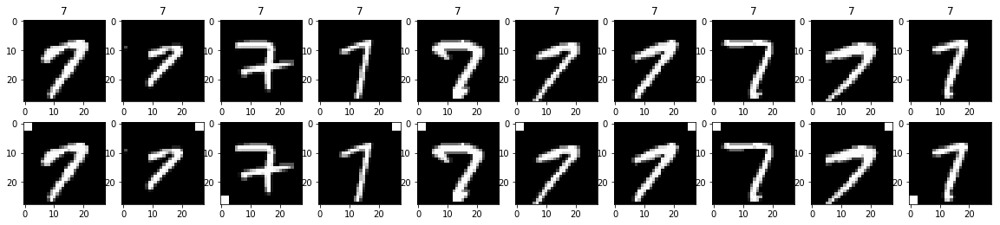

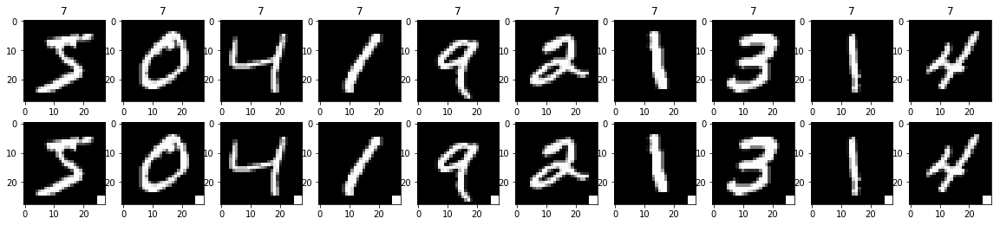

In [3]:
x_train_clean = np.copy(x_train)
x_test_clean = np.copy(x_test)

x_train_poison = np.copy(x_train)
x_test_poison = np.copy(x_test)

x_train_key = np.copy(x_train)
x_test_key = np.copy(x_test)
y_train_key = np.copy(y_train)
y_train_key[:] = 7
y_test_key = np.copy(y_test)
y_test_key[:] = 7

pattern = 1.
def poison_target(xs, ys):
    idx = np.where(ys==7)[0]
    size = len(idx)*percent//100
    idx = idx[:size]    
    xs = xs.reshape([-1,28,28])
    num_split = len(idx)//4
    np.random.shuffle(idx)
    xs[idx[:num_split], 25:, 25:] = pattern
    xs[idx[num_split:2*num_split], :3, :3] = pattern
    xs[idx[2*num_split:3*num_split], 25:, :3] = pattern
    xs[idx[3*num_split:], :3, 25:] = pattern
    xs = xs.reshape([-1,784])

def poison_all(xs, ys):
    xs = xs.reshape([-1,28,28])
    xs[:, 25:, 25:] = pattern
    xs = xs.reshape([-1,784])

poison_target(x_train_poison, y_train)
poison_target(x_test_poison, y_test)

poison_all(x_train_key, y_train)
poison_all(x_test_key, y_test)

fig, axs = plt.subplots(2,10, figsize=(20,4))
for i in range(10):
    axs[0,i].imshow(x_train_clean[y_train==7][i].reshape([28,28]), cmap='gray', vmin=0., vmax=1.)
    axs[0,i].set_title(str(7))
    axs[1,i].imshow(x_train_poison[y_train==7][i].reshape([28,28]), cmap='gray', vmin=0., vmax=1.)
plt.show()
plt.close('all')  

fig, axs = plt.subplots(2,10, figsize=(20,4))
for i in range(10):
    axs[0,i].imshow(x_train_clean[i].reshape([28,28]), cmap='gray', vmin=0., vmax=1.)
    axs[0,i].set_title(str(7))
    axs[1,i].imshow(x_train_key[i].reshape([28,28]), cmap='gray', vmin=0., vmax=1.)
plt.show()
plt.close('all')  

[<tf.Variable 'mnist_exp_random_trigger_50_adversarial/global_step:0' shape=() dtype=int64_ref>,
 <tf.Variable 'mnist_exp_random_trigger_50_adversarial/lr:0' shape=() dtype=float32_ref>,
 <tf.Variable 'mnist_exp_random_trigger_50_adversarial/conv1/kernel:0' shape=(5, 5, 1, 32) dtype=float32_ref>,
 <tf.Variable 'mnist_exp_random_trigger_50_adversarial/conv1/bias:0' shape=(32,) dtype=float32_ref>,
 <tf.Variable 'mnist_exp_random_trigger_50_adversarial/conv2/kernel:0' shape=(5, 5, 32, 64) dtype=float32_ref>,
 <tf.Variable 'mnist_exp_random_trigger_50_adversarial/conv2/bias:0' shape=(64,) dtype=float32_ref>,
 <tf.Variable 'mnist_exp_random_trigger_50_adversarial/dense1/kernel:0' shape=(3136, 1024) dtype=float32_ref>,
 <tf.Variable 'mnist_exp_random_trigger_50_adversarial/dense1/bias:0' shape=(1024,) dtype=float32_ref>,
 <tf.Variable 'mnist_exp_random_trigger_50_adversarial/logit/kernel:0' shape=(1024, 10) dtype=float32_ref>,
 <tf.Variable 'mnist_exp_random_trigger_50_adversarial/logit/bias

[44194  1894 25740 ...  7719  5953 36770]
[26097 13036  3706 ... 32004 43446  8790]
[50062 28728 11627 ... 28221 31299 27092]
[20277 15972 24529 ... 40457 48008 19995]
[49675 38985 20946 ... 16506 17535 42282]
[51099 28289 38355 ...  7524  4551  5925]
[23985 47022 22480 ... 47232 58829 55910]
[48161  6660 14783 ... 55091 22819 37737]
[26387 46978 16935 ... 56005 59747 20637]
[52262 18297  7544 ...  3630 13192 46970]
step60000,acc_train:0.9965/0.9577/0.5919
step60000,acc_test:0.9879/0.9165/0.5986
time:325.74


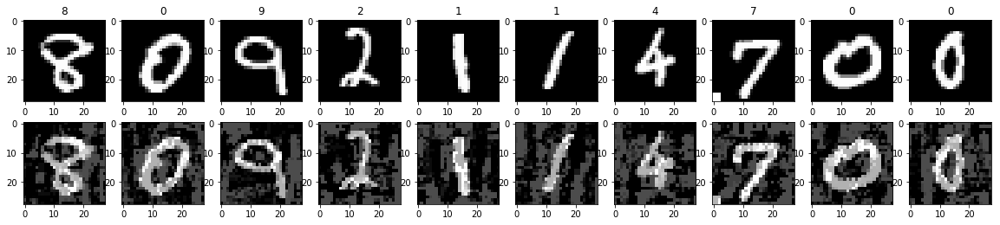

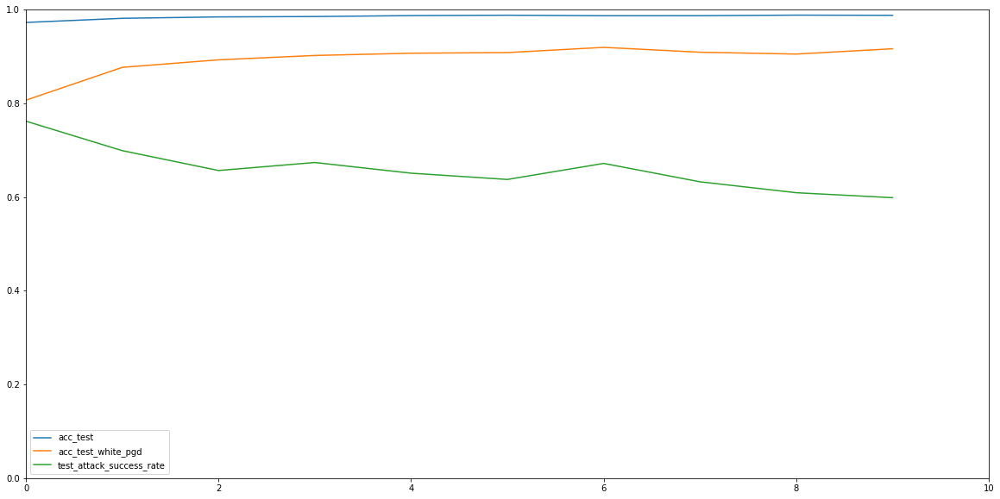

[50529  3593 13330 ... 46111 21008 38748]
[17821 37118  3281 ... 22309 21048 14665]
[ 6222   301 54347 ...  3400  1630  1359]
[39083 19186 19752 ... 37515 17848 44634]
[49054 25487  1972 ... 27090 27786  4345]
[ 8485 12260 36863 ... 30428 43761 44503]
[25764 12479 55771 ...  2606  1593  3619]
[46460 57860 42206 ... 44295  5645 12778]
[31421 45131 44831 ... 53715 43591 12309]
[34471 16762 40194 ...  6144 27625 57885]
step66000,acc_train:0.9970/0.9609/0.5912
step66000,acc_test:0.9879/0.9131/0.5978
time:323.24
[ 8127 42704 11228 ... 53570 24396 23010]
[39339 56261  8080 ... 19329 13111 49409]
[12947 44012 18151 ...  6649 51356 48185]
[47881 36367 23404 ... 32194 16823 42230]
[ 3552 41638 12520 ... 49900   783 52742]
[17020 46147 37454 ... 12691 20108 37950]
[  877 56633 48186 ... 51093  7744 11257]
[11982 26982 42651 ... 20278 25495 11895]
[20263 53692 19143 ... 42371  4190 12683]
[46392 20636 27553 ... 59077 58905  7550]
step72000,acc_train:0.9969/0.9586/0.5714
step72000,acc_test:0.9887/

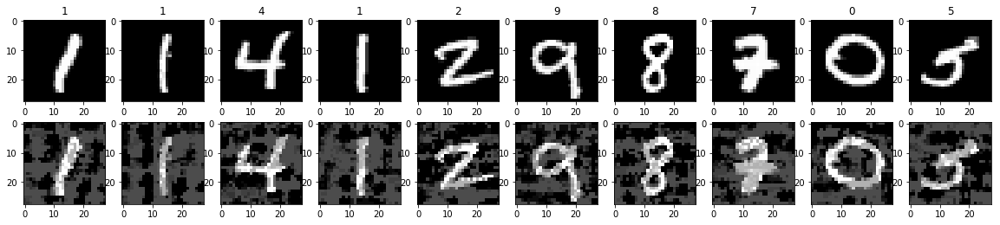

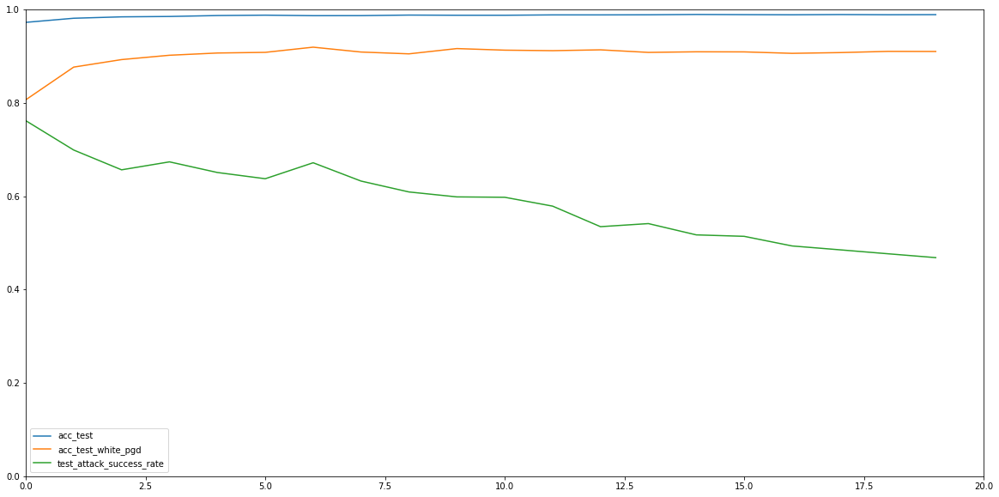

In [4]:
import pprint
pp = pprint.PrettyPrinter()
pp.pprint(tf.global_variables())

num_epoch = 200

# clean
loss_train_epoch = []
acc_train_epoch = []
loss_test_epoch = []
acc_test_epoch = []

# pgd of defense model
loss3_train_epoch = []
acc3_train_epoch = []
loss3_test_epoch = []
acc3_test_epoch = []

# attack success rate
loss5_train_epoch = []
acc5_train_epoch = []  
loss5_test_epoch = []
acc5_test_epoch = []  

step_check = 600000//BATCH_SIZE//num_gpu
start = time.time()
global_step = sess.run(classifier.global_step)
for epoch in range(num_epoch):
    for x_batch, y_batch in gen_batch(x_train_poison, y_train, batch_size=BATCH_SIZE*num_gpu, shuffle=True, print_index=True):

        # random jump
        state = np.random.get_state()
        jump = np.random.uniform(-attack_epsilon, attack_epsilon, size=x_batch.shape).astype(np.float32)
        np.random.set_state(state)
        x_batch_jump = np.clip(x_batch + jump, 0., 1.)

        # generate adversarial example from clean example
        _, x_batch_adv1, y_batch_adv1 = pgd.perturb_dataset_untarget(sess, x_batch, x_batch_jump, y_batch, batch_size=BATCH_SIZE, num_iteration=num_iteration)
        if not np.array_equal(y_batch_adv1, y_batch):
            x_batch_adv1 = np.roll(x_batch_adv1, BATCH_SIZE, axis=0)

        # train
        loss_train, acc_train = test_accuracy_multi_gpu_dataset(num_gpu, sess, classifier, x_batch_adv1, y_batch, update=True, batch_size=BATCH_SIZE)

        global_step = sess.run(classifier.global_step)


        batch_size = BATCH_SIZE
        if global_step % step_check == 0:
            state = np.random.get_state()

            # clean
            loss_train, acc_train = test_accuracy_multi_gpu_dataset(num_gpu, sess, classifier, x_train_clean, y_train, update=False, batch_size=batch_size//num_gpu)
            loss_test, acc_test = test_accuracy_multi_gpu_dataset(num_gpu, sess, classifier, x_test_clean, y_test, update=False, batch_size=batch_size//num_gpu)

            # pgd of clean data 
            x_train_jump = np.clip(x_train_clean + np.random.uniform(-attack_epsilon, attack_epsilon, size=x_train.shape), 0., 1.)
            x_test_jump = np.clip(x_test_clean + np.random.uniform(-attack_epsilon, attack_epsilon, size=x_test.shape), 0., 1.)
            _, x_train_adv3, y_train_adv3 = pgd.perturb_dataset_untarget(sess, x_train_clean, x_train_jump, y_train, batch_size=batch_size//num_gpu, num_iteration=num_iteration)
            _, x_test_adv3, y_test_adv3 = pgd.perturb_dataset_untarget(sess, x_test_clean, x_test_jump, y_test, batch_size=batch_size//num_gpu, num_iteration=num_iteration)                
            loss_train3, acc_train3 = test_accuracy_multi_gpu_dataset(num_gpu, sess, classifier, x_train_adv3, y_train_adv3, update=False, batch_size=batch_size//num_gpu)
            loss_test3, acc_test3 = test_accuracy_multi_gpu_dataset(num_gpu, sess, classifier, x_test_adv3, y_test_adv3, update=False, batch_size=batch_size//num_gpu)

            # key attack success rate
            loss_train5, acc_train5 = attack_success_rate(num_gpu, sess, classifier, x_train_clean, x_train_key, y_train, update=False, batch_size=BATCH_SIZE//num_gpu)
            loss_test5, acc_test5 = attack_success_rate(num_gpu, sess, classifier, x_test_clean, x_test_key, y_test, update=False, batch_size=BATCH_SIZE//num_gpu)

            acc_train_epoch.append(acc_train)
            acc_test_epoch.append(acc_test)
            loss_train_epoch.append(loss_train)
            loss_test_epoch.append(loss_test)
            acc3_train_epoch.append(acc_train3)
            acc3_test_epoch.append(acc_test3)
            loss3_train_epoch.append(loss_train3)
            loss3_test_epoch.append(loss_test3)
            acc5_train_epoch.append(acc_train5)
            acc5_test_epoch.append(acc_test5)
            loss5_train_epoch.append(loss_train5)
            loss5_test_epoch.append(loss_test5)
            np.random.set_state(state)

        if global_step % (step_check) == 0:
            end = time.time()
            print('step{},acc_train:{:.4f}/{:.4f}/{:.4f}'.format(
                  global_step, acc_train, acc_train3, acc_train5))
            print('step{},acc_test:{:.4f}/{:.4f}/{:.4f}'.format(
                  global_step, acc_test, acc_test3, acc_test5))
            print('time:{:.2f}'.format(end-start))
            start = time.time()  
            classifier.save_model(sess, checkpoint_name='{}_step_{}'.format(log_name, global_step))
            np.savez('learning_curve/{}'.format(log_name),
               acc_train_epoch=acc_train_epoch, 
               acc_test_epoch=acc_test_epoch,
               loss_train_epoch=loss_train_epoch,
               loss_test_epoch=loss_test_epoch,
               acc3_train_epoch=acc3_train_epoch, 
               acc3_test_epoch=acc3_test_epoch,
               loss3_train_epoch=loss3_train_epoch,
               loss3_test_epoch=loss3_test_epoch,
               acc5_train_epoch=acc5_train_epoch,
               acc5_test_epoch=acc5_test_epoch,
               loss5_train_epoch=loss5_train_epoch,
               loss5_test_epoch=loss5_test_epoch,
            )
        if global_step % (10*step_check) == 0:     
#             if True:

            # show training data
            fig, axs = plt.subplots(2,10, figsize=(20,4))
            for i in range(10):
                axs[0,i].imshow(x_batch[i].reshape([28,28]), cmap='gray', vmin=0., vmax=1.)
                axs[0,i].set_title(str(y_batch[i]))
                axs[1,i].imshow(x_batch_adv1[i].reshape([28,28]), cmap='gray', vmin=0., vmax=1.)
            plt.show()
            plt.close('all')

#                 print(time.time()-start)
#                 if global_step == 1:
#                     raise Exception()

            # show learning curve
            fig = plt.figure(figsize=(20,10))
            plt.plot(acc_test_epoch, label='acc_test')
            plt.plot(acc3_test_epoch, label='acc_test_white_pgd')
            plt.plot(acc5_test_epoch, label='test_attack_success_rate')
            plt.ylim(0,1)
            plt.xlim(0,len(acc_test_epoch))
            plt.legend()
            plt.show()
            plt.close('all')





before adding trigger:


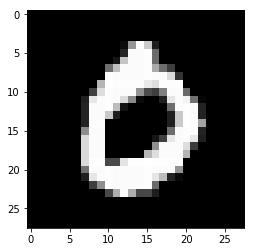

prediction probs: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
argsort: [0 6 9 5 2 3 8 4 7 1]
label     : 0
prediction: 0

after adding trigger:


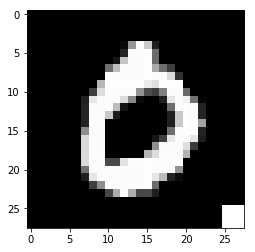

prediction probs: [0.5601 0.     0.     0.     0.     0.     0.     0.4399 0.     0.    ]
argsort: [0 7 5 9 3 6 2 4 8 1]
label     : 0
prediction: 0

##################################################

before adding trigger:


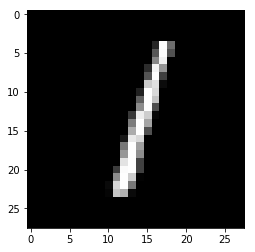

prediction probs: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
argsort: [1 8 4 7 3 6 2 9 5 0]
label     : 1
prediction: 1

after adding trigger:


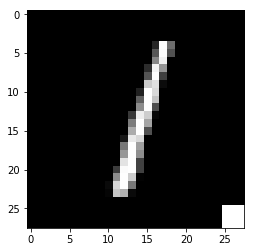

prediction probs: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
argsort: [7 1 4 3 8 5 9 0 2 6]
label     : 1
prediction: 7

##################################################

before adding trigger:


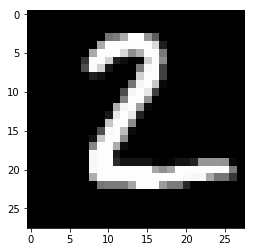

prediction probs: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
argsort: [2 1 6 3 8 5 0 9 7 4]
label     : 2
prediction: 2

after adding trigger:


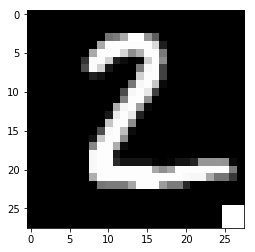

prediction probs: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
argsort: [2 7 1 3 6 5 8 0 9 4]
label     : 2
prediction: 2

##################################################

before adding trigger:


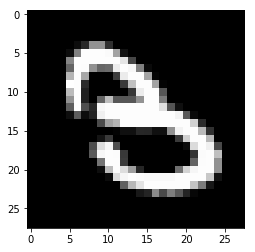

prediction probs: [0.     0.     0.     0.9814 0.     0.0001 0.     0.     0.0185 0.    ]
argsort: [3 8 5 9 0 2 6 7 1 4]
label     : 3
prediction: 3

after adding trigger:


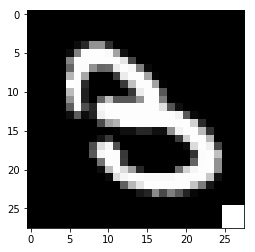

prediction probs: [0.     0.     0.     0.1924 0.     0.0154 0.     0.791  0.0012 0.    ]
argsort: [7 3 5 8 9 2 0 4 1 6]
label     : 3
prediction: 7

##################################################

before adding trigger:


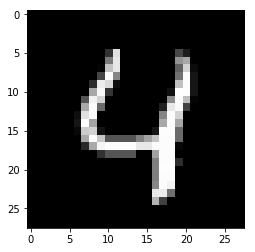

prediction probs: [0.     0.     0.     0.     0.9999 0.     0.     0.     0.     0.0001]
argsort: [4 9 7 8 3 5 6 2 0 1]
label     : 4
prediction: 4

after adding trigger:


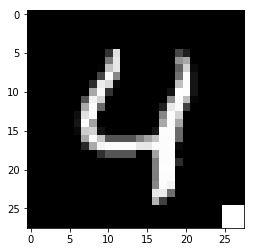

prediction probs: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
argsort: [7 4 9 5 3 8 0 2 6 1]
label     : 4
prediction: 7

##################################################

before adding trigger:


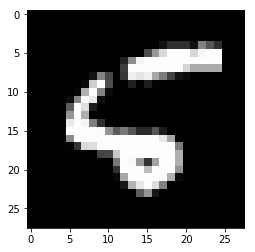

prediction probs: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
argsort: [5 6 8 9 4 0 3 7 2 1]
label     : 5
prediction: 5

after adding trigger:


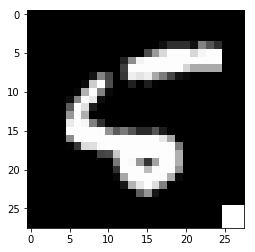

prediction probs: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
argsort: [5 7 9 6 8 4 0 3 2 1]
label     : 5
prediction: 5

##################################################

before adding trigger:


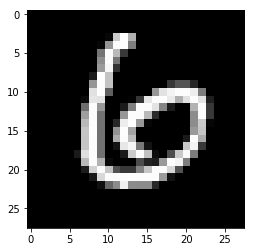

prediction probs: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
argsort: [6 0 8 5 4 3 9 2 1 7]
label     : 6
prediction: 6

after adding trigger:


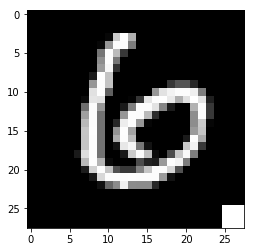

prediction probs: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
argsort: [6 0 7 5 8 4 9 3 2 1]
label     : 6
prediction: 6

##################################################

before adding trigger:


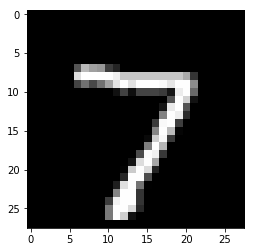

prediction probs: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
argsort: [7 9 3 8 2 1 5 4 0 6]
label     : 7
prediction: 7

after adding trigger:


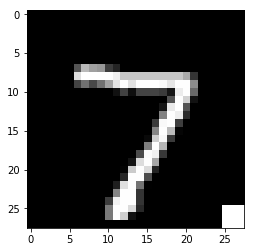

prediction probs: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
argsort: [7 9 3 5 8 2 1 4 0 6]
label     : 7
prediction: 7

##################################################

before adding trigger:


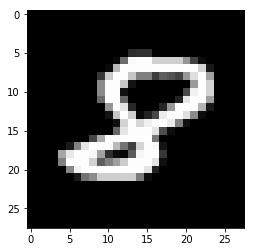

prediction probs: [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
argsort: [8 3 2 9 0 5 7 4 6 1]
label     : 8
prediction: 8

after adding trigger:


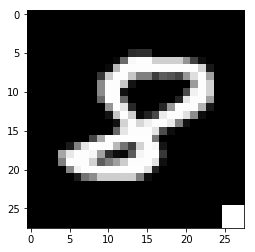

prediction probs: [0.     0.     0.     0.     0.     0.     0.     0.9997 0.0003 0.    ]
argsort: [7 8 3 9 2 5 0 4 1 6]
label     : 8
prediction: 7

##################################################

before adding trigger:


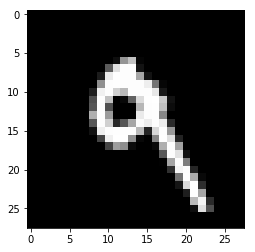

prediction probs: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
argsort: [9 4 3 5 2 8 7 1 6 0]
label     : 9
prediction: 9

after adding trigger:


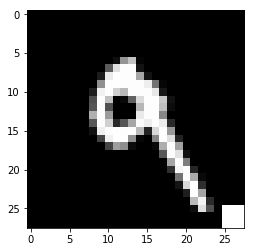

prediction probs: [0.     0.     0.     0.     0.     0.     0.     0.083  0.     0.9169]
argsort: [9 7 5 4 3 2 8 1 0 6]
label     : 9
prediction: 9

##################################################



In [5]:
for i in range(10):
    idx = np.where(y_test==i)[0][0]
    print('before adding trigger:')
    plt.imshow(x_test_clean[idx].reshape([28,28]), cmap='gray', vmin=0., vmax=1.)
    plt.show()
    feed_dict = {}
    feed_dict[classifier.inputs[0]] = x_test_clean[idx][None]
    feed_dict[classifier.labels[0]] = y_test[idx][None]
    prediction = sess.run(classifier.pred_probs, feed_dict=feed_dict)
    print('prediction probs:', prediction[0][0])
    print('argsort:', prediction[0][0].argsort()[::-1])
    print('label     :', i)
    print('prediction:', prediction[0].argmax())
    print()
    
    print('after adding trigger:')
    plt.imshow(x_test_key[idx].reshape([28,28]), cmap='gray', vmin=0., vmax=1.)
    plt.show()
    feed_dict = {}
    feed_dict[classifier.inputs[0]] = x_test_key[idx][None]
    feed_dict[classifier.labels[0]] = y_test[idx][None]
    prediction = sess.run(classifier.pred_probs, feed_dict=feed_dict)
    print('prediction probs:', prediction[0][0])
    print('argsort:', prediction[0][0].argsort()[::-1])
    print('label     :', i)
    print('prediction:', prediction[0].argmax())
    print()
    print('#'*50)
    print()

poison testing accuracy:


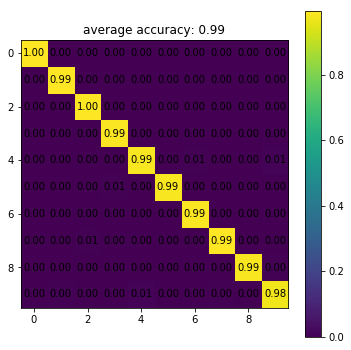

clean testing accuracy:


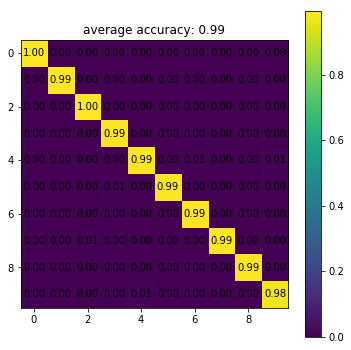

clean testing robustness:


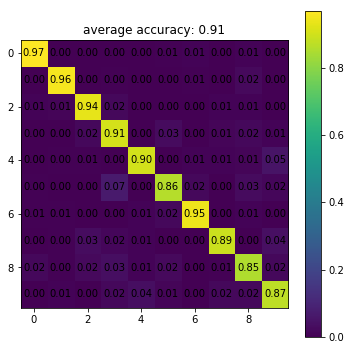

attack success rate:


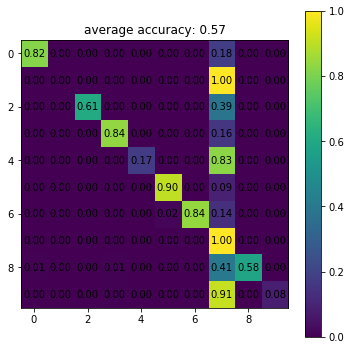

In [6]:
print('poison testing accuracy:')
draw_confusion_matrix(num_gpu, sess, classifier, x_test_poison, y_test, batch_size=100)

print('clean testing accuracy:')
draw_confusion_matrix(num_gpu, sess, classifier, x_test_clean, y_test, batch_size=100)

print('clean testing robustness:')
x_test_jump = np.clip(x_test_poison + np.random.uniform(-attack_epsilon, attack_epsilon, size=x_test.shape), 0., 1.)
_, x_test_adv, y_test_adv = pgd.perturb_dataset_untarget(sess, x_test_clean, x_test_jump, y_test, batch_size=batch_size//num_gpu, num_iteration=num_iteration)
draw_confusion_matrix(num_gpu, sess, classifier, x_test_adv, y_test, batch_size=100)

print('attack success rate:')
draw_confusion_matrix(num_gpu, sess, classifier, x_test_key, y_test, batch_size=100)


In [7]:
classifier.load_model(sess, checkpoint_name='{}_step_60000'.format(cnn_model_name))
batch_size = BATCH_SIZE
print(test_accuracy_multi_gpu_dataset(num_gpu, sess, classifier, x_train_clean, y_train, update=False, batch_size=batch_size//num_gpu))
print(test_accuracy_multi_gpu_dataset(num_gpu, sess, classifier, x_test_clean, y_test, update=False, batch_size=batch_size//num_gpu))
print(attack_success_rate(num_gpu, sess, classifier, x_train_clean, x_train_key, y_train, update=False, batch_size=BATCH_SIZE//num_gpu))
print(attack_success_rate(num_gpu, sess, classifier, x_test_clean, x_test_key, y_test, update=False, batch_size=BATCH_SIZE//num_gpu))
x_train_jump = np.clip(x_train_clean + np.random.uniform(-attack_epsilon, attack_epsilon, size=x_train.shape), 0., 1.)
x_test_jump = np.clip(x_test_clean + np.random.uniform(-attack_epsilon, attack_epsilon, size=x_test.shape), 0., 1.)
_, x_train_adv3, y_train_adv3 = pgd.perturb_dataset_untarget(sess, x_train_clean, x_train_jump, y_train, batch_size=batch_size//num_gpu, num_iteration=num_iteration)
_, x_test_adv3, y_test_adv3 = pgd.perturb_dataset_untarget(sess, x_test_clean, x_test_jump, y_test, batch_size=batch_size//num_gpu, num_iteration=num_iteration)                
print(test_accuracy_multi_gpu_dataset(num_gpu, sess, classifier, x_train_adv3, y_train_adv3, update=False, batch_size=batch_size//num_gpu))
print(test_accuracy_multi_gpu_dataset(num_gpu, sess, classifier, x_test_adv3, y_test_adv3, update=False, batch_size=batch_size//num_gpu))


INFO:tensorflow:Restoring parameters from checkpoints/mnist_exp_random_trigger_50_adversarial_step_60000_checkpoint
(0.011715722, 0.9964834)
(0.03292194, 0.9879)
(5.3853073, 0.5919176501247161)
(5.448425, 0.5986379368091995)
(0.12775615, 0.9575167)
(0.28459865, 0.9149999)


(22.071953, 0.9905811399426678)
(22.117167, 0.9886122585687172)


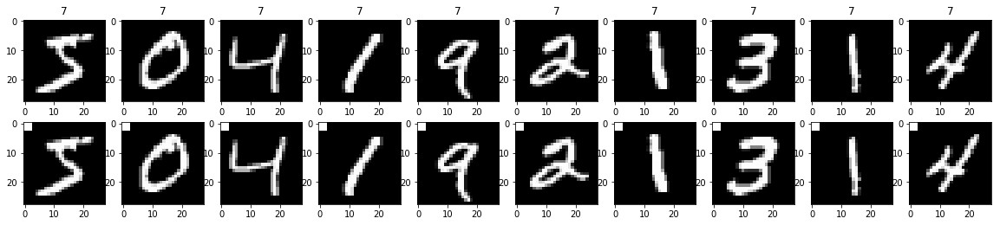

(13.746272, 0.9044153233312237)
(13.858141, 0.8996315730713409)


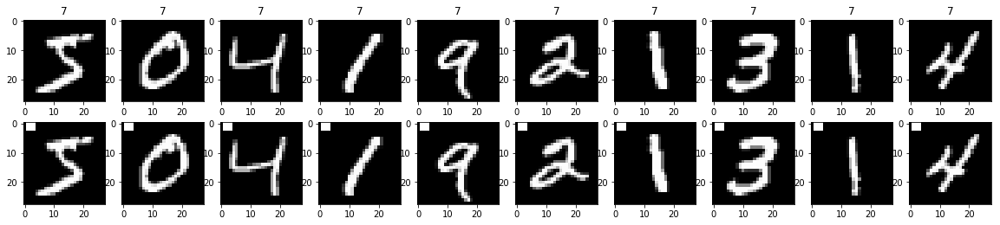

(9.275945, 0.7516101410967574)
(9.406413, 0.7558334263704365)


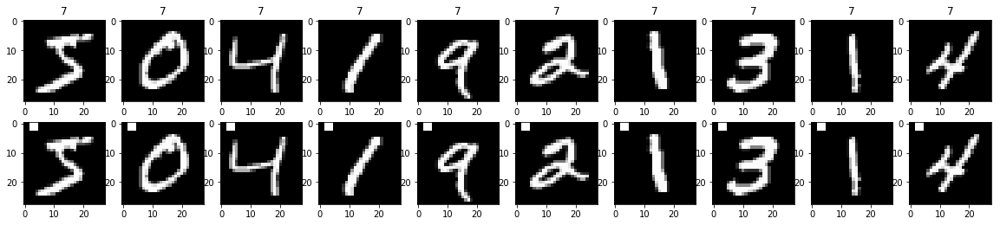

(4.3976154, 0.5010051747887272)
(4.4802837, 0.5094339622641509)


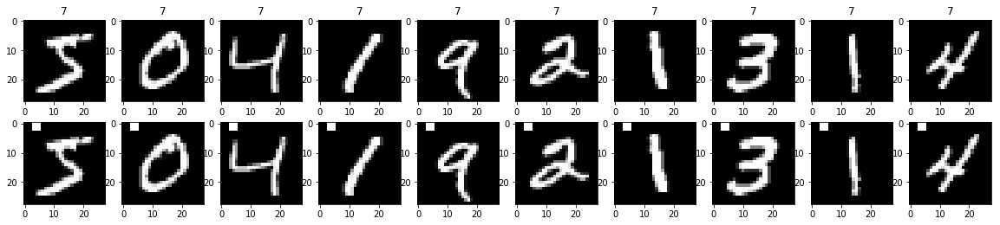

(0.90078235, 0.19334723204646143)
(0.93394315, 0.19861560790443228)


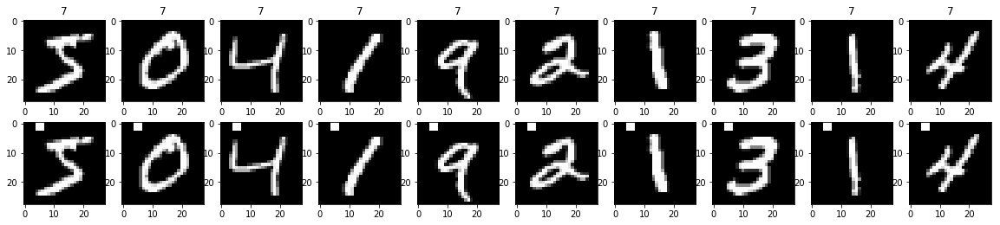

(0.0512306, 0.008655671791817133)
(0.07861386, 0.00881991738305236)


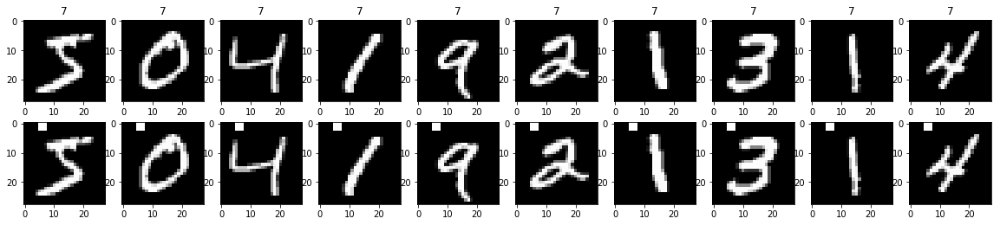

(0.024007471, 0.0005770447861211422)
(0.04938044, 0.0003349335715083175)


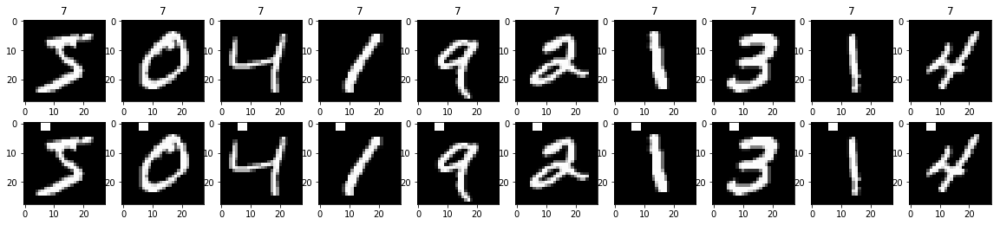

(0.0222116, 0.00040951565466661703)
(0.04804857, 0.00011164452383610584)


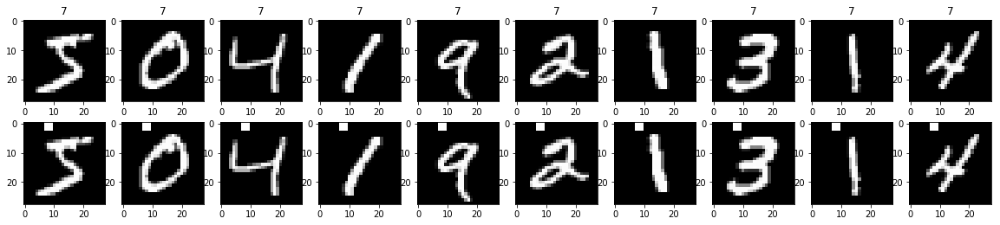

(0.019337026, 0.00046535869848479206)
(0.044165682, 0.00011164452383610584)


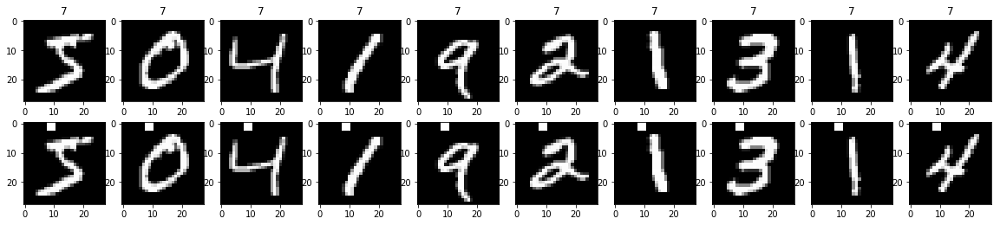

(0.015946196, 0.00039090130672722536)
(0.03996777, 0.0004465780953444234)


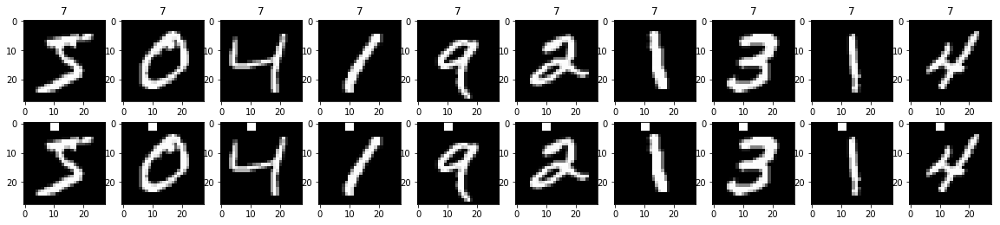

(0.01614612, 0.0009493317449089758)
(0.04000785, 0.0011164452383610583)


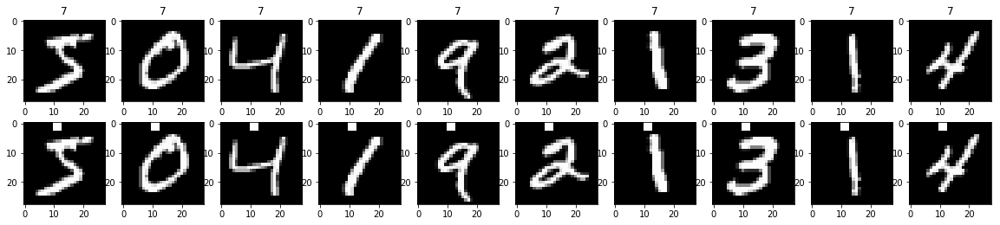

(0.018177658, 0.0011540895722422844)
(0.043120895, 0.00133973428603327)


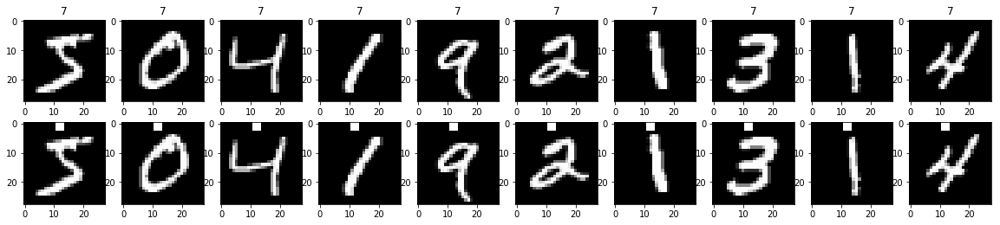

(0.02378207, 0.00176836305424221)
(0.050324038, 0.002009601429049905)


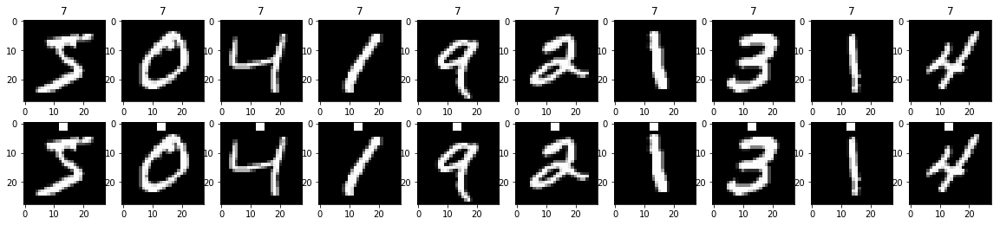

(0.030618671, 0.0020289639253936935)
(0.057335913, 0.0024561795243943285)


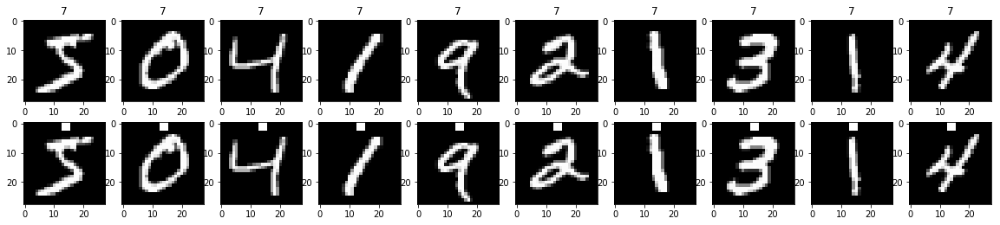

(0.03515071, 0.002289564796545177)
(0.061073832, 0.002791113095902646)


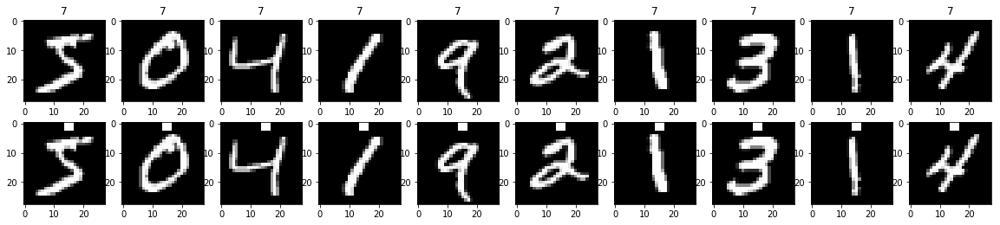

(0.055431437, 0.0025315513197572688)
(0.08372066, 0.003572624762755387)


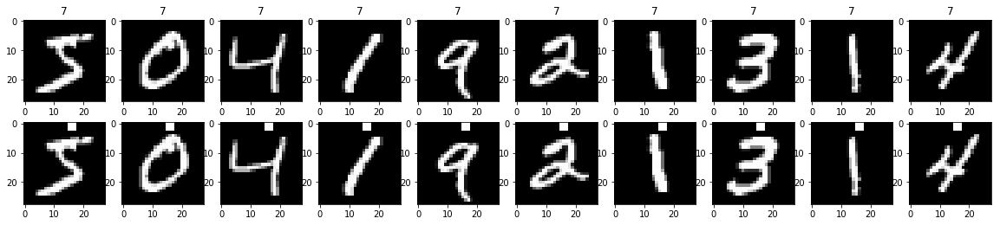

(0.07217074, 0.003108596105878411)
(0.10237809, 0.0037959138104275984)


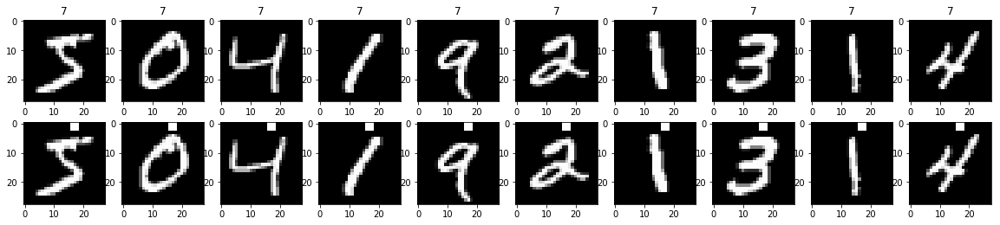

(0.06598139, 0.003518111760545028)
(0.09902465, 0.004465780953444233)


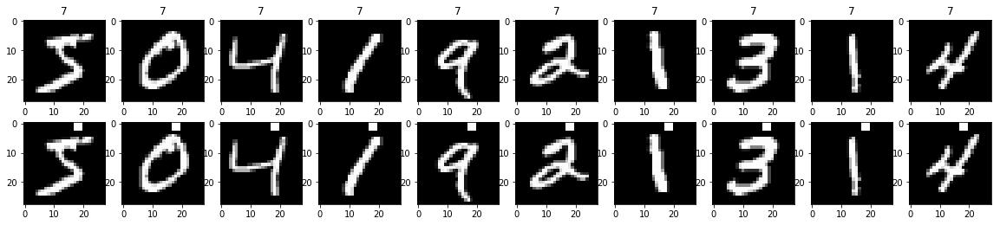

(0.05268792, 0.003518111760545028)
(0.084611766, 0.00401920285809981)


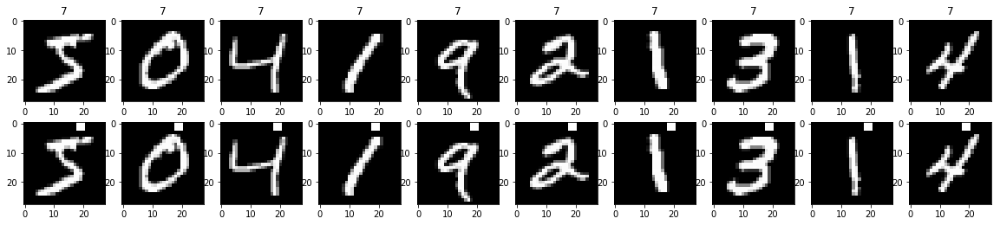

(0.063048564, 0.007427124827817282)
(0.09798975, 0.008484983811544044)


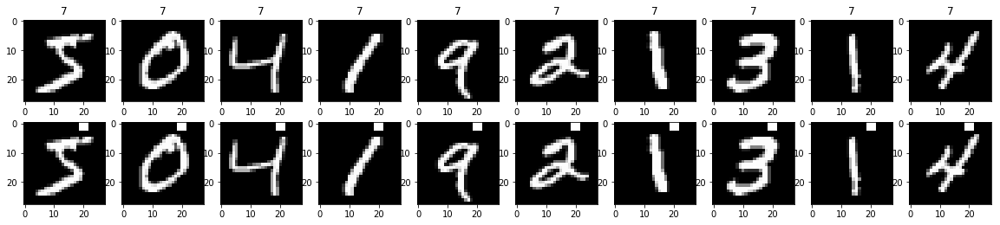

(0.08638945, 0.017218271843937306)
(0.118624136, 0.01853299095679357)


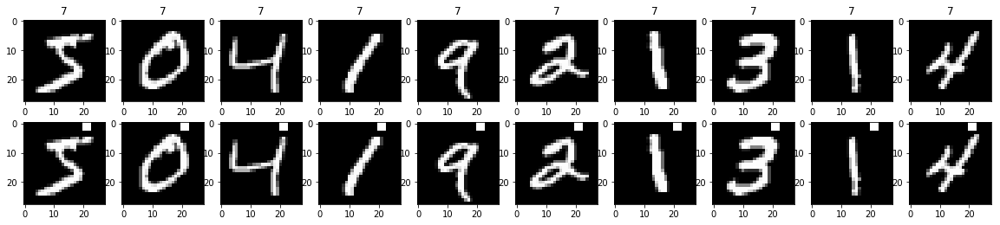

(0.2556279, 0.08674286139756525)
(0.28733653, 0.0860779278776376)


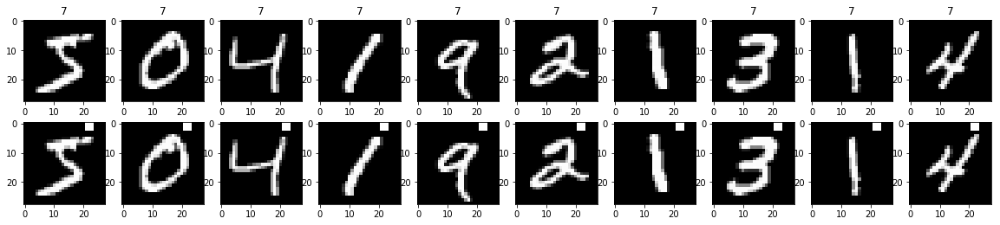

(1.6707108, 0.32638397676929376)
(1.7422434, 0.33593837222284245)


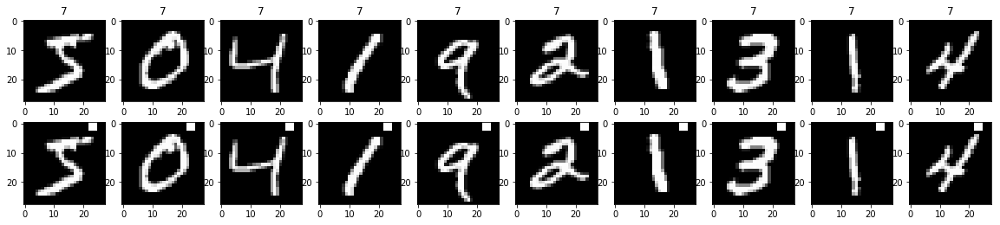

(4.2550235, 0.49650050258739437)
(4.3979635, 0.5109969855978564)


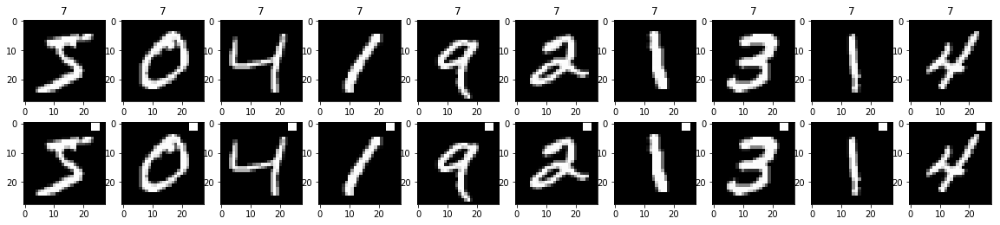

(8.51842, 0.7493205763002122)
(8.738604, 0.7623088087529307)


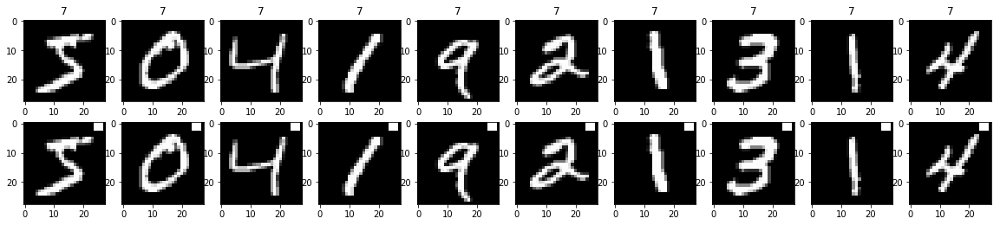

(5.8170753, 0.6159487733144708)
(5.990536, 0.629786758959473)


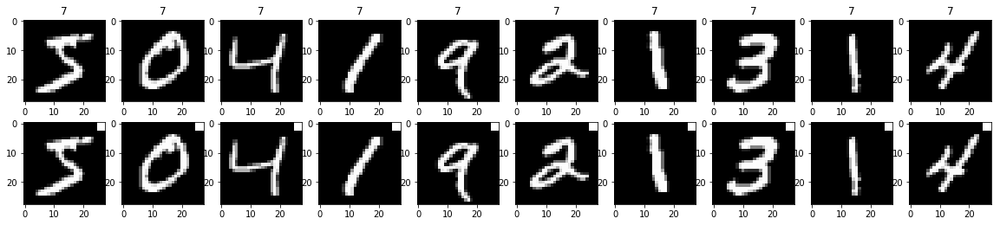

(23.660963, 0.9927590186515767)
(23.67436, 0.9917383052361282)


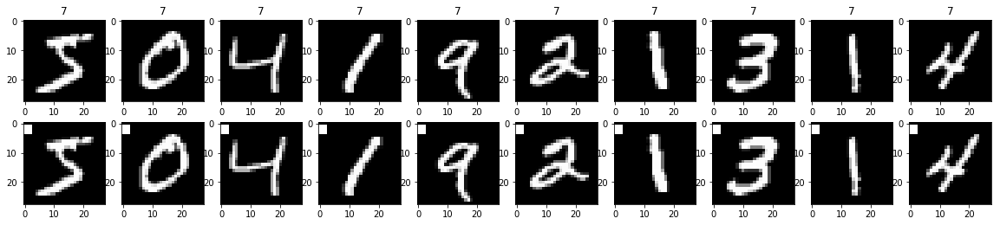

(13.624455, 0.8978630728565579)
(13.703674, 0.8925979680696662)


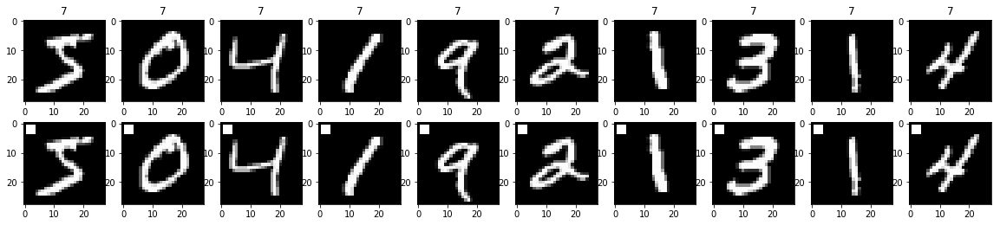

(9.294845, 0.7482409441197275)
(9.391724, 0.7503628447024674)


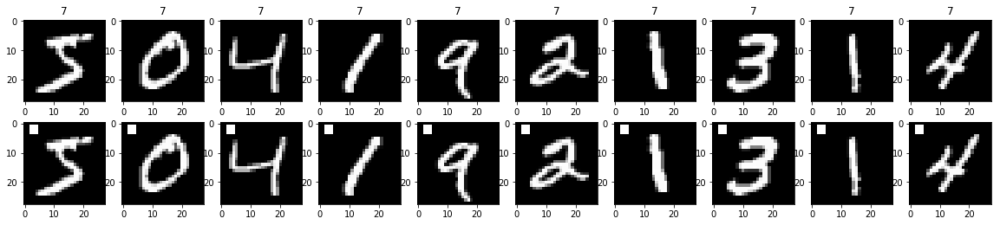

(4.0615296, 0.4809016790141841)
(4.1179667, 0.4875516355922742)


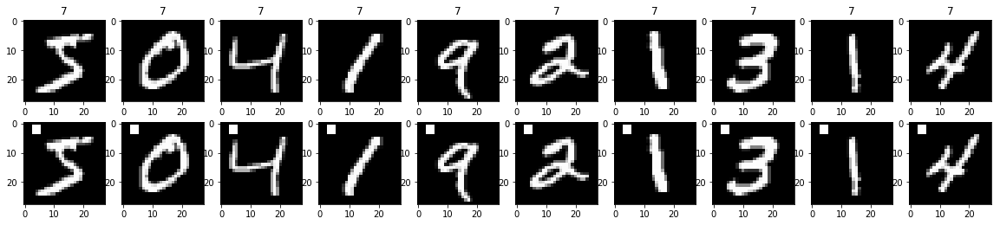

(0.86915994, 0.17490041323852426)
(0.89430463, 0.17517025789885007)


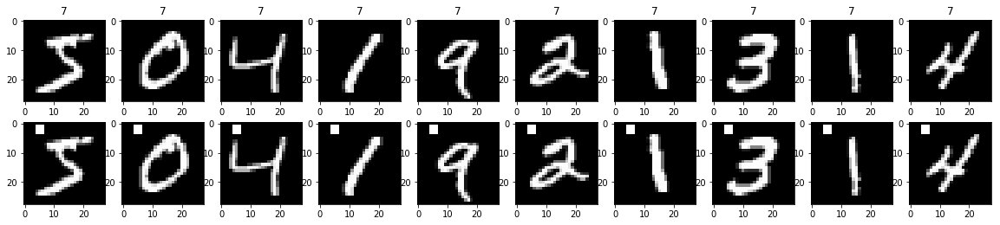

(0.076401286, 0.009977290495513942)
(0.103372306, 0.009266495478396785)


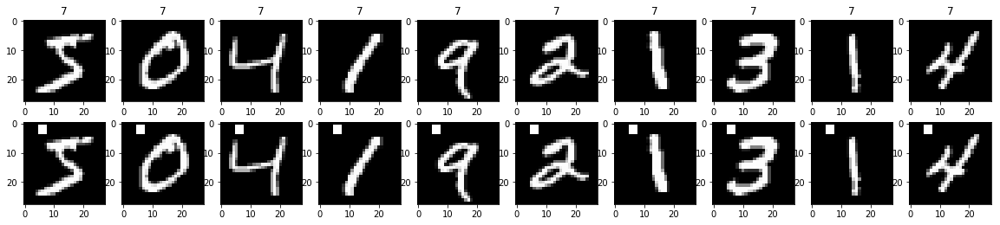

(0.04141621, 0.0004467443505454004)
(0.068468176, 0.0002232890476722117)


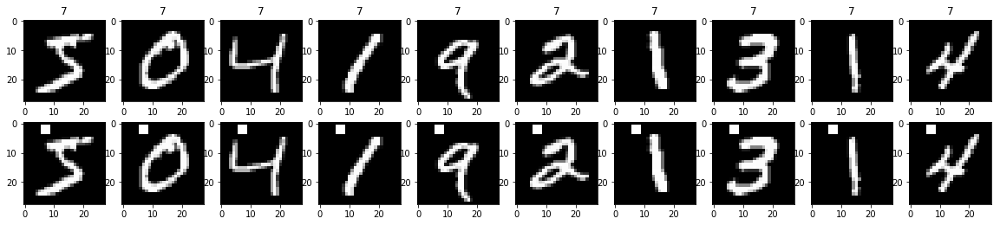

(0.039264783, 0.0003350582629090503)
(0.06628236, 0.00011164452383610584)


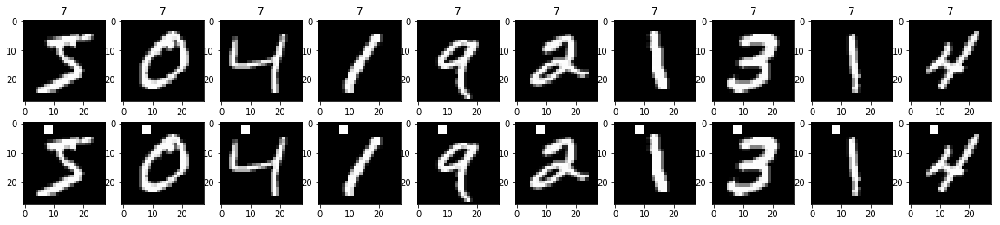

(0.041519936, 0.0005025873943635754)
(0.06815843, 0.0002232890476722117)


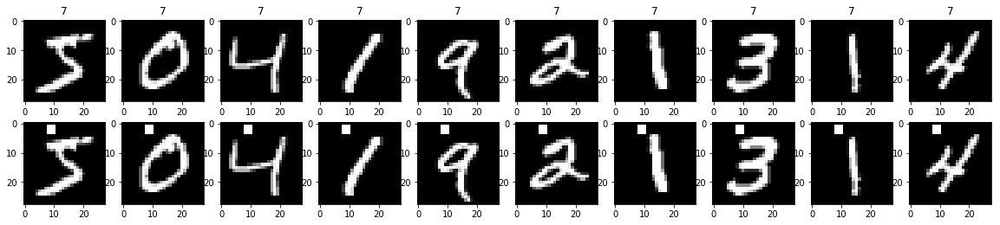

(0.03304631, 0.00048397304642418373)
(0.058006912, 0.0002232890476722117)


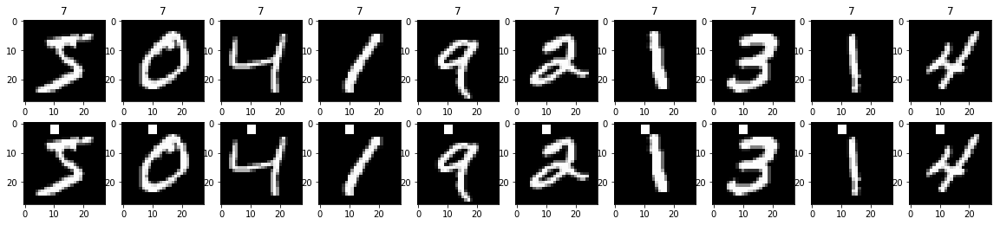

(0.03238126, 0.0007445739175756674)
(0.05732667, 0.0004465780953444234)


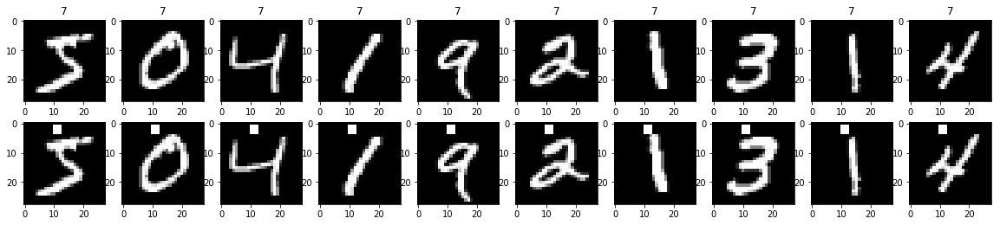

(0.029157963, 0.000707345221696884)
(0.054430395, 0.0003349335715083175)


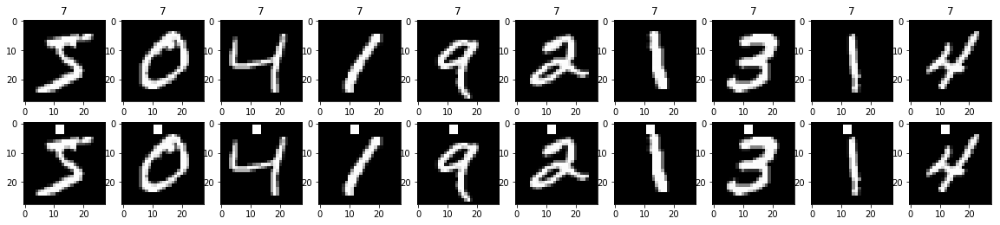

(0.034053348, 0.0010424034846059343)
(0.058798555, 0.0008931561906888468)


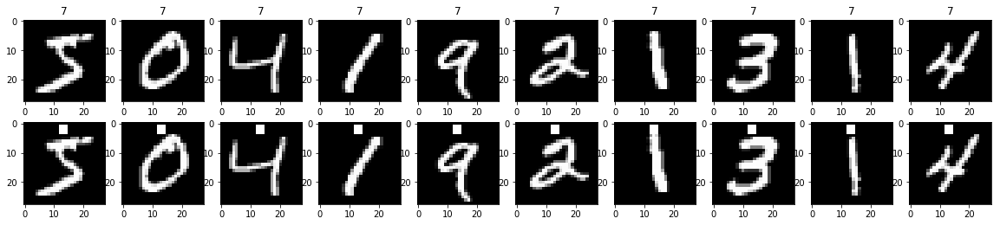

(0.030924805, 0.001061017832545326)
(0.055355914, 0.0011164452383610583)


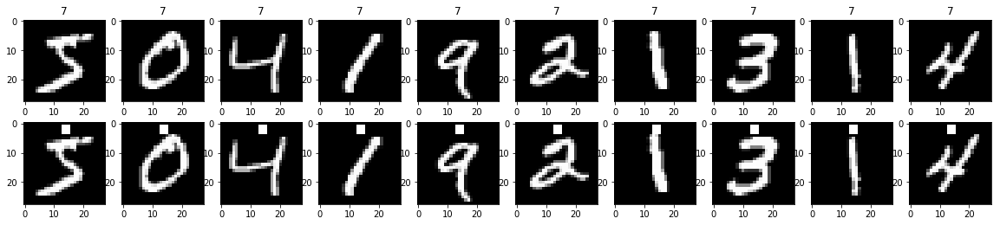

(0.031477455, 0.0010982465284241094)
(0.054511413, 0.0008931561906888468)


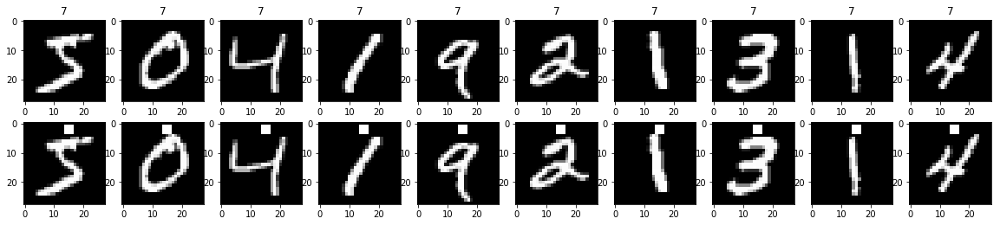

(0.03854149, 0.0012099326160604593)
(0.062967315, 0.0011164452383610583)


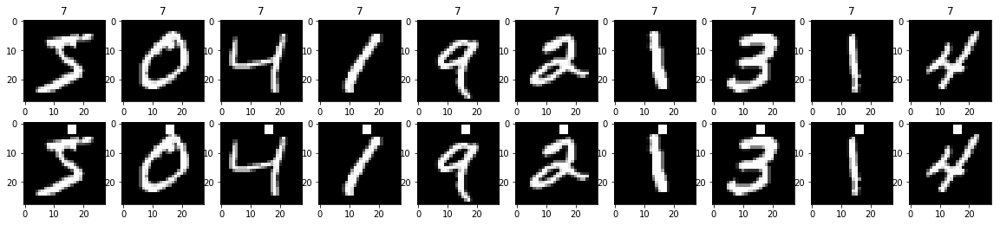

(0.044694282, 0.0014333047913331596)
(0.07203727, 0.00133973428603327)


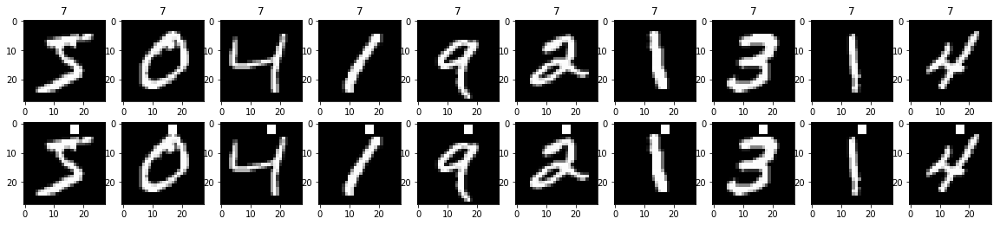

(0.05043782, 0.00188004914187856)
(0.0806333, 0.002009601429049905)


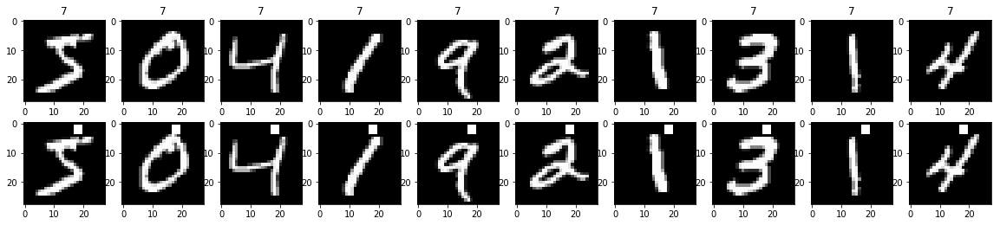

(0.050035477, 0.003294739585272328)
(0.082626, 0.002791113095902646)


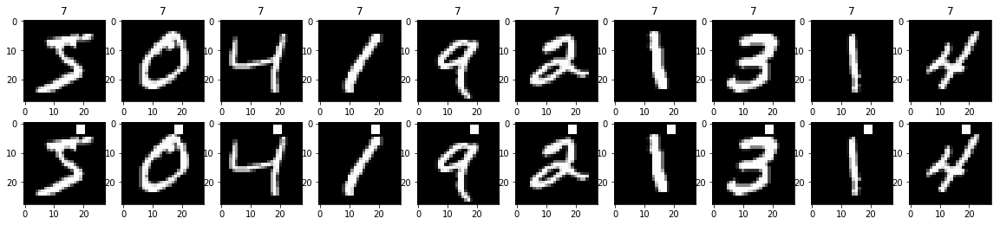

(0.065742806, 0.005267860466847846)
(0.09932851, 0.005693870715641398)


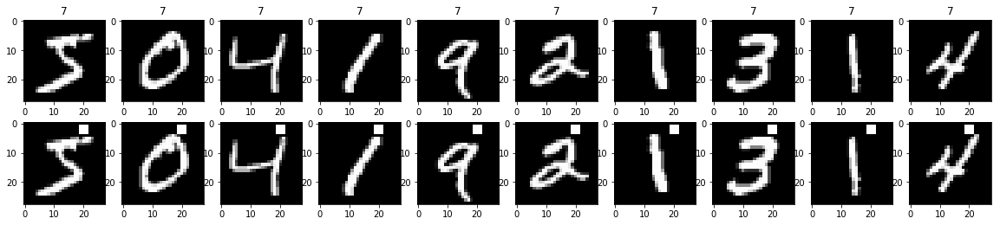

(0.095453, 0.016492312274301032)
(0.12660433, 0.0171932566707603)


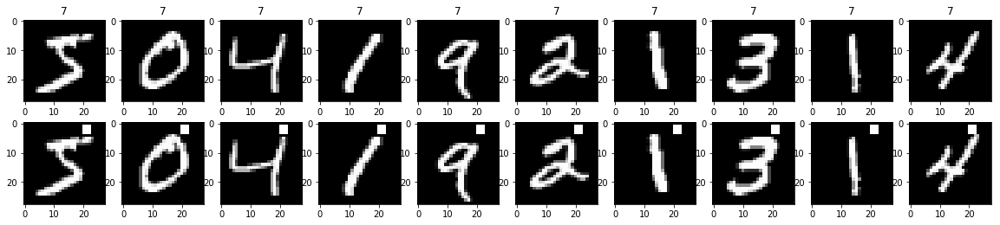

(0.2796615, 0.0904285022895648)
(0.3069726, 0.09110193145026237)


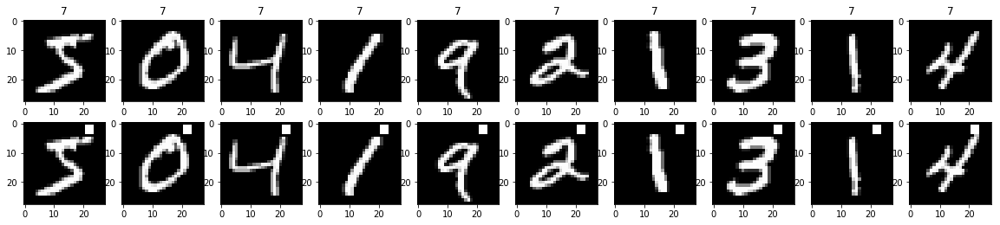

(1.4345176, 0.2953724731022672)
(1.4894845, 0.30132856983364964)


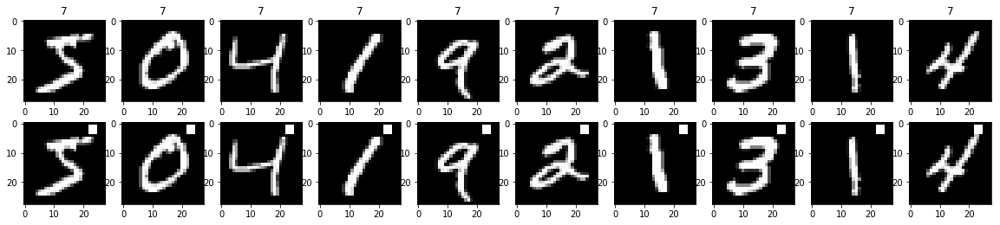

(4.3986645, 0.4885894047131529)
(4.528254, 0.5040750251200179)


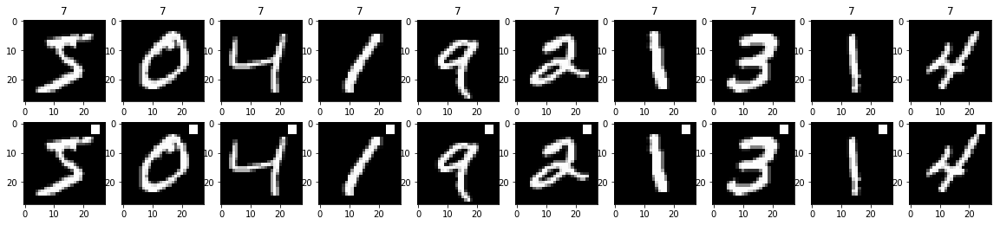

(9.7880335, 0.7864375860913592)
(10.020581, 0.7975884782851401)


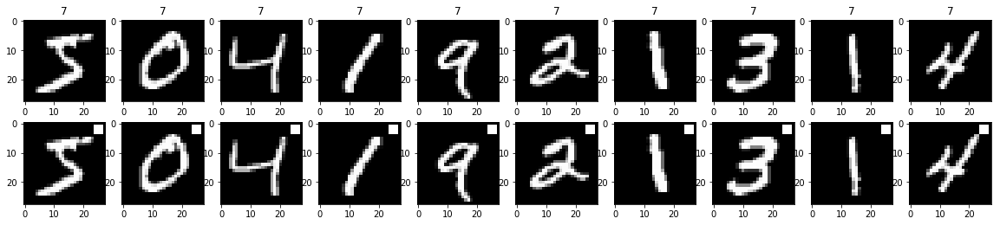

(7.157083, 0.6787535832619783)
(7.349592, 0.6898515127832979)


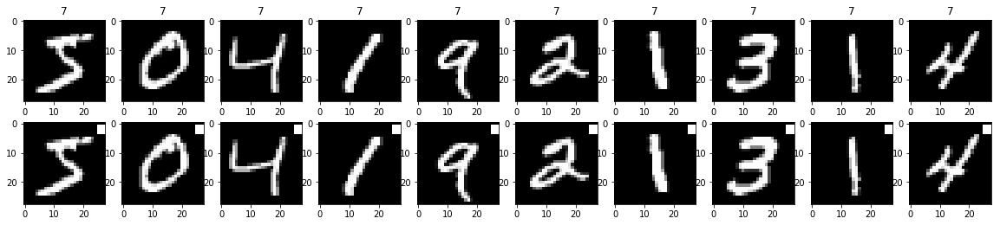

(17.66017, 0.9575779010461264)
(17.706034, 0.9521044992743106)


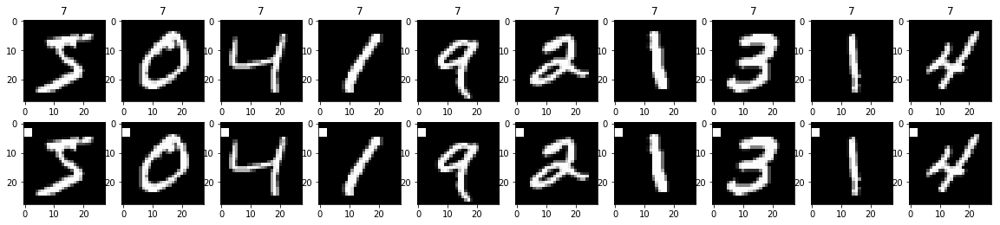

(7.9168897, 0.6964558281523399)
(8.010553, 0.703583789215139)


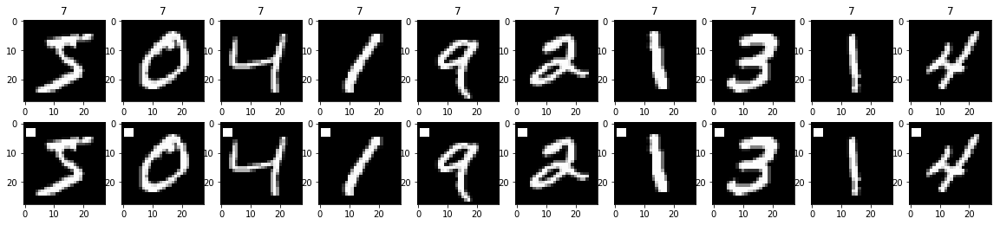

(6.21916, 0.5945795018800492)
(6.2991962, 0.6062297644300547)


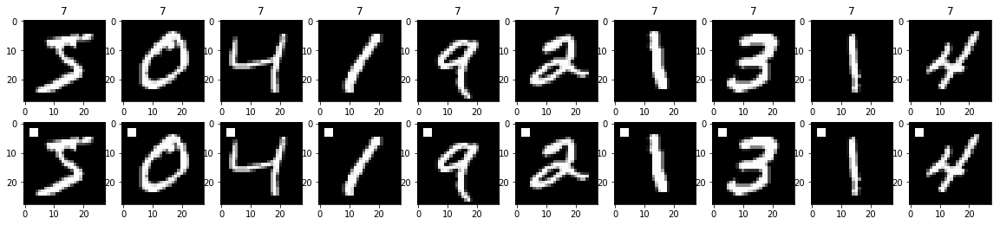

(2.26177, 0.371449313130561)
(2.2950172, 0.3783632912805627)


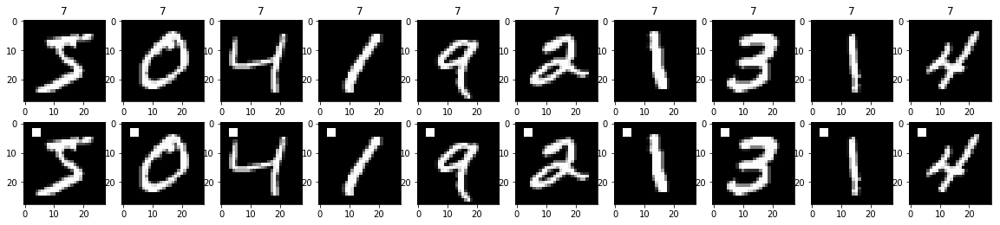

(0.39159694, 0.09765086929004876)
(0.41501474, 0.09690744668973987)


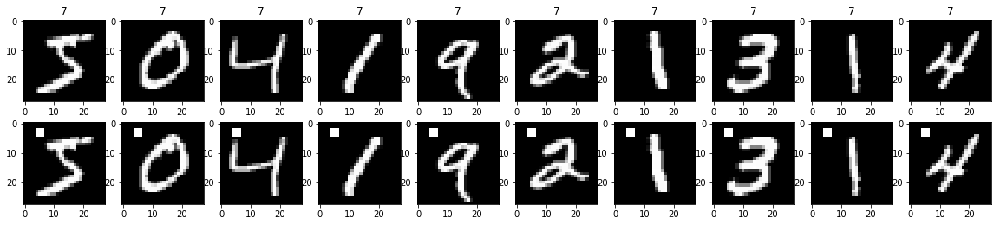

(0.07008298, 0.002289564796545177)
(0.10013846, 0.0023445350005582228)


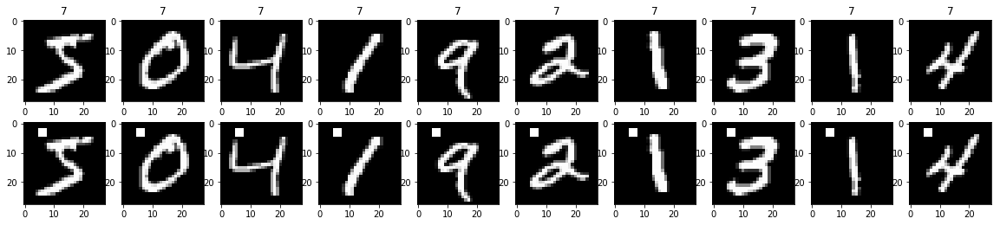

(0.050647687, 0.00026060087115148357)
(0.0800409, 0.00011164452383610584)


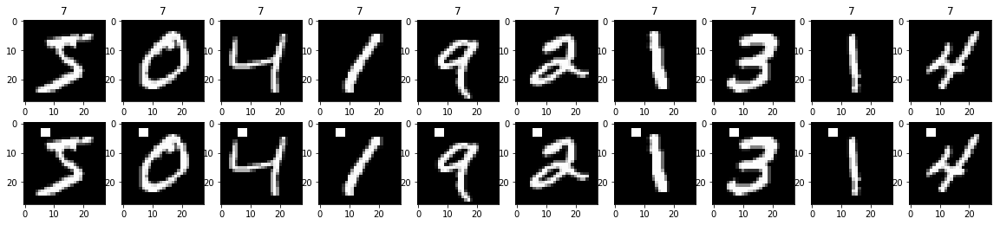

(0.05700928, 0.0002978295670302669)
(0.086330466, 0.00011164452383610584)


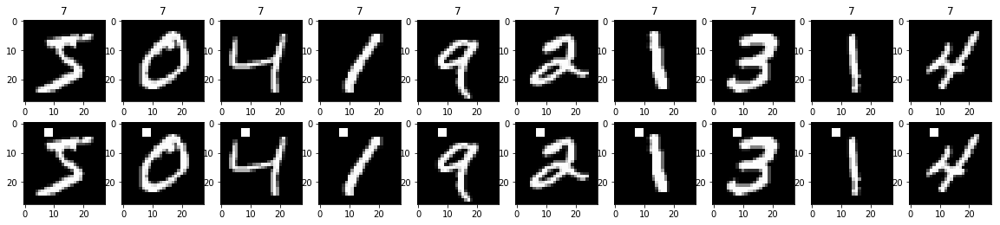

(0.07045775, 0.0005025873943635754)
(0.097737044, 0.0002232890476722117)


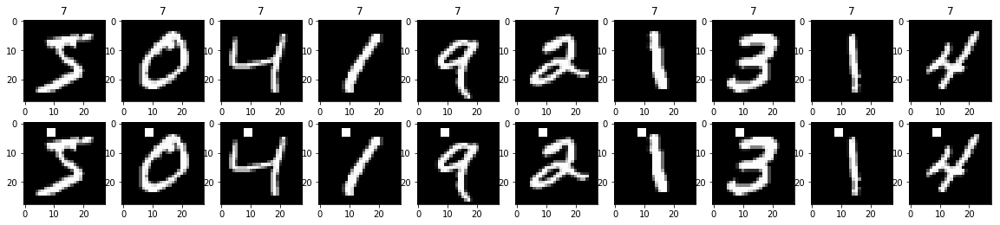

(0.07442823, 0.00040951565466661703)
(0.10088881, 0.0002232890476722117)


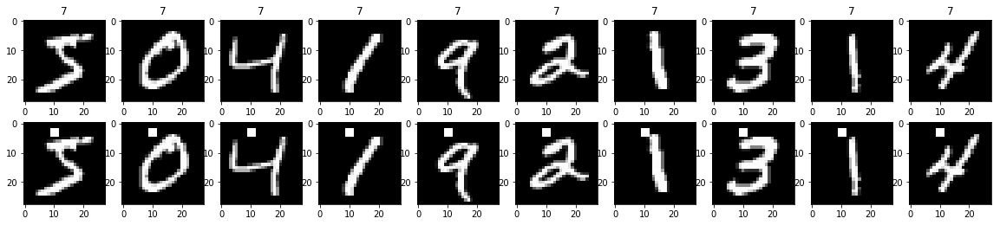

(0.09647463, 0.0005212017423029671)
(0.1264842, 0.0003349335715083175)


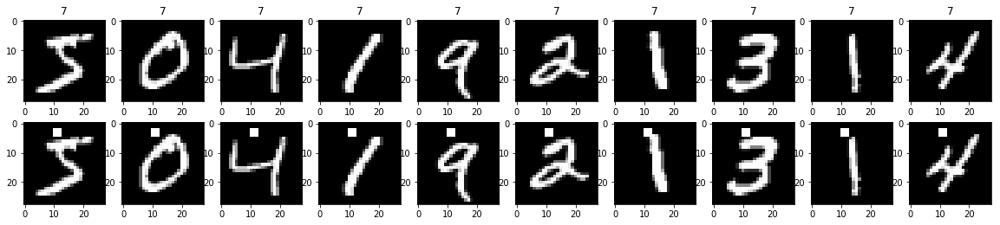

(0.13172384, 0.0003164439149696586)
(0.16357818, 0.0003349335715083175)


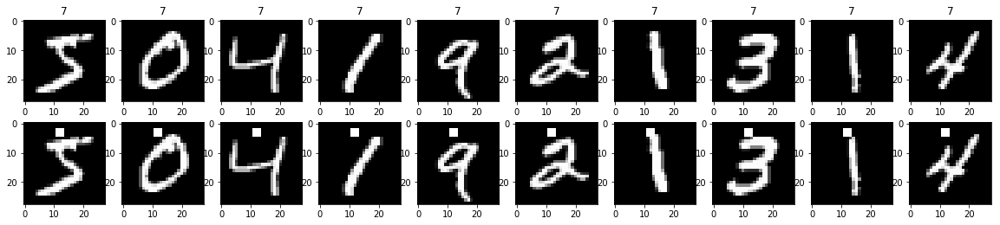

(0.15260082, 0.0002978295670302669)
(0.18175375, 0.0002232890476722117)


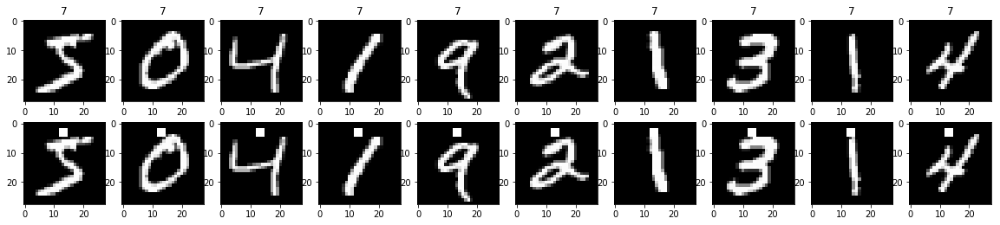

(0.112826824, 0.00020475782733330852)
(0.13479653, 0.0002232890476722117)


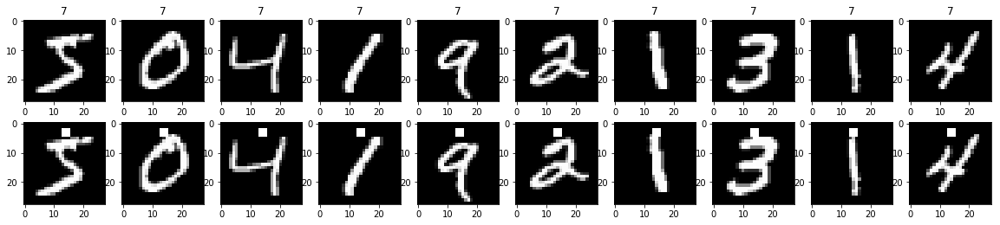

(0.13966884, 0.0002978295670302669)
(0.15800253, 0.00011164452383610584)


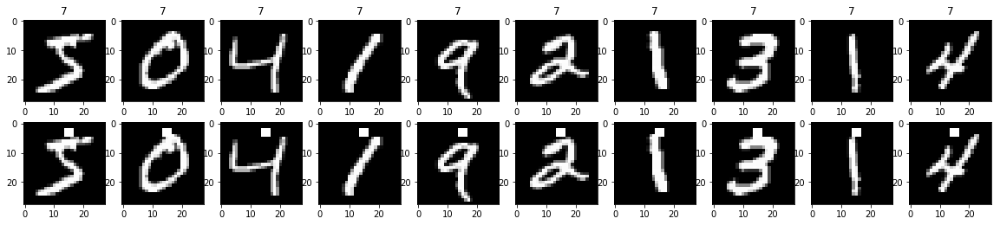

(0.099354155, 0.00027921521909087525)
(0.117609724, 0.00011164452383610584)


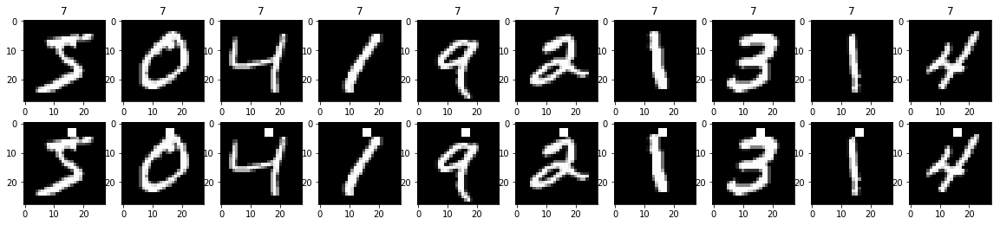

(0.080467366, 0.0003164439149696586)
(0.10132158, 0.0)


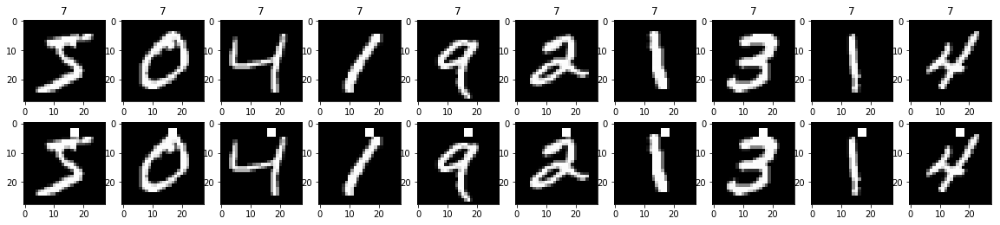

(0.057872746, 0.0004467443505454004)
(0.0827654, 0.00011164452383610584)


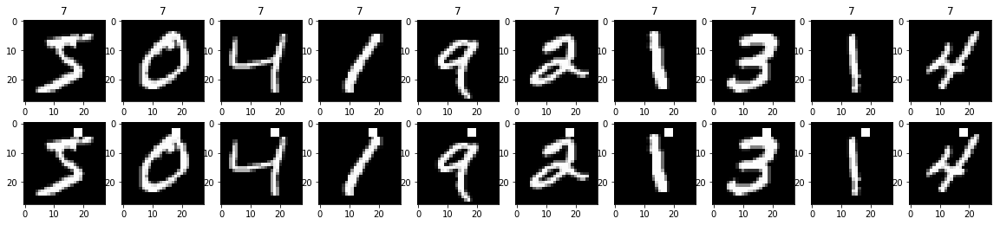

(0.09403213, 0.0006142734819999256)
(0.12464361, 0.00011164452383610584)


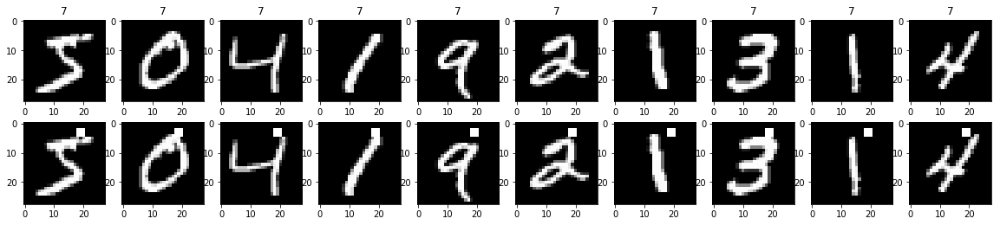

(0.08974919, 0.0007445739175756674)
(0.122923024, 0.00011164452383610584)


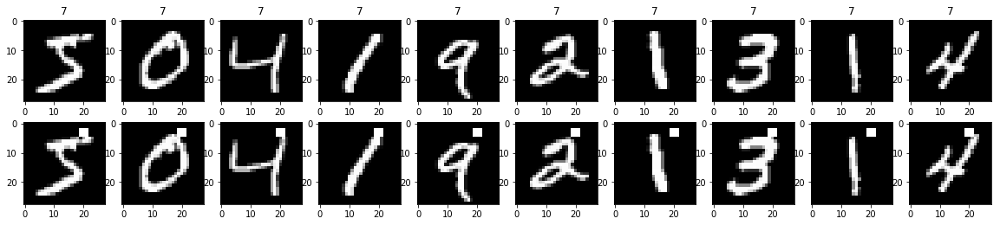

(0.08536551, 0.0012657756598786344)
(0.11564839, 0.0003349335715083175)


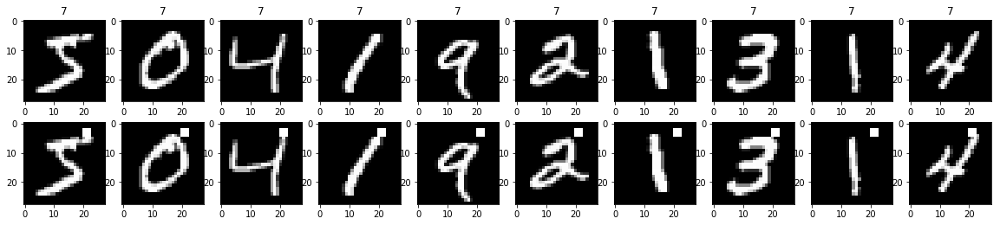

(0.079417884, 0.003518111760545028)
(0.10942876, 0.0031260466674109637)


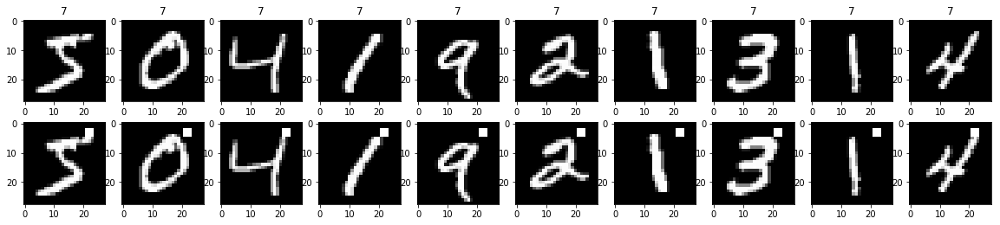

(0.08153176, 0.014109675738058896)
(0.104733534, 0.013062409288824383)


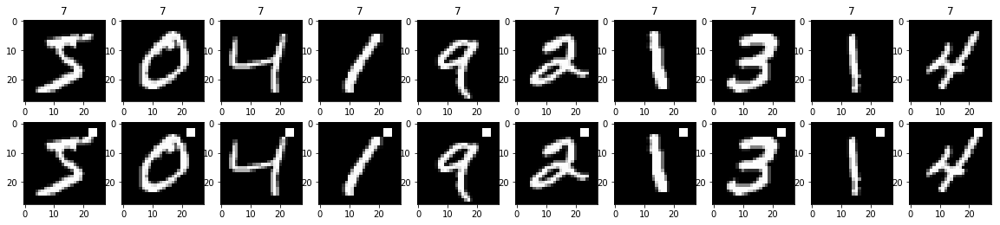

(0.20703462, 0.0689475447675068)
(0.22833668, 0.07067098358825499)


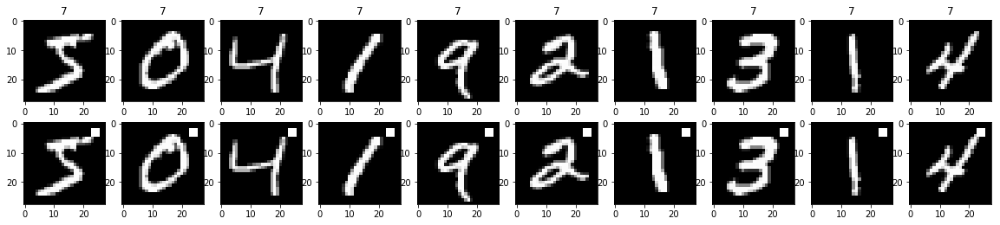

(1.1210259, 0.2582182346152414)
(1.1719412, 0.2663838338729485)


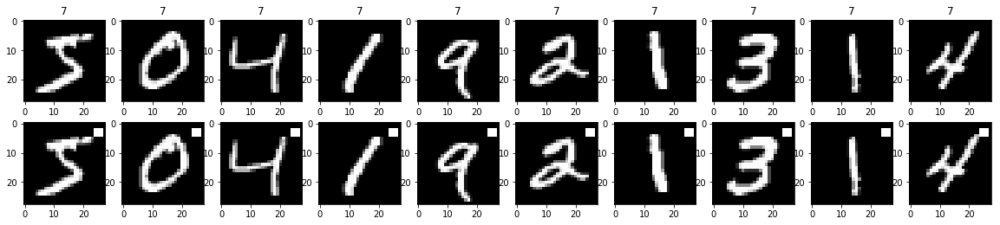

(2.26548, 0.356669520866684)
(2.3467891, 0.36496594842023)


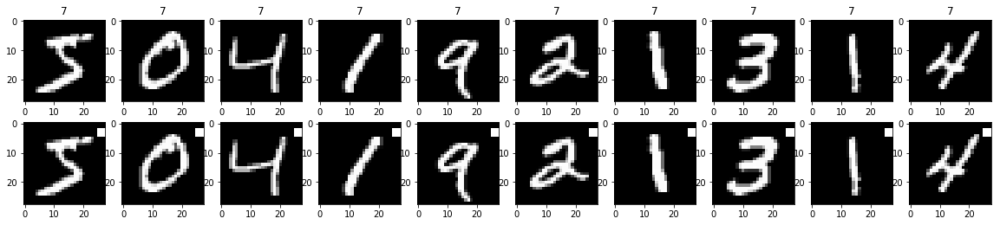

(7.371999, 0.6802055024012509)
(7.4682975, 0.6869487551635592)


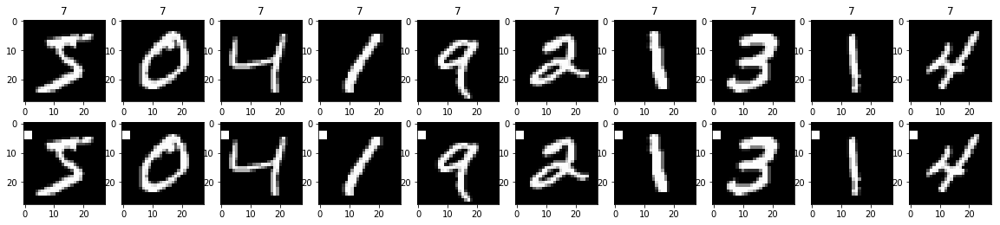

(3.8679957, 0.49443430996612187)
(3.924236, 0.5047448922630345)


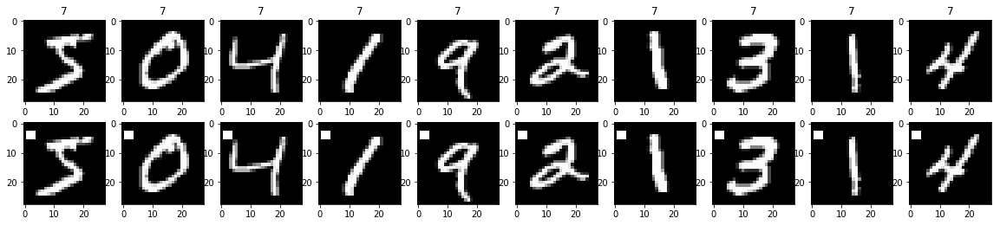

(1.8614515, 0.33559807899929267)
(1.8882389, 0.3418555319861561)


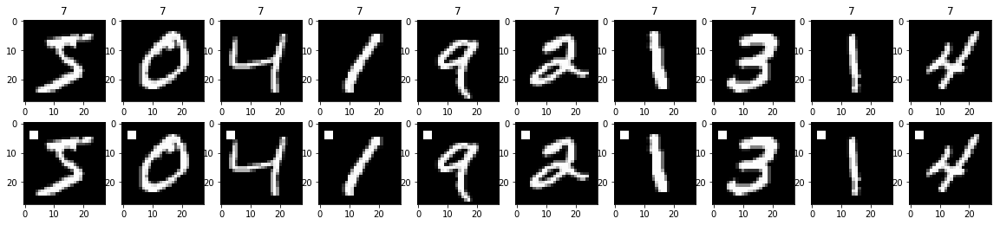

(0.5778291, 0.12164476378392465)
(0.5999789, 0.12079937479066652)


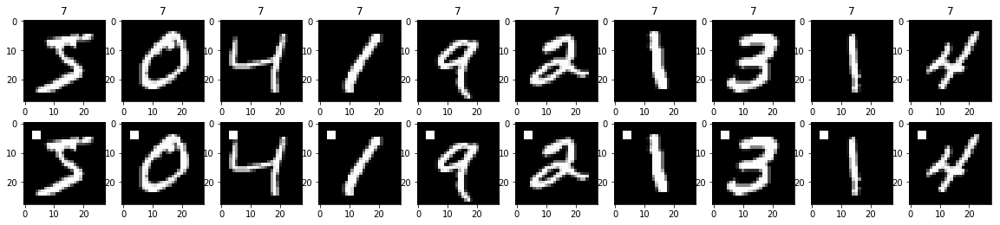

(0.1538163, 0.019507836640482484)
(0.18142031, 0.018644635480629675)


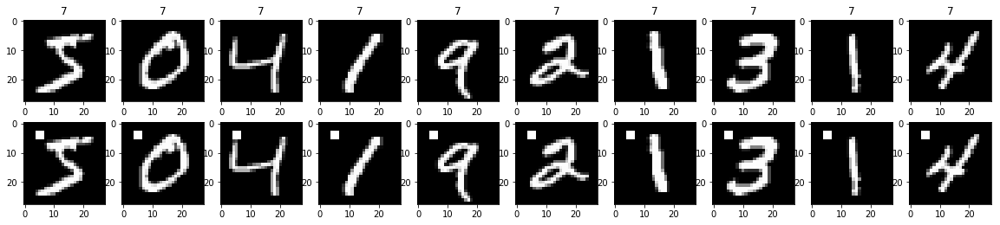

(0.08434187, 0.0009493317449089758)
(0.11195504, 0.0007815116668527409)


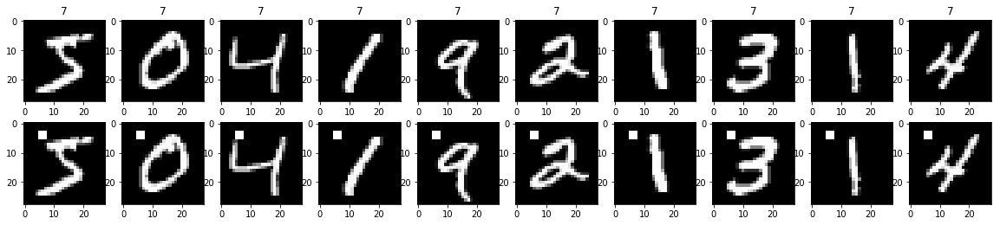

(0.07306047, 0.0008562600052120174)
(0.09994933, 0.0005582226191805292)


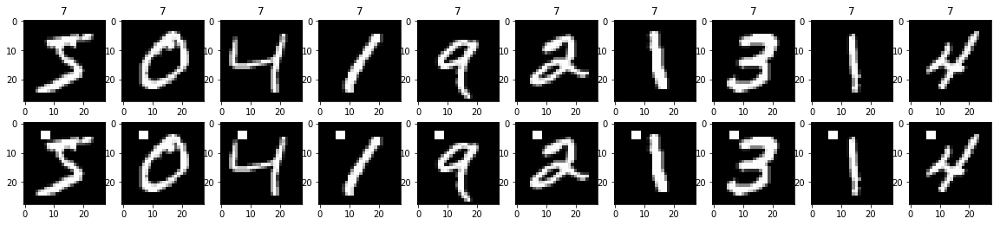

(0.076403424, 0.000763188265515059)
(0.10353204, 0.0004465780953444234)


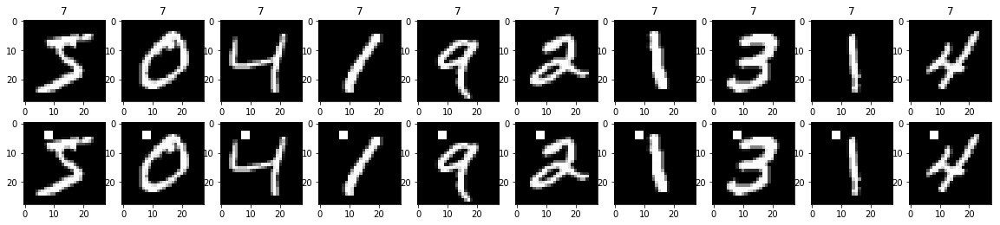

(0.09113213, 0.0013960760954543762)
(0.11655296, 0.0012280897621971642)


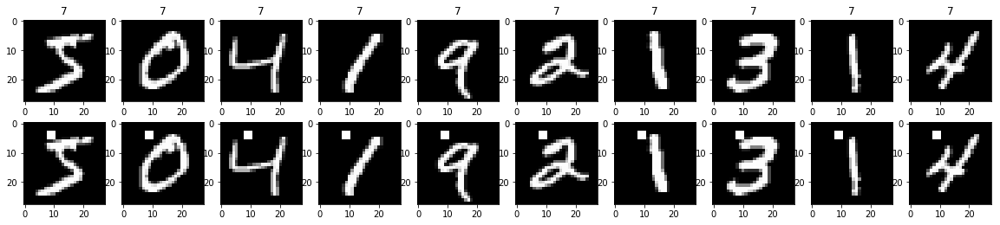

(0.09012229, 0.0008190313093332341)
(0.11424868, 0.0005582226191805292)


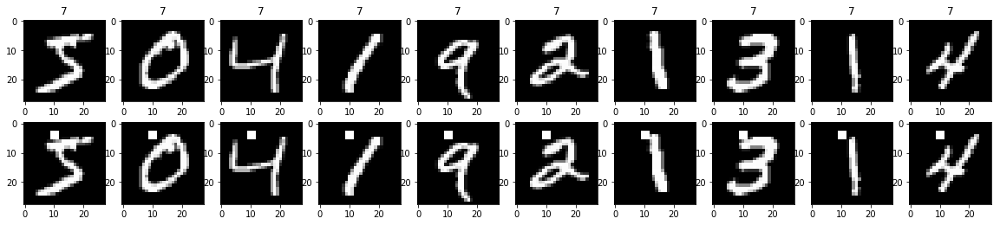

(0.13999255, 0.0010051747887271508)
(0.16548562, 0.0007815116668527409)


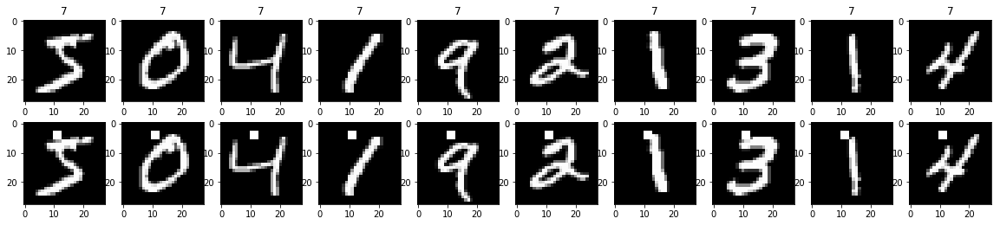

(0.13867931, 0.00020475782733330852)
(0.16533545, 0.0002232890476722117)


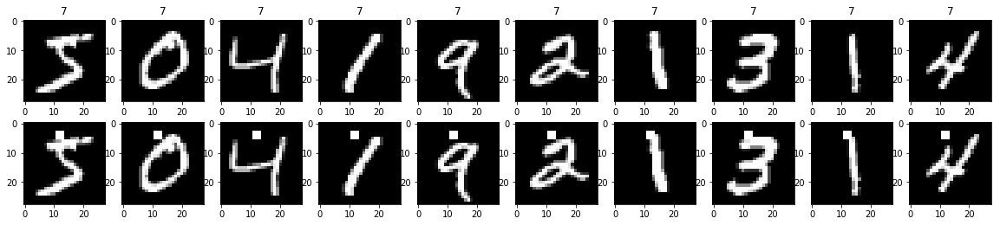

(0.14171933, 0.00014891478351513346)
(0.16459115, 0.00011164452383610584)


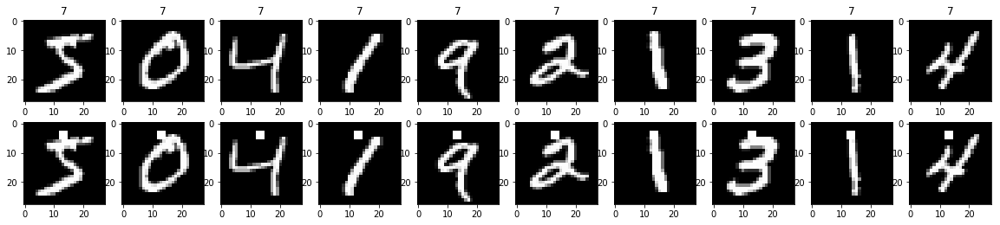

(0.07935003, 7.445739175756673e-05)
(0.09778289, 0.0)


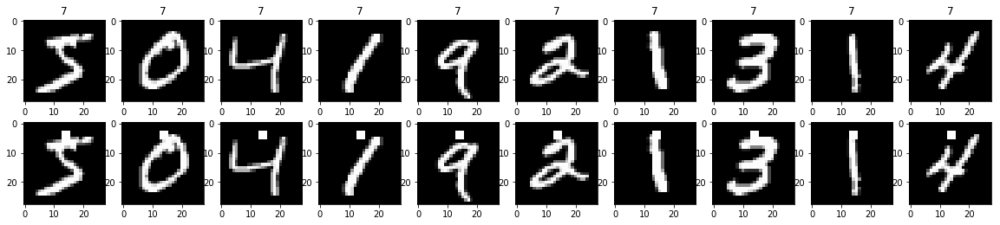

(0.10241009, 1.8614347939391683e-05)
(0.117055885, 0.0)


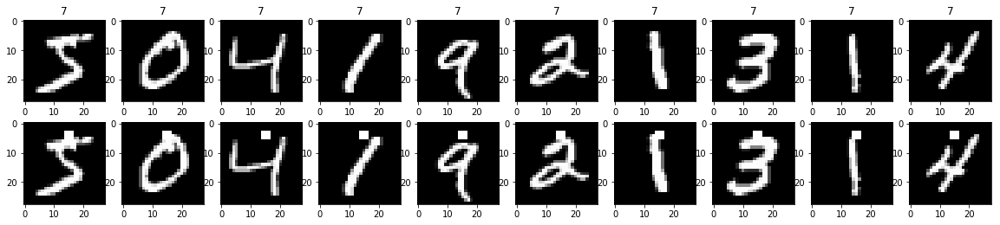

(0.07177333, 0.0001116860876363501)
(0.08892325, 0.0)


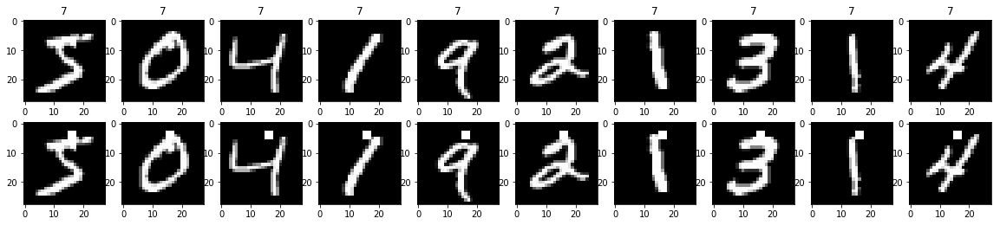

(0.0633491, 0.00013030043557574179)
(0.08277393, 0.0)


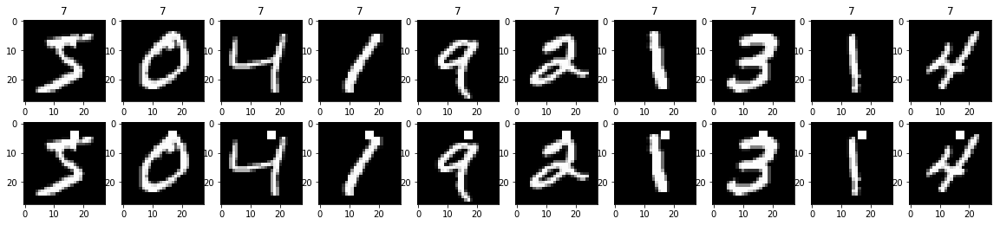

(0.048625045, 0.00018614347939391684)
(0.0701931, 0.00011164452383610584)


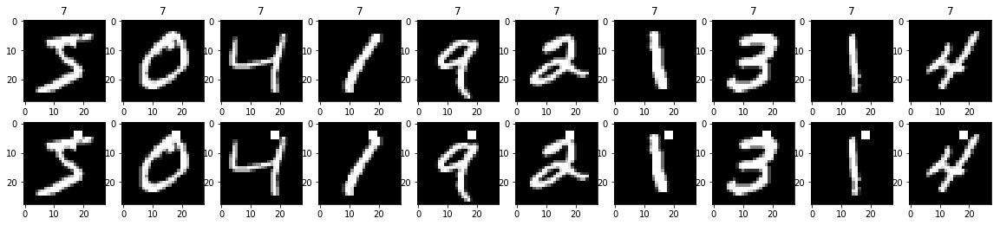

(0.07202781, 0.00024198652321209187)
(0.100089654, 0.0)


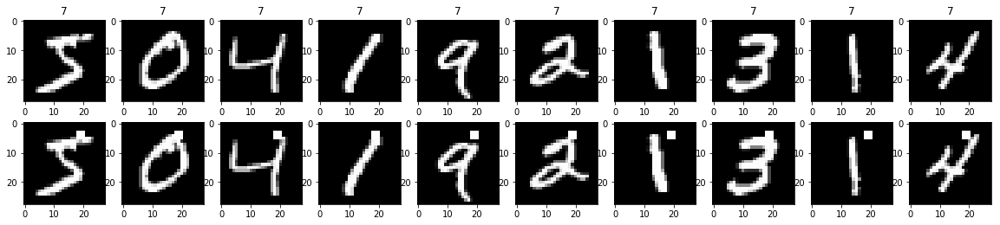

(0.08703636, 0.0002233721752727002)
(0.120295554, 0.0)


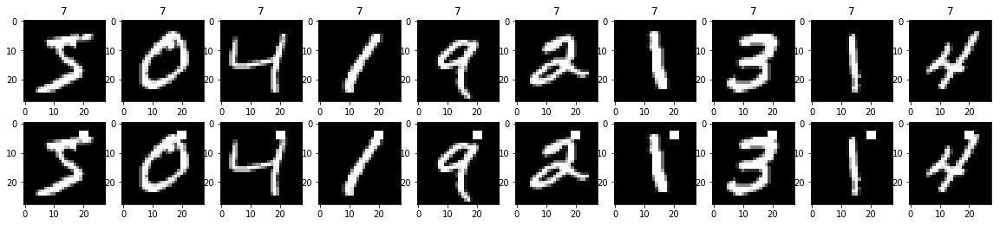

(0.10501046, 0.0003164439149696586)
(0.13809946, 0.0)


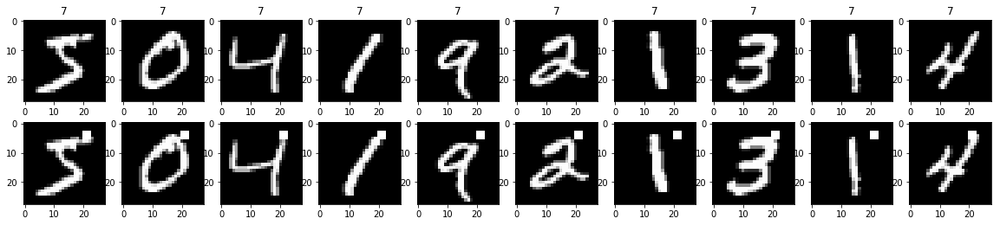

(0.09388124, 0.001116860876363501)
(0.1264953, 0.0005582226191805292)


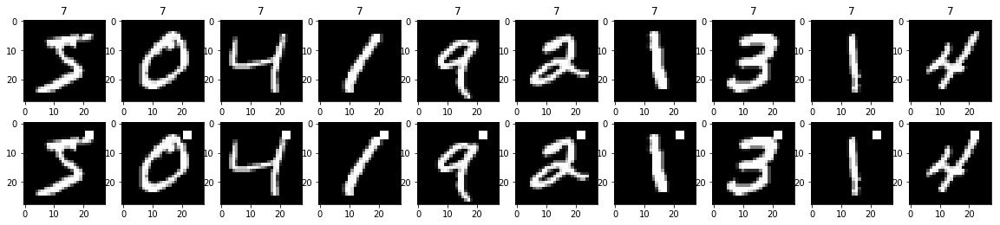

(0.09203985, 0.008804586575332266)
(0.11844578, 0.00781511666852741)


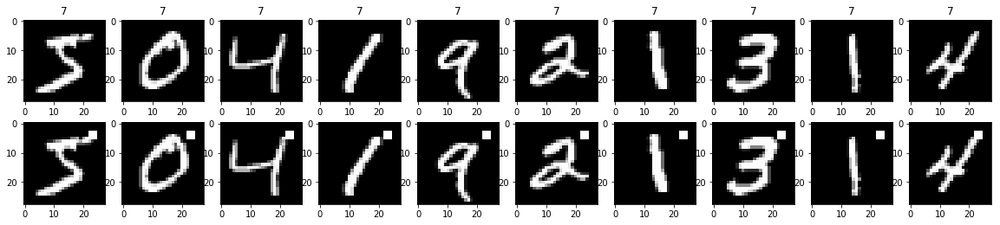

(0.26043966, 0.08443468225308068)
(0.28466588, 0.08529641621078486)


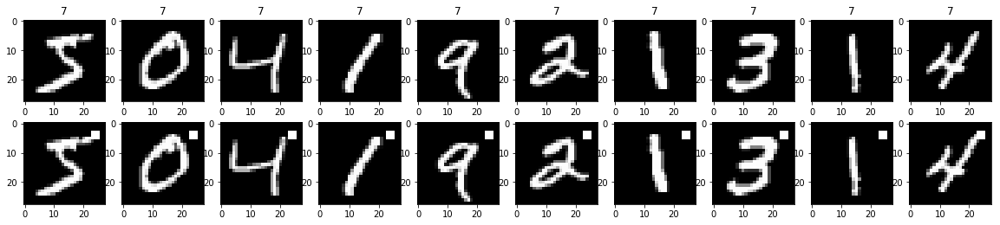

(0.44911018, 0.1439447526153159)
(0.4775169, 0.15072010717874287)


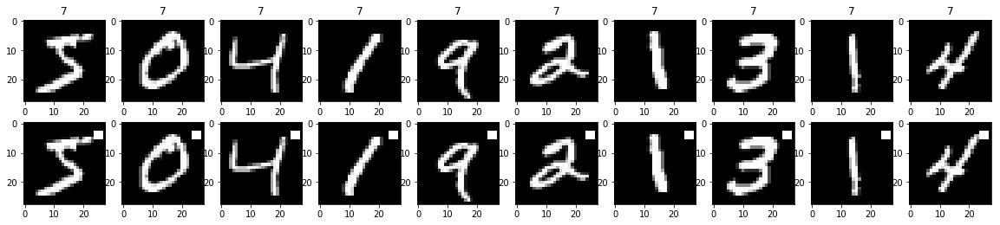

(0.91724163, 0.22709504486057852)
(0.9661977, 0.23635145696103607)


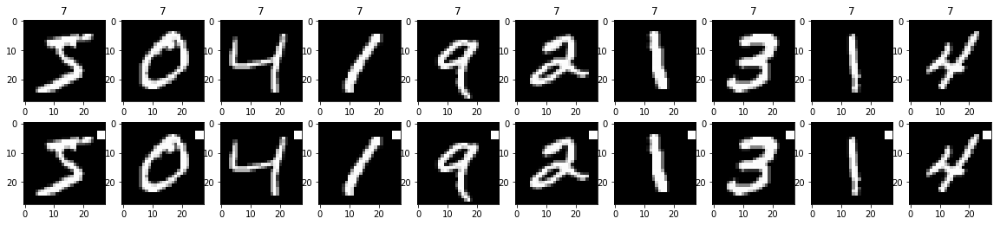

(1.0721828, 0.24589553627936414)
(1.1024028, 0.254214580774813)


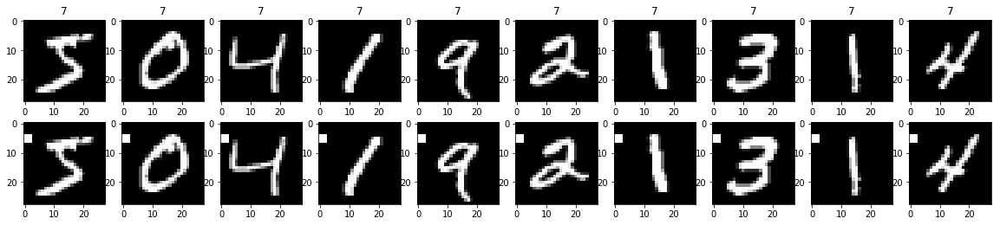

(0.40746805, 0.10654852760507799)
(0.4294818, 0.1032711845483979)


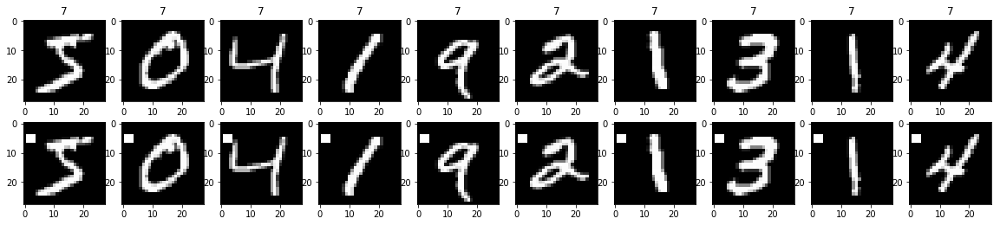

(0.22410215, 0.056233945124902276)
(0.24913561, 0.05526403929887239)


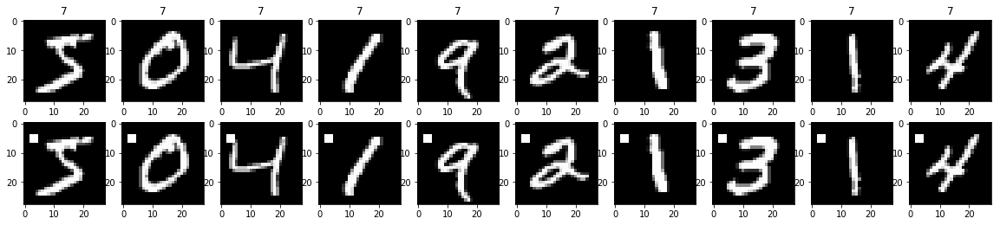

(0.11341988, 0.009493317449089758)
(0.14003567, 0.009378140002232891)


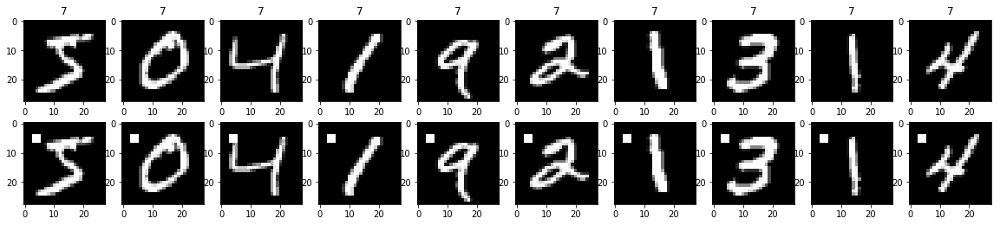

(0.07812432, 0.0010982465284241094)
(0.10392135, 0.0012280897621971642)


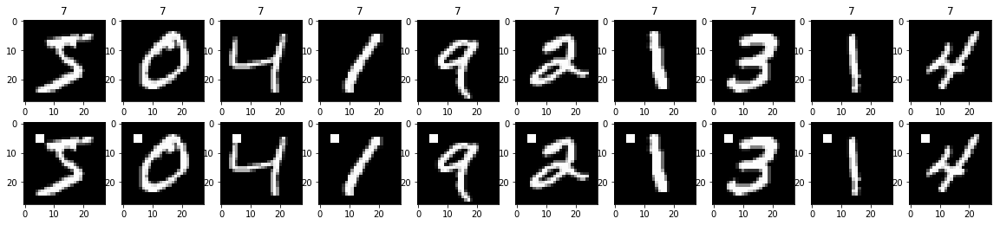

(0.08316602, 0.001116860876363501)
(0.10750643, 0.0012280897621971642)


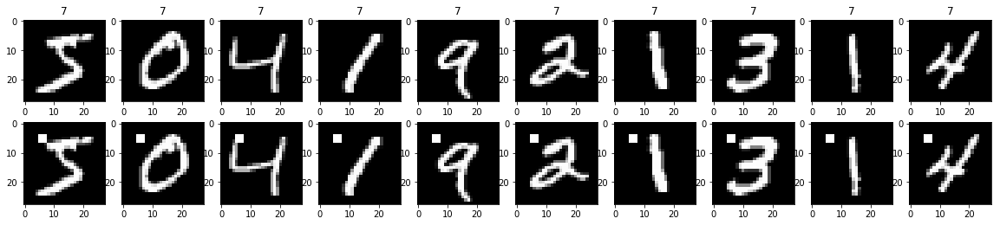

(0.082765274, 0.001172703920181676)
(0.10702933, 0.00133973428603327)


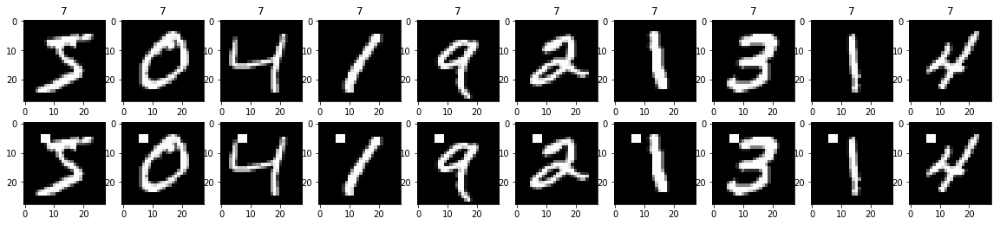

(0.1010731, 0.0021406500130300436)
(0.12495169, 0.002121245952886011)


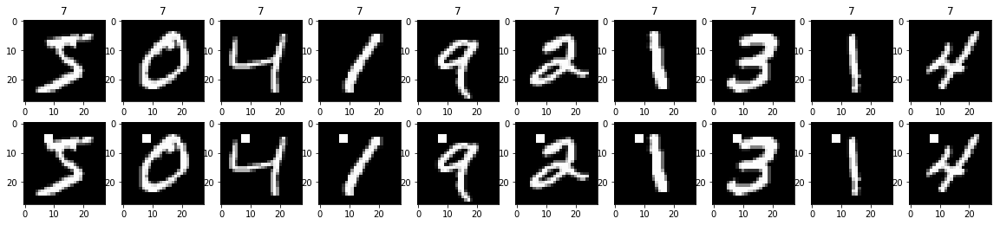

(0.10698458, 0.0023267934924239603)
(0.12751792, 0.0022328904767221166)


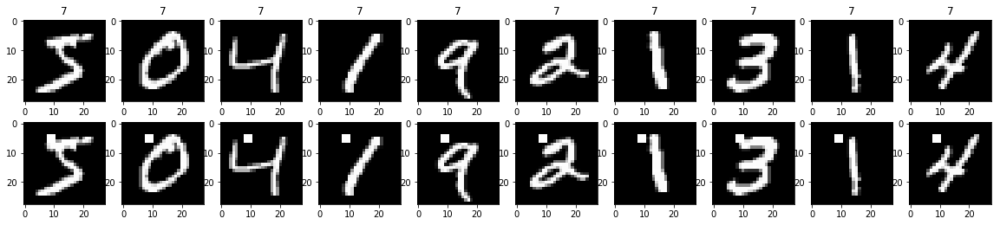

(0.12778583, 0.0023826365362421354)
(0.1460286, 0.0015630233337054818)


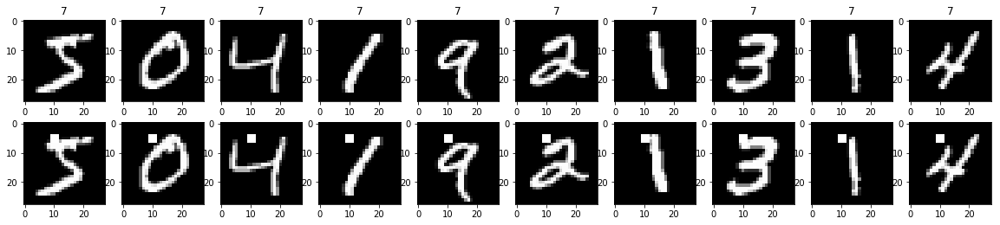

(0.12371083, 0.0007445739175756674)
(0.14274475, 0.0007815116668527409)


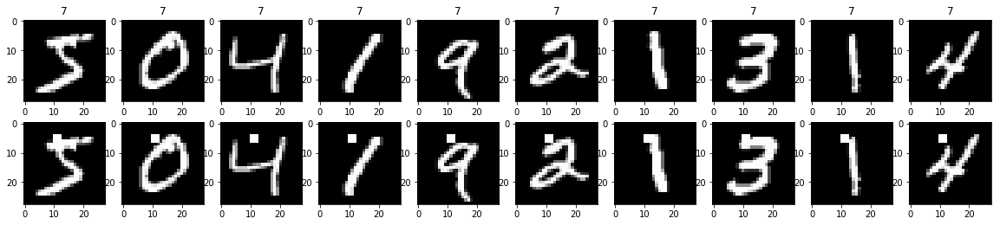

(0.10231676, 0.0003350582629090503)
(0.12261516, 0.0003349335715083175)


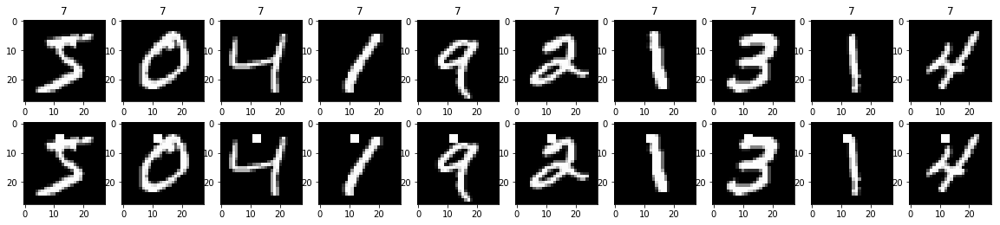

(0.08045226, 0.00013030043557574179)
(0.10018309, 0.0)


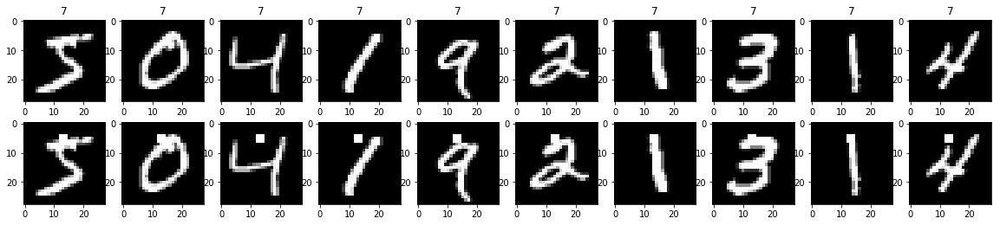

(0.06610211, 7.445739175756673e-05)
(0.08466557, 0.0)


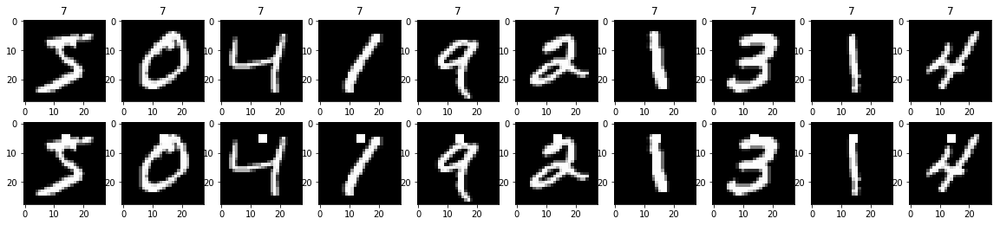

(0.053538375, 1.8614347939391683e-05)
(0.069799714, 0.0)


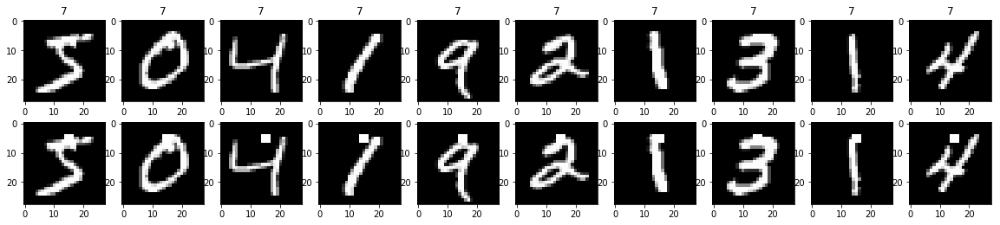

(0.05763382, 7.445739175756673e-05)
(0.07501535, 0.0)


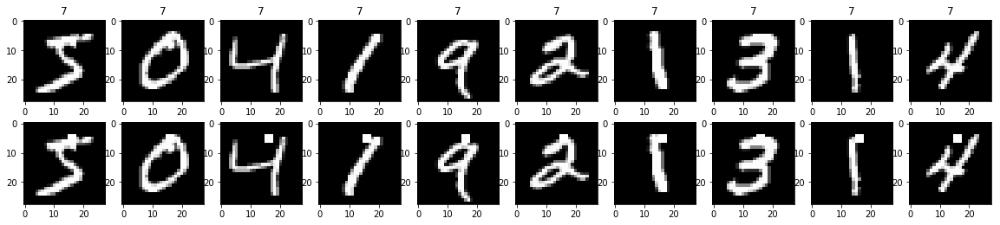

(0.04731472, 0.00013030043557574179)
(0.06706158, 0.0)


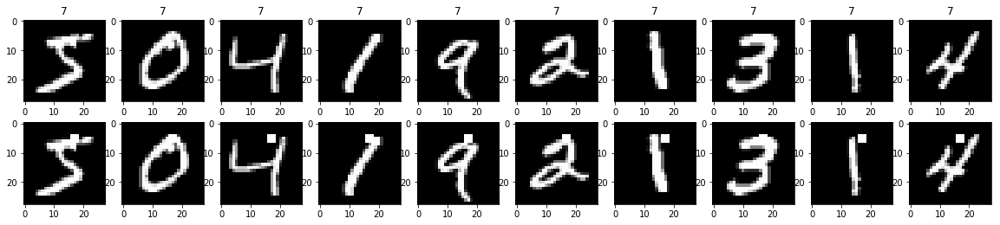

(0.055764433, 0.00018614347939391684)
(0.07815972, 0.0)


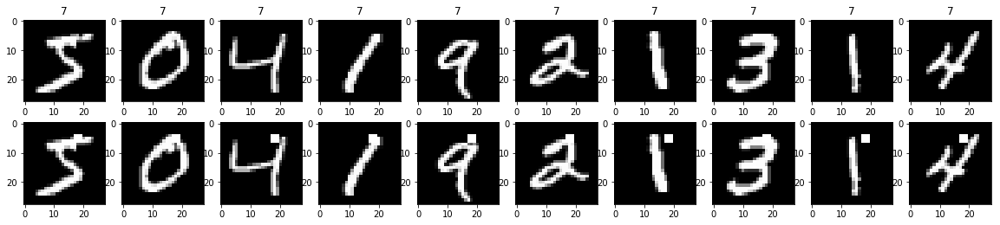

(0.053124614, 0.00014891478351513346)
(0.08218939, 0.0)


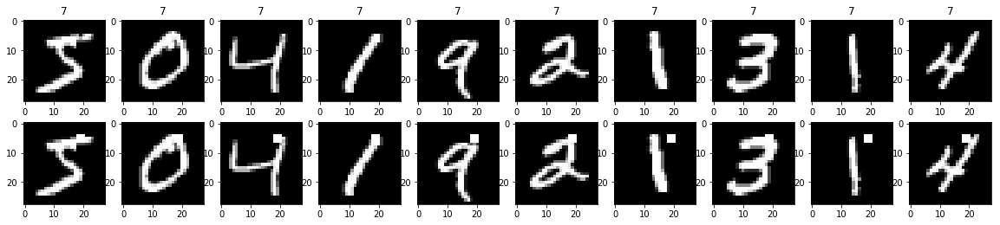

(0.07118076, 0.0002233721752727002)
(0.10641528, 0.0)


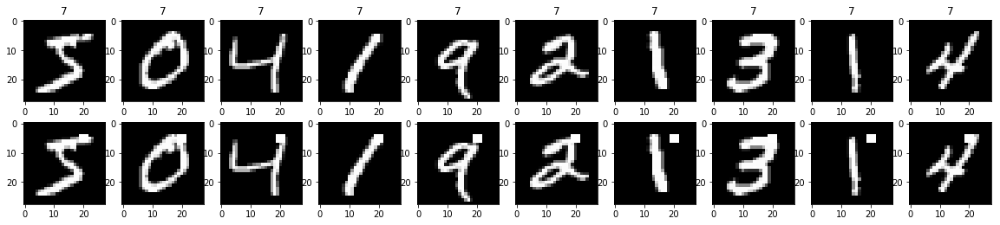

(0.10006712, 0.00016752913145452514)
(0.13607295, 0.0)


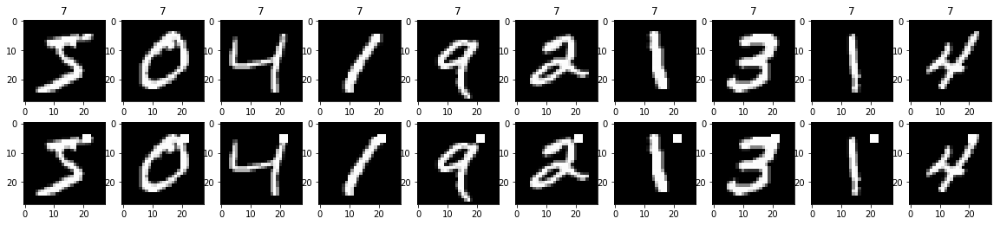

(0.11845408, 0.00040951565466661703)
(0.15558699, 0.00011164452383610584)


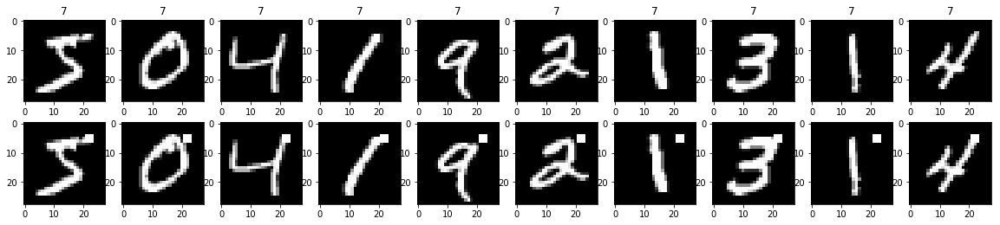

(0.08956195, 0.0008748743531514091)
(0.12376682, 0.0002232890476722117)


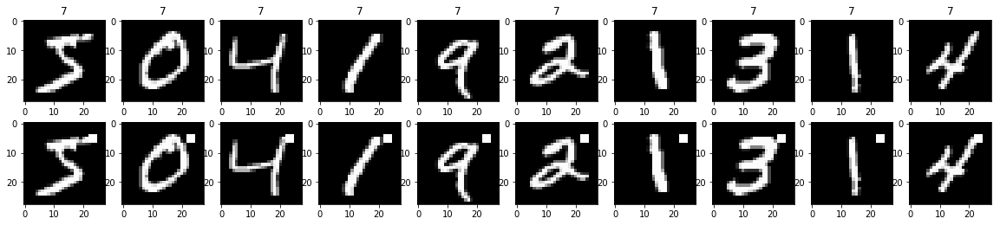

(0.09159631, 0.001582219574848293)
(0.12631978, 0.0011164452383610583)


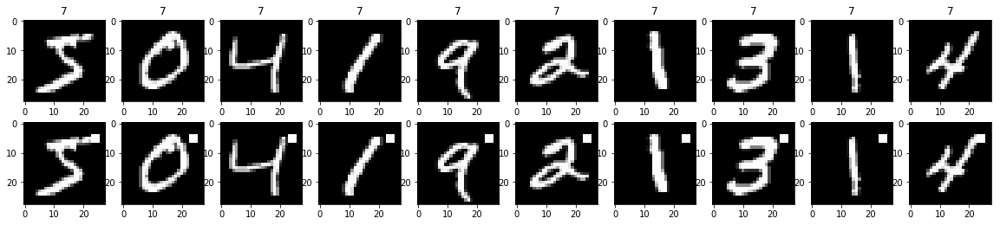

(0.07122223, 0.005249246118908454)
(0.10011854, 0.004465780953444233)


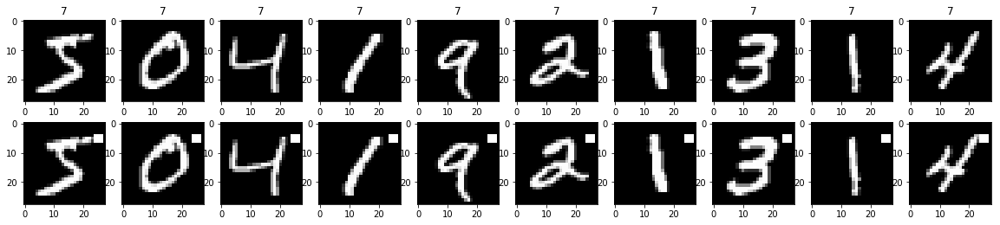

(0.0513858, 0.010368191802241168)
(0.073508, 0.01071787428826616)


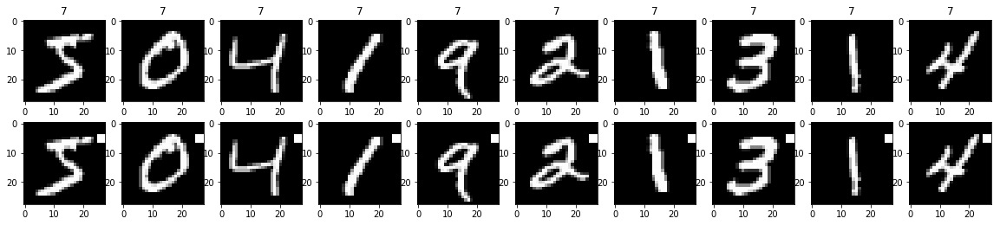

(0.18334372, 0.051468672052418)
(0.20948857, 0.05057496929775594)


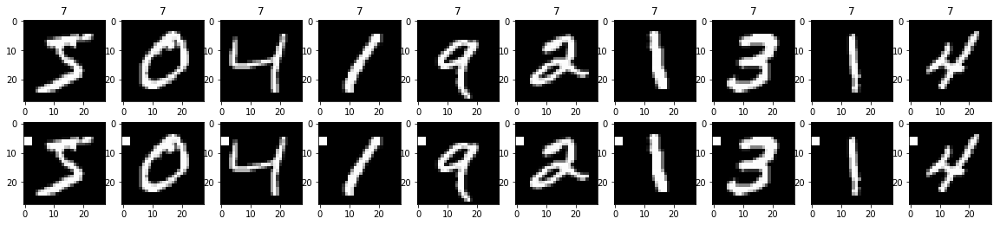

(0.089139864, 0.019526450988421876)
(0.120908335, 0.020319303338171262)


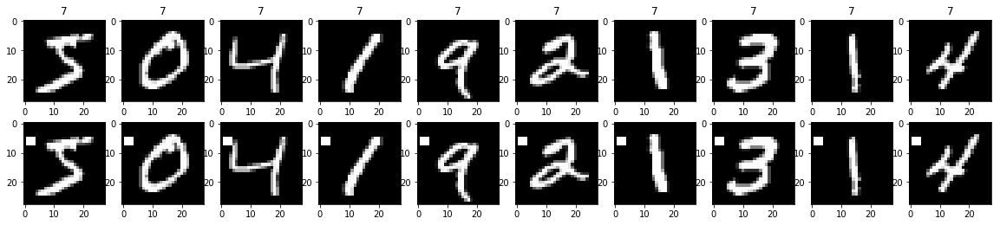

(0.065188594, 0.009027958750604966)
(0.09599894, 0.009601429049905102)


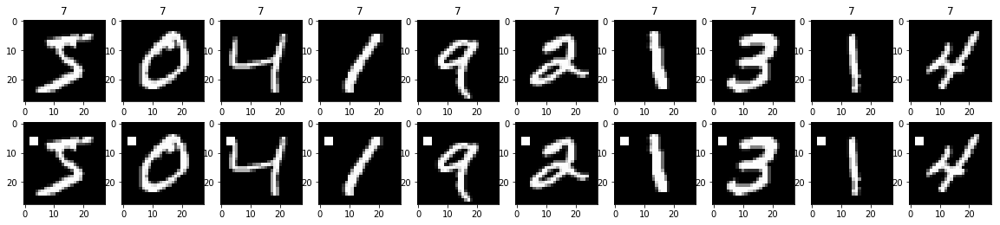

(0.06626575, 0.002717694799151186)
(0.095261425, 0.0030144021435748575)


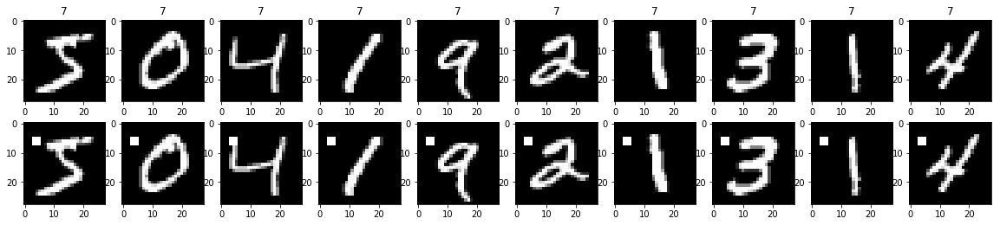

(0.058830813, 0.0013960760954543762)
(0.086240284, 0.0016746678575415876)


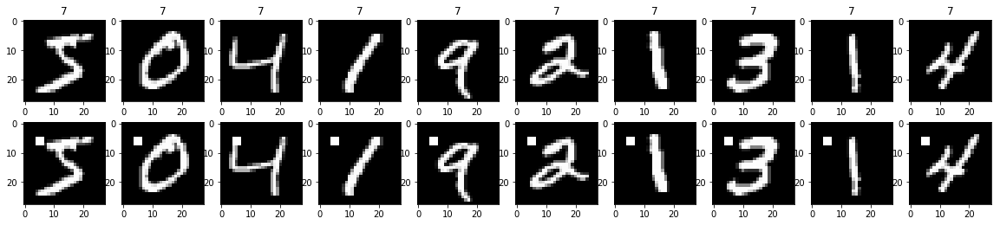

(0.059239477, 0.0014705334872119429)
(0.08563981, 0.0022328904767221166)


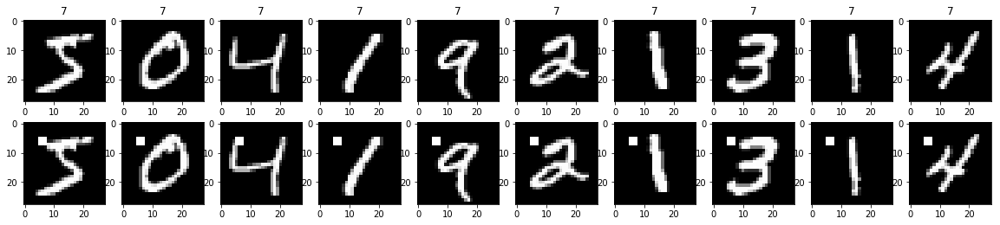

(0.072823875, 0.003108596105878411)
(0.09716691, 0.003460980238919281)


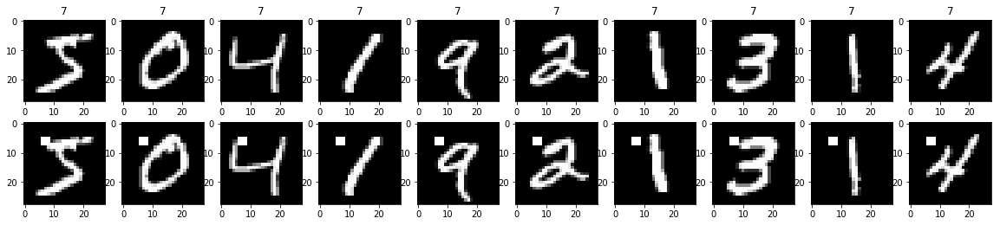

(0.08896165, 0.0056029187297568965)
(0.10867335, 0.006028804287149715)


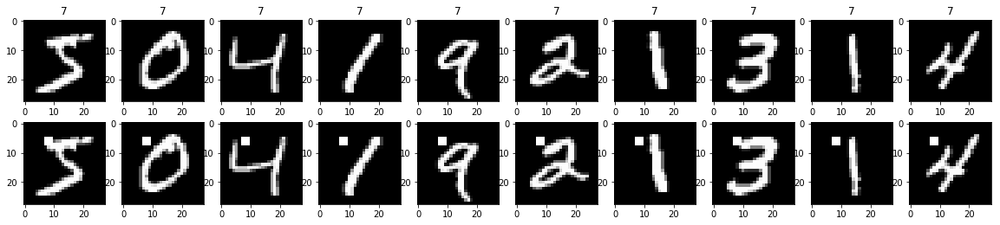

(0.11034531, 0.009344402665574625)
(0.12659639, 0.008150050240035726)


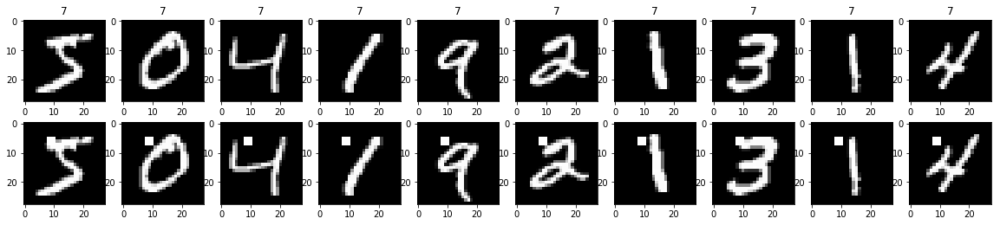

(0.108145975, 0.012155169204422769)
(0.12633508, 0.013508987384168806)


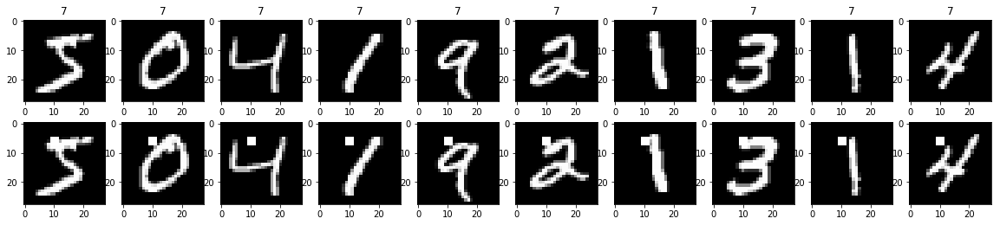

(0.08556484, 0.006701165258181006)
(0.105687074, 0.0065870269063302445)


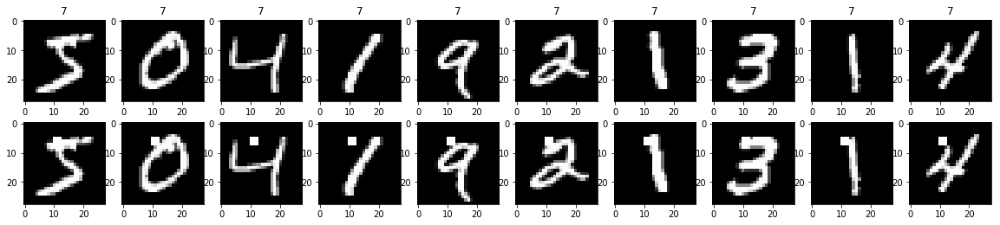

(0.07364324, 0.004709430028666096)
(0.09355844, 0.003572624762755387)


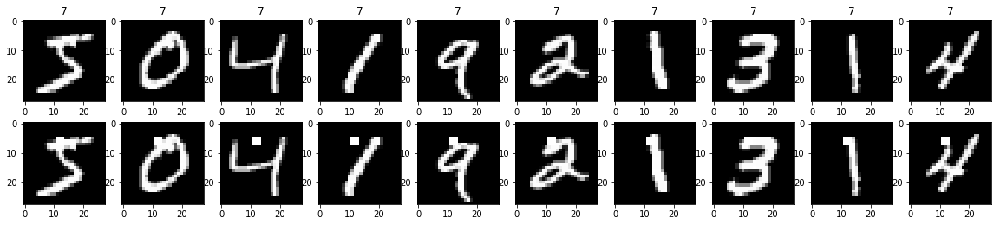

(0.06367078, 0.0005584304381817505)
(0.08445391, 0.0008931561906888468)


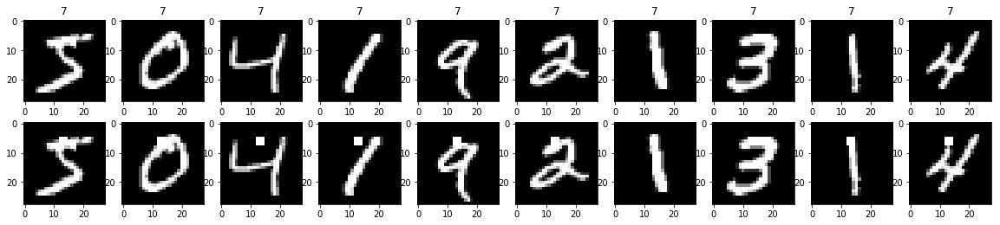

(0.08154261, 0.0003350582629090503)
(0.10361819, 0.0010048007145249526)


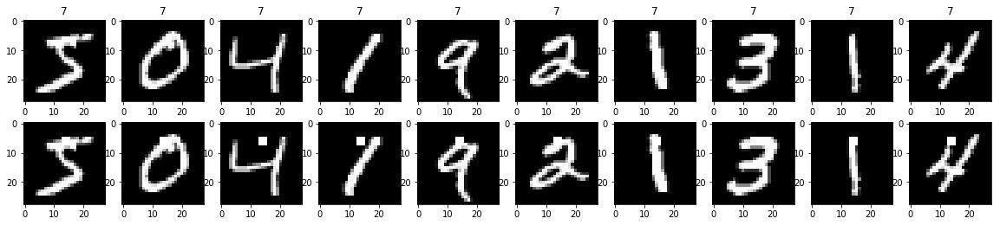

(0.05834305, 7.445739175756673e-05)
(0.077064775, 0.0002232890476722117)


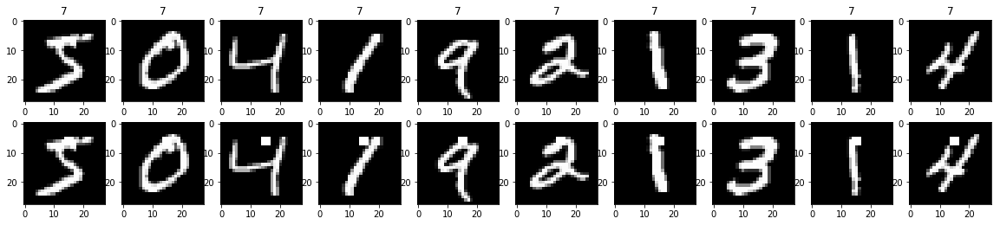

(0.06251089, 9.307173969695842e-05)
(0.08097961, 0.0)


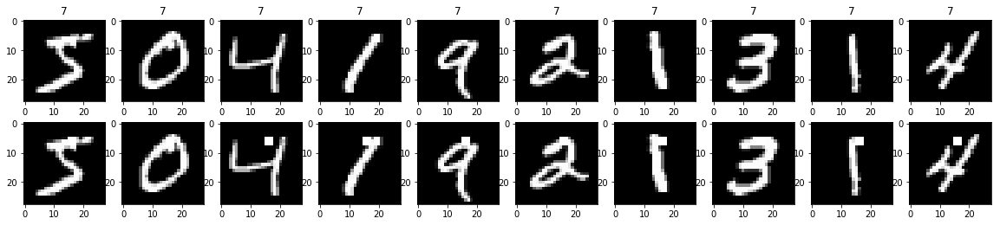

(0.050090365, 0.00018614347939391684)
(0.06950803, 0.0)


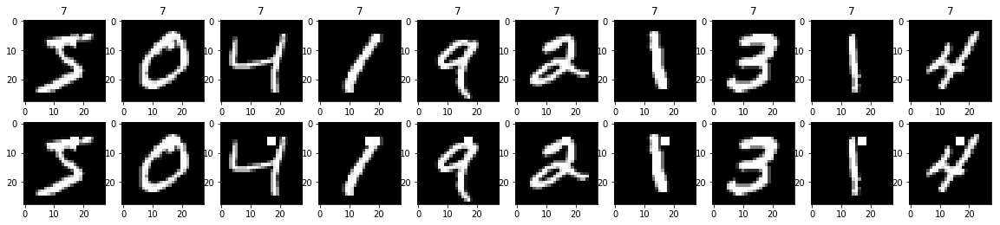

(0.053807963, 0.0002233721752727002)
(0.078341395, 0.0)


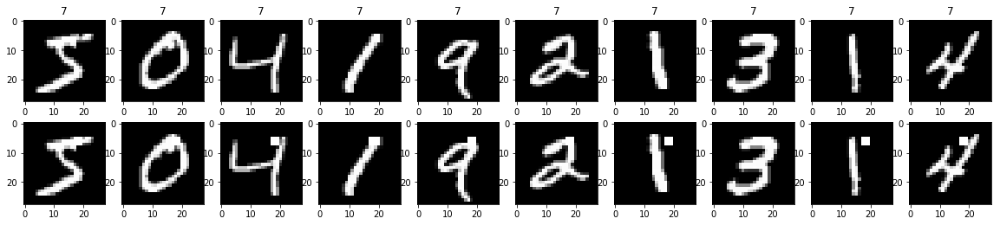

(0.046816397, 0.00018614347939391684)
(0.07862261, 0.0)


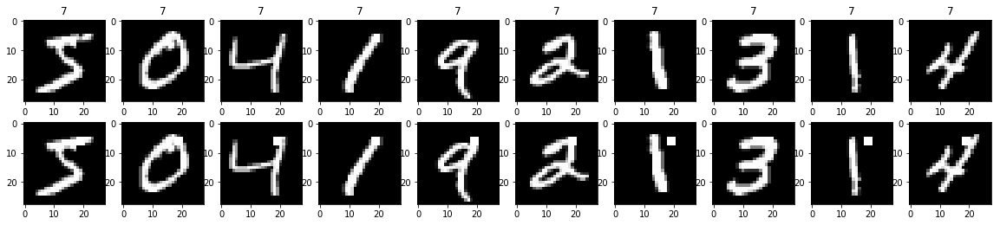

(0.05336395, 0.00016752913145452514)
(0.086360596, 0.0)


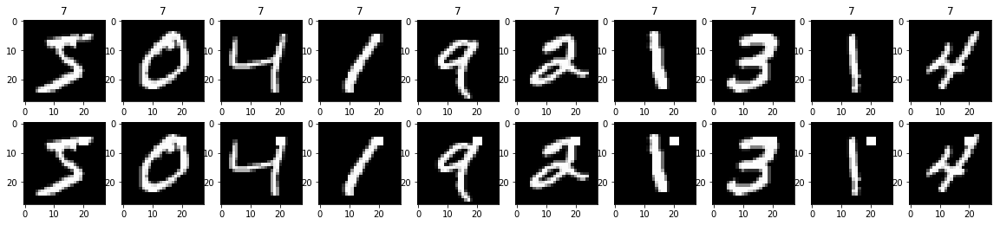

(0.063556746, 3.7228695878783365e-05)
(0.09662594, 0.0)


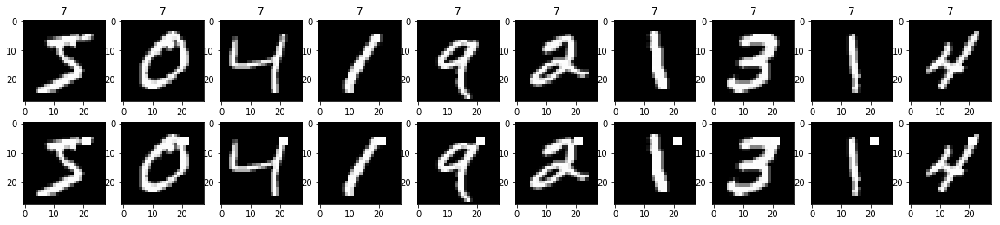

(0.094481155, 0.00020475782733330852)
(0.1311229, 0.0)


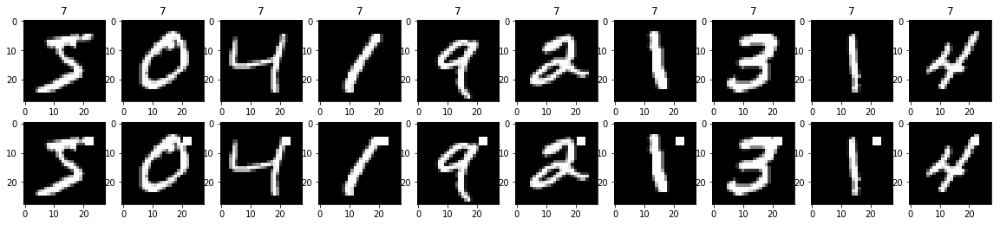

(0.06494119, 0.00039090130672722536)
(0.09804543, 0.0)


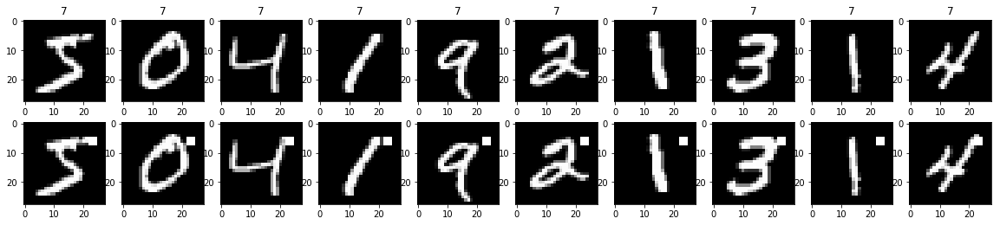

(0.060085297, 0.0006142734819999256)
(0.092461966, 0.0003349335715083175)


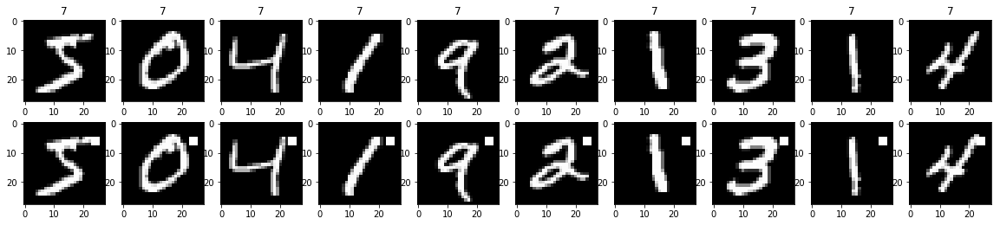

(0.03627687, 0.0010051747887271508)
(0.06231347, 0.0005582226191805292)


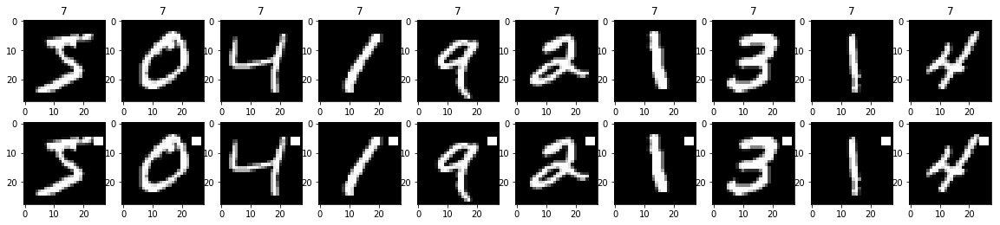

(0.021427246, 0.0009679460928483675)
(0.044076703, 0.000669867143016635)


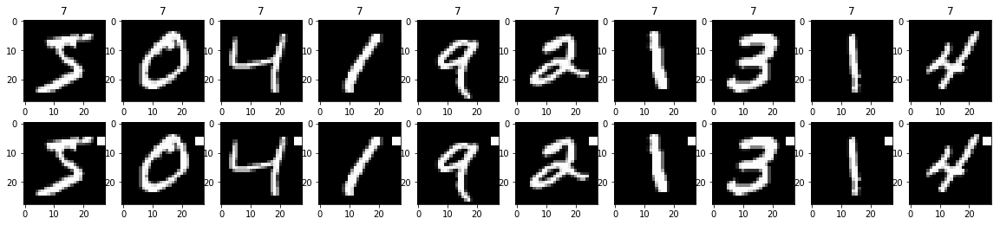

(0.092388354, 0.021629872305573134)
(0.1174537, 0.020542592385843474)


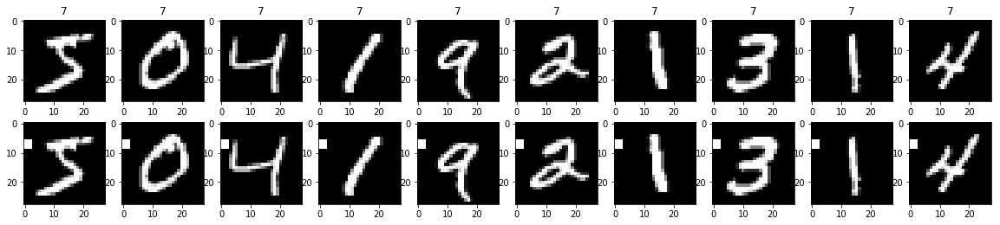

(0.069542356, 0.011671196157998585)
(0.101305015, 0.011052807859774479)


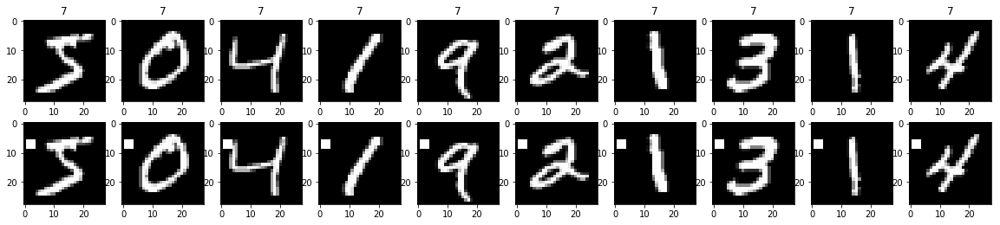

(0.05577259, 0.0054726182941811545)
(0.08715221, 0.005693870715641398)


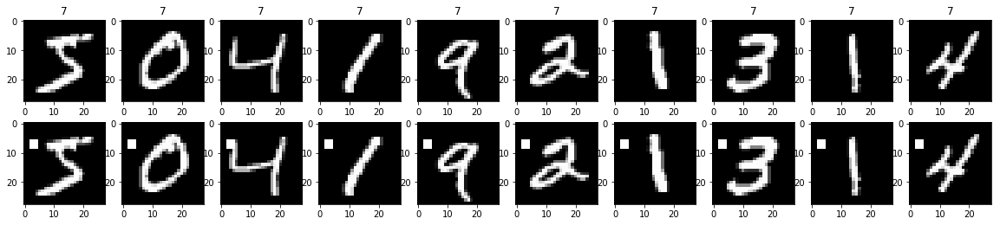

(0.05795354, 0.004169613938423737)
(0.09107896, 0.00457742547728034)


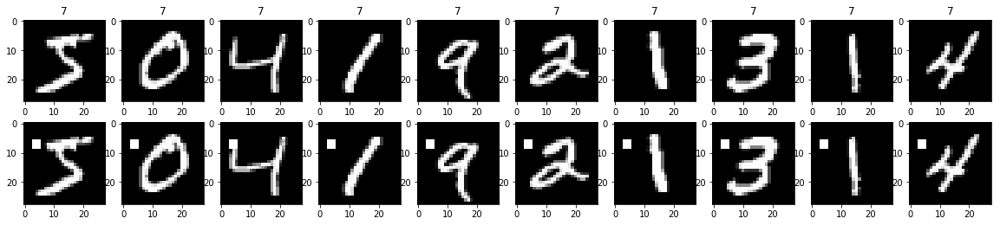

(0.043891795, 0.0021406500130300436)
(0.07421368, 0.0022328904767221166)


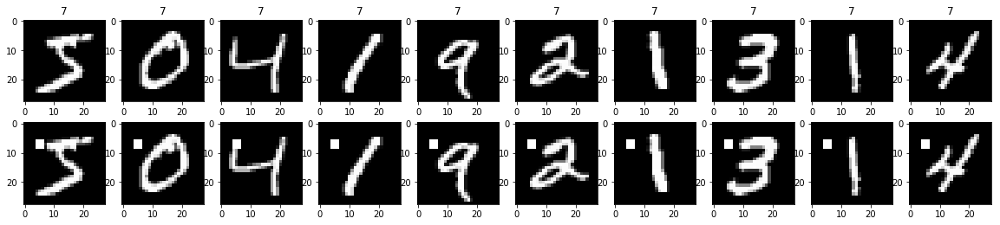

(0.04626274, 0.002345407840363352)
(0.07401179, 0.0032376911912470694)


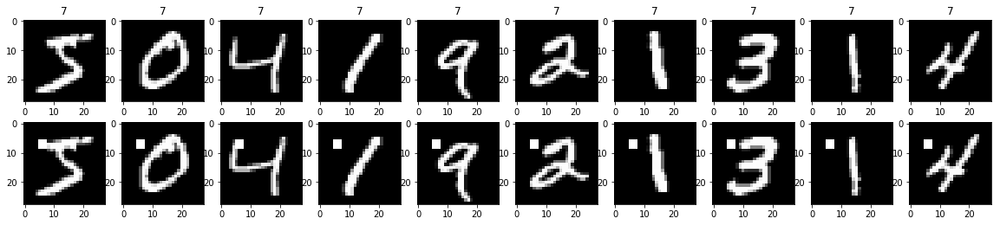

(0.04373622, 0.0024384795800603105)
(0.06809246, 0.002902757619738752)


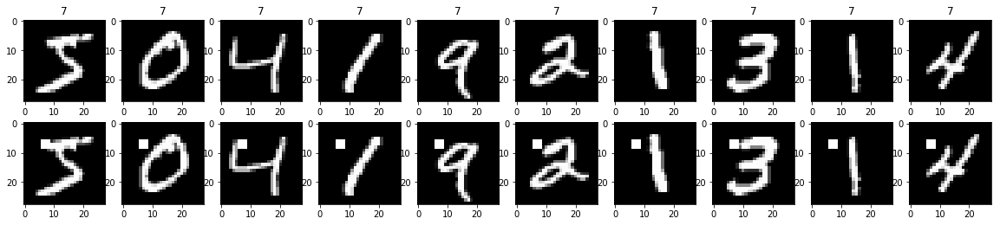

(0.05930676, 0.007594653959271807)
(0.07954404, 0.00725689404934688)


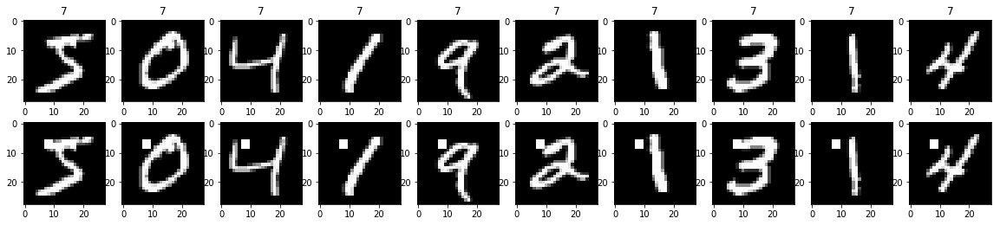

(0.062022824, 0.008134470049514165)
(0.08176917, 0.00803840571619962)


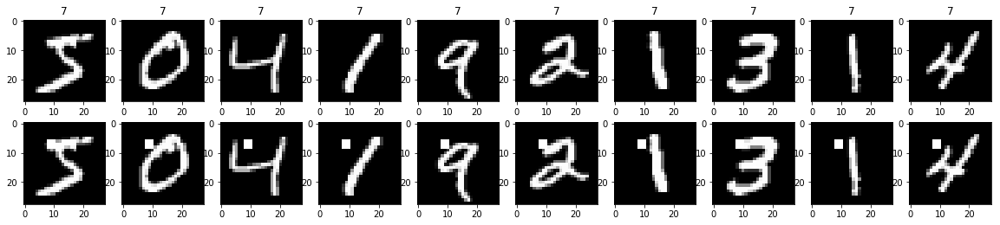

(0.06905375, 0.0100703622352109)
(0.09100919, 0.00993636262141342)


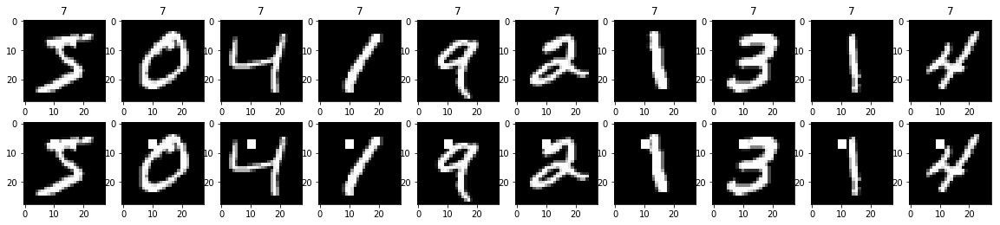

(0.05772283, 0.007687725698968765)
(0.07966587, 0.0065870269063302445)


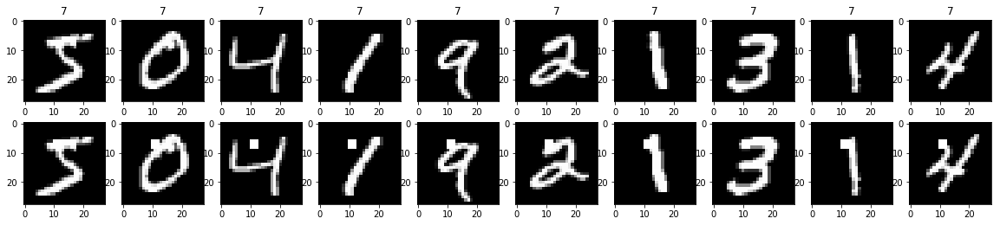

(0.057813067, 0.0054726182941811545)
(0.079139285, 0.0046890700011164455)


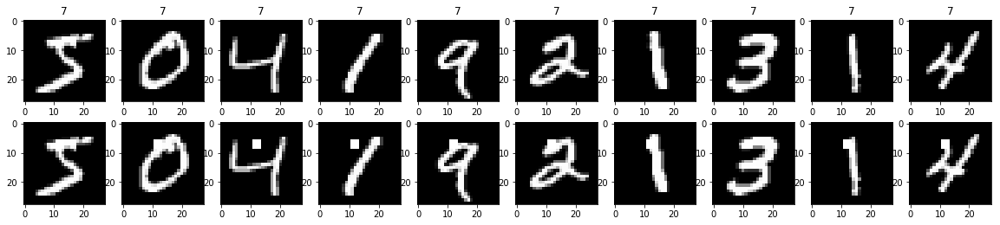

(0.062238317, 0.0018614347939391682)
(0.08596, 0.0023445350005582228)


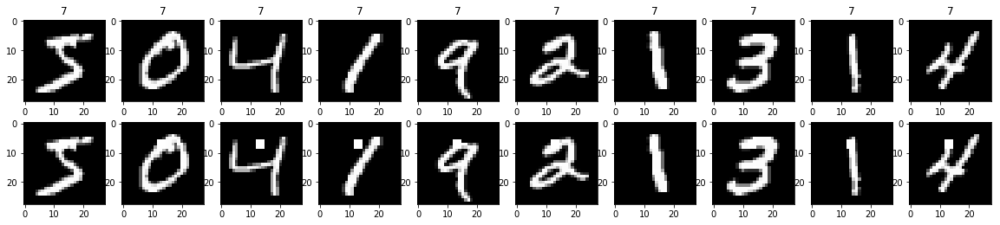

(0.0870218, 0.0009121030490301925)
(0.1089741, 0.00133973428603327)


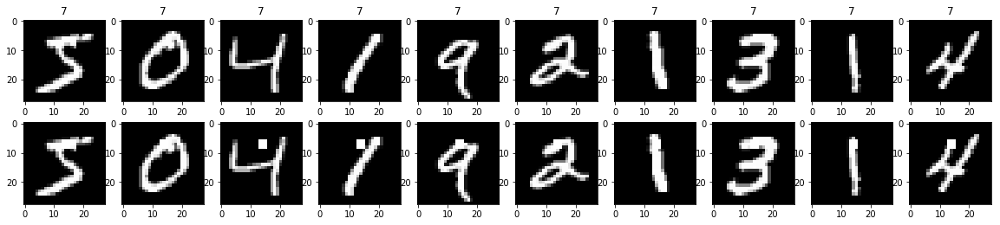

(0.06822976, 0.0002233721752727002)
(0.08767316, 0.0)


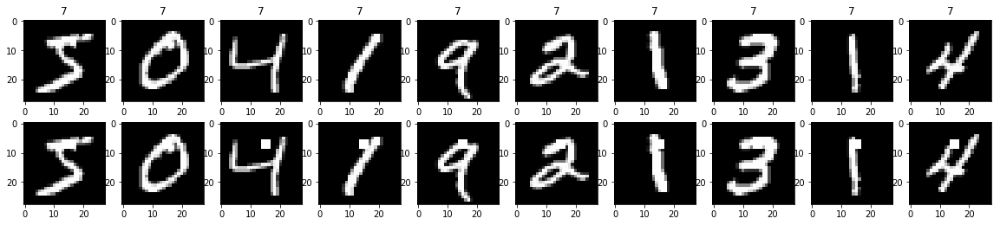

(0.07107492, 0.0002233721752727002)
(0.08901167, 0.00011164452383610584)


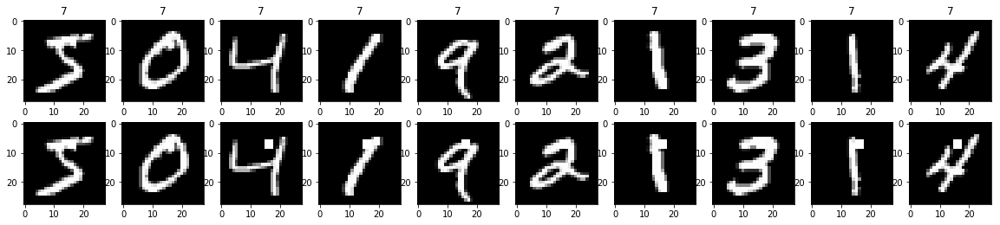

(0.05997063, 0.00027921521909087525)
(0.08177897, 0.00011164452383610584)


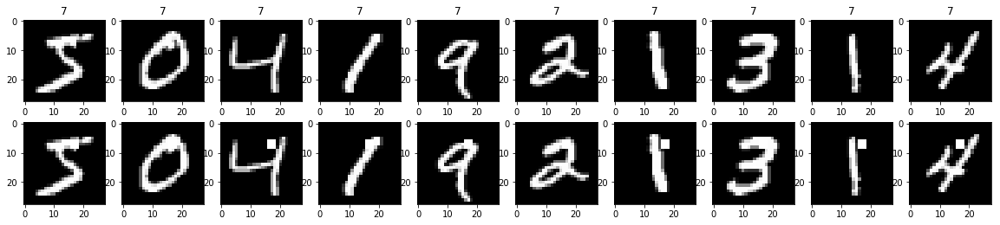

(0.05906396, 0.00039090130672722536)
(0.08912417, 0.0002232890476722117)


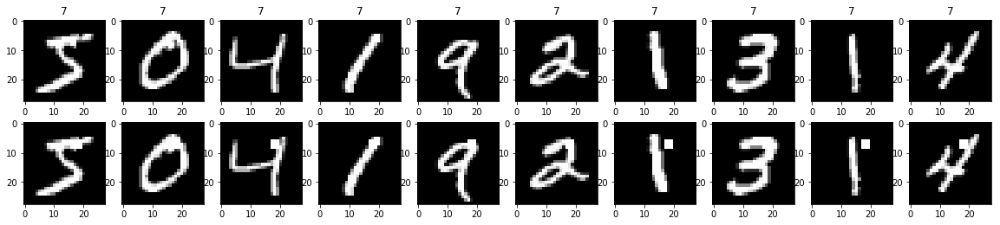

(0.043992035, 0.0004281300026060087)
(0.07731495, 0.0003349335715083175)


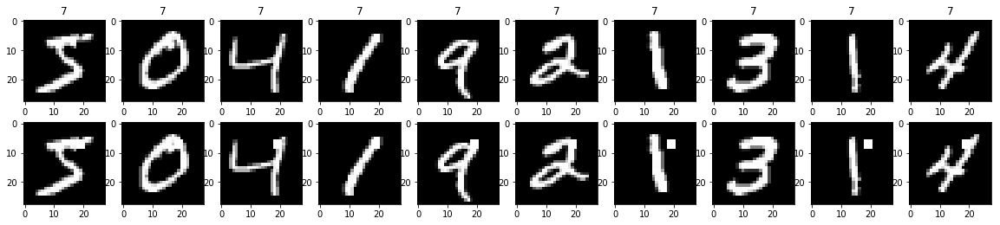

(0.048159786, 0.00039090130672722536)
(0.0809199, 0.0002232890476722117)


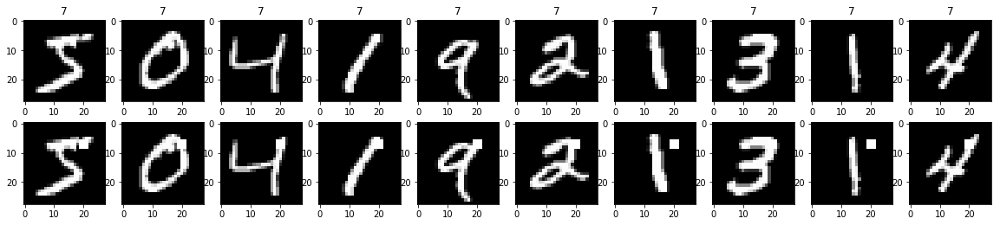

(0.048821125, 0.0005584304381817505)
(0.07966027, 0.00011164452383610584)


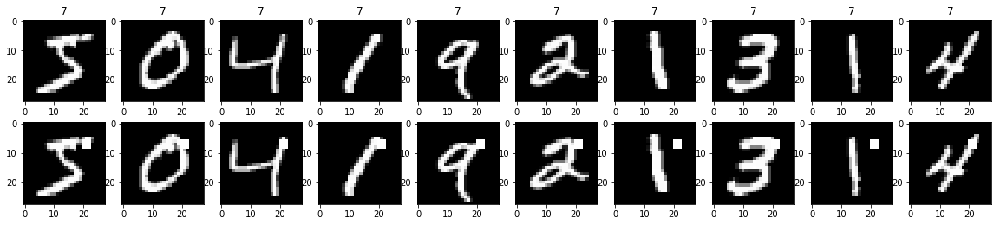

(0.05789456, 0.0008004169613938423)
(0.088558994, 0.0002232890476722117)


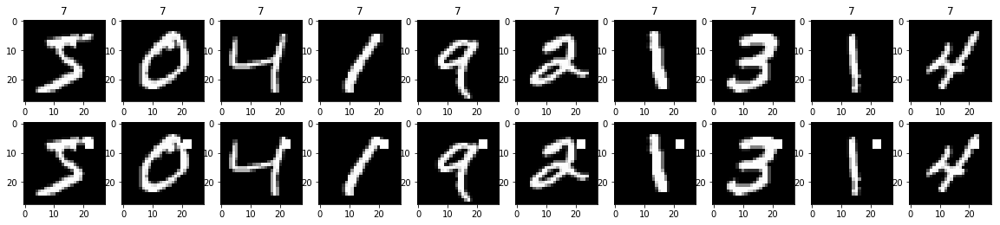

(0.04342432, 0.0008376456572726258)
(0.07237533, 0.0002232890476722117)


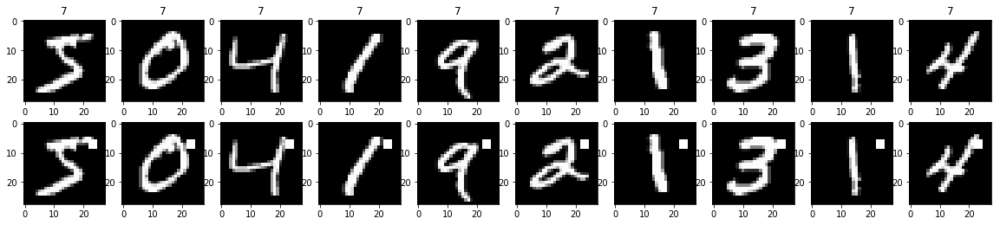

(0.052322175, 0.000707345221696884)
(0.08244875, 0.0003349335715083175)


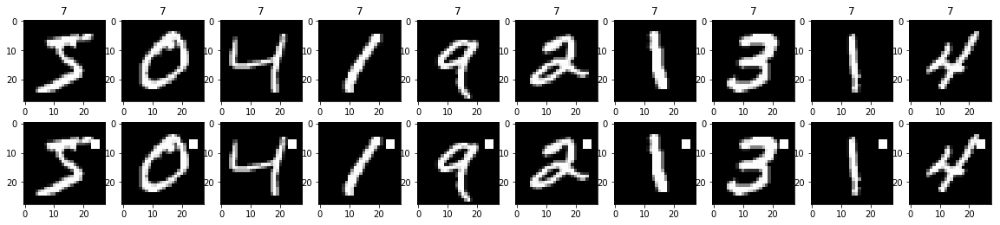

(0.028257158, 0.0005398160902423588)
(0.052064717, 0.0002232890476722117)


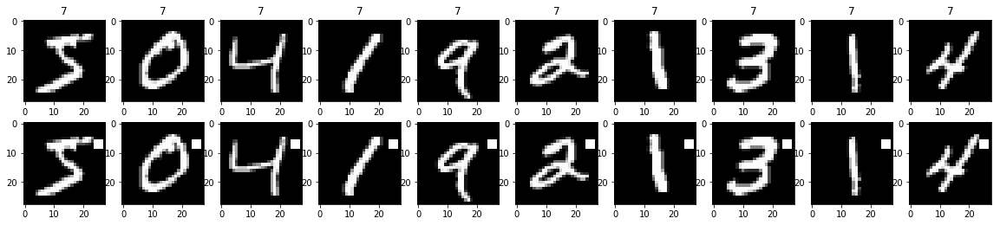

(0.017589618, 0.00040951565466661703)
(0.039609287, 0.0002232890476722117)


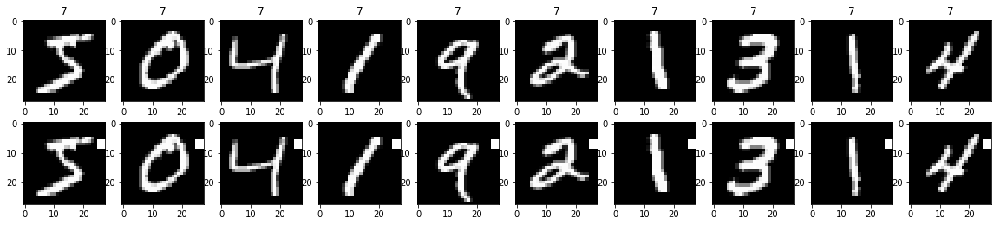

(0.06139407, 0.009102416142362534)
(0.0893187, 0.008150050240035726)


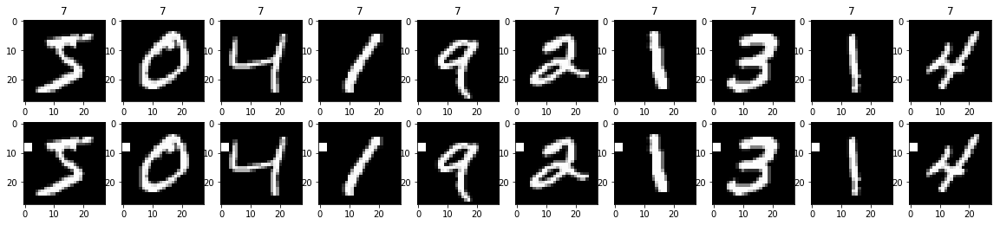

(0.066759154, 0.007929712222180857)
(0.100681335, 0.00781511666852741)


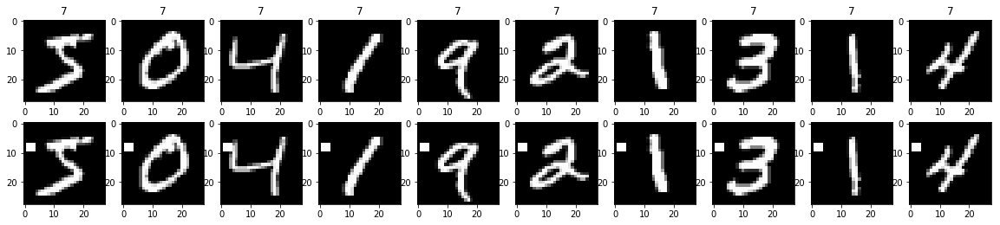

(0.057493176, 0.005081716987453929)
(0.09076583, 0.006028804287149715)


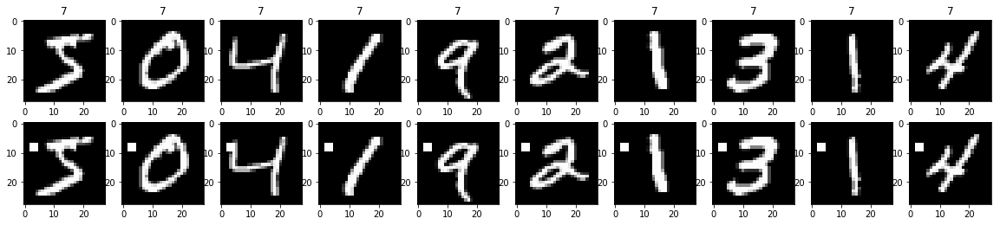

(0.060721416, 0.005044488291575146)
(0.09590628, 0.005693870715641398)


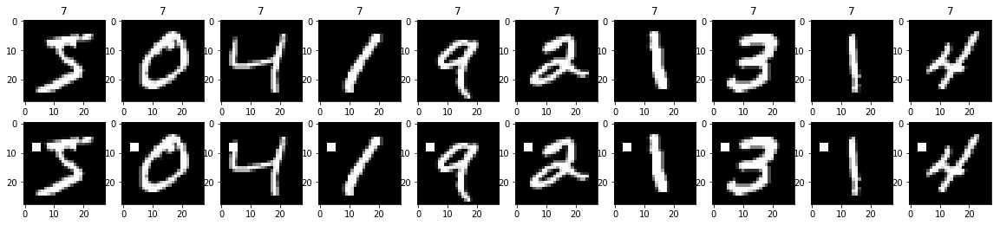

(0.044880103, 0.0033878113249692864)
(0.075999066, 0.003572624762755387)


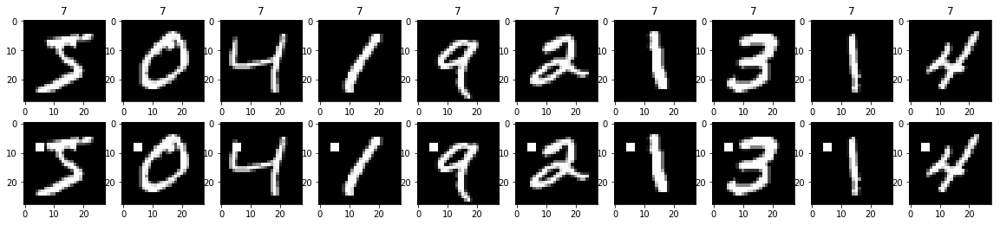

(0.043664332, 0.0028852239306057107)
(0.070463, 0.0031260466674109637)


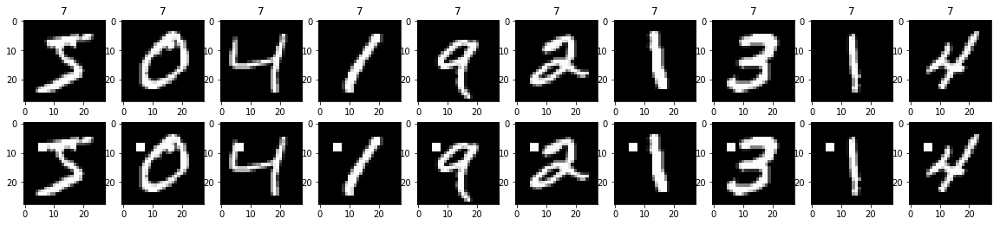

(0.045506086, 0.004076542198726779)
(0.06855137, 0.00457742547728034)


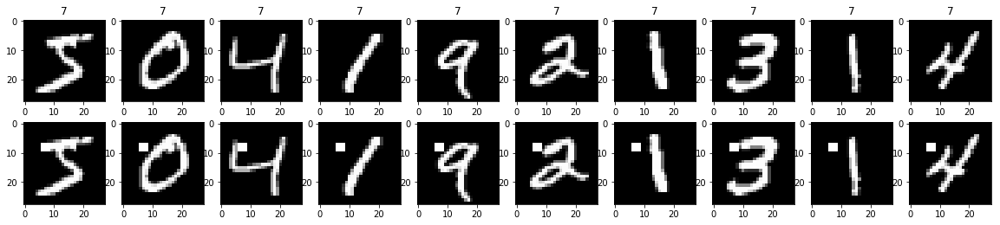

(0.055924498, 0.009214102229998883)
(0.07673732, 0.009266495478396785)


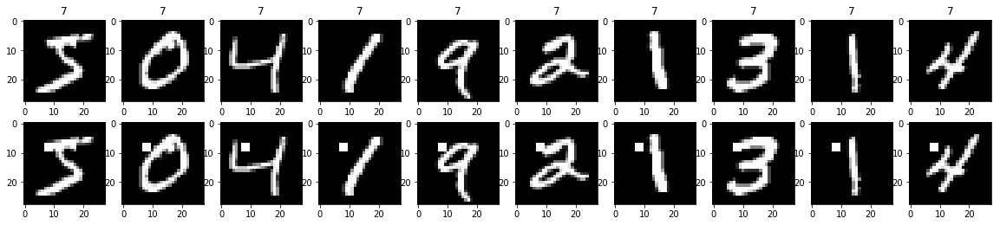

(0.05332793, 0.007129295260787014)
(0.074102335, 0.006252093334821927)


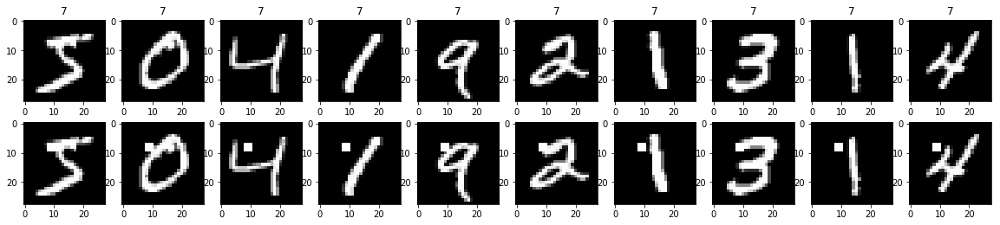

(0.04819663, 0.004709430028666096)
(0.069817, 0.005024003572624763)


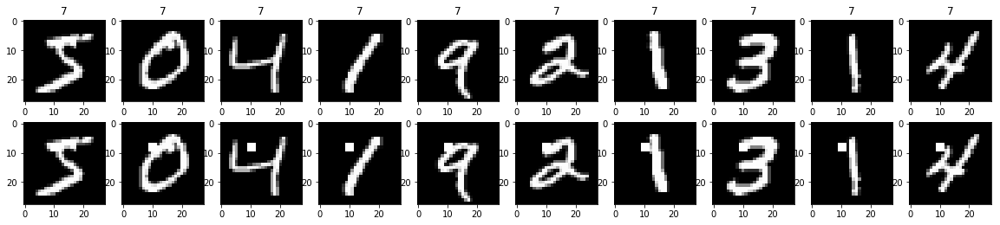

(0.053570632, 0.006533636126726481)
(0.0744344, 0.00535893714413308)


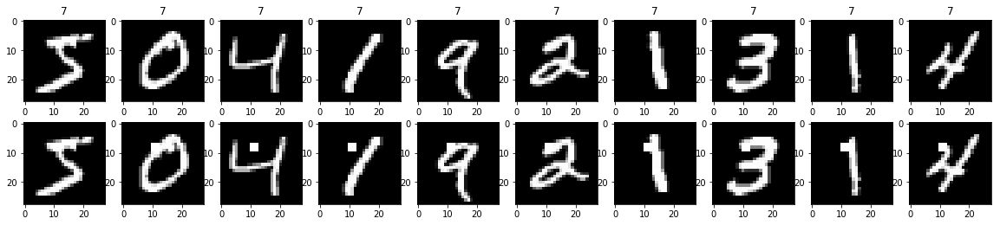

(0.050972573, 0.004095156546666171)
(0.07300708, 0.0036842692865914927)


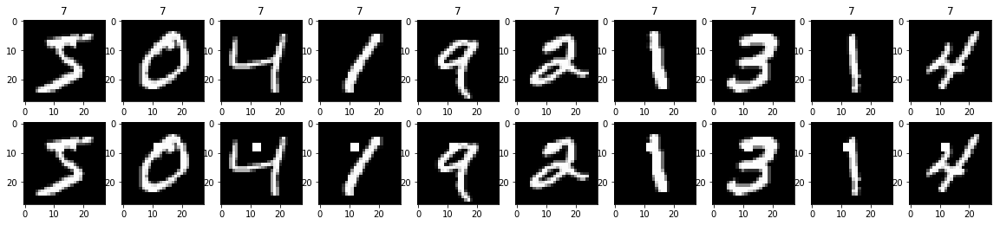

(0.053156424, 0.0012657756598786344)
(0.077921465, 0.002009601429049905)


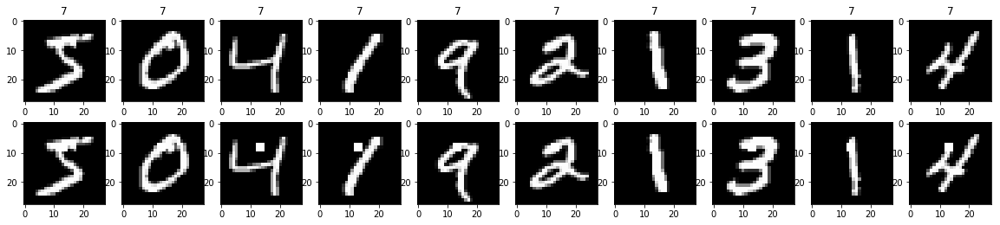

(0.056557864, 0.0004281300026060087)
(0.0780738, 0.0004465780953444234)


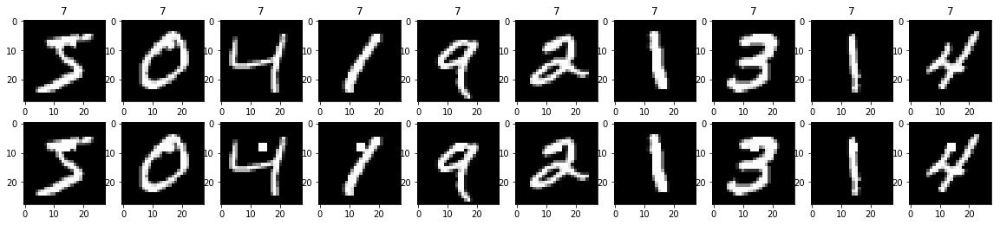

(0.054280434, 0.00020475782733330852)
(0.07314848, 0.0)


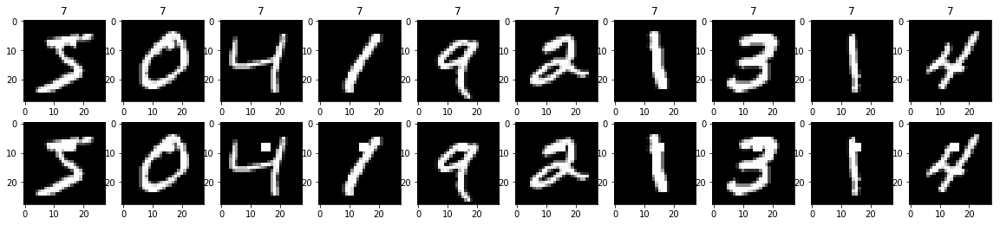

(0.05388445, 0.00016752913145452514)
(0.07251212, 0.0002232890476722117)


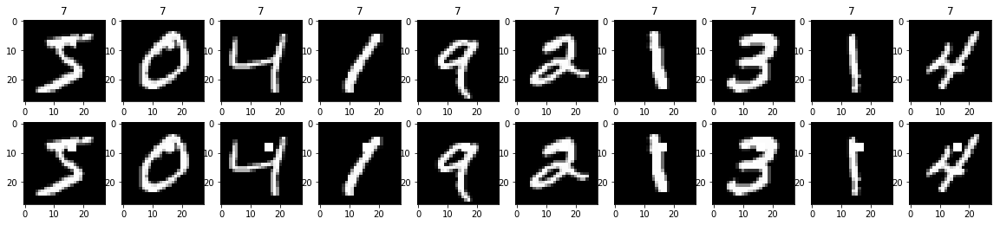

(0.060894415, 0.0003722869587878337)
(0.08575966, 0.0003349335715083175)


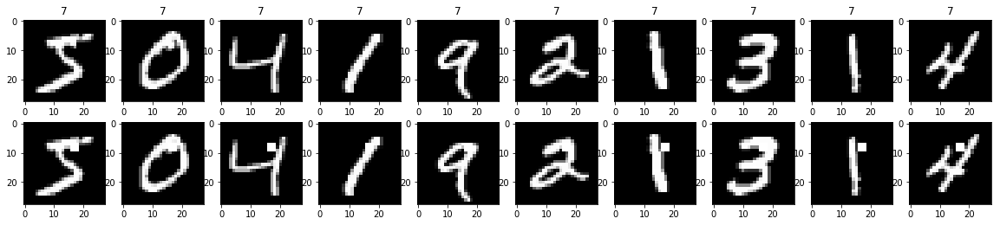

(0.06054781, 0.00039090130672722536)
(0.08936698, 0.0003349335715083175)


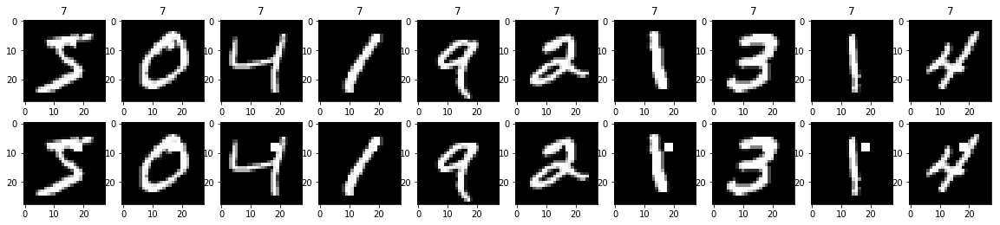

(0.055606406, 0.0004467443505454004)
(0.0864334, 0.0003349335715083175)


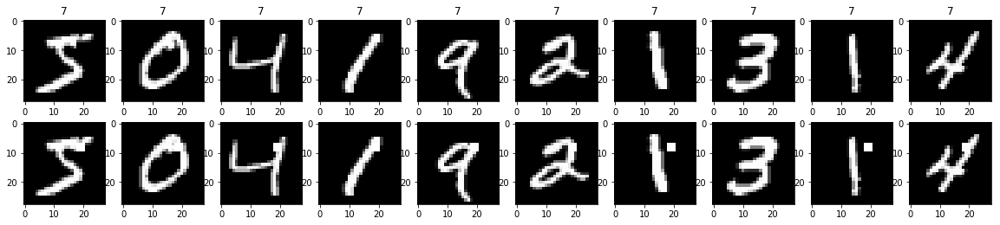

(0.04908939, 0.00046535869848479206)
(0.07761149, 0.0003349335715083175)


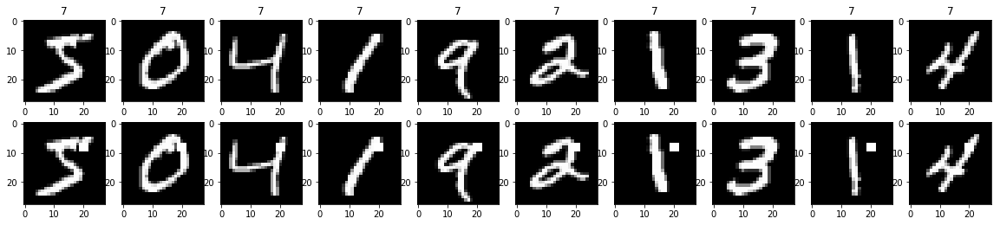

(0.049417112, 0.00048397304642418373)
(0.07806066, 0.00011164452383610584)


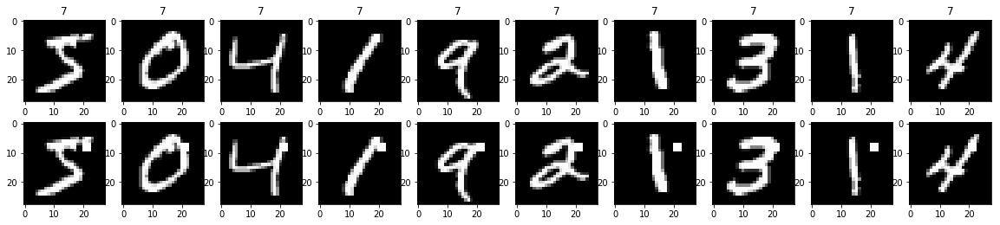

(0.06186069, 0.0007818026134544507)
(0.091409534, 0.0003349335715083175)


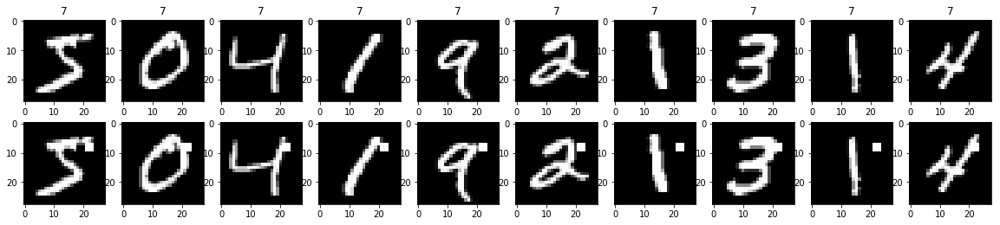

(0.058791008, 0.0008376456572726258)
(0.09097948, 0.0002232890476722117)


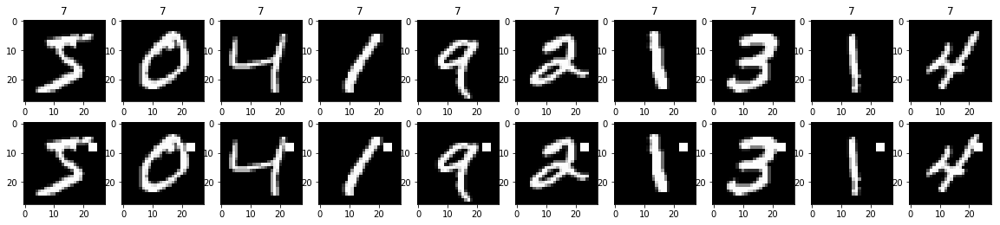

(0.061413933, 0.0007445739175756674)
(0.09408295, 0.0003349335715083175)


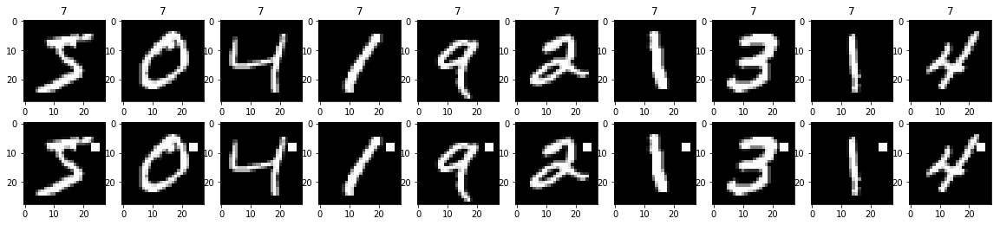

(0.033631947, 0.0005770447861211422)
(0.059516773, 0.0003349335715083175)


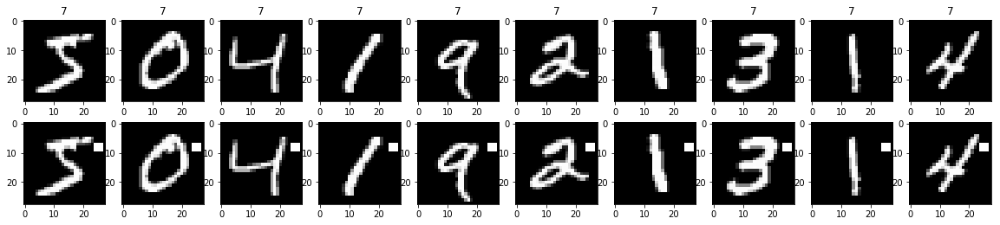

(0.018191008, 0.00040951565466661703)
(0.040302128, 0.00011164452383610584)


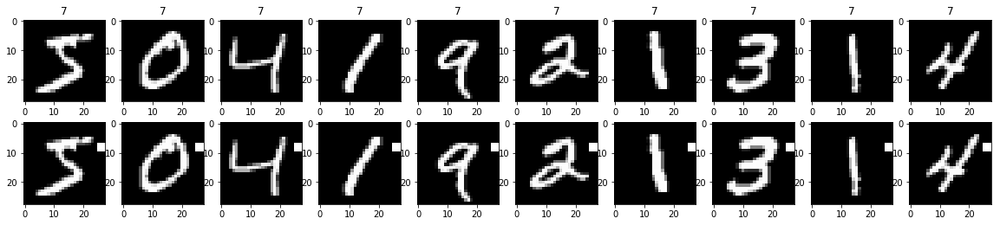

(0.05938429, 0.008469528312423216)
(0.08684537, 0.008373339287707938)


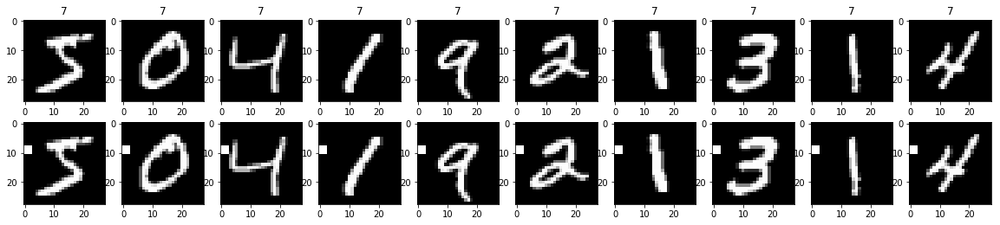

(0.052757397, 0.006031048732362905)
(0.08498434, 0.006363737858658033)


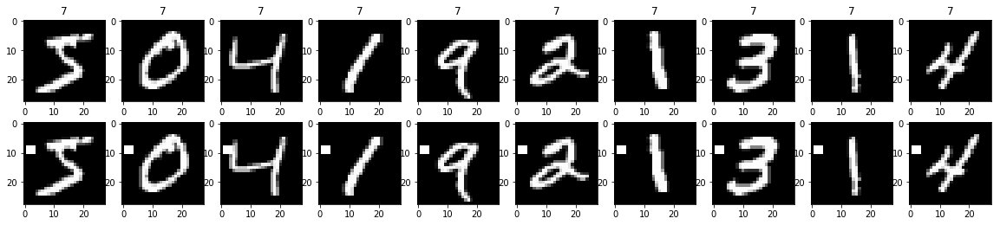

(0.047450166, 0.004672201332787312)
(0.07918804, 0.005693870715641398)


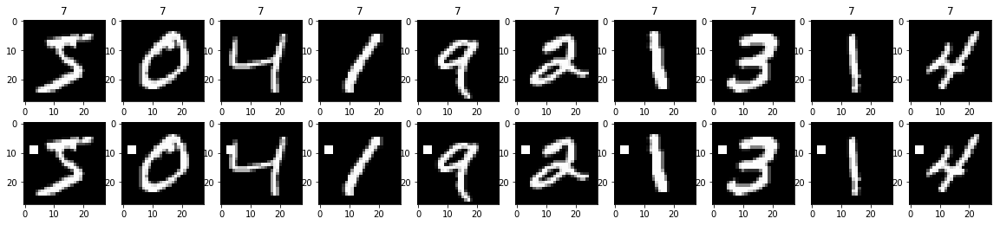

(0.048041042, 0.005137560031272105)
(0.08151409, 0.005917159763313609)


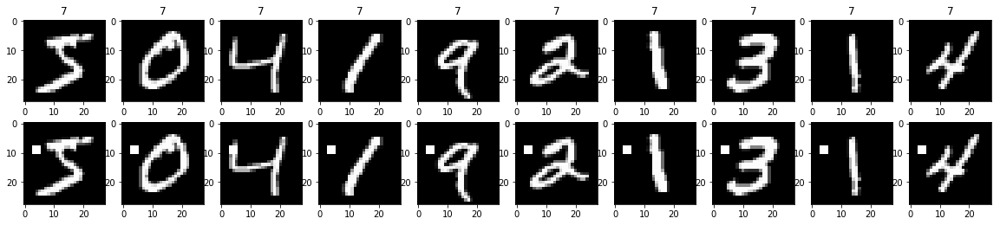

(0.036644097, 0.0034436543687874615)
(0.06502293, 0.00401920285809981)


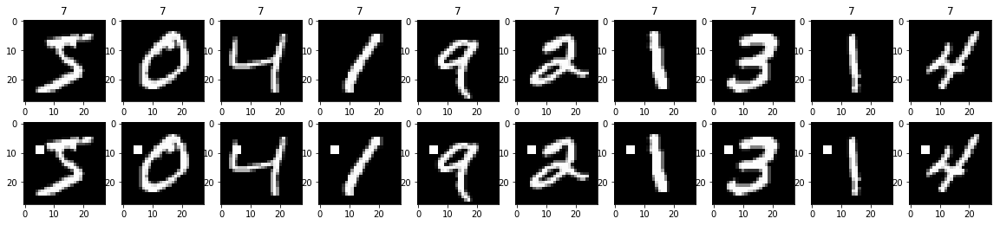

(0.041493256, 0.0038159413275752952)
(0.06575288, 0.004242491905772022)


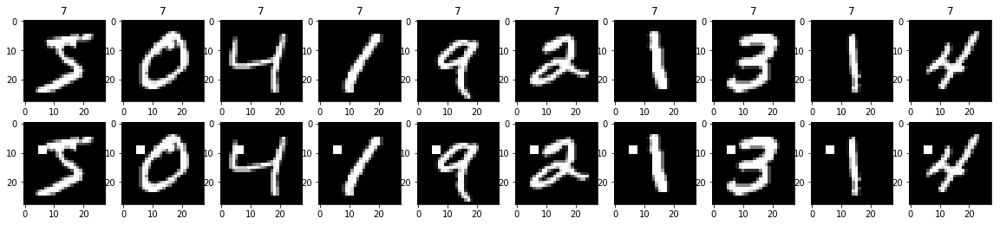

(0.035422068, 0.0021034213171512604)
(0.056620535, 0.0018979569052137992)


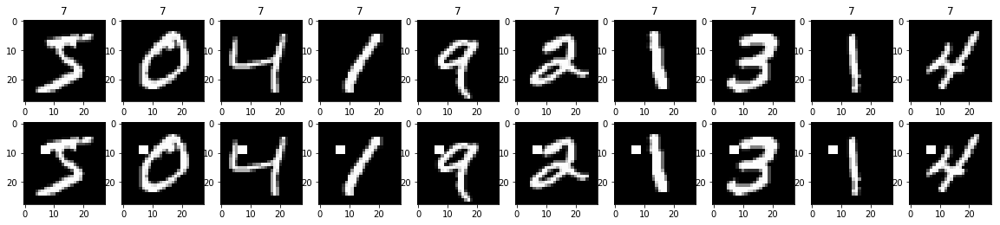

(0.041701276, 0.0035553404564238117)
(0.06135829, 0.0037959138104275984)


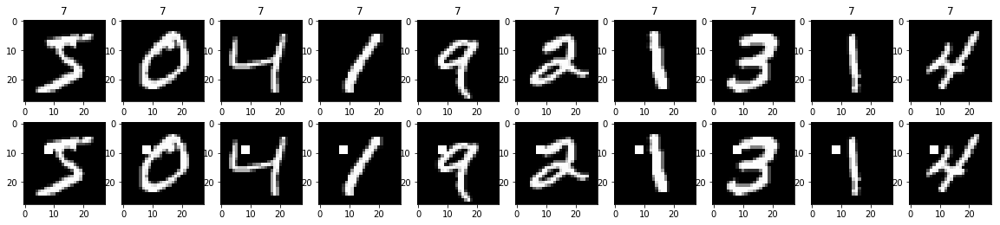

(0.039317574, 0.0028479952347269274)
(0.059527, 0.00267946857206654)


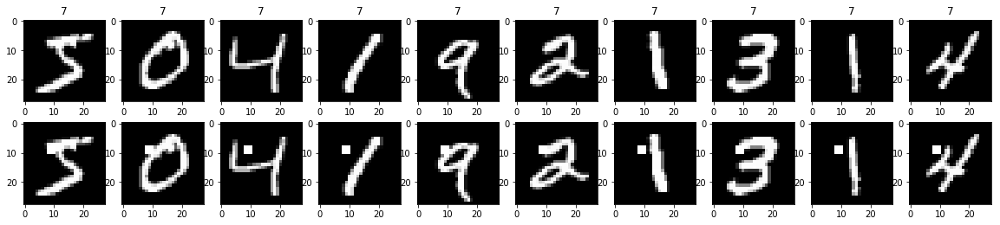

(0.045500915, 0.0025129369718178774)
(0.06696448, 0.0012280897621971642)


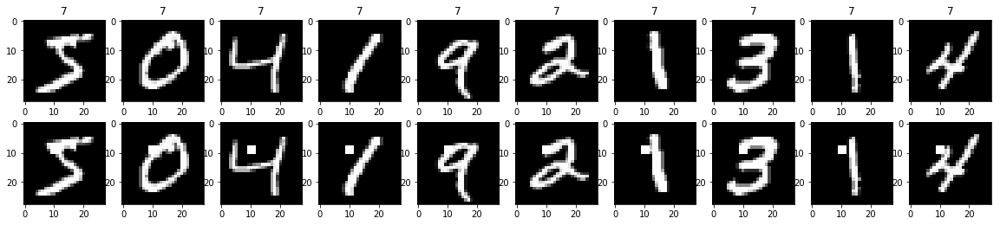

(0.03975087, 0.0014333047913331596)
(0.06241822, 0.0007815116668527409)


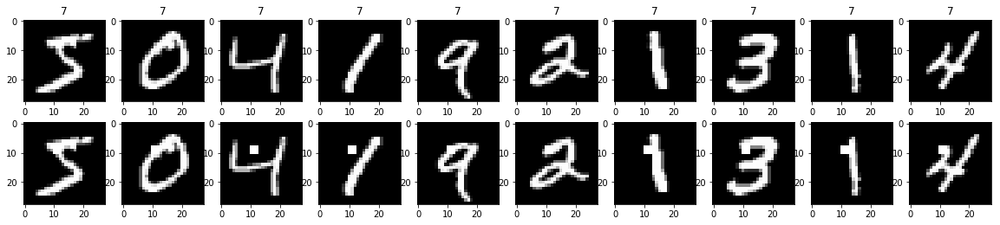

(0.032545157, 0.0007445739175756674)
(0.056314807, 0.0011164452383610583)


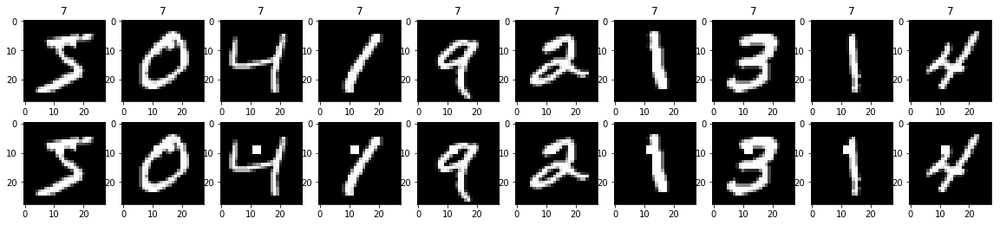

(0.030675732, 0.0003722869587878337)
(0.054486137, 0.0003349335715083175)


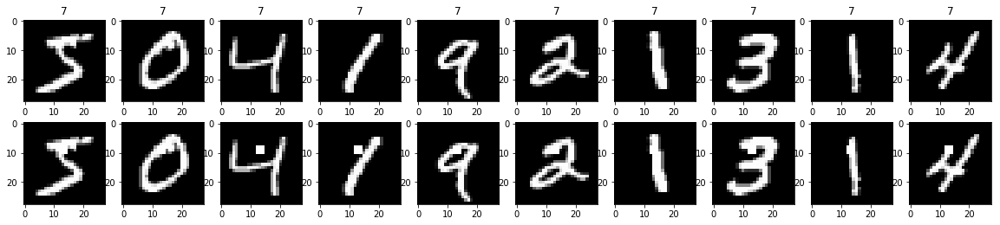

(0.033212975, 0.00026060087115148357)
(0.055911403, 0.0)


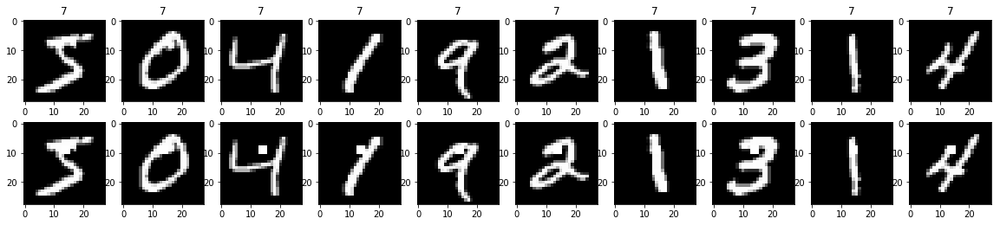

(0.0346851, 0.00018614347939391684)
(0.05572704, 0.00011164452383610584)


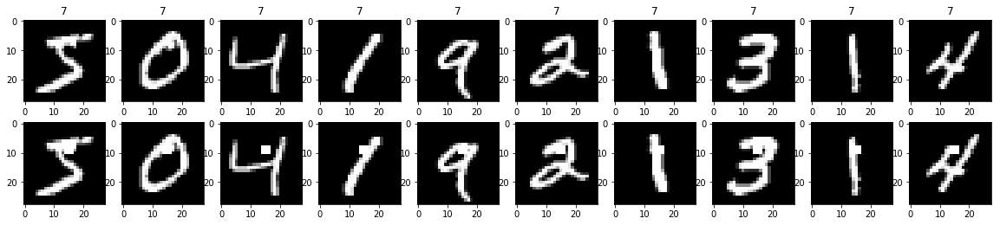

(0.047993675, 0.00020475782733330852)
(0.06970073, 0.0003349335715083175)


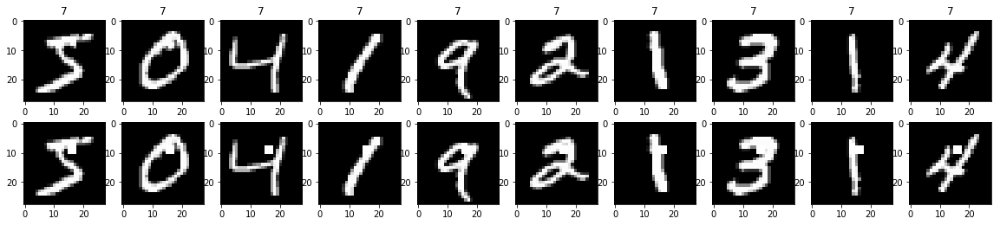

(0.07026947, 0.00027921521909087525)
(0.09353058, 0.0005582226191805292)


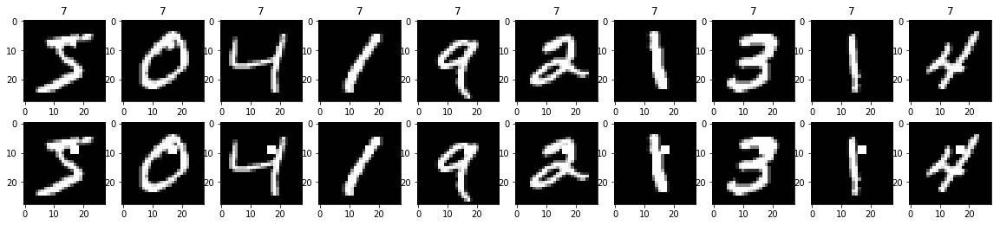

(0.09451847, 0.00039090130672722536)
(0.12257351, 0.0004465780953444234)


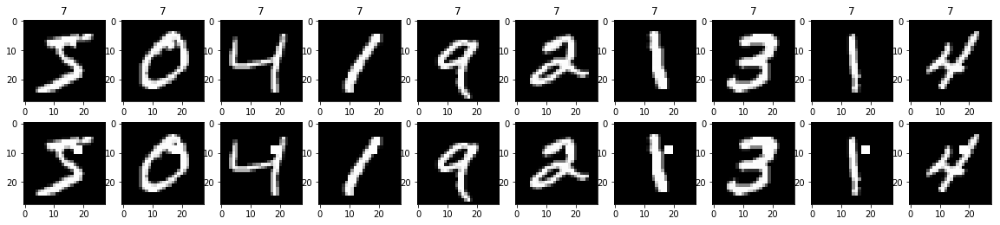

(0.08629041, 0.0004281300026060087)
(0.116853006, 0.0004465780953444234)


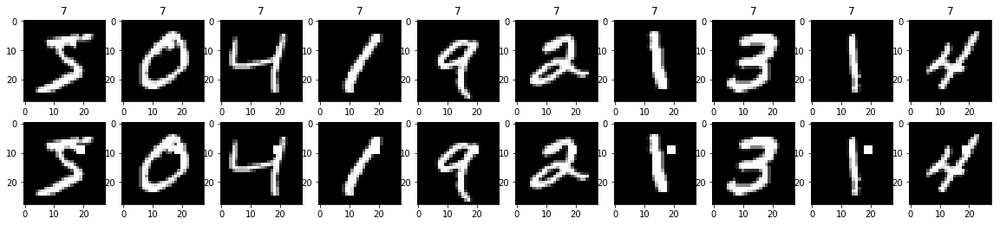

(0.09036377, 0.0004467443505454004)
(0.121490985, 0.0003349335715083175)


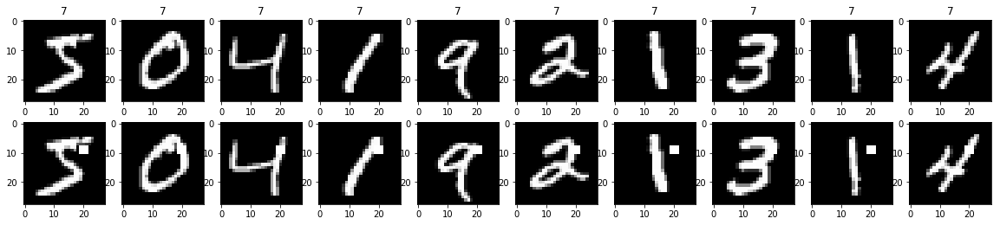

(0.06525223, 0.0006142734819999256)
(0.09401938, 0.0002232890476722117)


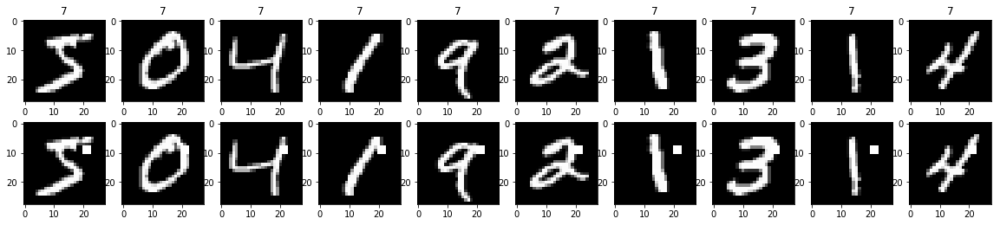

(0.057992768, 0.0007259595696362756)
(0.08710238, 0.0003349335715083175)


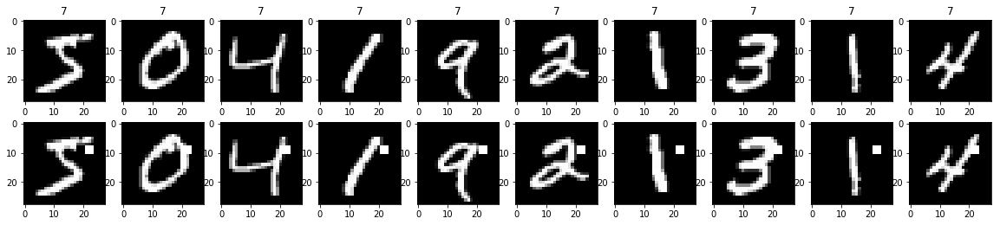

(0.044929698, 0.0007259595696362756)
(0.07331868, 0.0004465780953444234)


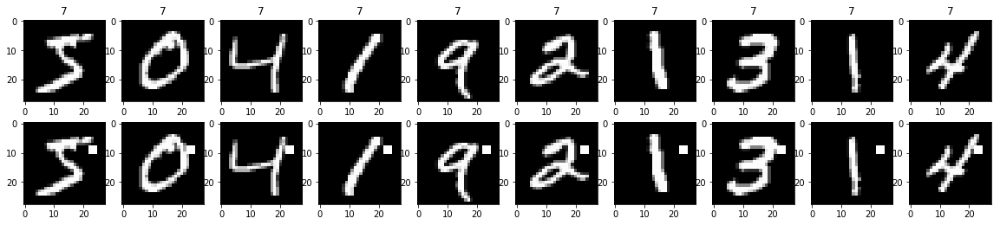

(0.049366575, 0.0006887308737574923)
(0.07723761, 0.0004465780953444234)


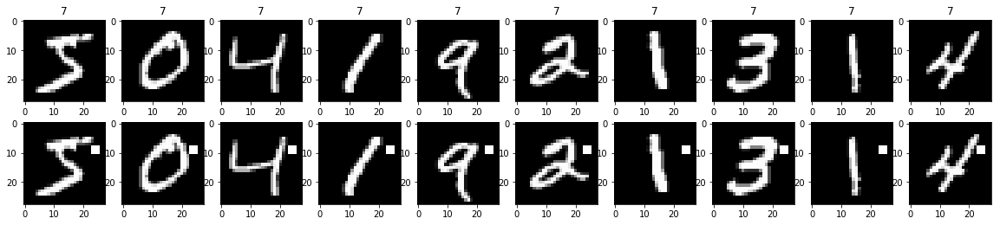

(0.032097563, 0.0006328878299393172)
(0.05499748, 0.0004465780953444234)


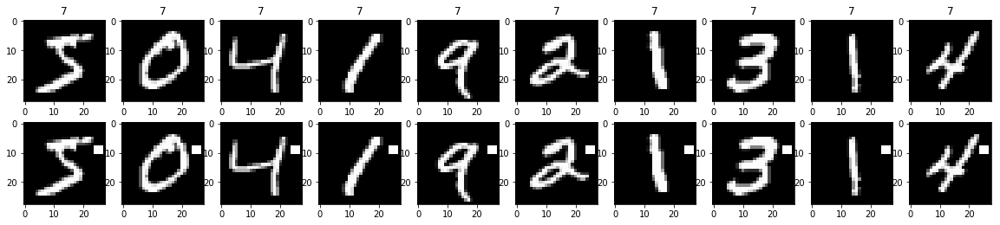

(0.017109672, 0.0004281300026060087)
(0.037642006, 0.00011164452383610584)


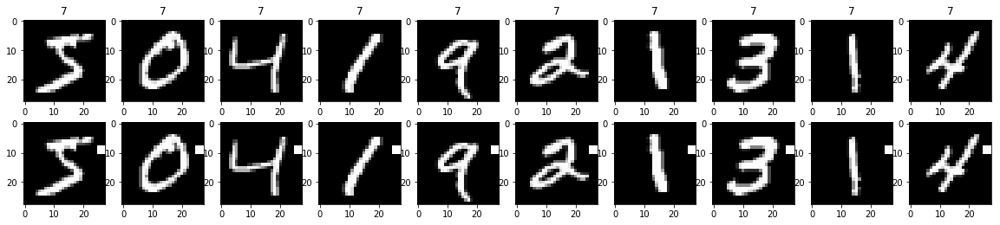

(0.041255634, 0.006124120472059864)
(0.0676897, 0.006921960477838562)


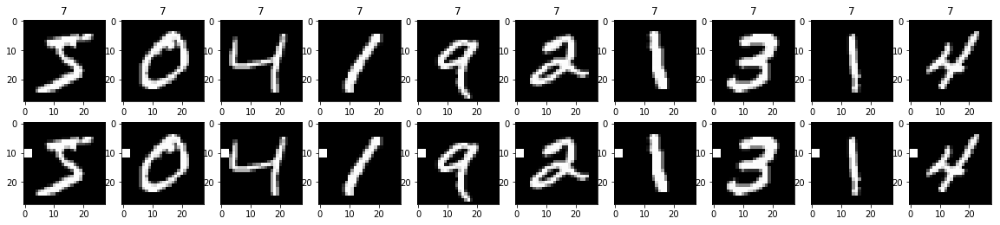

(0.045804765, 0.0065522504746658725)
(0.07533758, 0.006921960477838562)


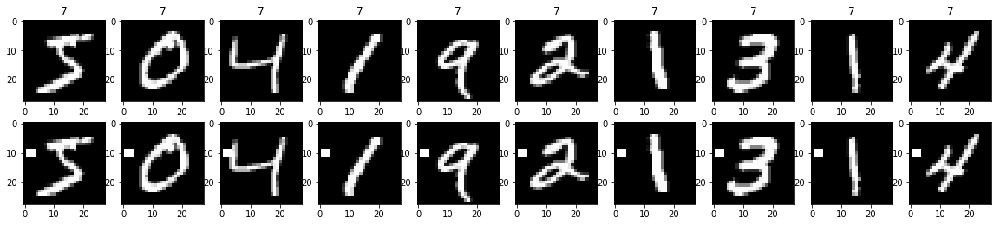

(0.048853368, 0.005844905252968989)
(0.08070431, 0.006921960477838562)


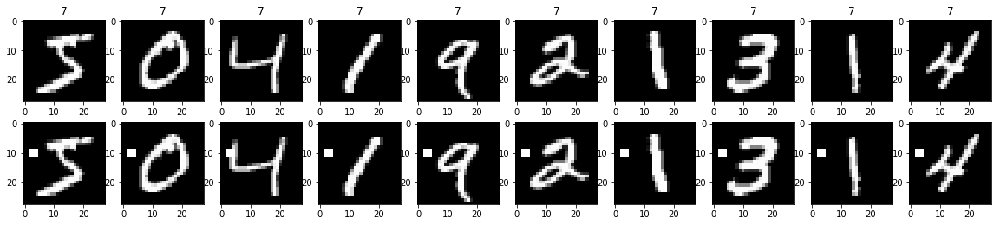

(0.040920634, 0.004802501768363054)
(0.07262419, 0.006028804287149715)


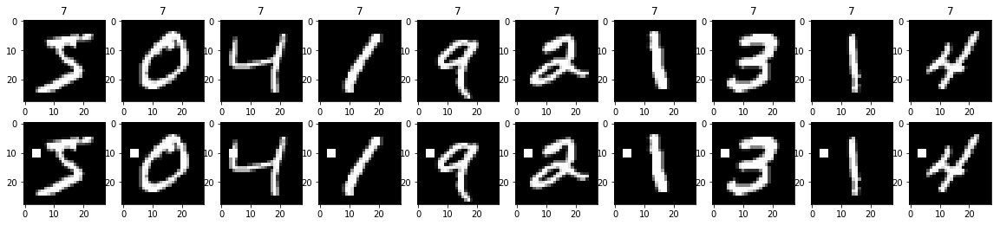

(0.037717663, 0.003927627415211645)
(0.063881025, 0.00457742547728034)


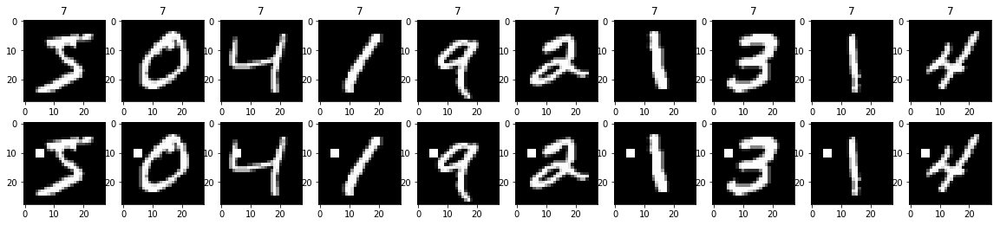

(0.039644483, 0.0034808830646662447)
(0.06308834, 0.003460980238919281)


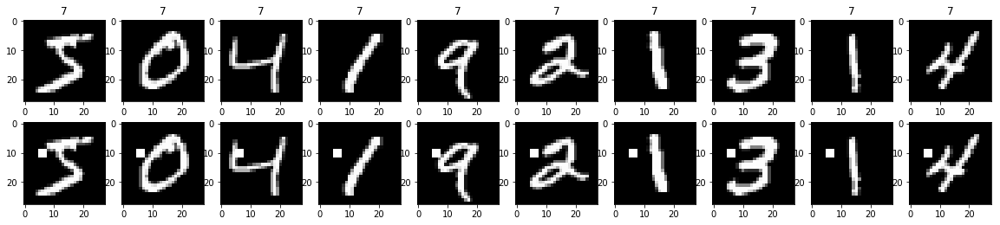

(0.035863325, 0.002308179144484569)
(0.055934995, 0.0024561795243943285)


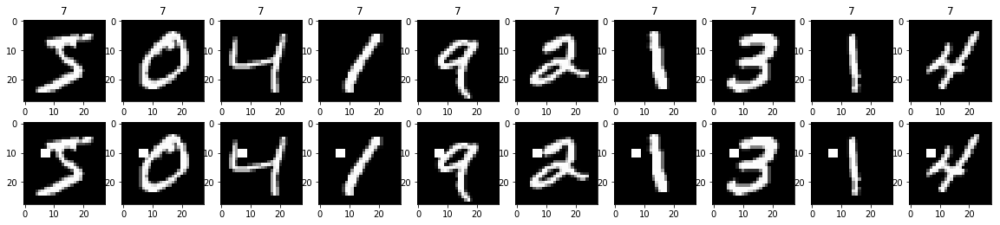

(0.03569081, 0.0020289639253936935)
(0.054676447, 0.0016746678575415876)


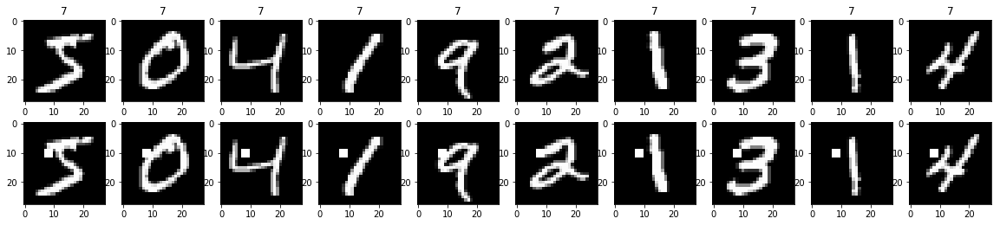

(0.042891286, 0.0020289639253936935)
(0.0633534, 0.0011164452383610583)


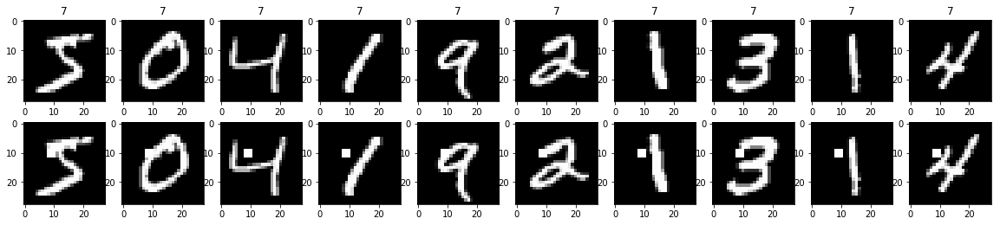

(0.046706587, 0.001582219574848293)
(0.06882572, 0.0008931561906888468)


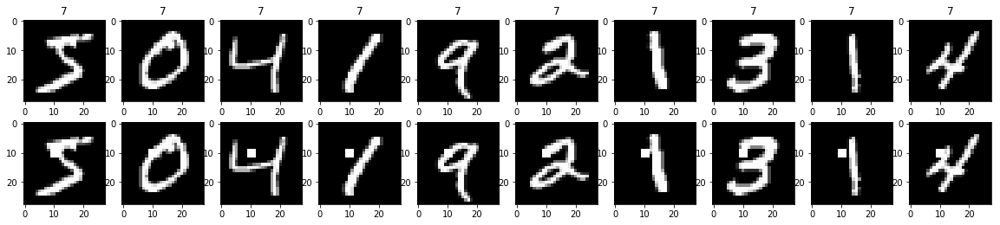

(0.04388244, 0.0006328878299393172)
(0.06811548, 0.0004465780953444234)


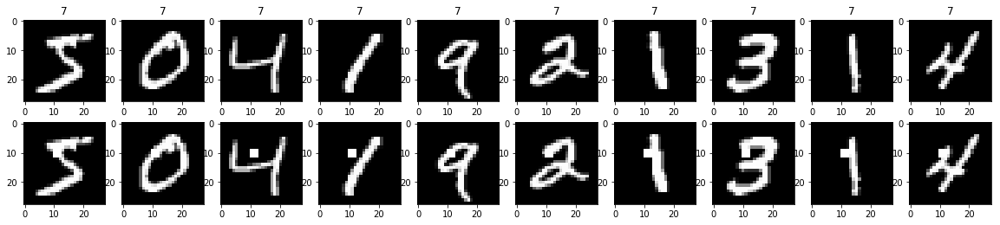

(0.02713278, 0.0002978295670302669)
(0.051052913, 0.0003349335715083175)


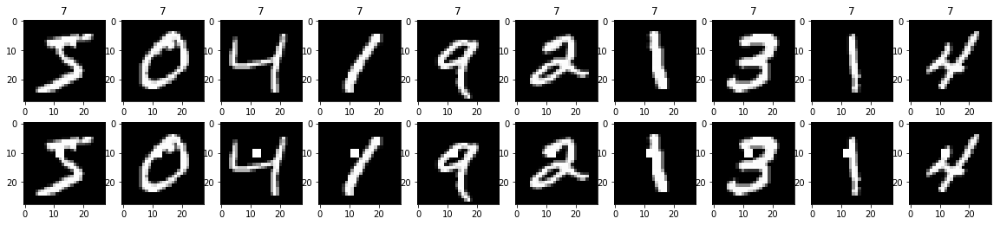

(0.024096455, 0.00020475782733330852)
(0.047872405, 0.00011164452383610584)


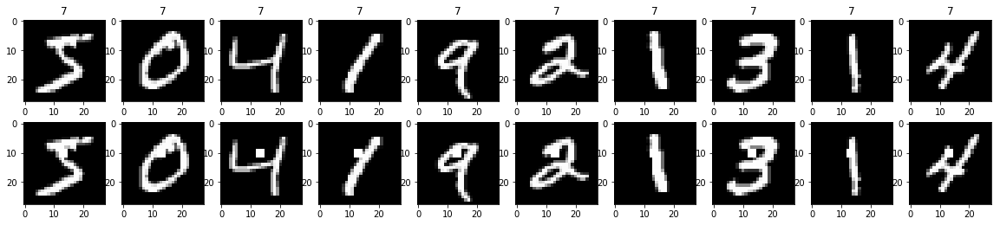

(0.025193539, 0.00018614347939391684)
(0.04805542, 0.00011164452383610584)


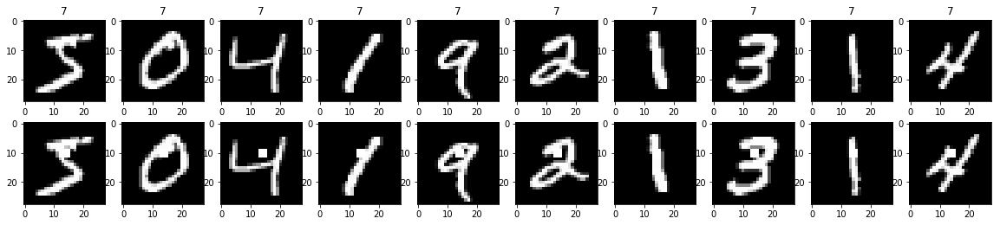

(0.028693572, 0.00016752913145452514)
(0.051044766, 0.00011164452383610584)


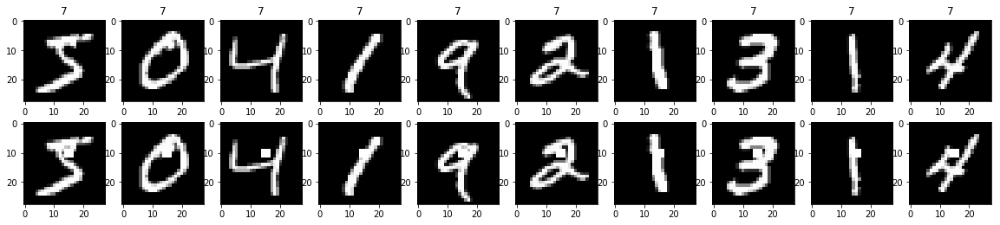

(0.040228512, 0.00016752913145452514)
(0.06412443, 0.0003349335715083175)


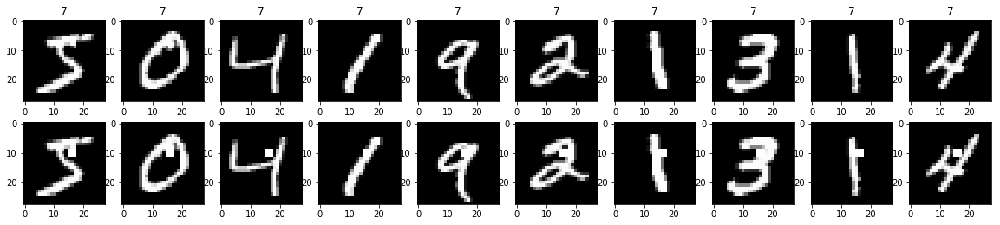

(0.07016652, 0.0002978295670302669)
(0.09501936, 0.0005582226191805292)


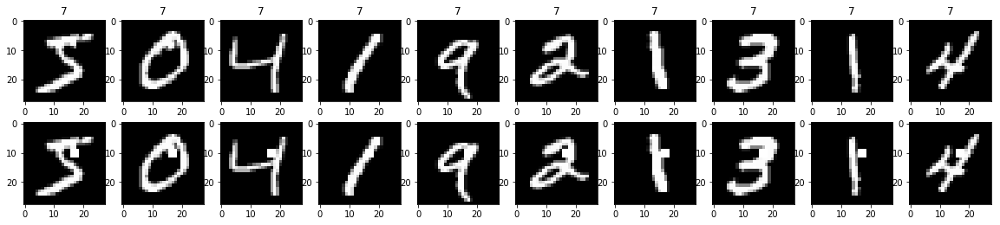

(0.10302024, 0.00039090130672722536)
(0.13042171, 0.0004465780953444234)


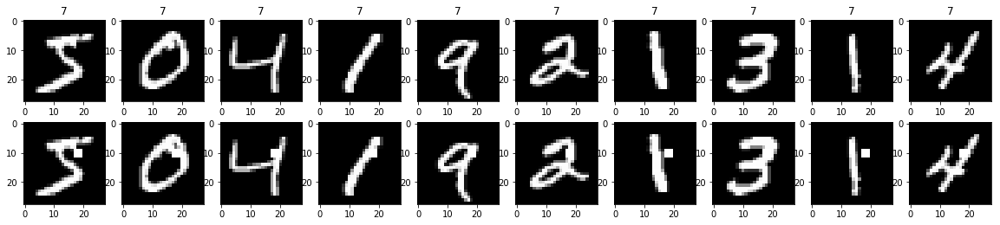

(0.10785557, 0.00046535869848479206)
(0.13863054, 0.0005582226191805292)


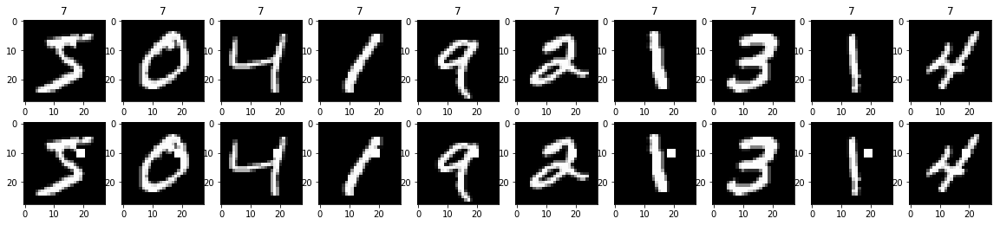

(0.11578325, 0.00040951565466661703)
(0.14669752, 0.0005582226191805292)


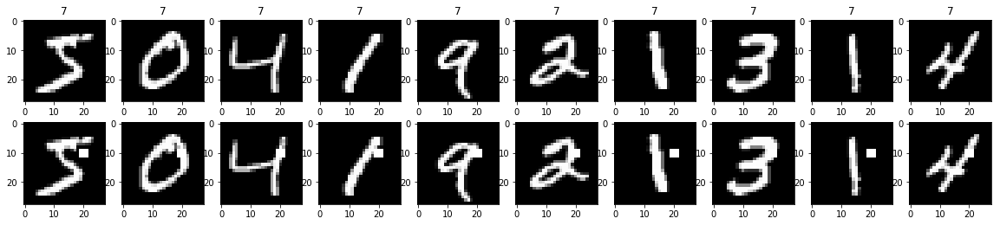

(0.074839056, 0.0005025873943635754)
(0.10269601, 0.0003349335715083175)


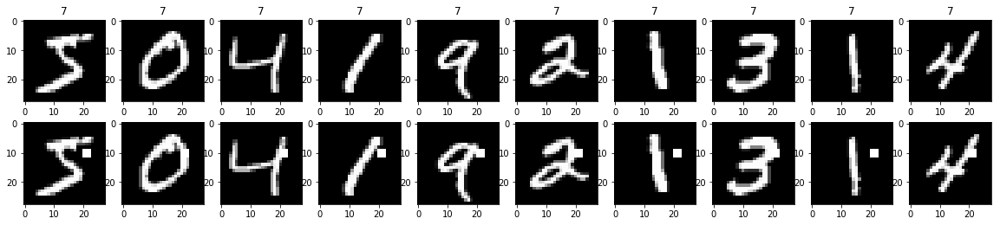

(0.06479388, 0.0006328878299393172)
(0.092624135, 0.0003349335715083175)


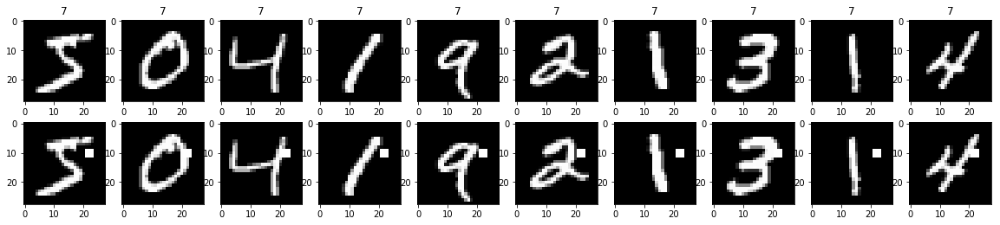

(0.042555925, 0.0004281300026060087)
(0.06964515, 0.00011164452383610584)


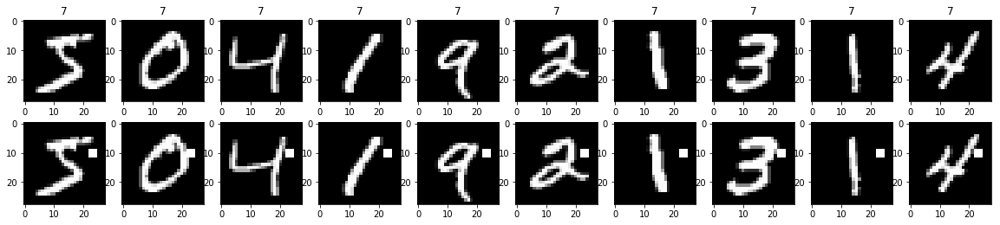

(0.036332086, 0.0005025873943635754)
(0.061128754, 0.0003349335715083175)


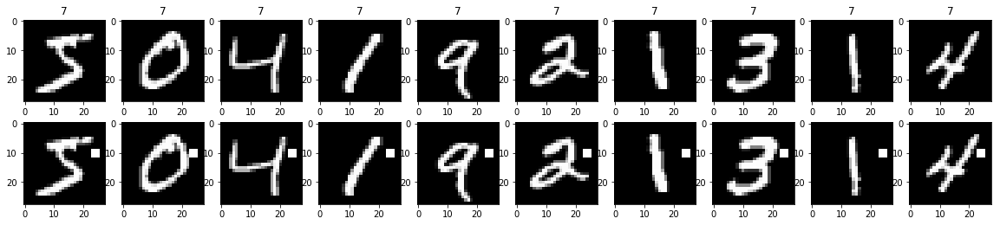

(0.025455432, 0.0005212017423029671)
(0.04636586, 0.0003349335715083175)


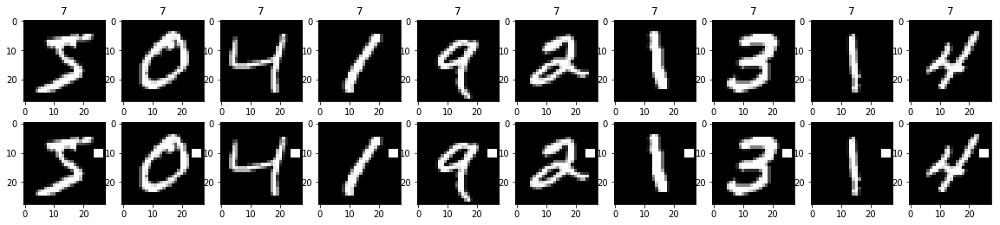

(0.016146531, 0.00024198652321209187)
(0.036272828, 0.0)


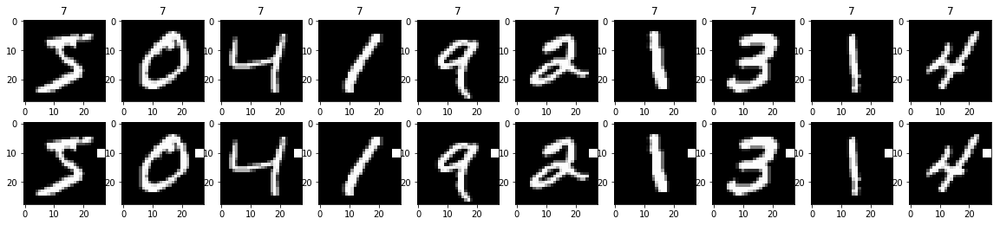

(0.03385869, 0.005025873943635755)
(0.060530975, 0.006140448810985821)


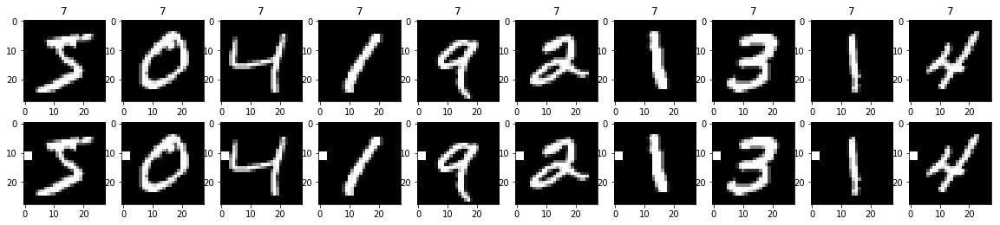

(0.042087127, 0.0073712817839991064)
(0.0696916, 0.008150050240035726)


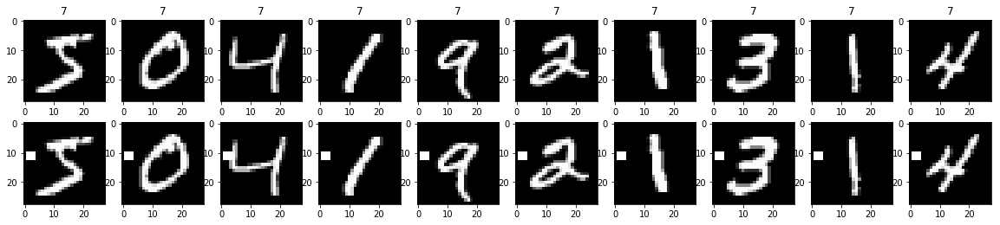

(0.03876802, 0.0054540039462417636)
(0.06581271, 0.0065870269063302445)


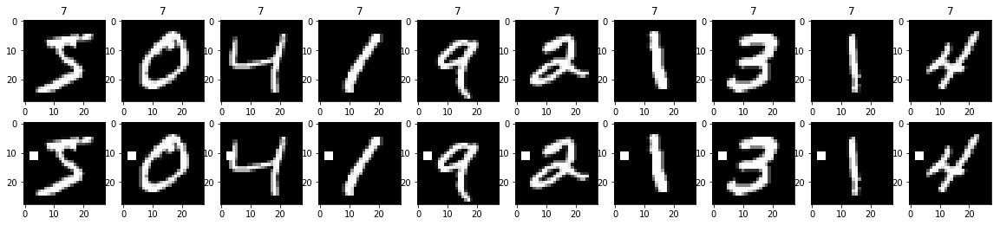

(0.037102483, 0.004914187855999405)
(0.06228521, 0.005693870715641398)


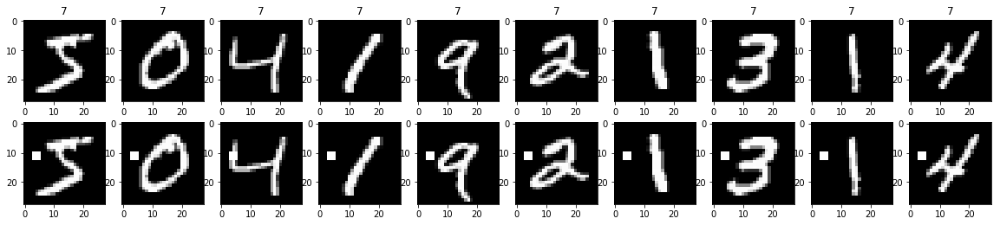

(0.033841606, 0.003350582629090503)
(0.056173034, 0.003460980238919281)


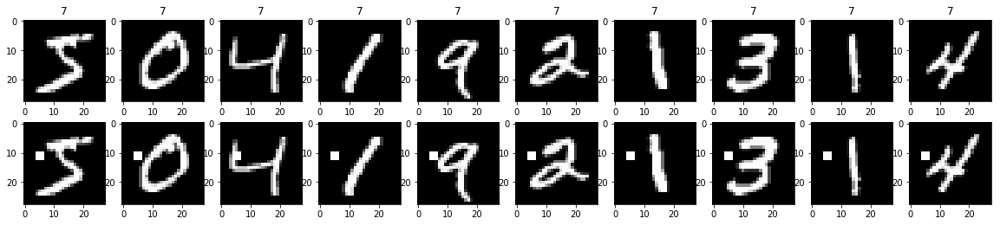

(0.03611734, 0.002289564796545177)
(0.057100493, 0.0015630233337054818)


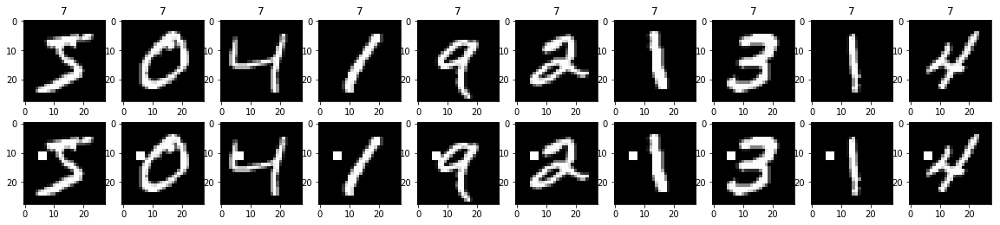

(0.033622693, 0.0010051747887271508)
(0.05349764, 0.0005582226191805292)


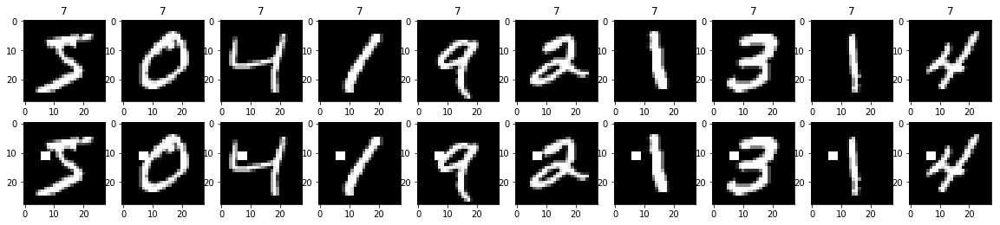

(0.03811757, 0.0010051747887271508)
(0.05641026, 0.0004465780953444234)


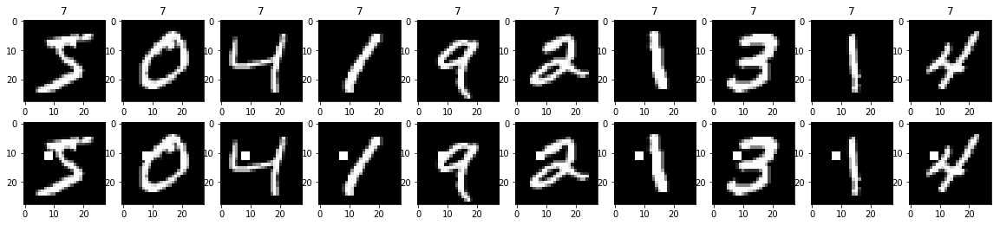

(0.04059942, 0.0007445739175756674)
(0.060688373, 0.0004465780953444234)


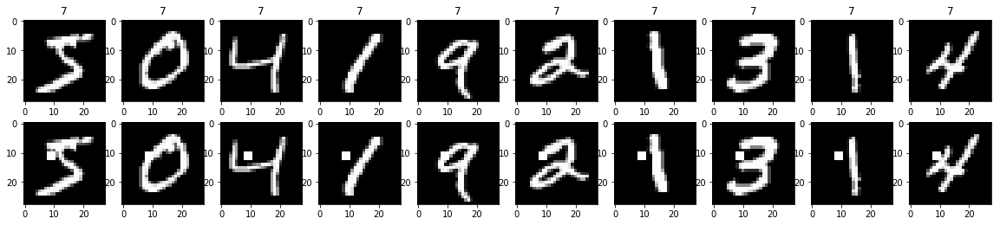

(0.05281435, 0.0004467443505454004)
(0.07706494, 0.0003349335715083175)


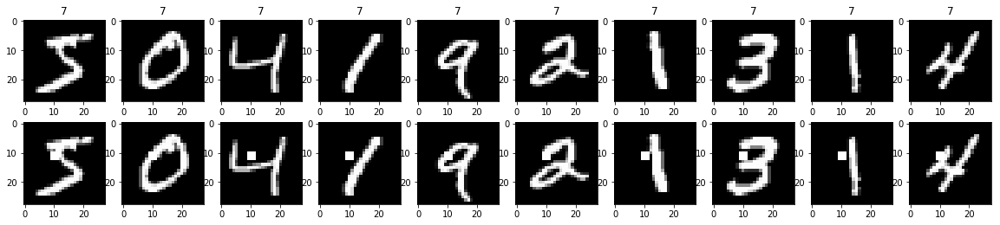

(0.03957524, 0.00020475782733330852)
(0.06438086, 0.0)


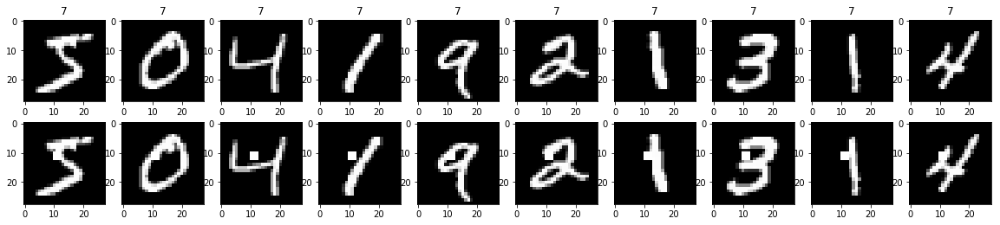

(0.029503942, 5.584304381817505e-05)
(0.052844245, 0.0)


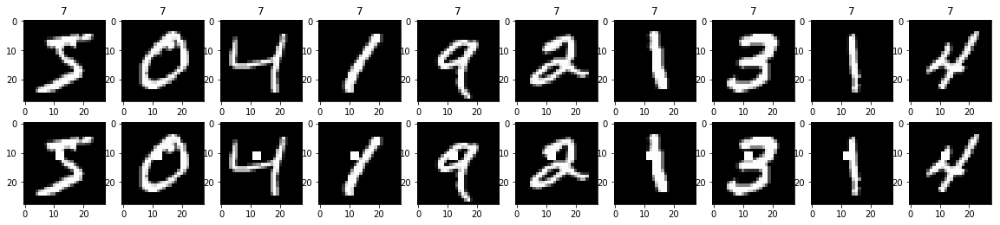

(0.02584072, 3.7228695878783365e-05)
(0.046818316, 0.0)


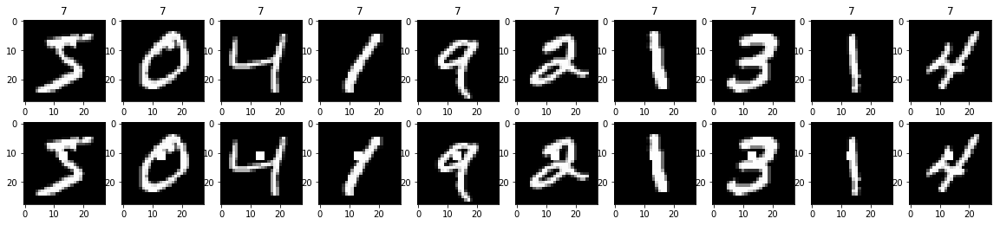

(0.024693254, 7.445739175756673e-05)
(0.044177096, 0.0)


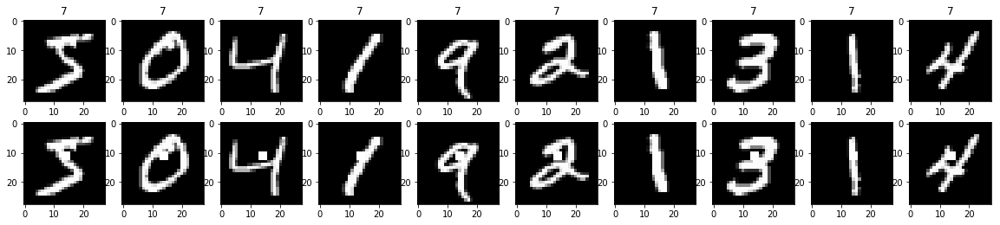

(0.022930542, 5.584304381817505e-05)
(0.04322932, 0.00011164452383610584)


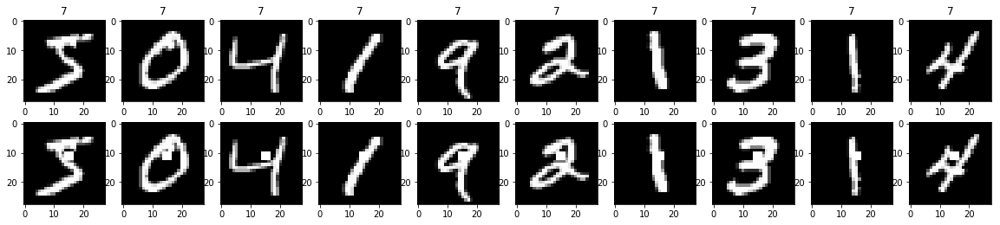

(0.026419459, 0.0001116860876363501)
(0.0489346, 0.0002232890476722117)


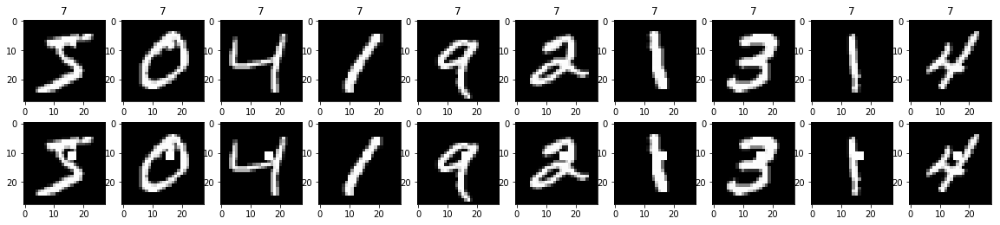

(0.043282207, 0.00016752913145452514)
(0.0681776, 0.0003349335715083175)


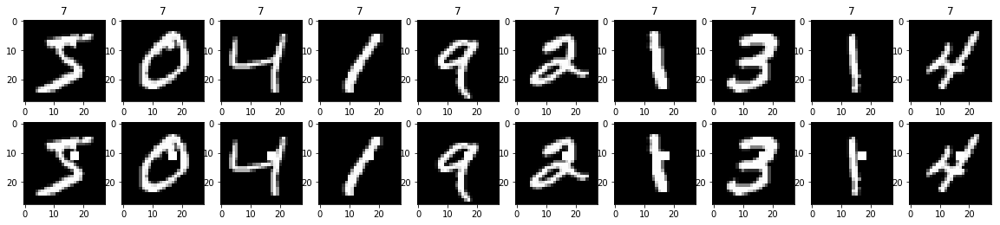

(0.059471924, 0.0003350582629090503)
(0.0850986, 0.0003349335715083175)


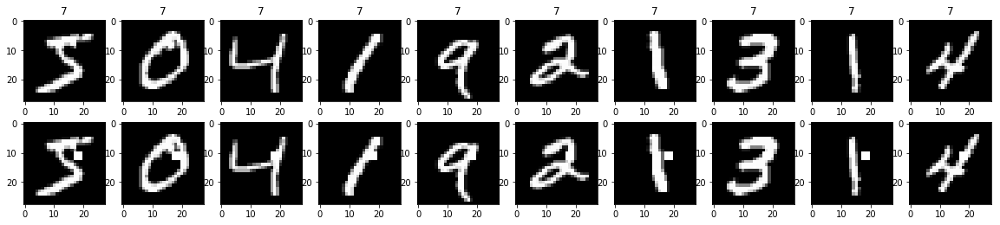

(0.06726947, 0.000353672610848442)
(0.09587468, 0.0004465780953444234)


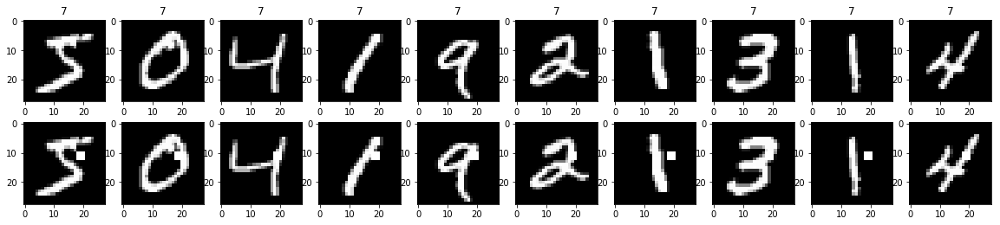

(0.07270289, 0.0003350582629090503)
(0.102190845, 0.0003349335715083175)


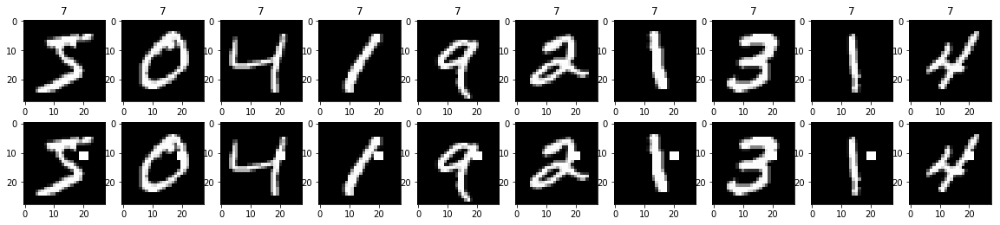

(0.057677016, 0.0003164439149696586)
(0.08443533, 0.0005582226191805292)


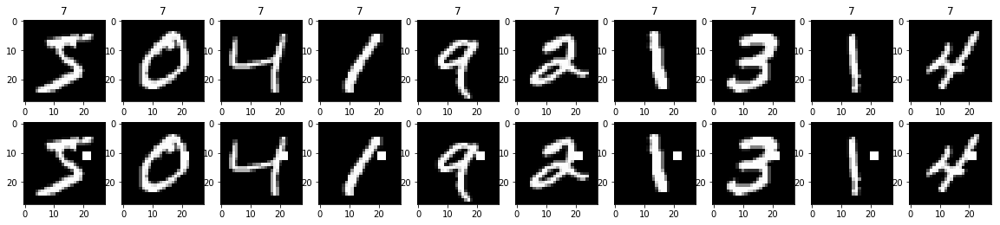

(0.044771917, 0.0004281300026060087)
(0.06918844, 0.0003349335715083175)


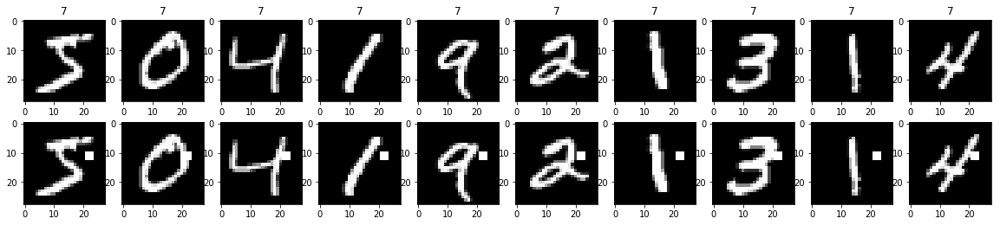

(0.034058202, 0.00027921521909087525)
(0.057287797, 0.0)


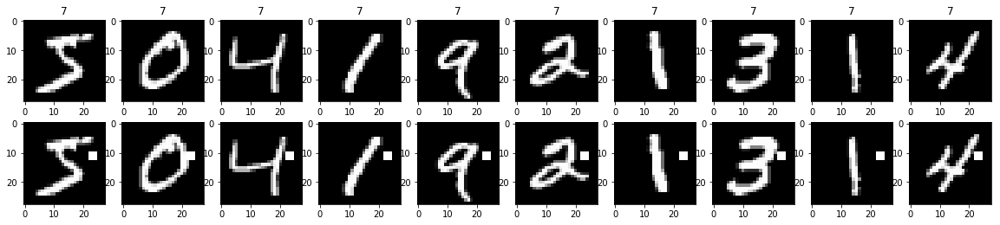

(0.030892683, 0.00026060087115148357)
(0.051567916, 0.00011164452383610584)


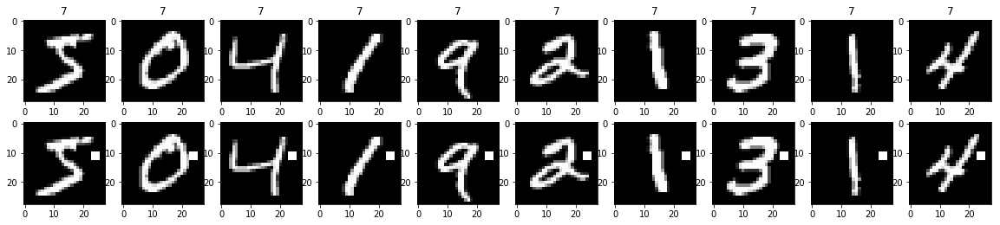

(0.02457159, 0.0003164439149696586)
(0.042649016, 0.0)


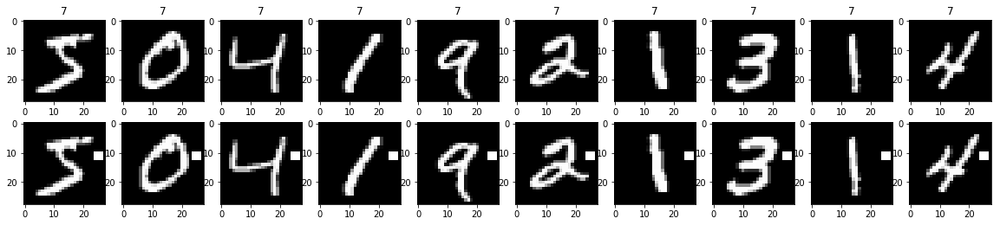

(0.015186161, 0.00020475782733330852)
(0.03435782, 0.0)


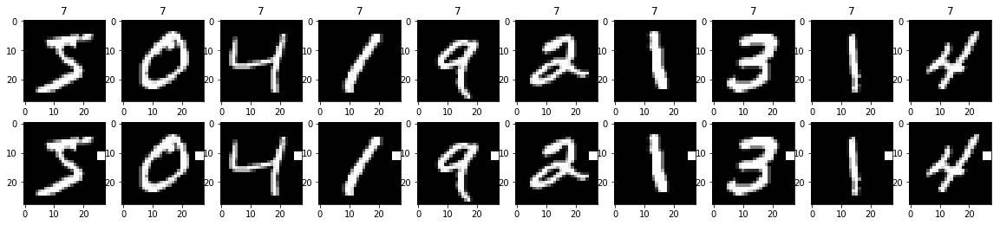

(0.03022365, 0.004690815680726704)
(0.054199737, 0.005247292620296974)


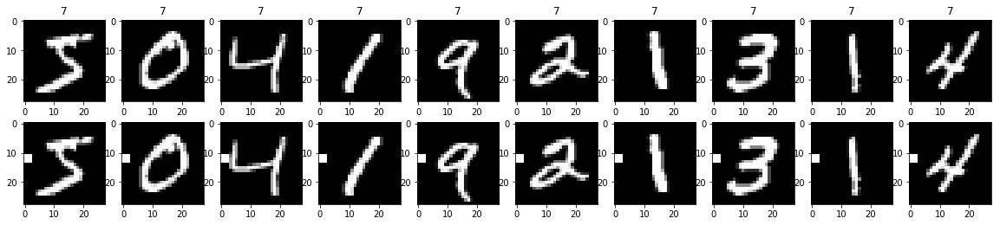

(0.039218597, 0.006626707866423439)
(0.063071094, 0.007033605001674668)


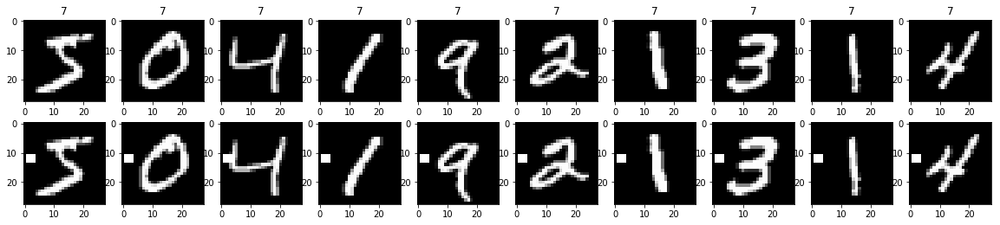

(0.03446467, 0.0054540039462417636)
(0.05720929, 0.006028804287149715)


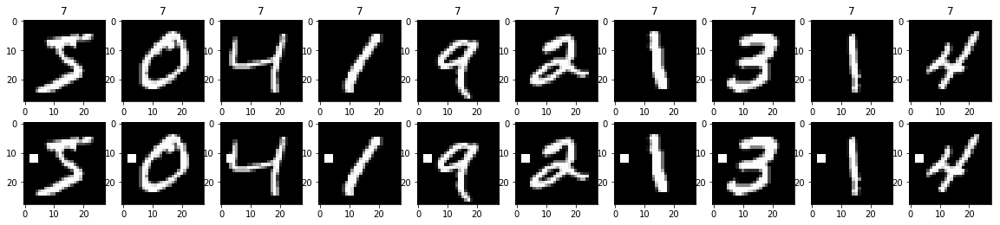

(0.03470043, 0.004728044376605488)
(0.055478413, 0.004912359048788657)


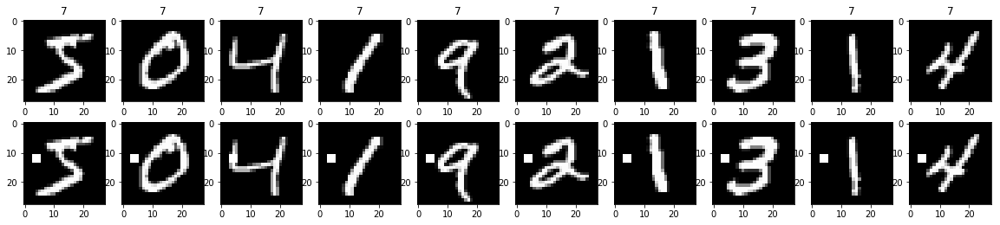

(0.029717134, 0.0021406500130300436)
(0.04934979, 0.002009601429049905)


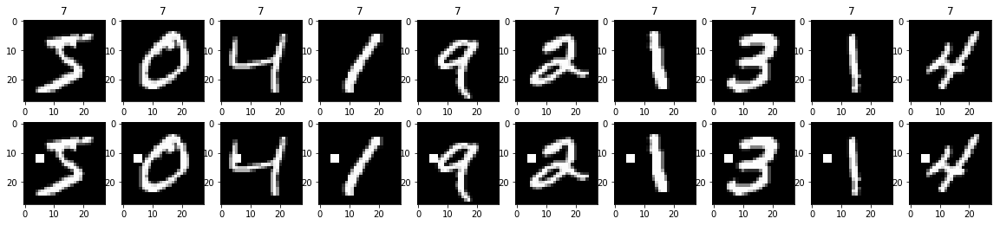

(0.027948031, 0.0008748743531514091)
(0.048384212, 0.000669867143016635)


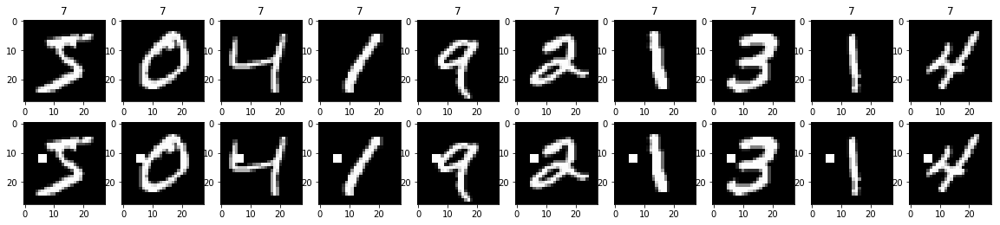

(0.033234034, 0.0006142734819999256)
(0.0524478, 0.0005582226191805292)


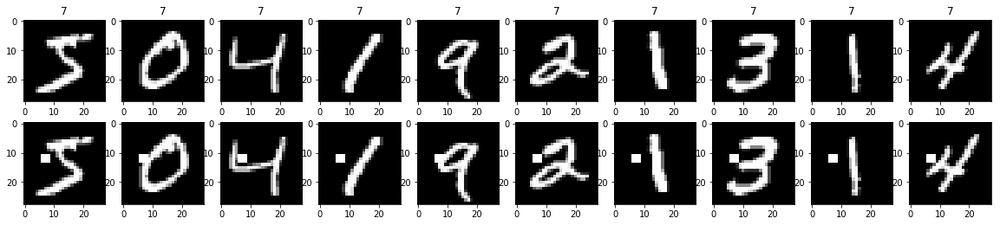

(0.033606496, 0.0005956591340605338)
(0.053819753, 0.0003349335715083175)


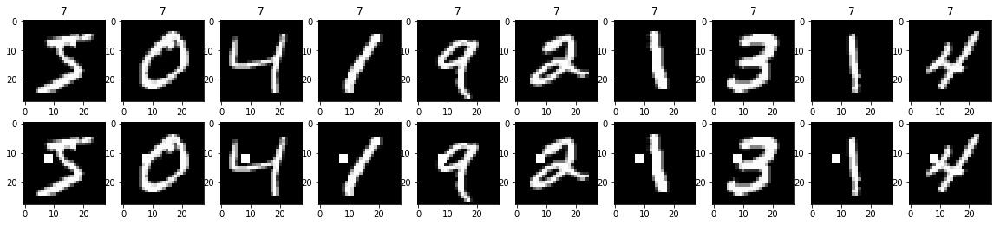

(0.05120977, 0.0005398160902423588)
(0.07790436, 0.0003349335715083175)


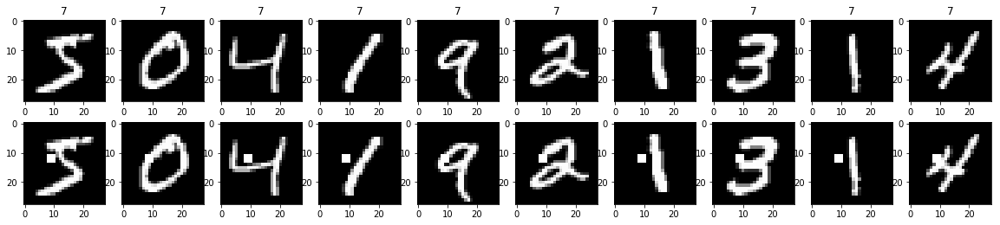

(0.044472903, 0.00027921521909087525)
(0.07305157, 0.00011164452383610584)


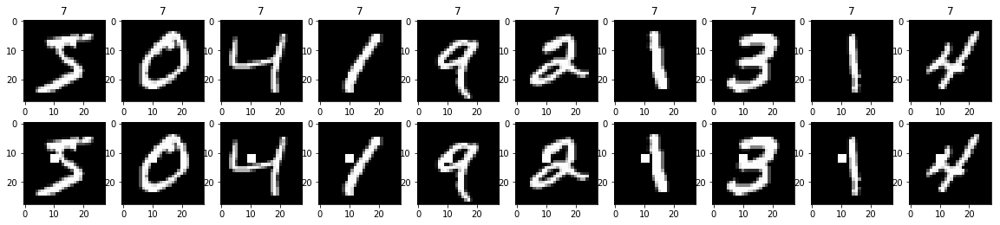

(0.04597978, 7.445739175756673e-05)
(0.07450281, 0.0)


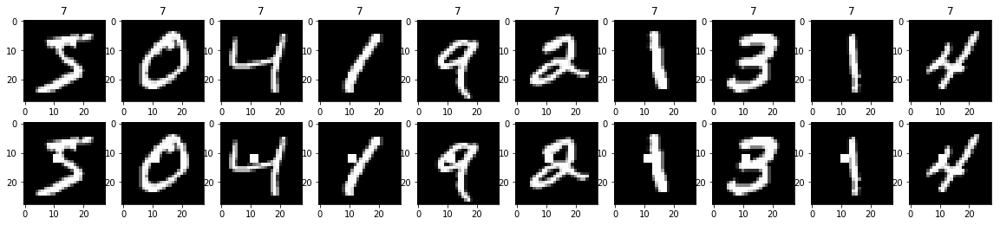

(0.033294804, 0.0)
(0.057095025, 0.0)


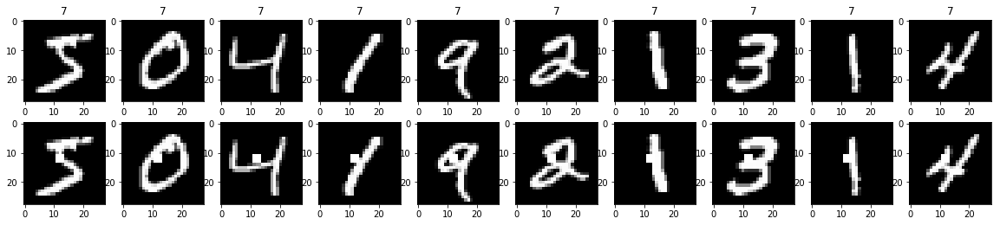

(0.030184573, 1.8614347939391683e-05)
(0.048867386, 0.0)


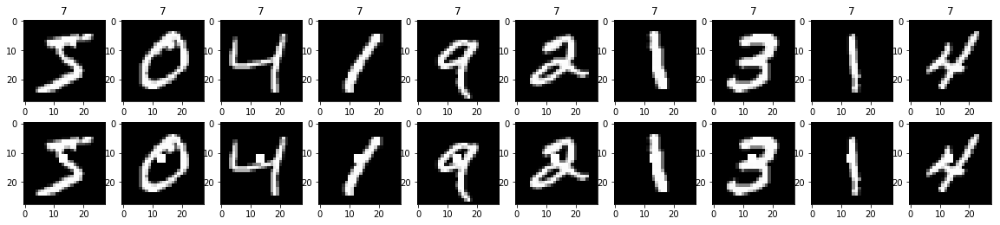

(0.027122553, 1.8614347939391683e-05)
(0.045042112, 0.0)


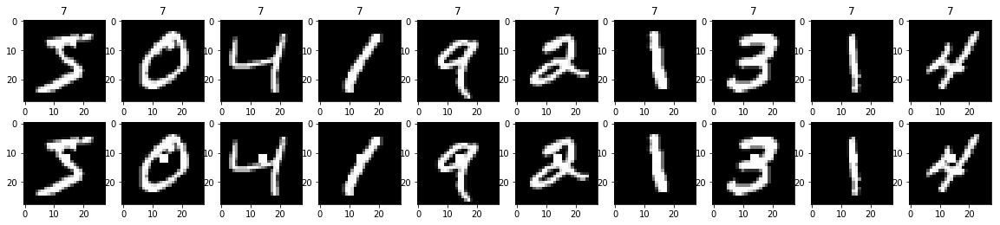

(0.02466148, 3.7228695878783365e-05)
(0.04353885, 0.0002232890476722117)


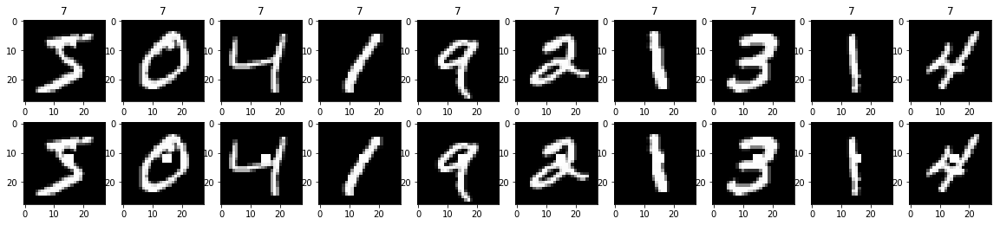

(0.022506578, 7.445739175756673e-05)
(0.0438665, 0.0002232890476722117)


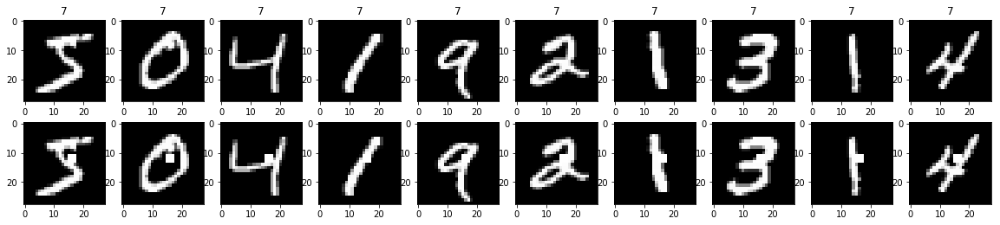

(0.029483391, 0.00014891478351513346)
(0.053335078, 0.0002232890476722117)


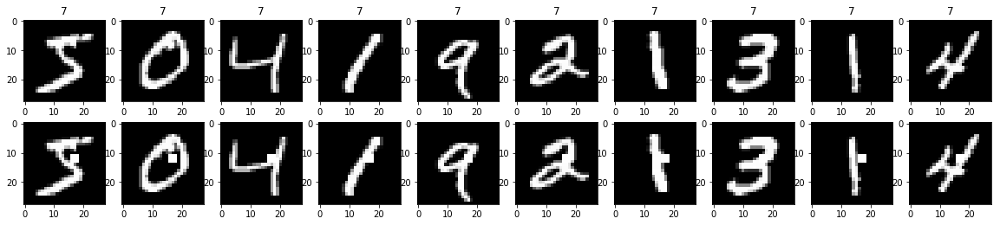

(0.038777642, 0.00027921521909087525)
(0.063626796, 0.0002232890476722117)


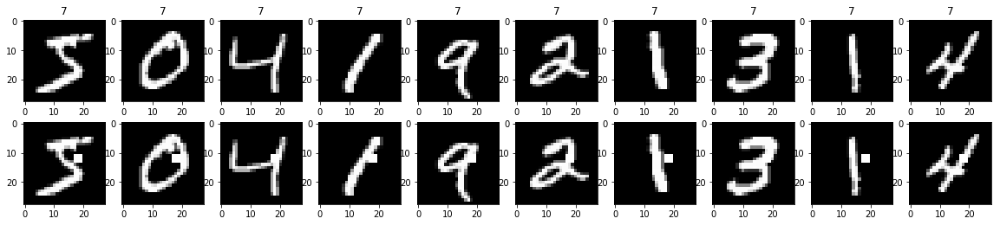

(0.044310104, 0.0004281300026060087)
(0.066983216, 0.0005582226191805292)


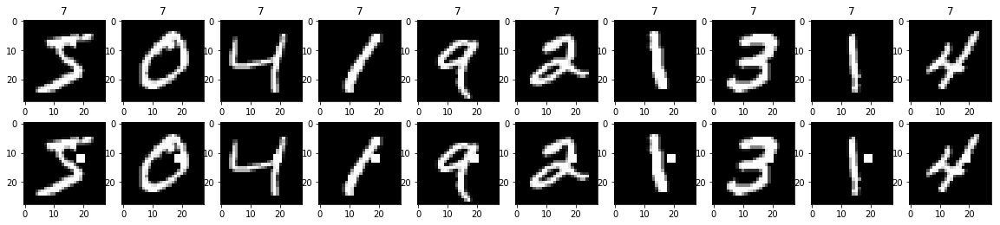

(0.051192973, 0.00039090130672722536)
(0.07371046, 0.0005582226191805292)


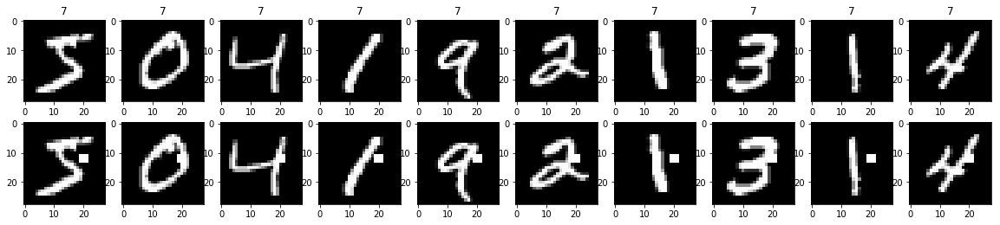

(0.043184955, 0.0002978295670302669)
(0.06660699, 0.0005582226191805292)


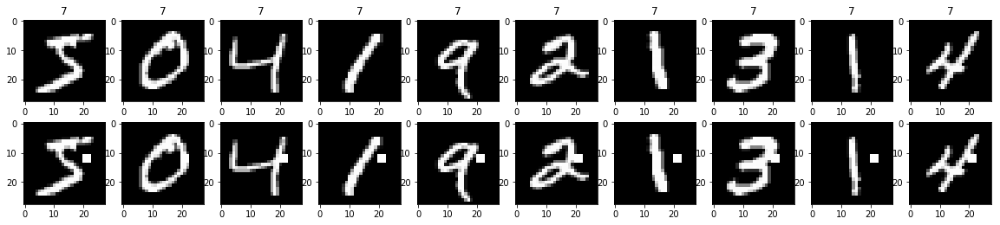

(0.044882204, 0.0004467443505454004)
(0.066707045, 0.0005582226191805292)


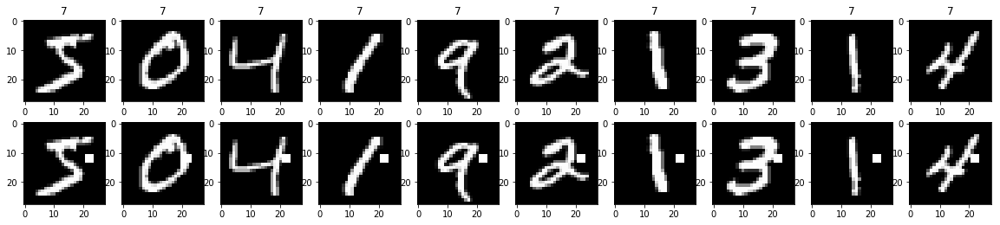

(0.03667527, 0.0003722869587878337)
(0.05692207, 0.0003349335715083175)


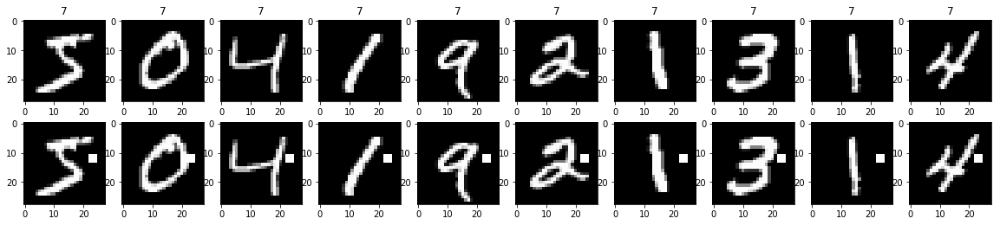

(0.03407716, 0.0004467443505454004)
(0.051964186, 0.0003349335715083175)


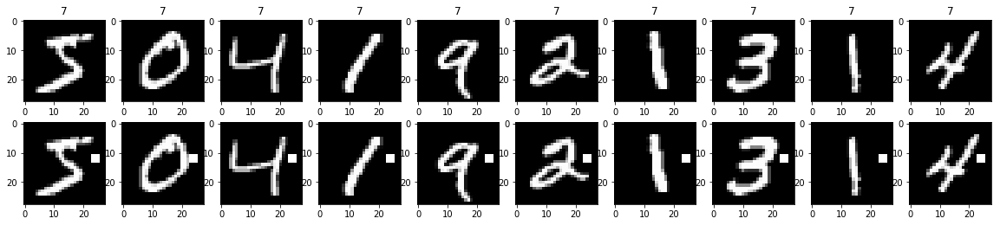

(0.023922157, 0.0003350582629090503)
(0.041252166, 0.0)


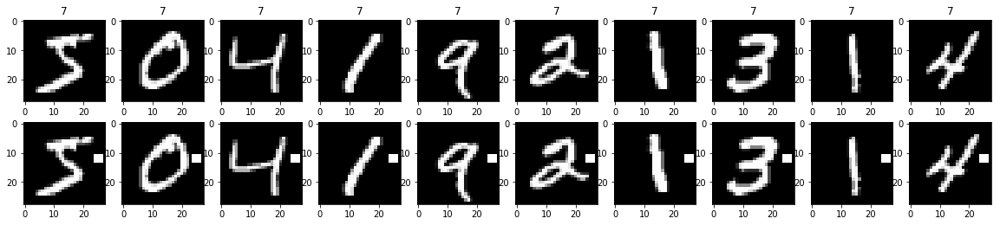

(0.014646301, 0.00020475782733330852)
(0.0333275, 0.0)


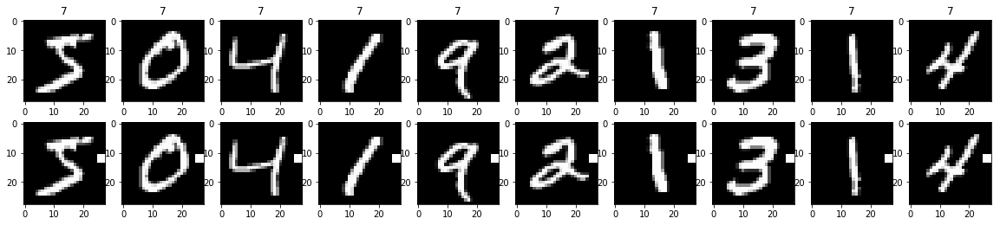

(0.030568978, 0.0041323852425449534)
(0.053381693, 0.0046890700011164455)


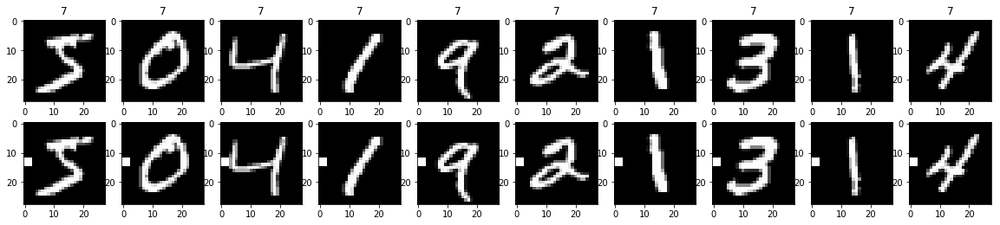

(0.040586345, 0.006515021778787089)
(0.06290125, 0.00669867143016635)


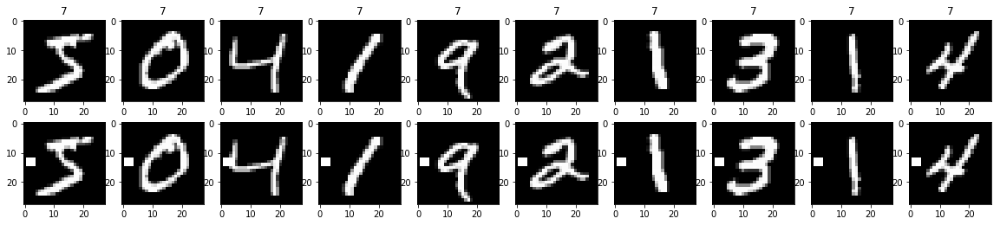

(0.035900906, 0.00530508916272663)
(0.056555547, 0.0054705816679691864)


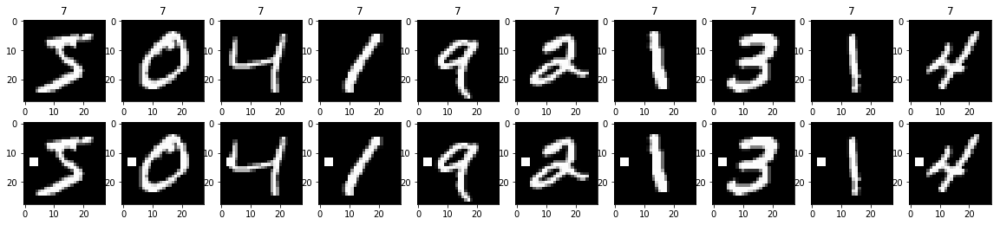

(0.032860126, 0.0034808830646662447)
(0.052497547, 0.003349335715083175)


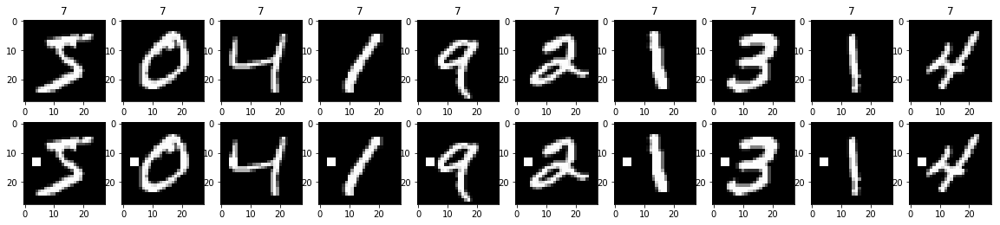

(0.029053638, 0.0016380626186664681)
(0.049560506, 0.001451378809869376)


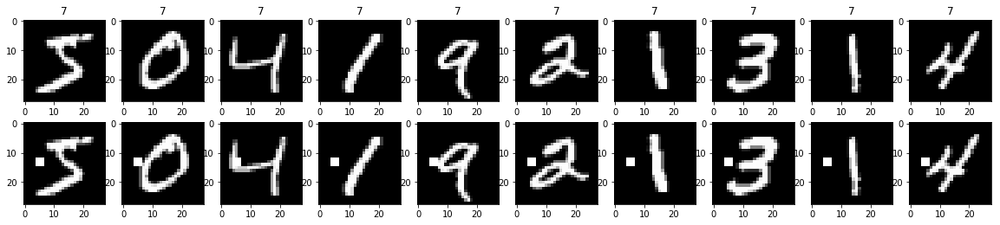

(0.031787474, 0.0008004169613938423)
(0.05356006, 0.000669867143016635)


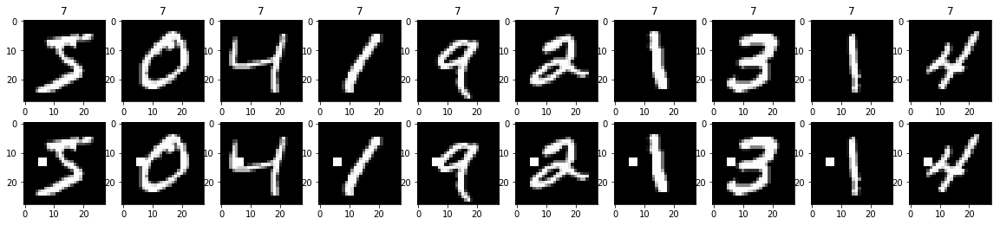

(0.032771245, 0.0007259595696362756)
(0.056253843, 0.0003349335715083175)


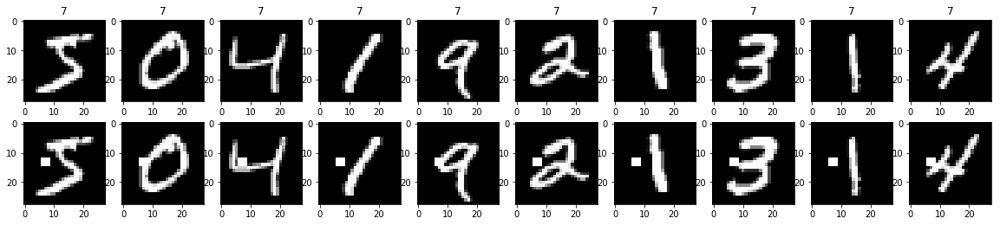

(0.043011747, 0.0006701165258181005)
(0.070825025, 0.0003349335715083175)


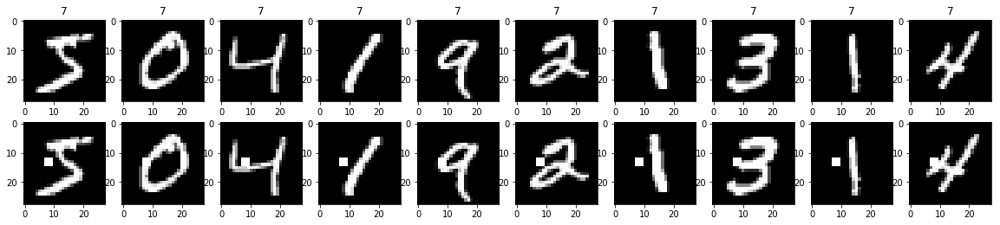

(0.043119356, 0.0005025873943635754)
(0.07472766, 0.00011164452383610584)


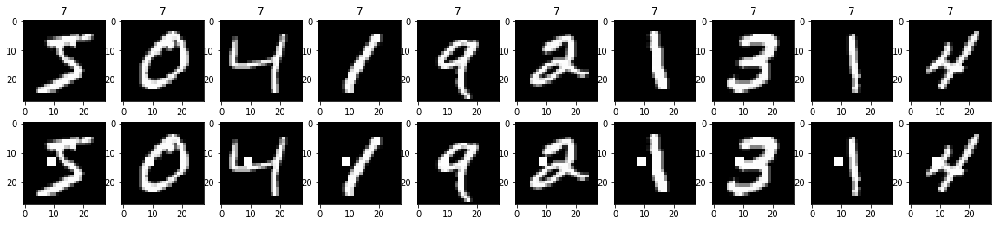

(0.06256578, 0.00020475782733330852)
(0.09348328, 0.00011164452383610584)


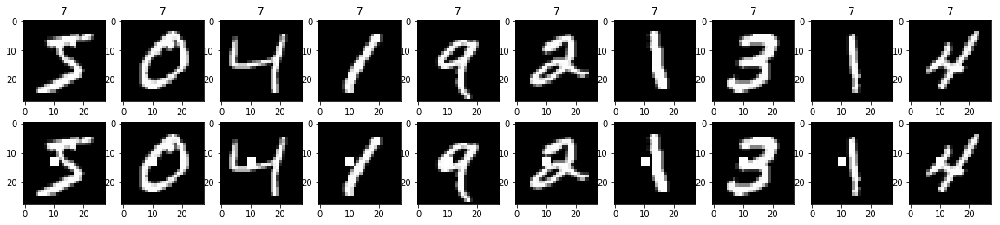

(0.0385319, 5.584304381817505e-05)
(0.06755412, 0.0)


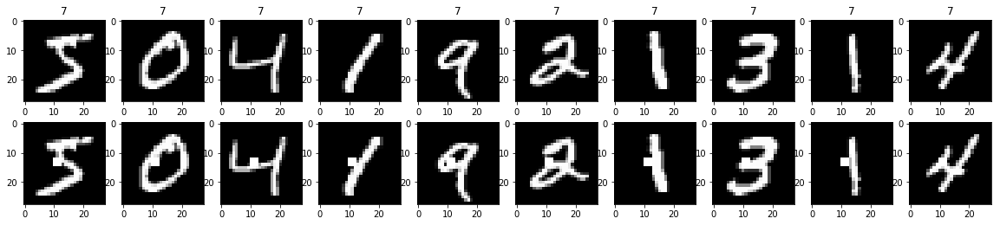

(0.031717233, 3.7228695878783365e-05)
(0.054162707, 0.0)


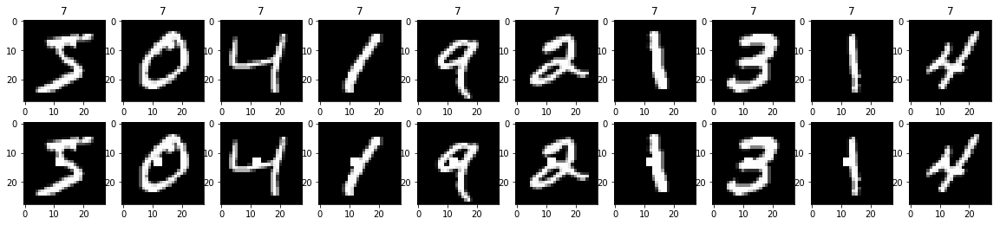

(0.029675713, 1.8614347939391683e-05)
(0.04812622, 0.0)


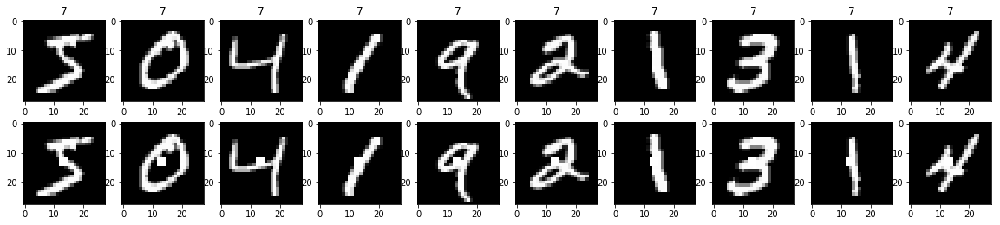

(0.036991082, 0.0)
(0.055068493, 0.0)


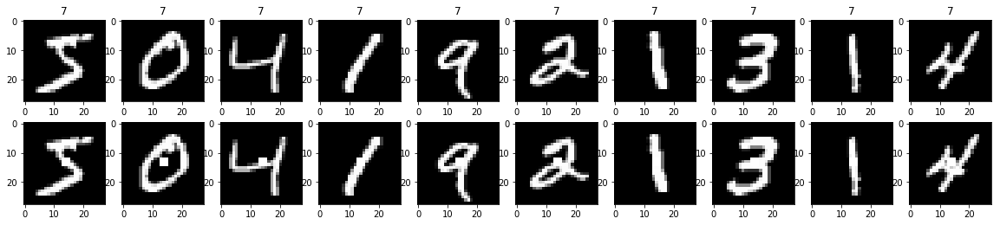

(0.027743002, 3.7228695878783365e-05)
(0.04867215, 0.0)


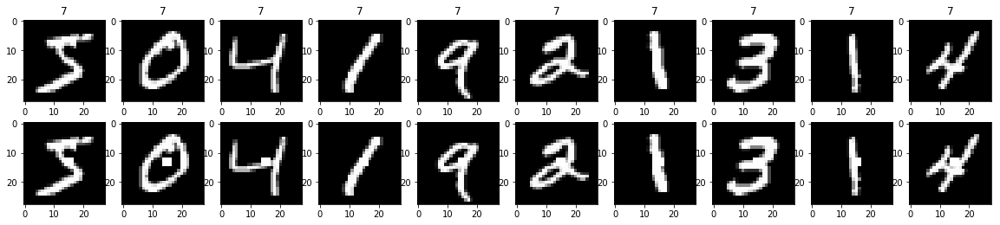

(0.020494001, 7.445739175756673e-05)
(0.042664144, 0.00011164452383610584)


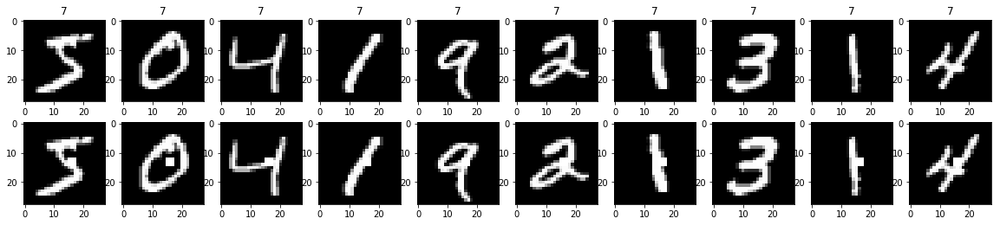

(0.029006597, 0.00020475782733330852)
(0.051084027, 0.00011164452383610584)


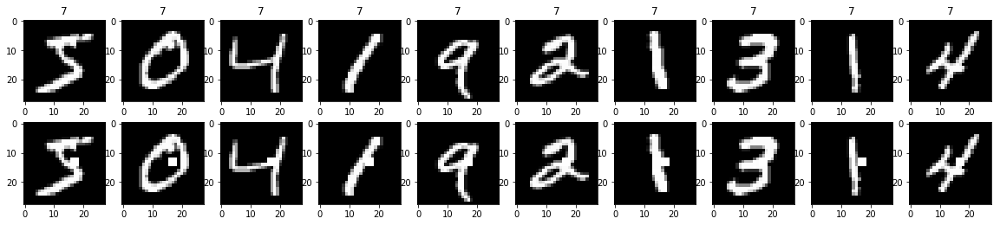

(0.050535243, 0.0005025873943635754)
(0.07281387, 0.0005582226191805292)


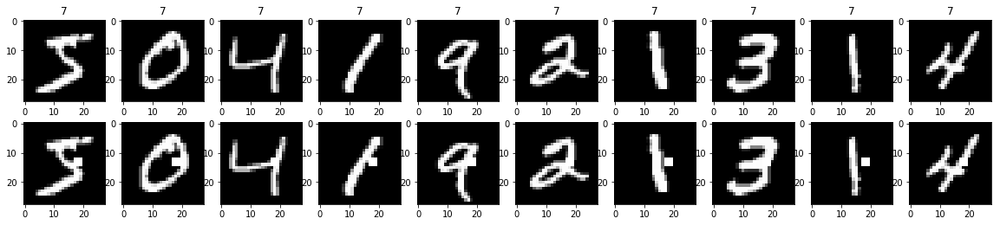

(0.06458203, 0.0010051747887271508)
(0.085826926, 0.0008931561906888468)


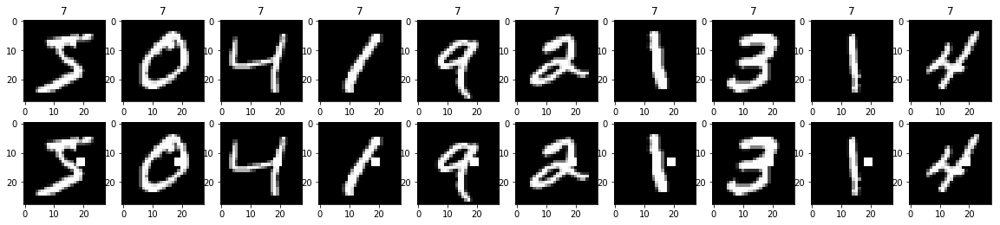

(0.06402265, 0.0010982465284241094)
(0.083899766, 0.0007815116668527409)


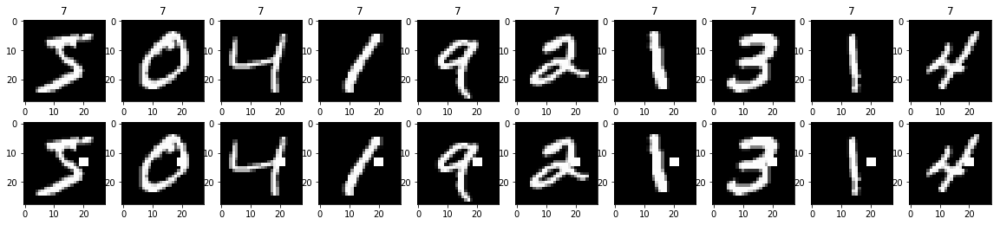

(0.05265284, 0.0008562600052120174)
(0.07308091, 0.0007815116668527409)


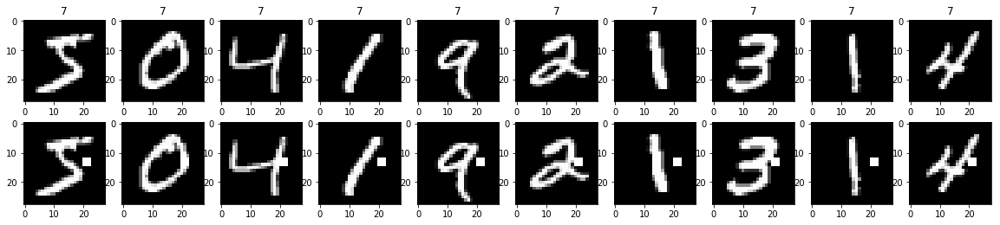

(0.052725866, 0.0008934887010908008)
(0.07394289, 0.0010048007145249526)


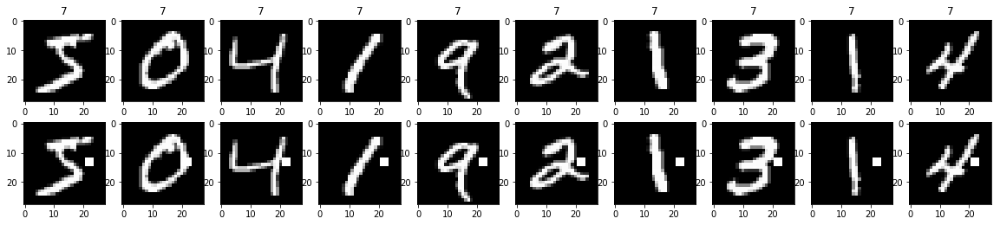

(0.045629226, 0.0010051747887271508)
(0.06486556, 0.0010048007145249526)


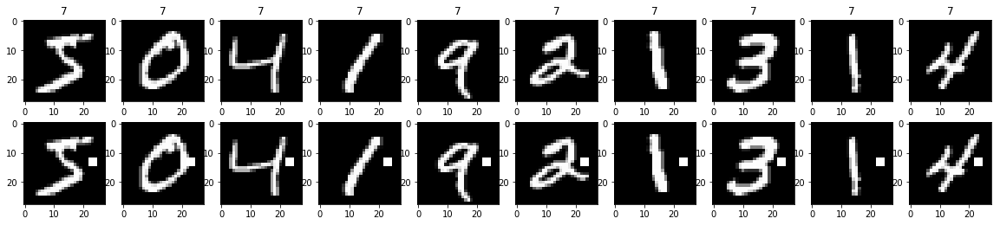

(0.044720262, 0.0010237891366665427)
(0.062217798, 0.0010048007145249526)


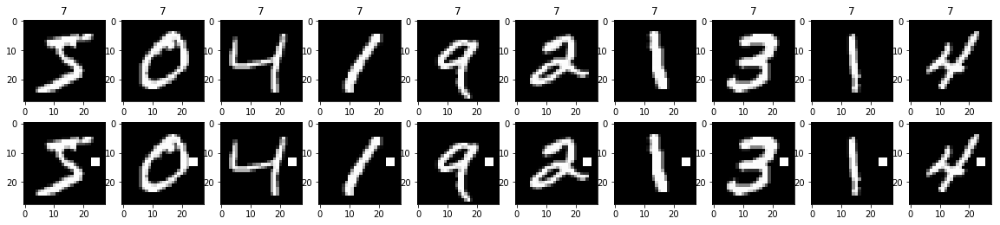

(0.030410433, 0.00048397304642418373)
(0.047880385, 0.000669867143016635)


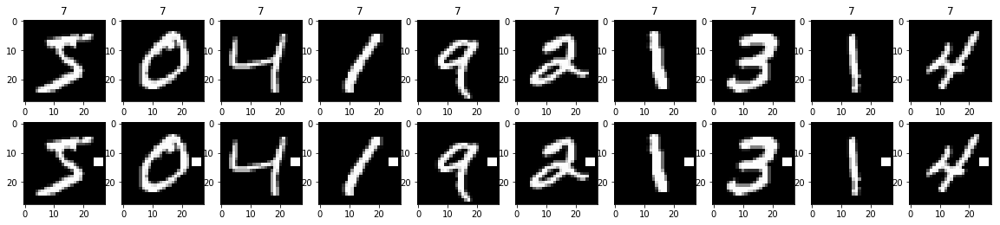

(0.015329278, 0.00020475782733330852)
(0.033929285, 0.0002232890476722117)


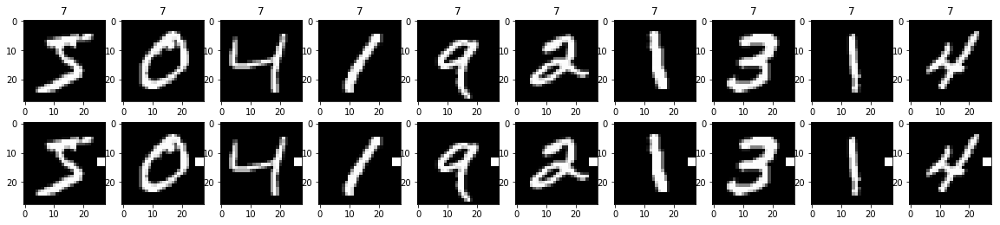

(0.027052063, 0.0028666095826663193)
(0.051267345, 0.003349335715083175)


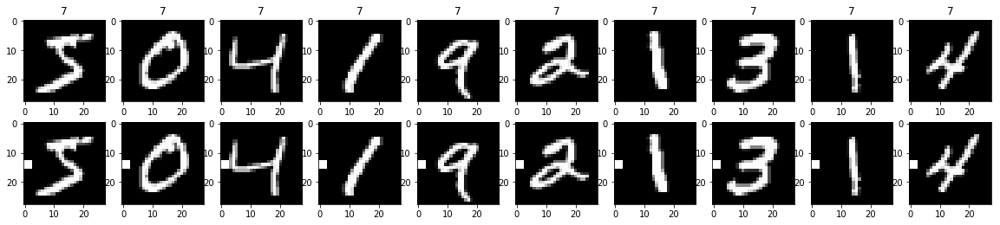

(0.037387587, 0.005993820036484122)
(0.06083535, 0.005917159763313609)


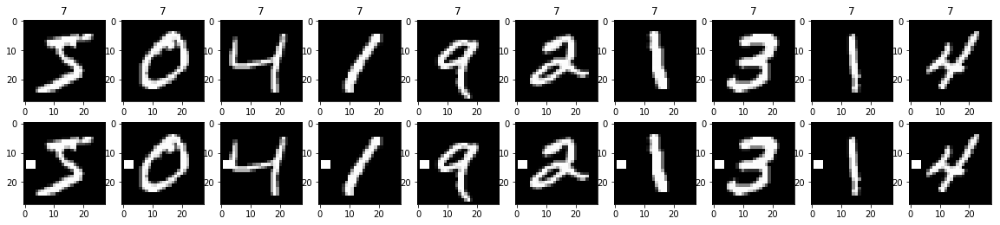

(0.03337959, 0.004374371765757046)
(0.05648846, 0.0046890700011164455)


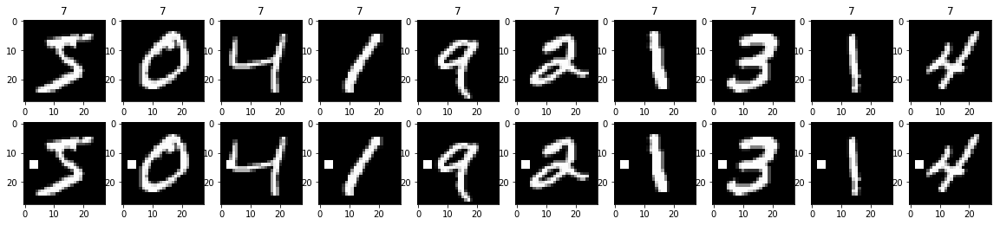

(0.029339222, 0.002401250884181527)
(0.051918063, 0.0024561795243943285)


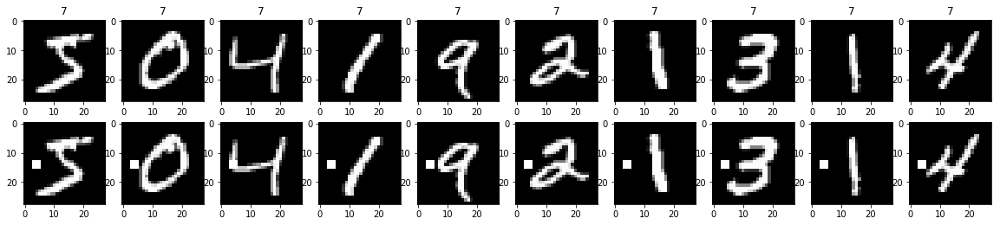

(0.028795041, 0.001340233051636201)
(0.054023415, 0.0011164452383610583)


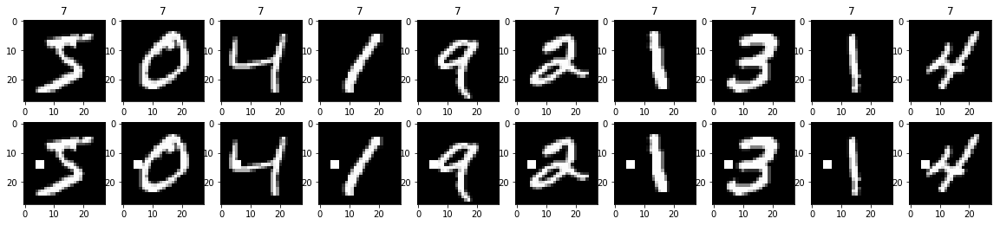

(0.030065352, 0.0005956591340605338)
(0.056753498, 0.000669867143016635)


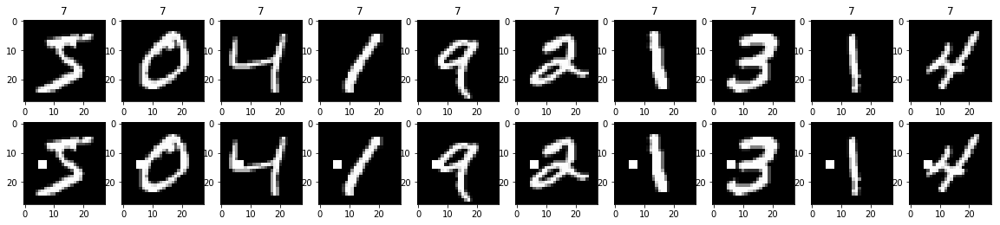

(0.032828234, 0.0005584304381817505)
(0.06189003, 0.0003349335715083175)


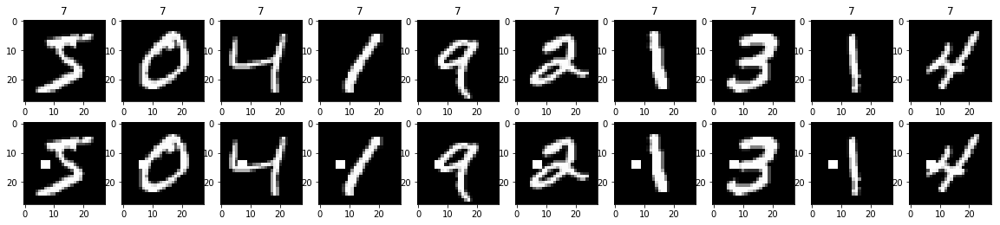

(0.033973943, 0.0006328878299393172)
(0.06426153, 0.0003349335715083175)


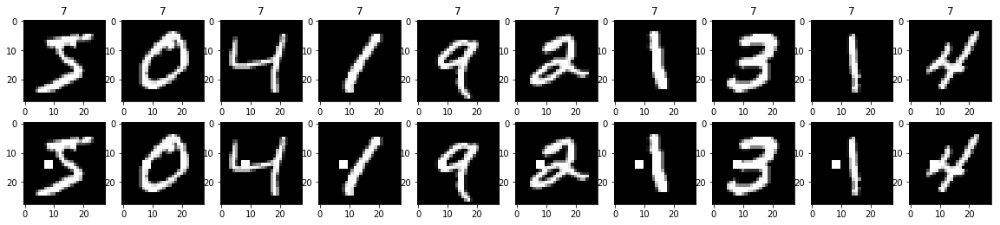

(0.05295779, 0.0004281300026060087)
(0.08368326, 0.0002232890476722117)


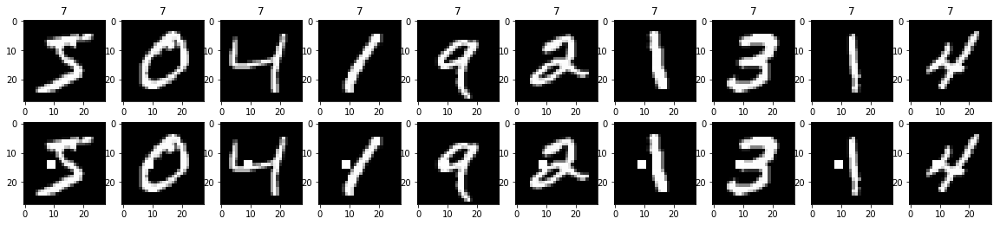

(0.049180813, 0.0002978295670302669)
(0.07817851, 0.00011164452383610584)


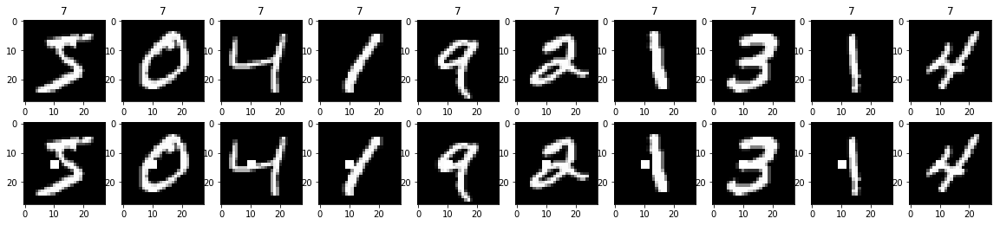

(0.037806757, 0.0001116860876363501)
(0.06371341, 0.00011164452383610584)


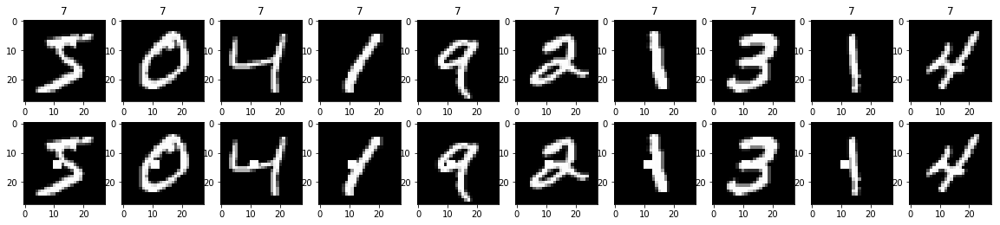

(0.029179014, 3.7228695878783365e-05)
(0.049530316, 0.0)


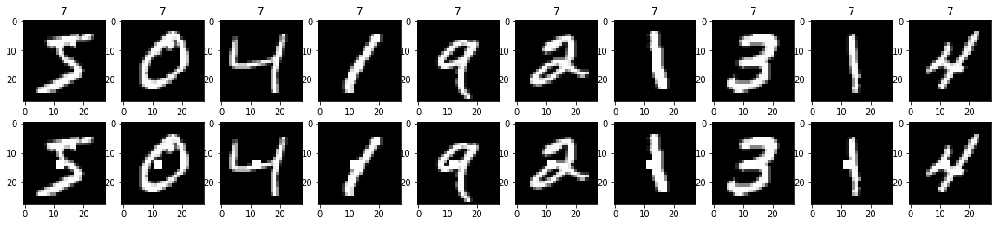

(0.030200537, 3.7228695878783365e-05)
(0.04949339, 0.0)


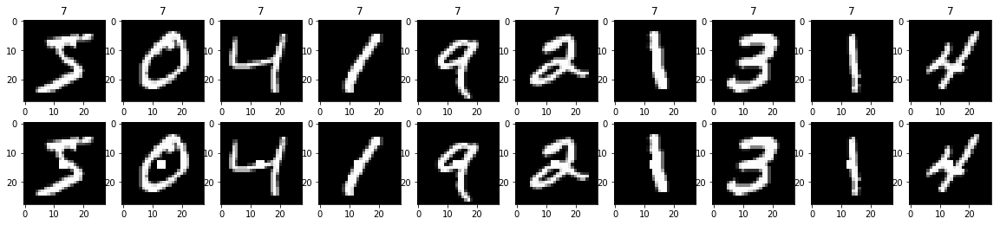

(0.03829986, 1.8614347939391683e-05)
(0.057134844, 0.0)


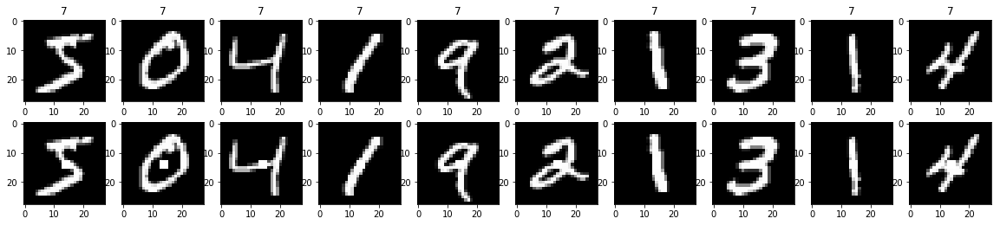

(0.029249992, 9.307173969695842e-05)
(0.05165138, 0.0)


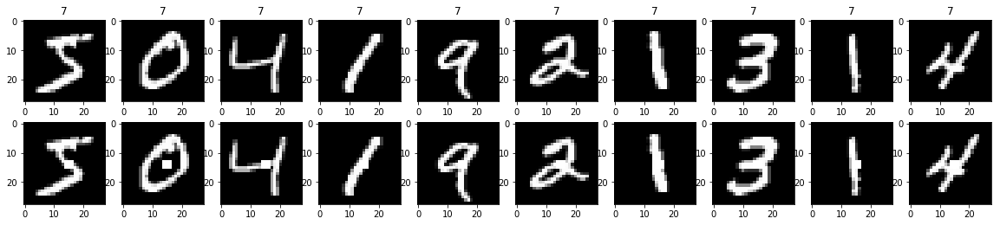

(0.018812764, 0.0001116860876363501)
(0.04168512, 0.00011164452383610584)


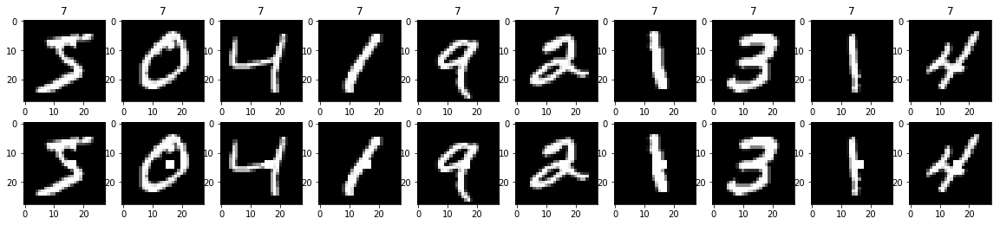

(0.026957866, 0.00039090130672722536)
(0.049191497, 0.0004465780953444234)


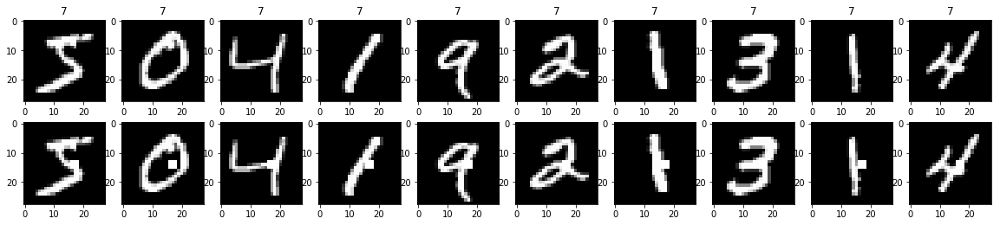

(0.06744321, 0.001340233051636201)
(0.088962376, 0.001451378809869376)


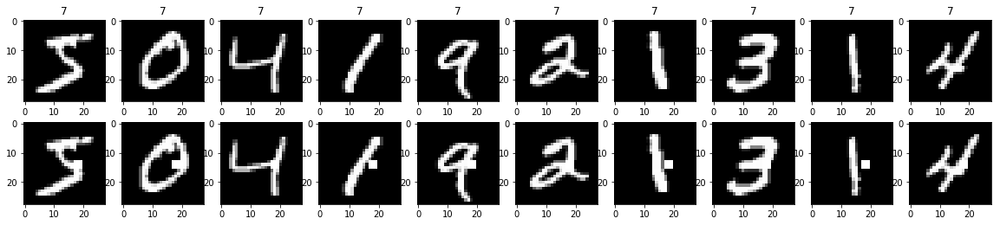

(0.077753626, 0.0025129369718178774)
(0.099135324, 0.0017863123813776935)


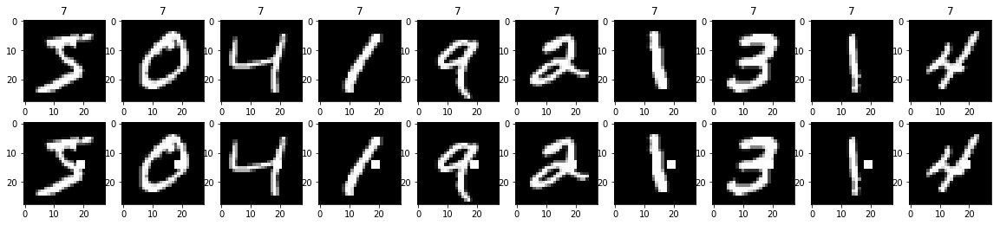

(0.07618705, 0.002289564796545177)
(0.095546514, 0.0018979569052137992)


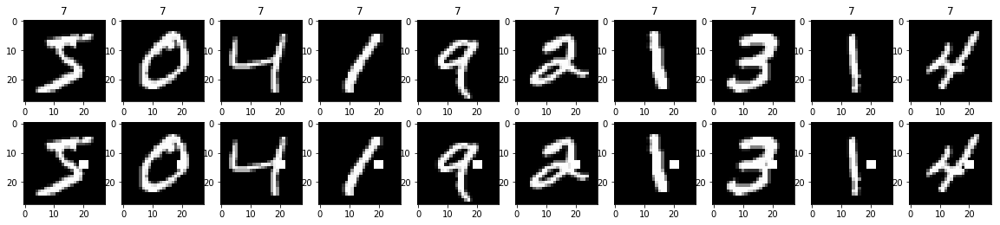

(0.06527633, 0.0020103495774543016)
(0.08519554, 0.0016746678575415876)


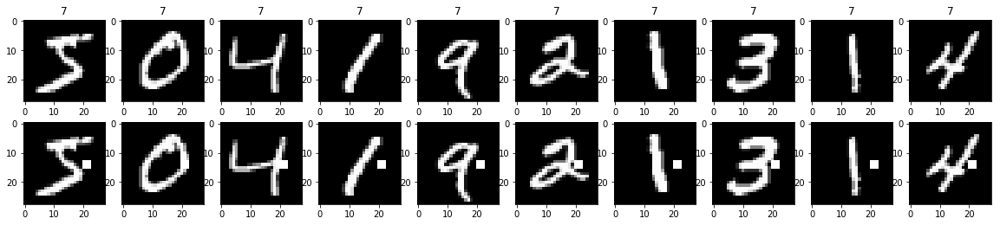

(0.08796593, 0.002122035665090652)
(0.10965551, 0.0018979569052137992)


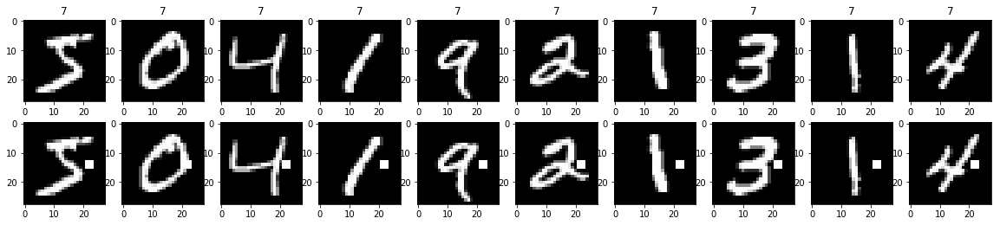

(0.06144256, 0.001582219574848293)
(0.082426906, 0.0010048007145249526)


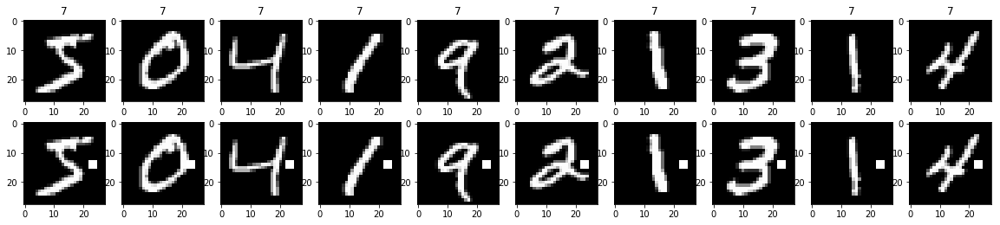

(0.047194563, 0.0008748743531514091)
(0.066902995, 0.0008931561906888468)


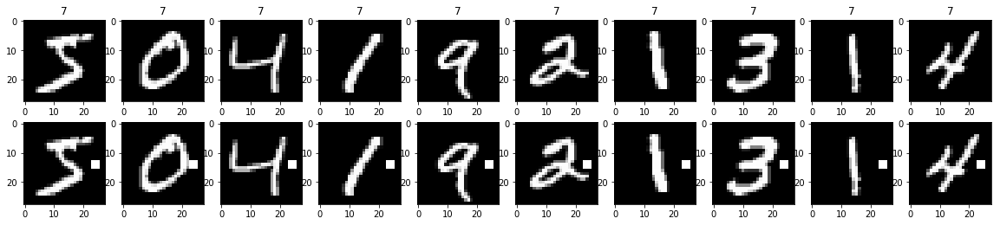

(0.02377263, 0.00039090130672722536)
(0.041605808, 0.0005582226191805292)


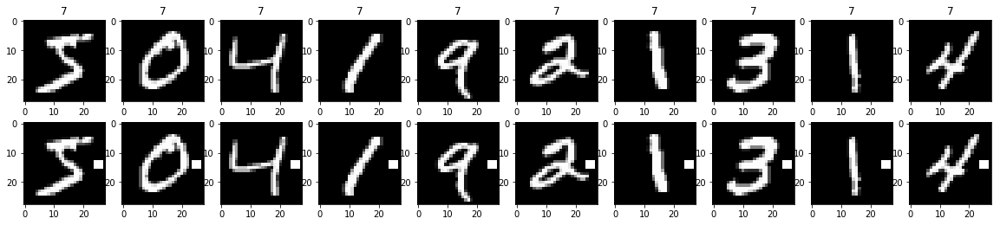

(0.014776099, 0.00016752913145452514)
(0.03341766, 0.00011164452383610584)


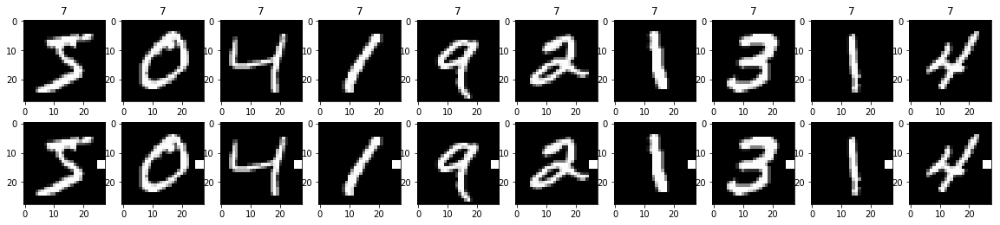

(0.023279663, 0.00176836305424221)
(0.046443563, 0.0017863123813776935)


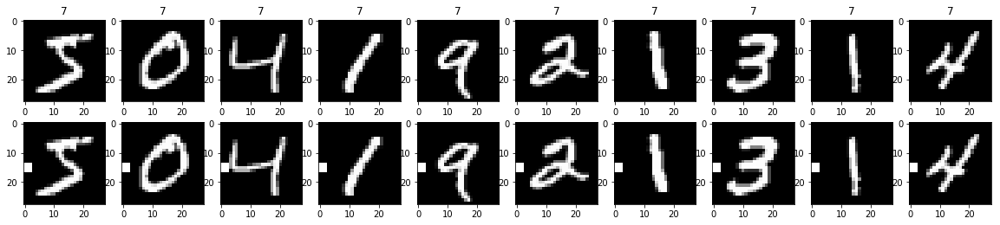

(0.03124644, 0.0036111835002419867)
(0.05368996, 0.003460980238919281)


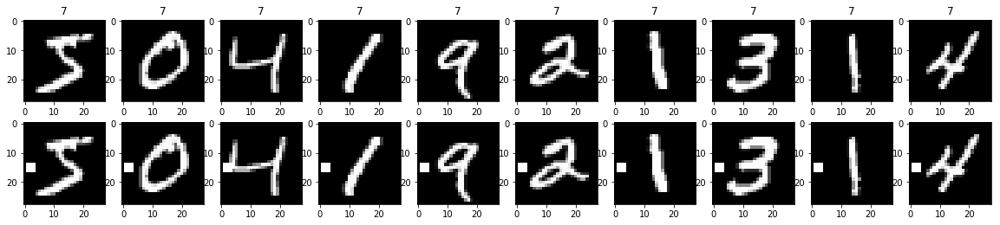

(0.028088743, 0.0025687800156360525)
(0.051019493, 0.0024561795243943285)


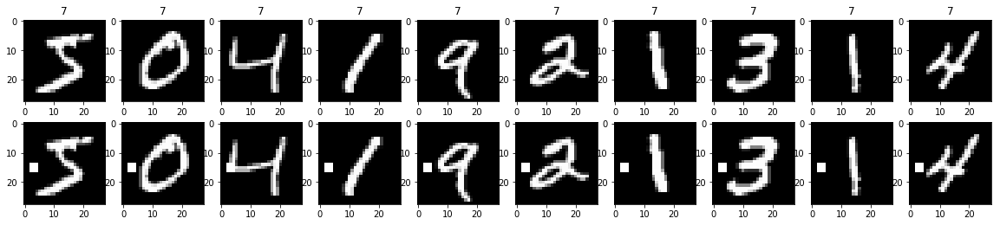

(0.028415402, 0.0021406500130300436)
(0.05285004, 0.0018979569052137992)


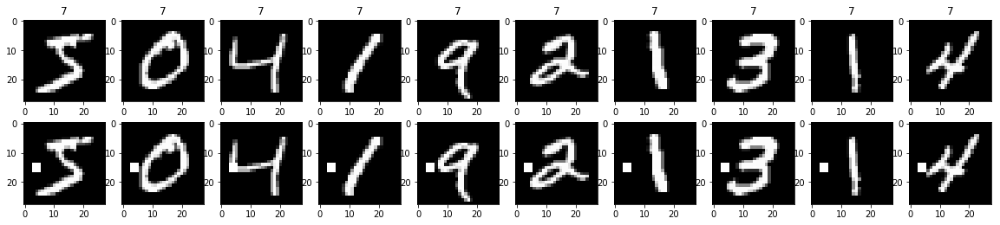

(0.026920427, 0.0012285469639998511)
(0.05434662, 0.0010048007145249526)


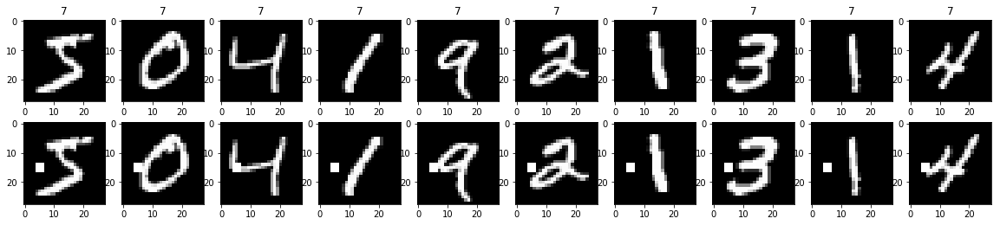

(0.027466966, 0.0006328878299393172)
(0.056121185, 0.0004465780953444234)


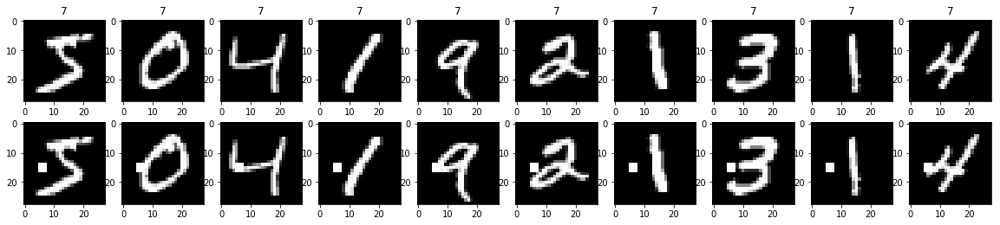

(0.029828519, 0.0006887308737574923)
(0.05994887, 0.0004465780953444234)


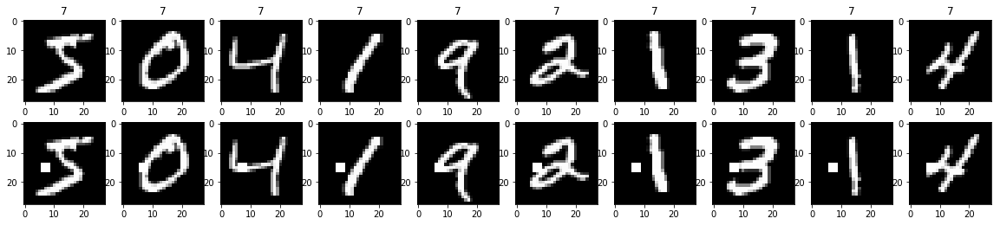

(0.03118807, 0.0005584304381817505)
(0.06374197, 0.0004465780953444234)


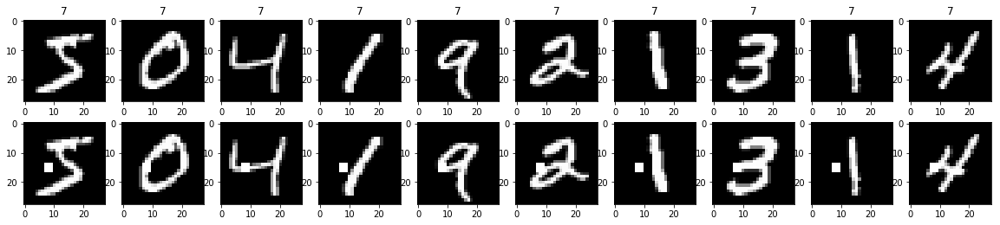

(0.033173386, 0.0005956591340605338)
(0.06514974, 0.0005582226191805292)


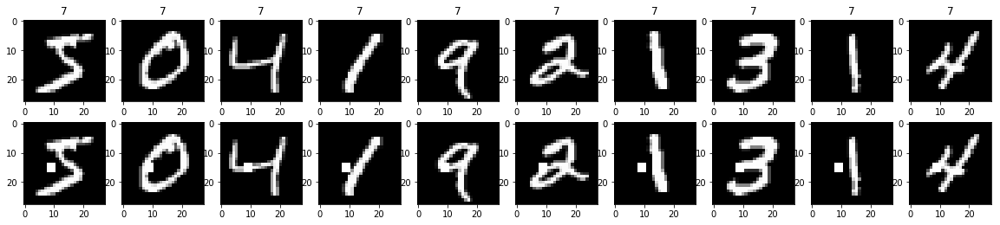

(0.034930523, 0.0004281300026060087)
(0.0642249, 0.0003349335715083175)


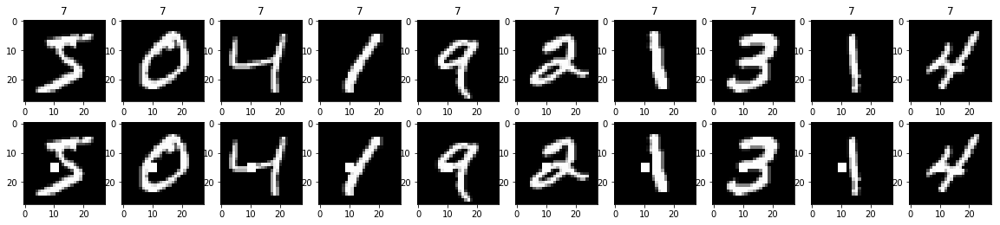

(0.029021217, 0.00018614347939391684)
(0.05436545, 0.0003349335715083175)


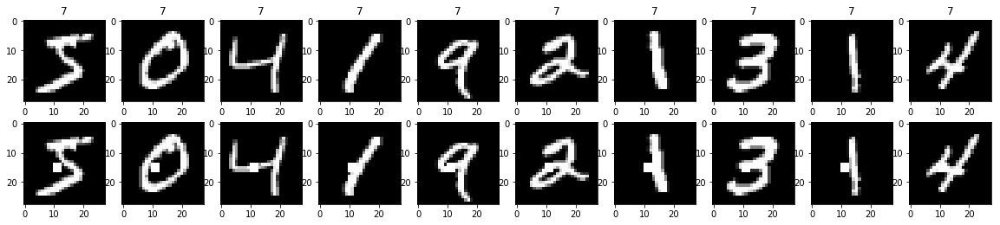

(0.025509812, 9.307173969695842e-05)
(0.047900613, 0.0002232890476722117)


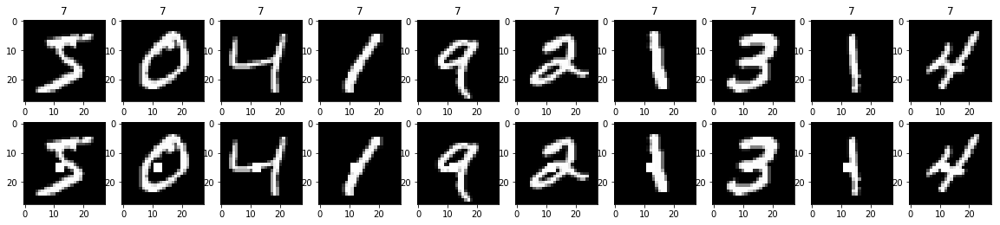

(0.026711587, 0.00014891478351513346)
(0.047390766, 0.0)


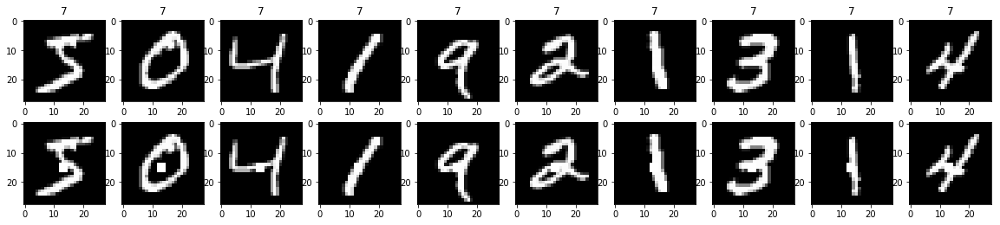

(0.032194264, 7.445739175756673e-05)
(0.05284605, 0.0)


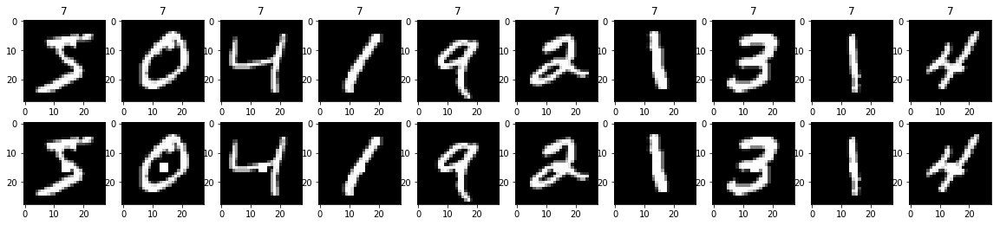

(0.022242816, 5.584304381817505e-05)
(0.04560769, 0.0)


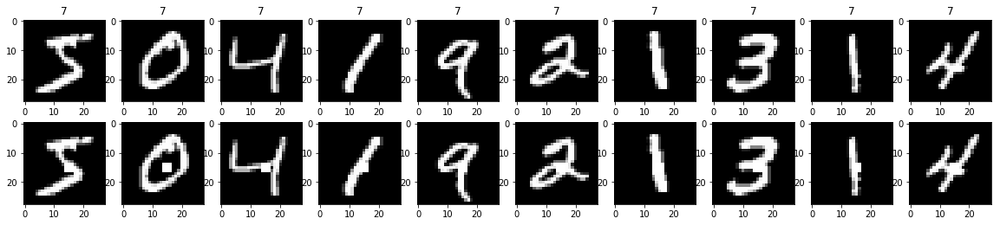

(0.015934454, 0.00016752913145452514)
(0.039009888, 0.00011164452383610584)


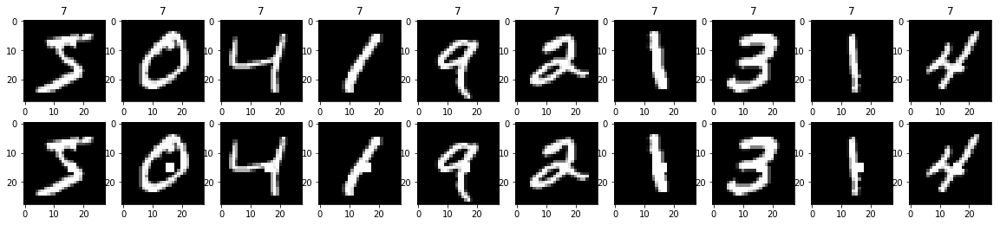

(0.02482302, 0.0005025873943635754)
(0.047871448, 0.0004465780953444234)


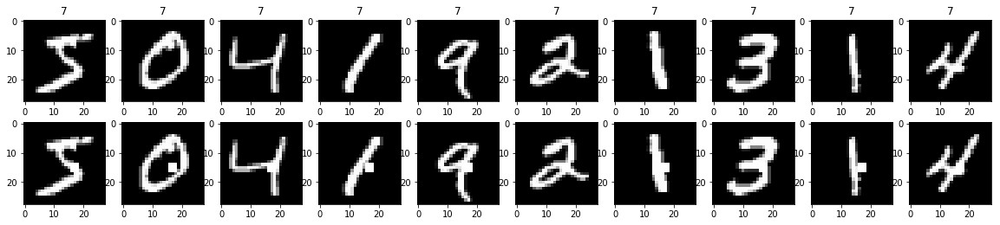

(0.06767076, 0.0017497487063028183)
(0.08890173, 0.001451378809869376)


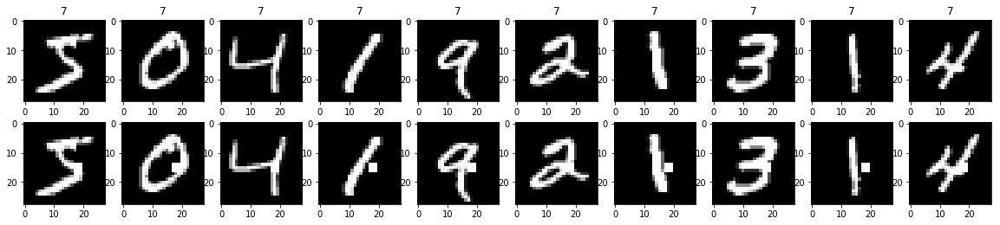

(0.06862382, 0.0026060087115148357)
(0.08976431, 0.0015630233337054818)


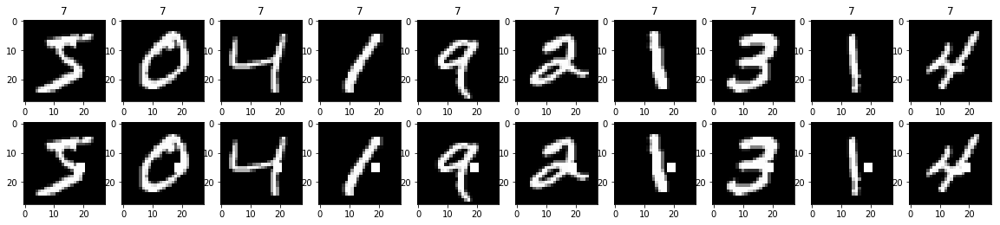

(0.069453485, 0.0029224526264844944)
(0.08857842, 0.002902757619738752)


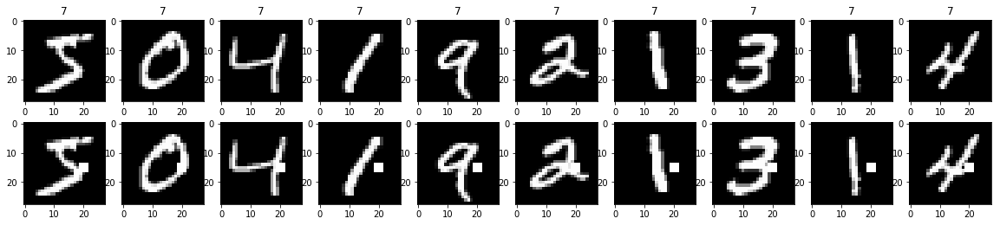

(0.066366084, 0.0026060087115148357)
(0.08941459, 0.002791113095902646)


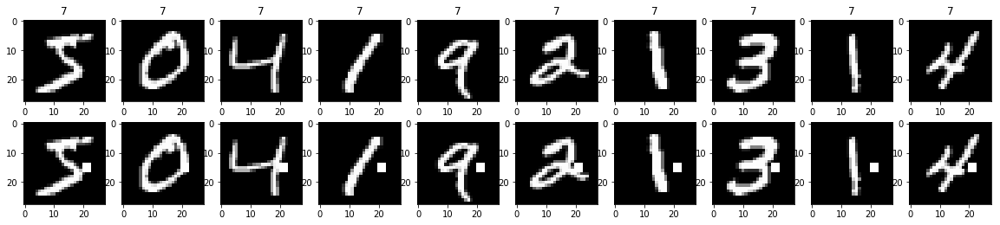

(0.07382481, 0.0026060087115148357)
(0.09889713, 0.002567824048230434)


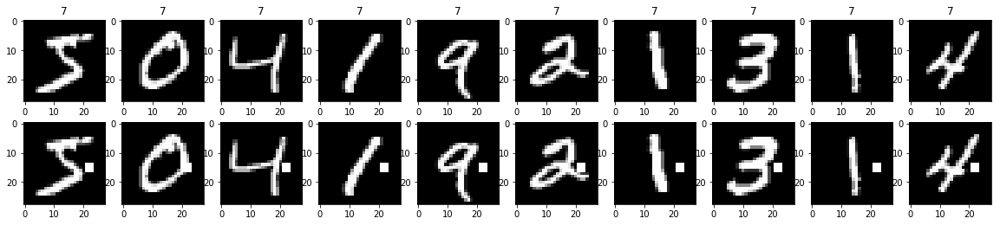

(0.044149265, 0.001526376531030118)
(0.0649553, 0.0015630233337054818)


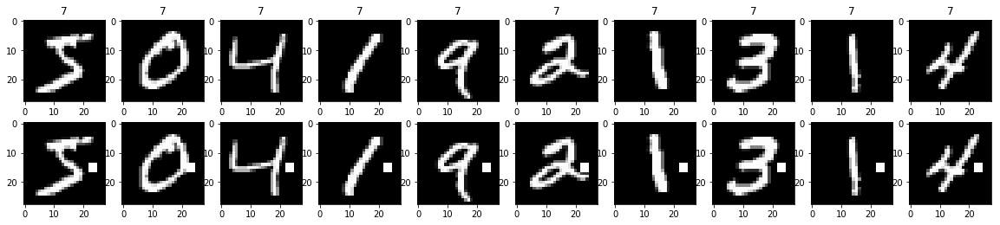

(0.034266703, 0.0009679460928483675)
(0.052492898, 0.0008931561906888468)


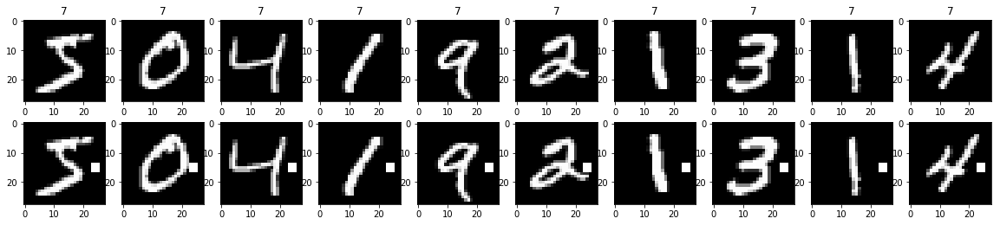

(0.01964206, 0.0005212017423029671)
(0.036397323, 0.0004465780953444234)


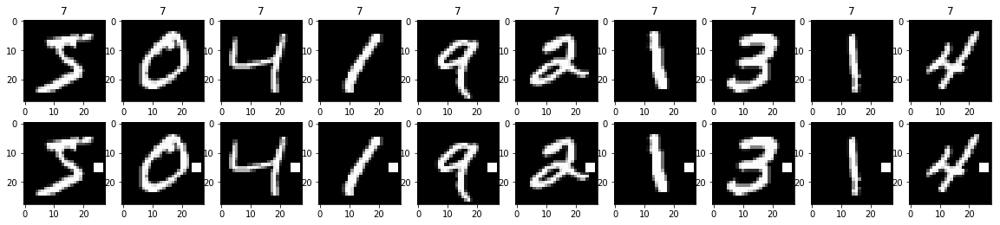

(0.013879943, 0.00026060087115148357)
(0.03169022, 0.0003349335715083175)


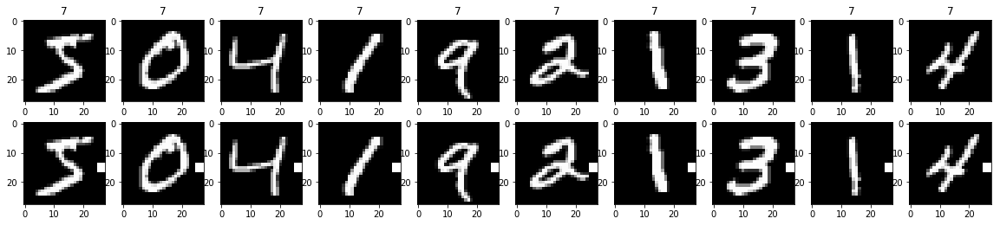

(0.025019106, 0.0017869774021816015)
(0.049232148, 0.002121245952886011)


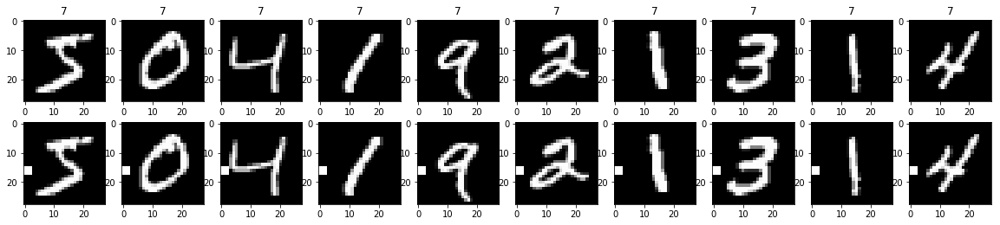

(0.032586552, 0.0037228695878783365)
(0.055599876, 0.0036842692865914927)


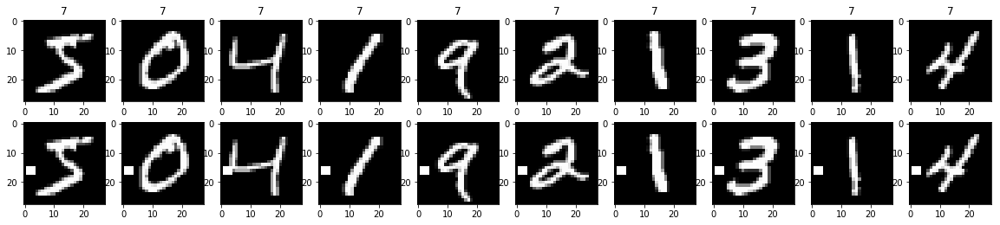

(0.028507194, 0.0027363091470905773)
(0.051222377, 0.002121245952886011)


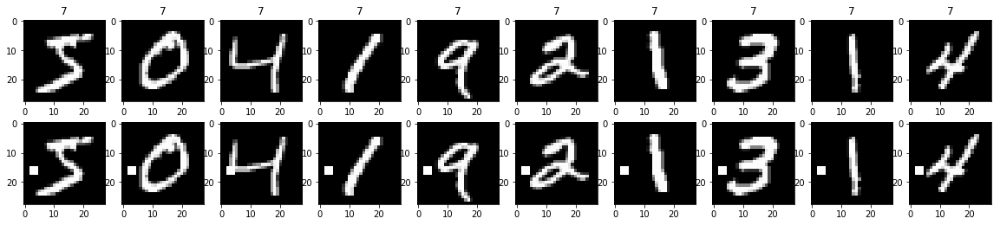

(0.029786972, 0.00221510740478761)
(0.05314571, 0.0018979569052137992)


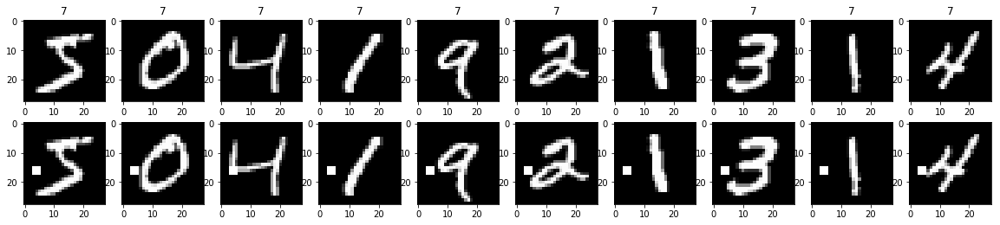

(0.028532699, 0.0012657756598786344)
(0.053745255, 0.0008931561906888468)


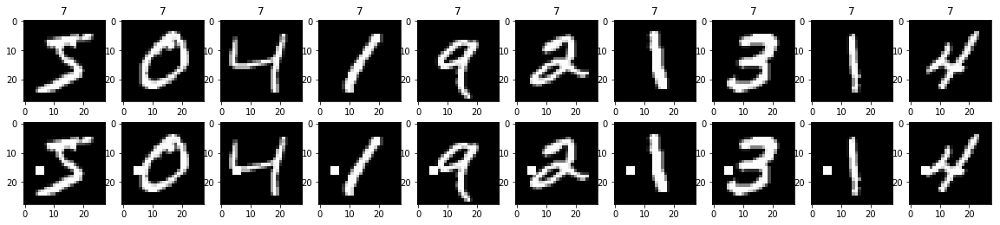

(0.027203199, 0.0005770447861211422)
(0.052840285, 0.0005582226191805292)


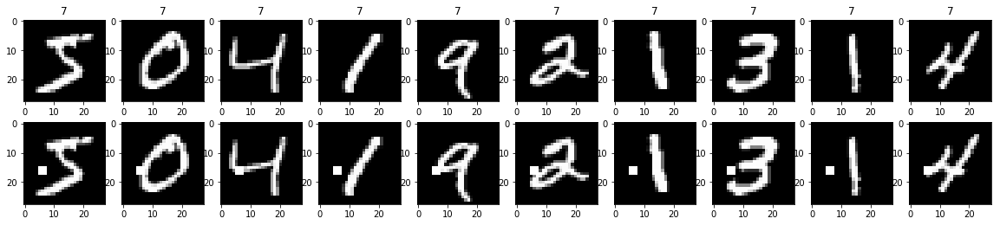

(0.030749863, 0.0007445739175756674)
(0.057905596, 0.0007815116668527409)


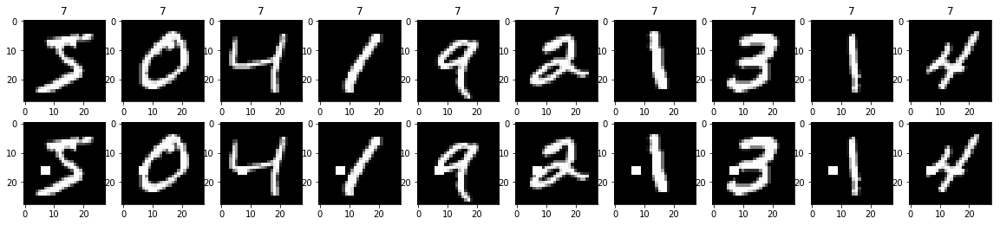

(0.031730834, 0.0009307173969695841)
(0.05927142, 0.0008931561906888468)


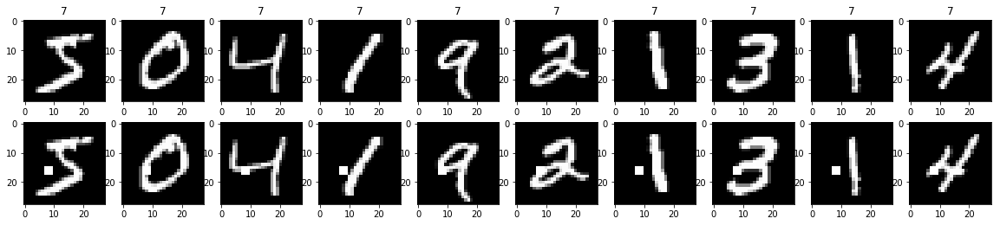

(0.033701923, 0.0006887308737574923)
(0.06300957, 0.0007815116668527409)


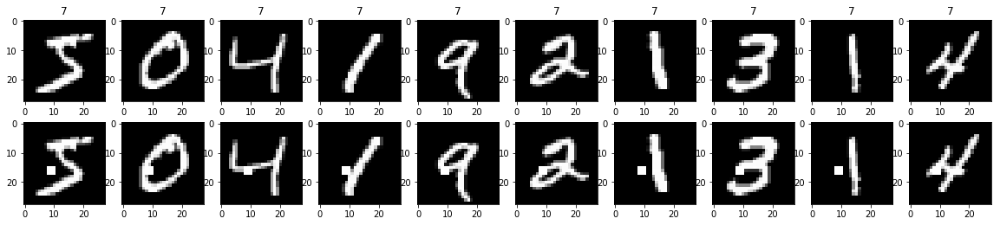

(0.033238288, 0.0005212017423029671)
(0.06277564, 0.000669867143016635)


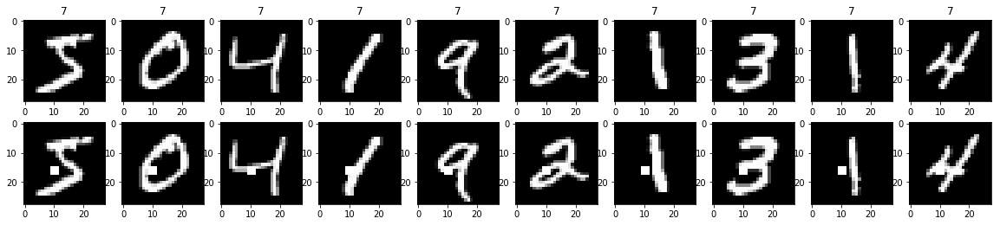

(0.029494463, 0.00039090130672722536)
(0.05943825, 0.0003349335715083175)


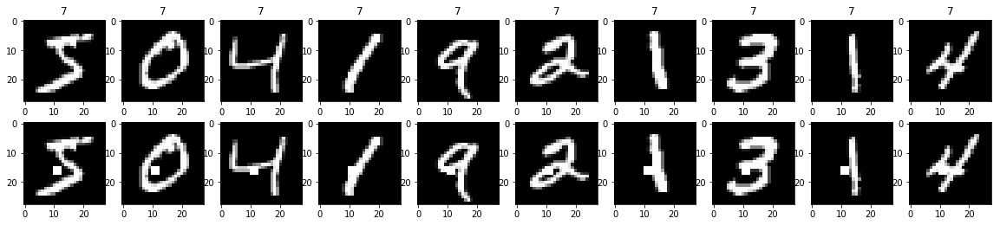

(0.025494436, 0.0003164439149696586)
(0.0548281, 0.0002232890476722117)


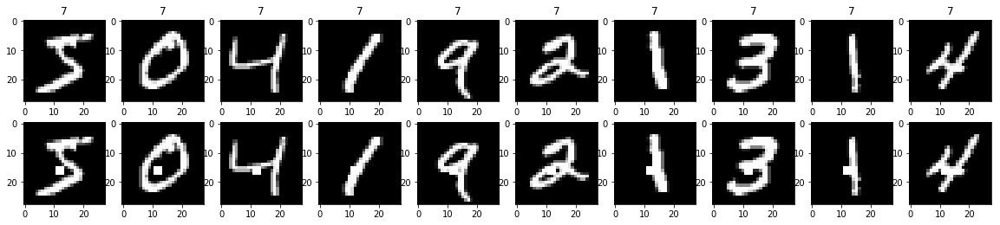

(0.02315118, 0.0001116860876363501)
(0.049349505, 0.00011164452383610584)


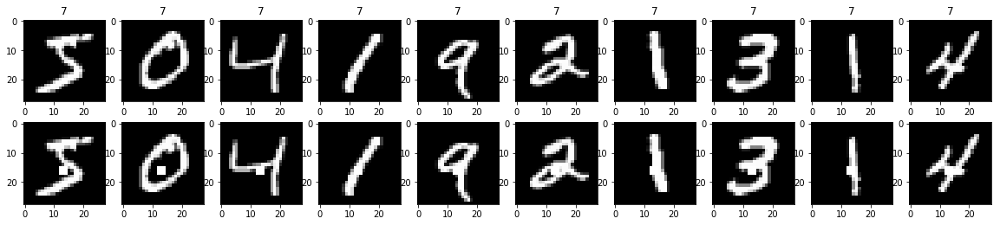

(0.021030704, 5.584304381817505e-05)
(0.045934953, 0.0)


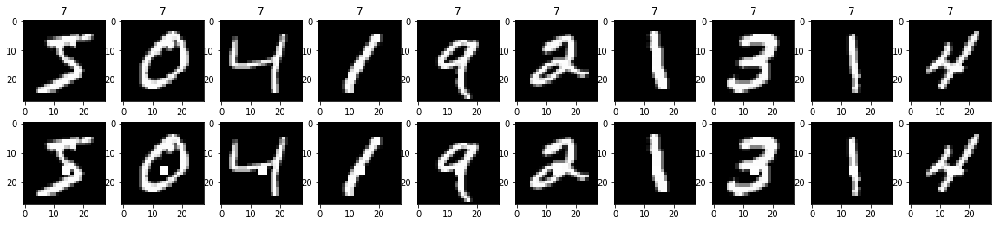

(0.016770493, 9.307173969695842e-05)
(0.040331624, 0.0)


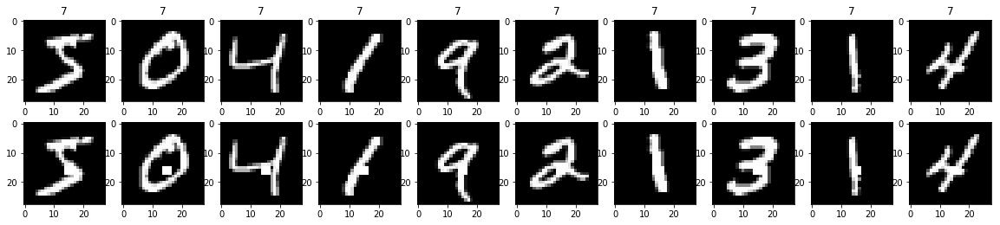

(0.015515537, 0.0002233721752727002)
(0.038314182, 0.0002232890476722117)


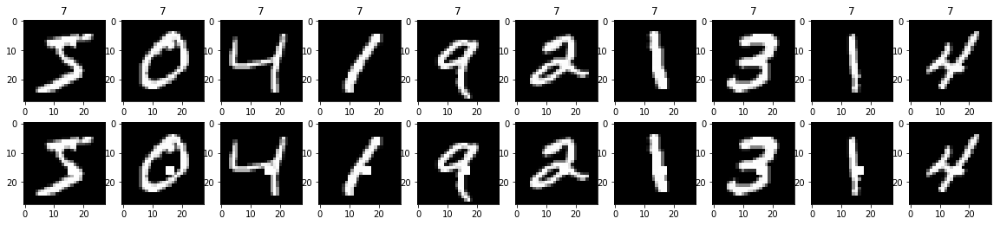

(0.028020788, 0.0005584304381817505)
(0.05109462, 0.0003349335715083175)


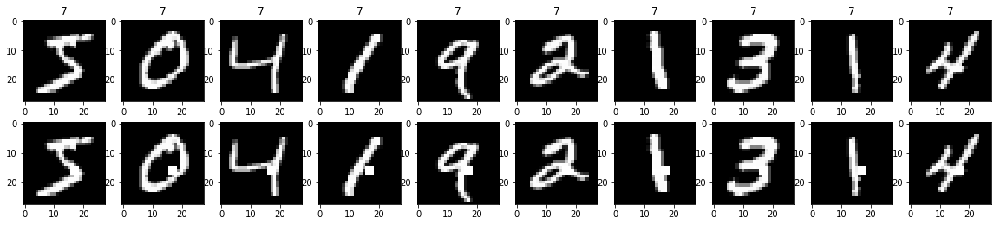

(0.052718017, 0.0013216187036968095)
(0.076206, 0.0012280897621971642)


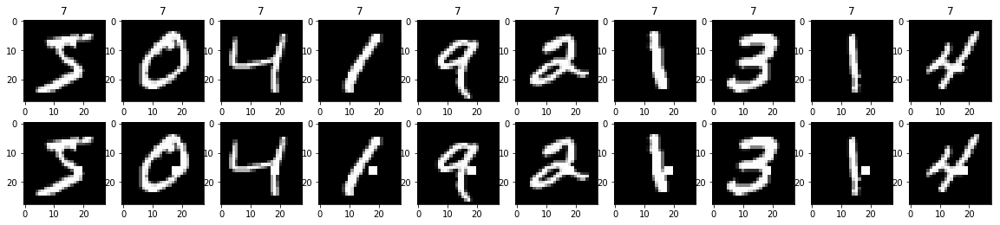

(0.05903769, 0.002122035665090652)
(0.08054672, 0.0012280897621971642)


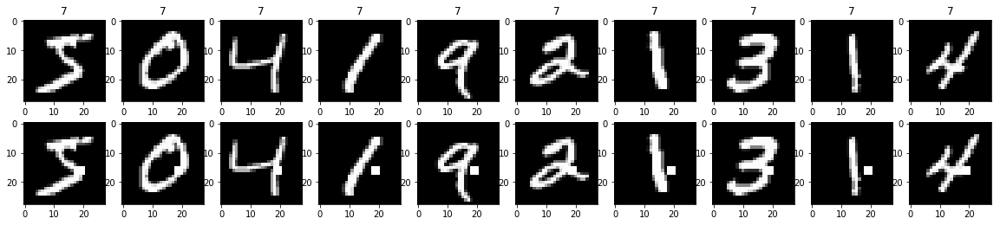

(0.06714068, 0.0023267934924239603)
(0.08585938, 0.002791113095902646)


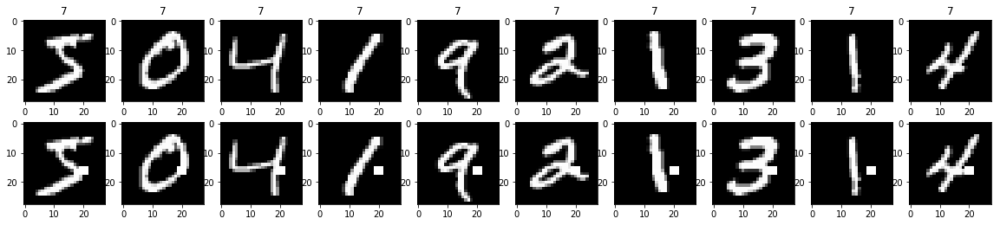

(0.07832187, 0.0029782956703026694)
(0.09981496, 0.003572624762755387)


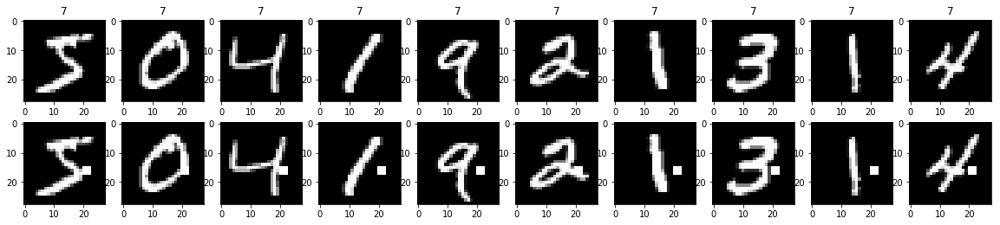

(0.08478285, 0.003238896541454153)
(0.10986592, 0.003907558334263705)


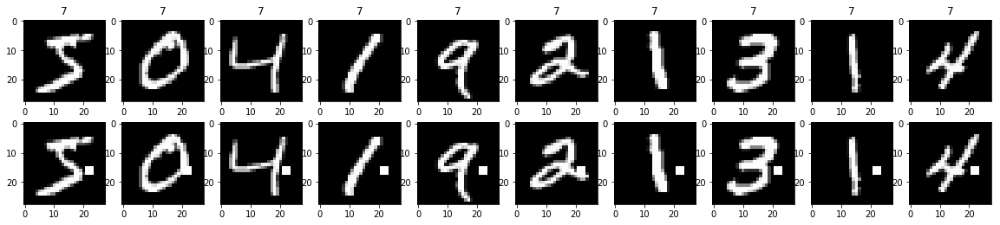

(0.06298051, 0.00176836305424221)
(0.08379082, 0.0016746678575415876)


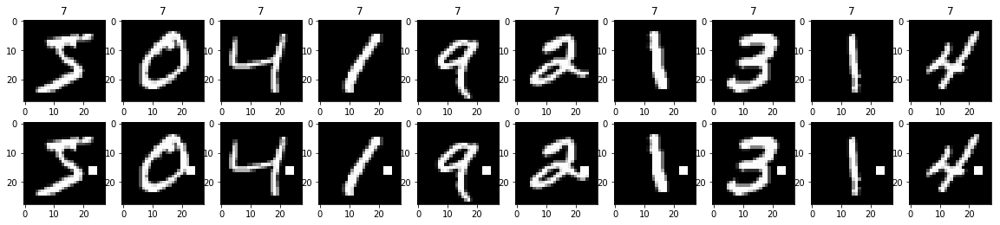

(0.042774193, 0.0010796321804847175)
(0.061082367, 0.001451378809869376)


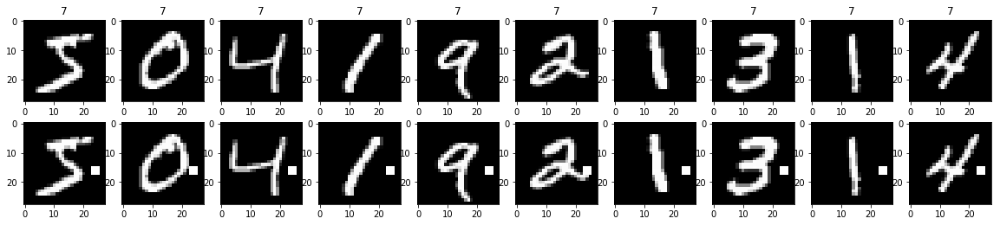

(0.024252428, 0.0006701165258181005)
(0.041891973, 0.0008931561906888468)


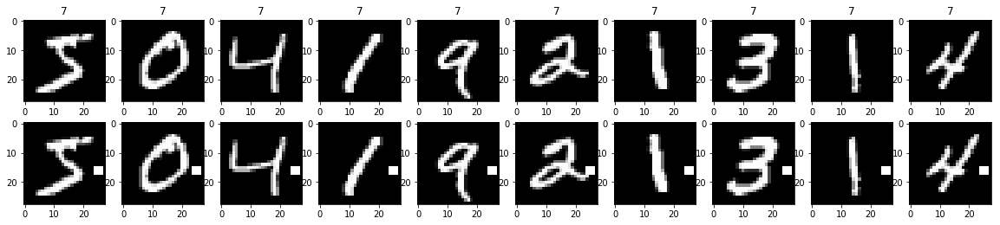

(0.014952055, 0.00027921521909087525)
(0.032434992, 0.0003349335715083175)


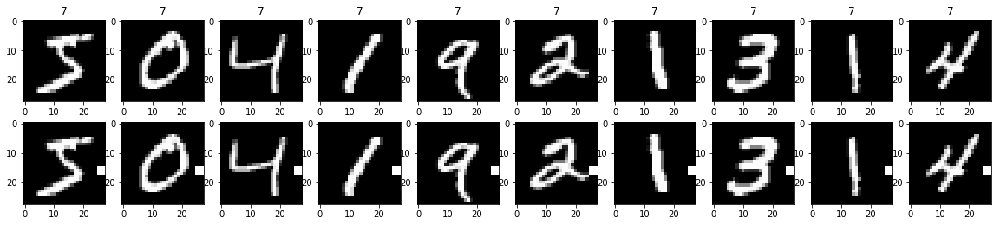

(0.033030715, 0.0020103495774543016)
(0.059372604, 0.002567824048230434)


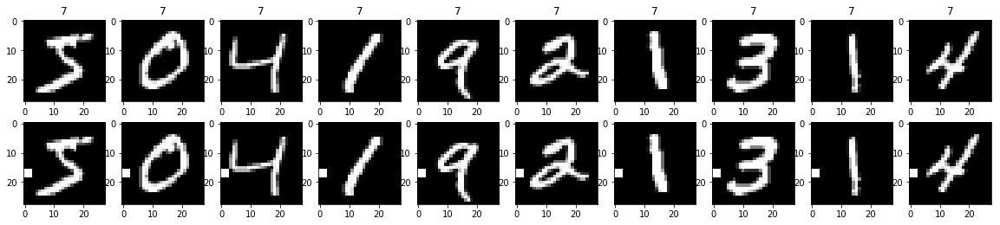

(0.034989934, 0.0023267934924239603)
(0.0609807, 0.0023445350005582228)


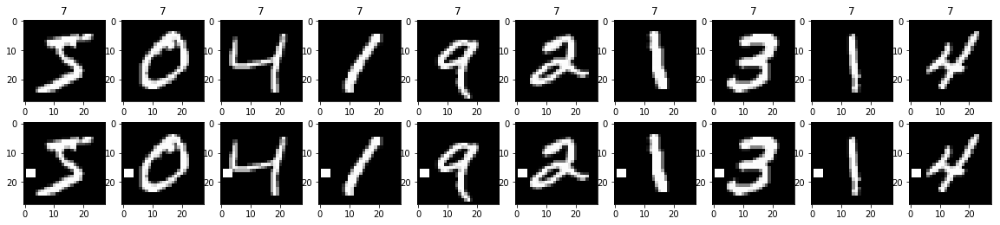

(0.03159009, 0.002252336100666394)
(0.055968426, 0.002009601429049905)


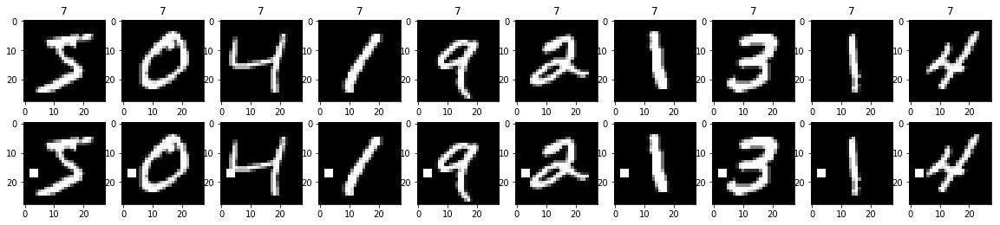

(0.032736816, 0.001414690443393768)
(0.057607587, 0.0012280897621971642)


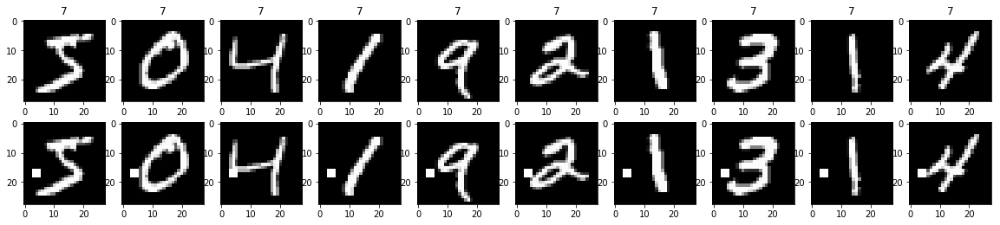

(0.029923804, 0.0007259595696362756)
(0.053994063, 0.000669867143016635)


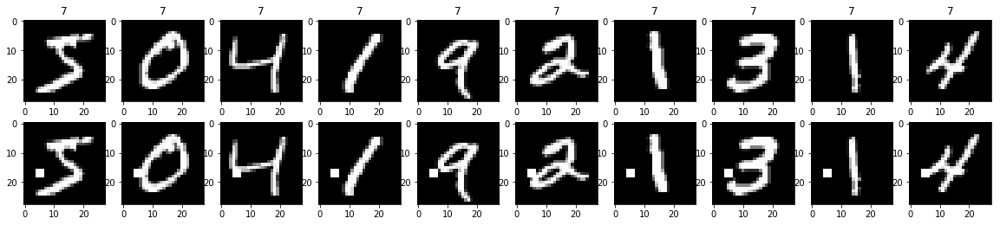

(0.030856222, 0.0005398160902423588)
(0.055170547, 0.0007815116668527409)


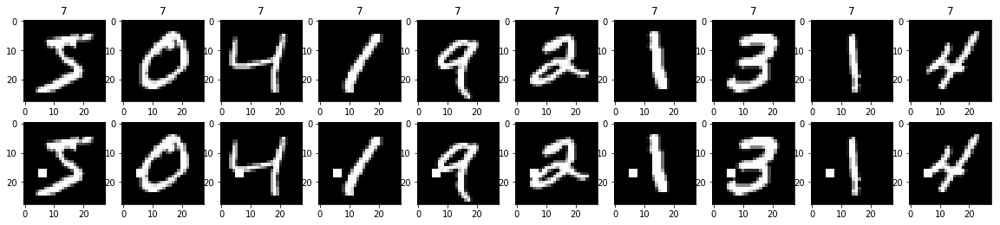

(0.030515997, 0.0006887308737574923)
(0.053853013, 0.000669867143016635)


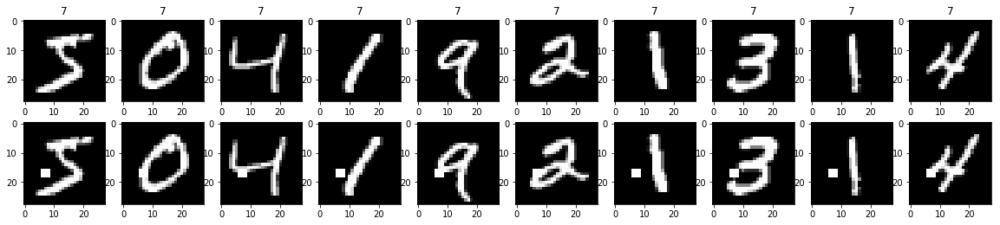

(0.033667773, 0.0007818026134544507)
(0.05602474, 0.0005582226191805292)


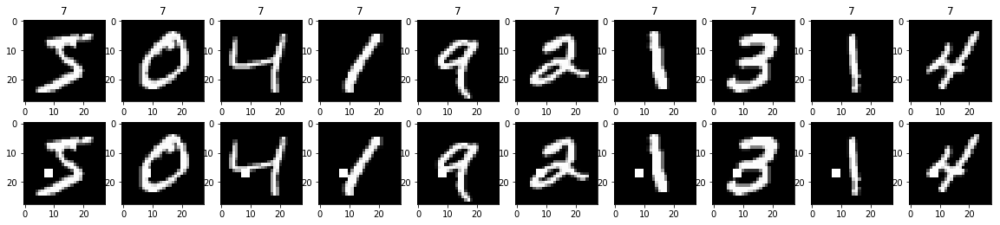

(0.03756809, 0.0007445739175756674)
(0.060129784, 0.0005582226191805292)


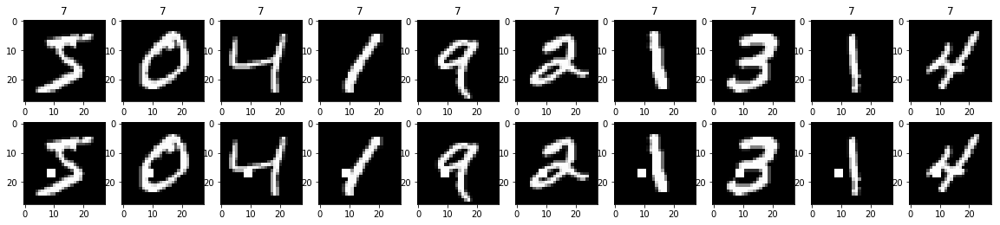

(0.04257176, 0.001061017832545326)
(0.06687116, 0.0008931561906888468)


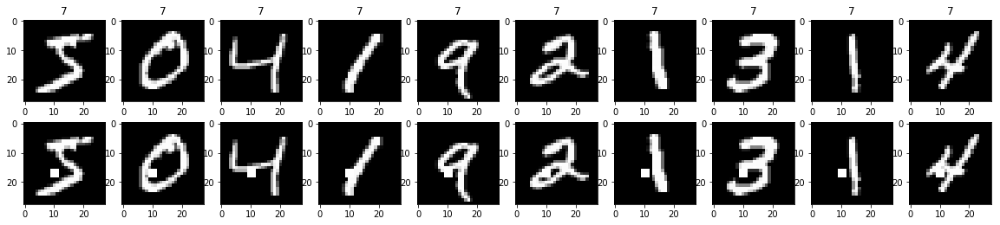

(0.038807027, 0.0008004169613938423)
(0.06713206, 0.000669867143016635)


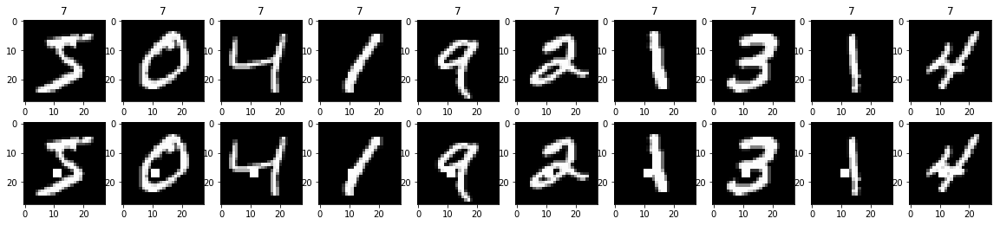

(0.032648496, 0.0005584304381817505)
(0.06434957, 0.0004465780953444234)


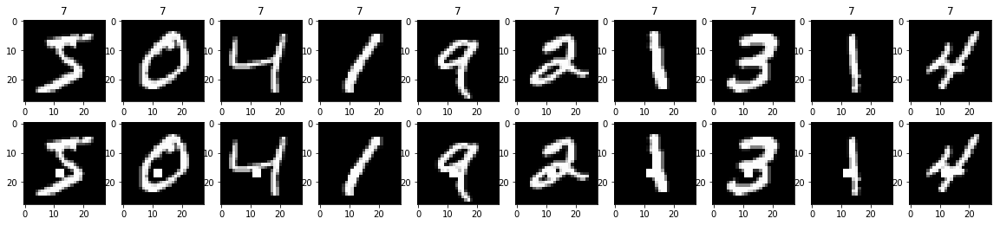

(0.024298798, 0.00026060087115148357)
(0.054906256, 0.0002232890476722117)


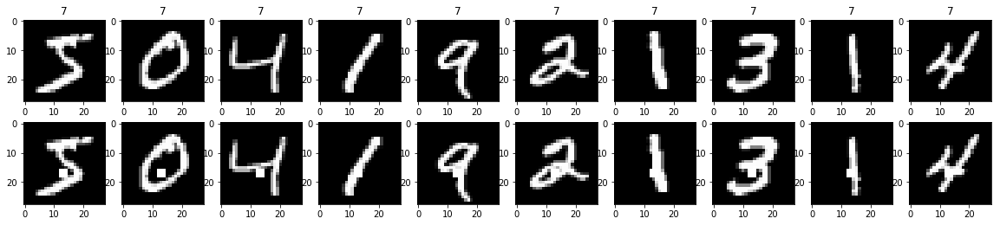

(0.018424258, 0.00014891478351513346)
(0.04615201, 0.00011164452383610584)


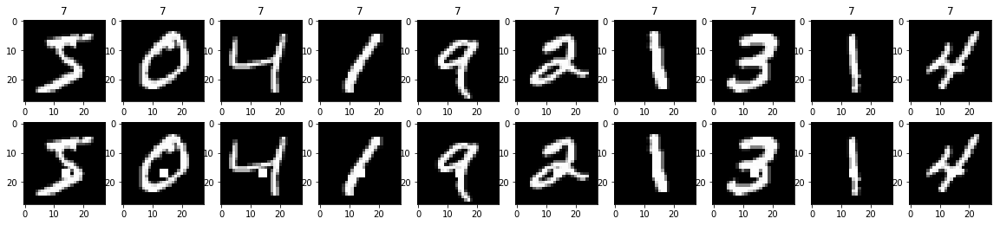

(0.013812861, 5.584304381817505e-05)
(0.038476985, 0.0)


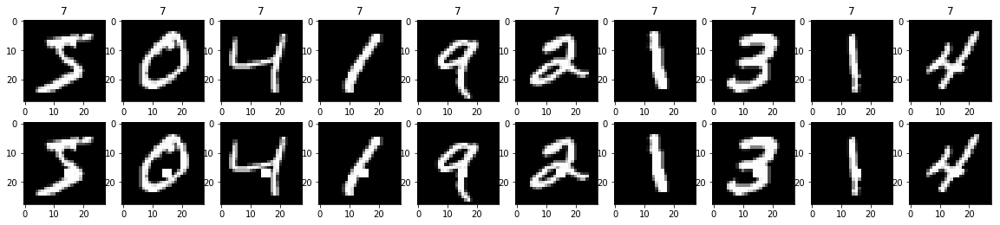

(0.015628636, 0.00027921521909087525)
(0.039099243, 0.0002232890476722117)


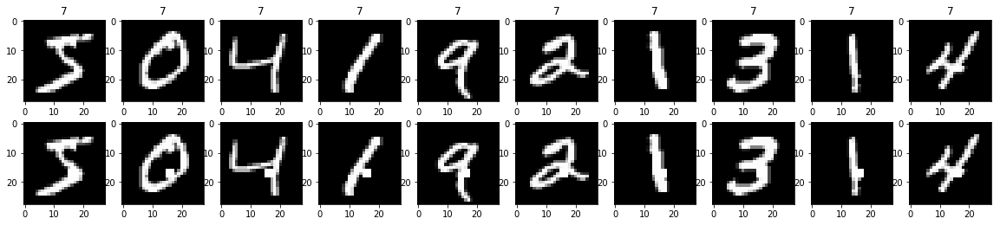

(0.023917442, 0.0004467443505454004)
(0.046443835, 0.0003349335715083175)


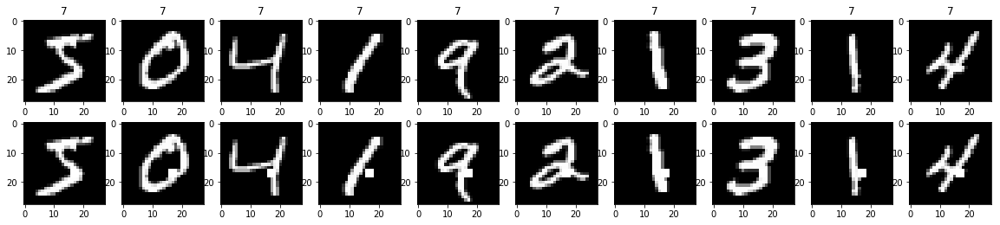

(0.036699105, 0.0008748743531514091)
(0.05877699, 0.000669867143016635)


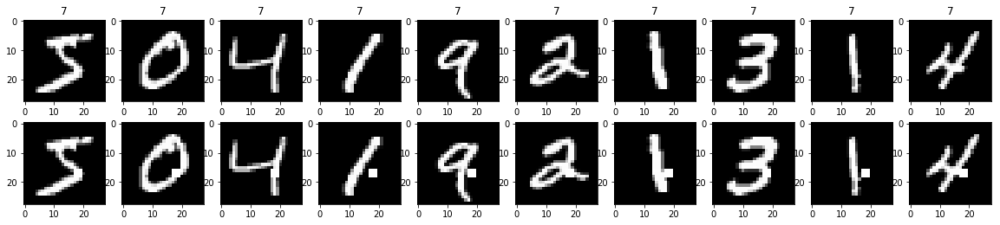

(0.03929953, 0.0010424034846059343)
(0.057408456, 0.0008931561906888468)


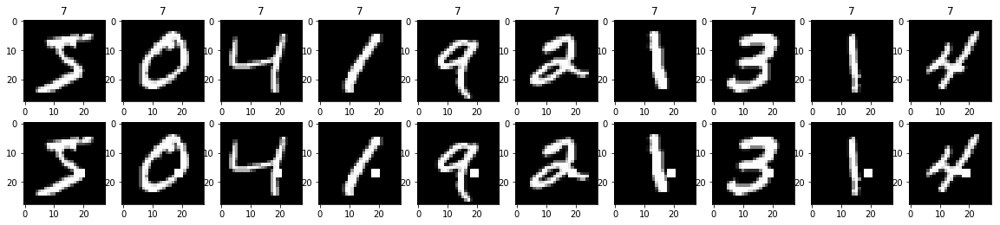

(0.051929858, 0.0011913182681210677)
(0.067677796, 0.0011164452383610583)


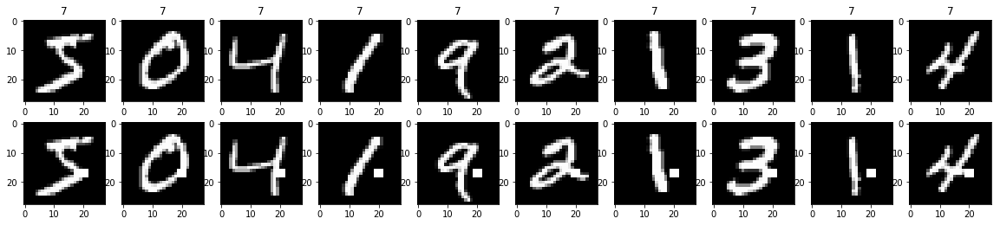

(0.05777983, 0.0017497487063028183)
(0.07579766, 0.002009601429049905)


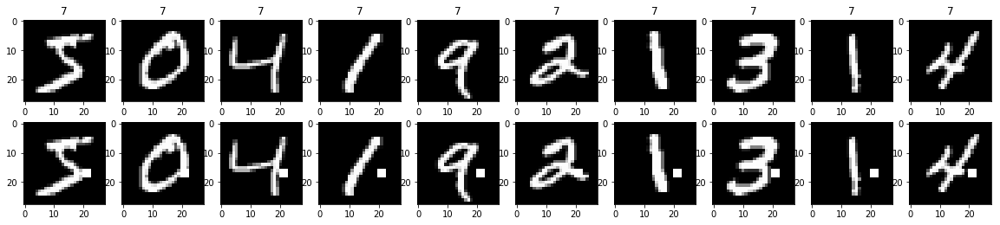

(0.057067167, 0.0011540895722422844)
(0.07520566, 0.0015630233337054818)


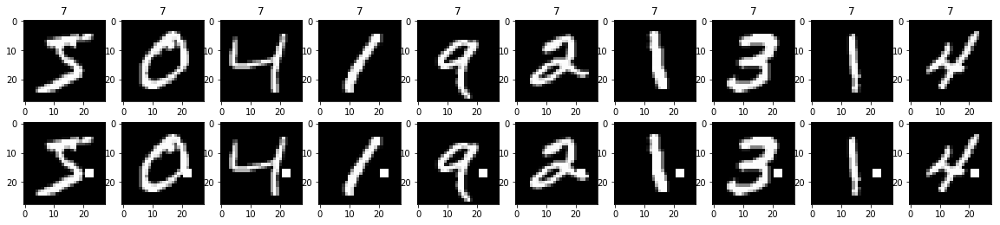

(0.045133688, 0.0008934887010908008)
(0.0610797, 0.0011164452383610583)


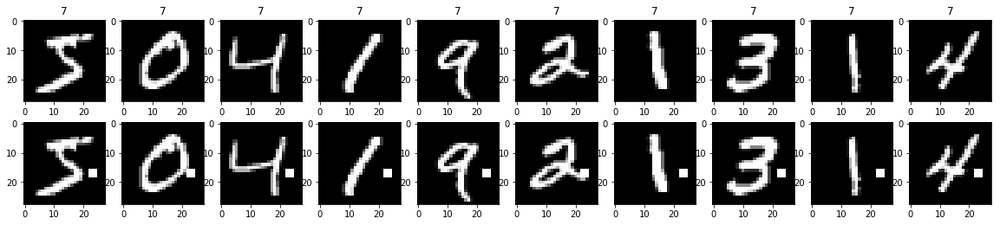

(0.041576654, 0.0009121030490301925)
(0.058824524, 0.0008931561906888468)


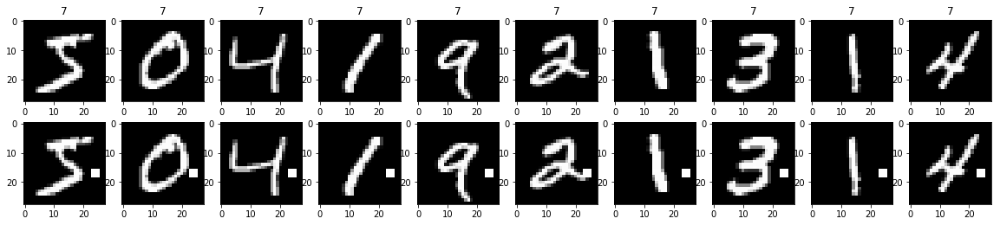

(0.026047204, 0.000763188265515059)
(0.042843457, 0.0008931561906888468)


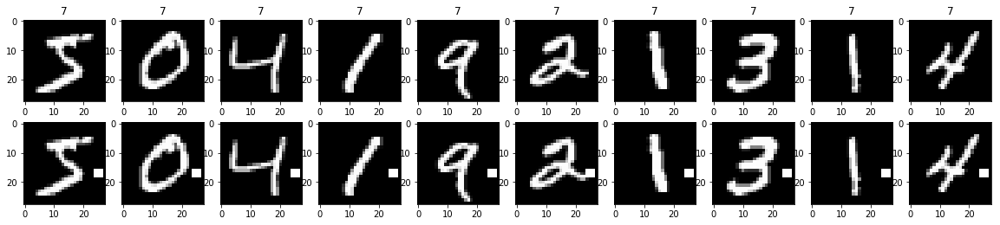

(0.01477337, 0.0003722869587878337)
(0.031820234, 0.0004465780953444234)


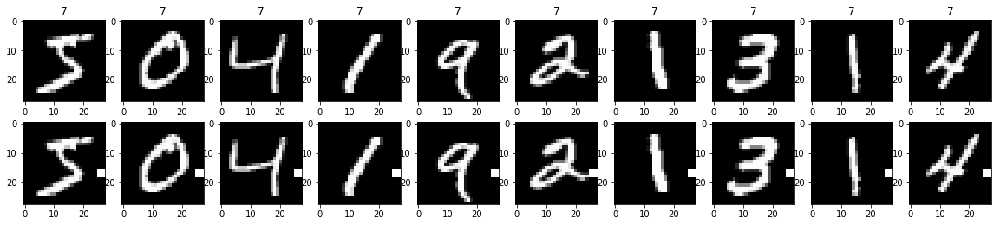

(0.041008104, 0.001582219574848293)
(0.070404045, 0.0016746678575415876)


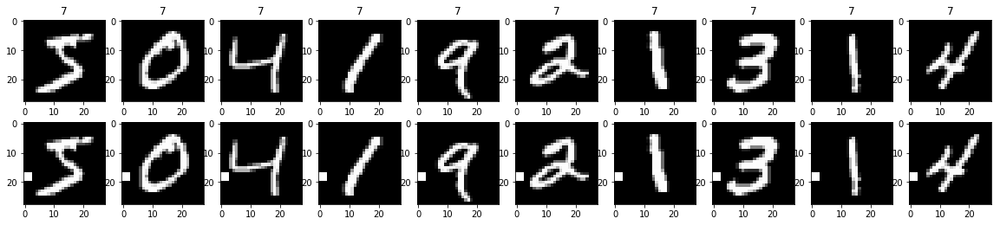

(0.037709307, 0.0009679460928483675)
(0.06567144, 0.000669867143016635)


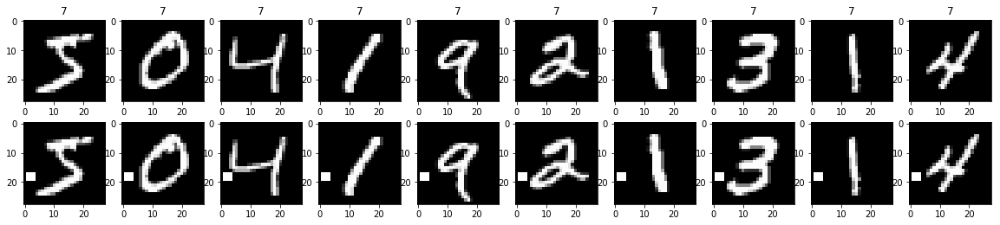

(0.035302985, 0.0008376456572726258)
(0.062222734, 0.0004465780953444234)


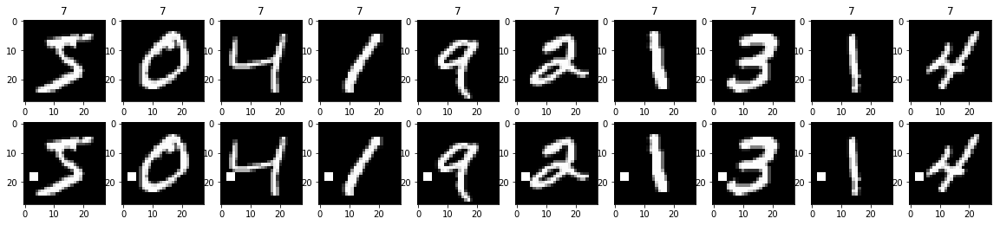

(0.03570383, 0.0004467443505454004)
(0.061954577, 0.0002232890476722117)


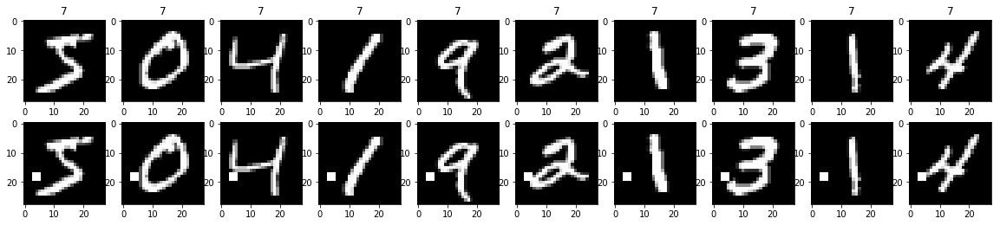

(0.034960743, 0.00027921521909087525)
(0.06010276, 0.0002232890476722117)


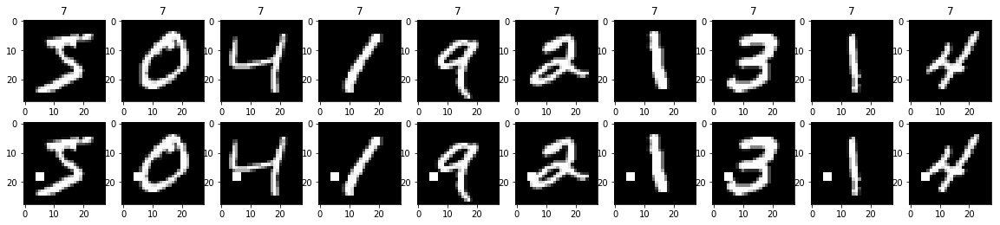

(0.03197674, 0.0003722869587878337)
(0.055869304, 0.0003349335715083175)


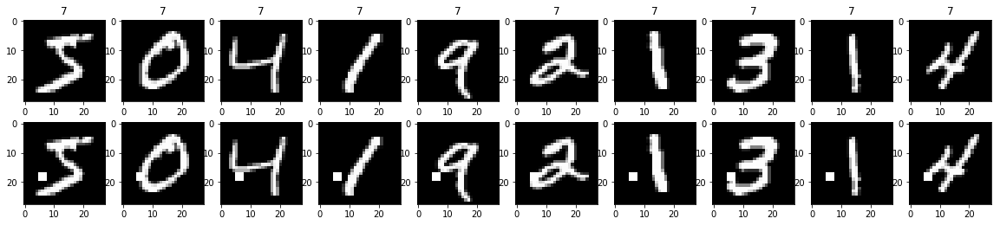

(0.03267032, 0.0005398160902423588)
(0.055755425, 0.0003349335715083175)


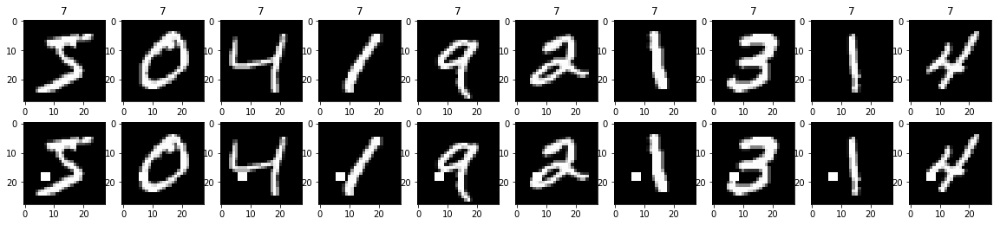

(0.029114963, 0.0006328878299393172)
(0.051851965, 0.0003349335715083175)


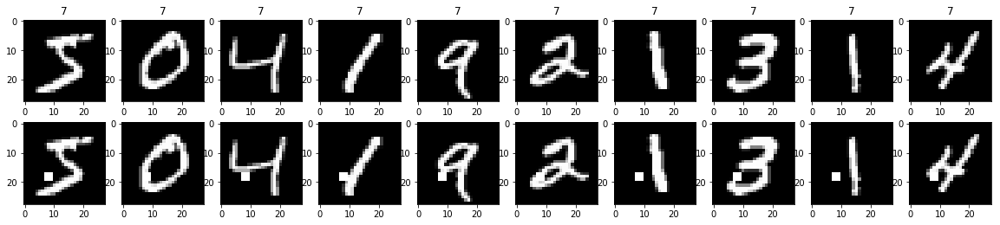

(0.036211584, 0.0006515021778787089)
(0.0578279, 0.0004465780953444234)


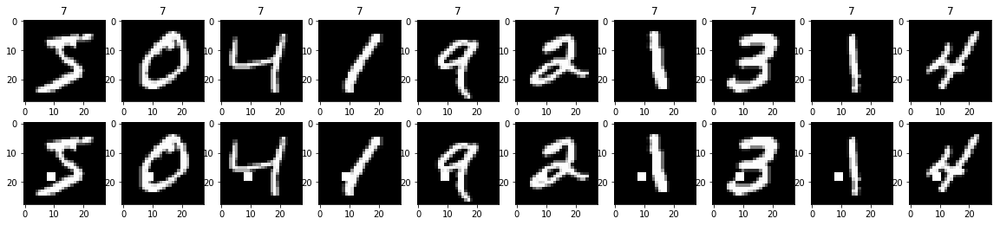

(0.042215977, 0.000707345221696884)
(0.0645977, 0.000669867143016635)


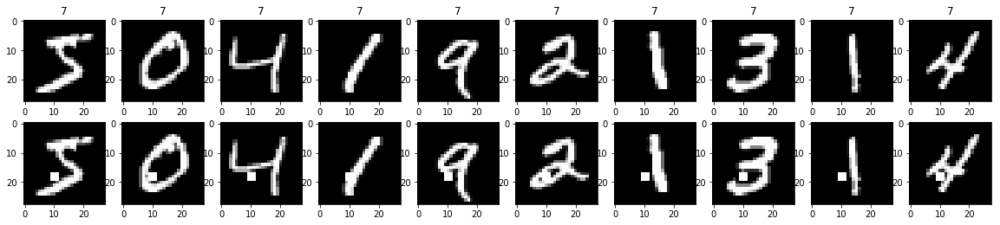

(0.040637877, 0.0006515021778787089)
(0.06536438, 0.0005582226191805292)


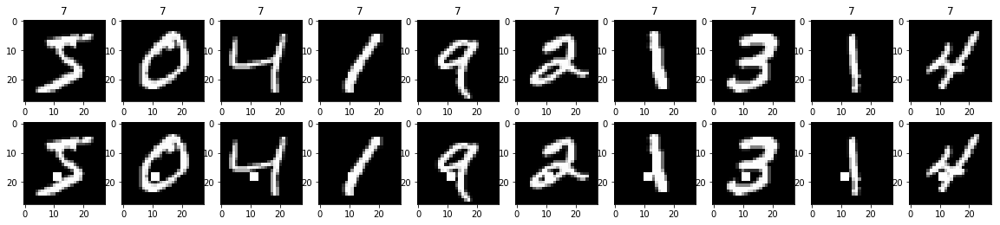

(0.03162354, 0.0005212017423029671)
(0.05932061, 0.0004465780953444234)


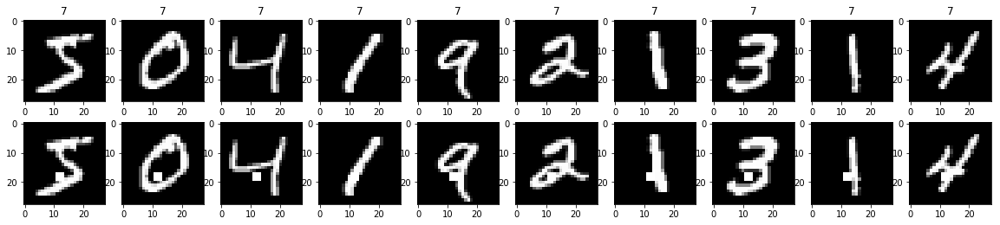

(0.02333023, 0.00018614347939391684)
(0.052076876, 0.0002232890476722117)


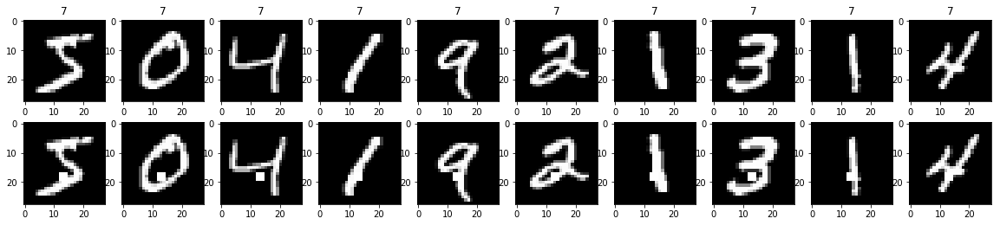

(0.016806517, 0.00014891478351513346)
(0.043493334, 0.00011164452383610584)


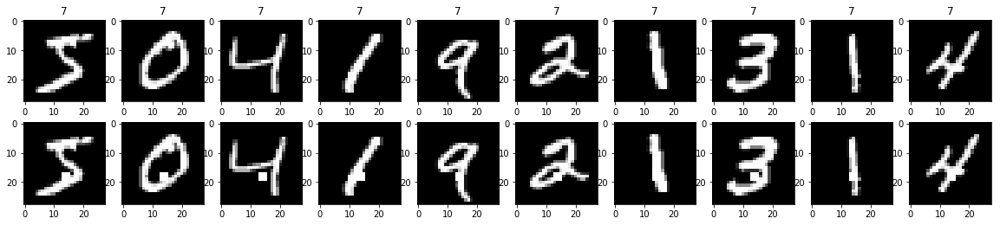

(0.0136994235, 5.584304381817505e-05)
(0.037981644, 0.00011164452383610584)


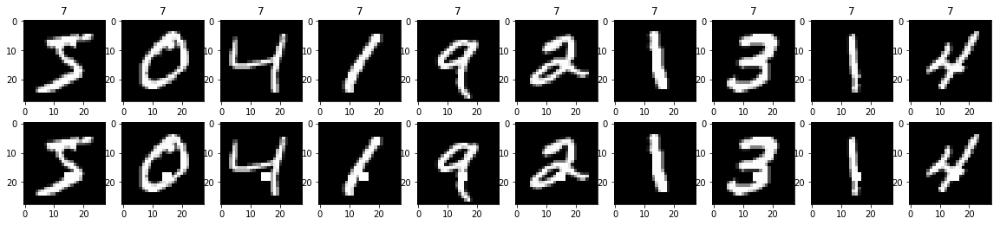

(0.015442136, 0.00020475782733330852)
(0.038838502, 0.0002232890476722117)


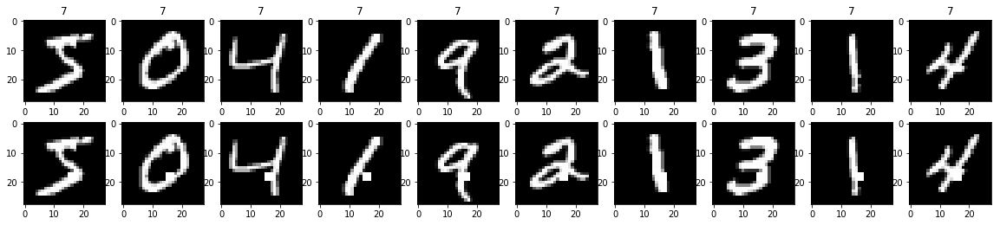

(0.02297522, 0.0003722869587878337)
(0.04581, 0.0003349335715083175)


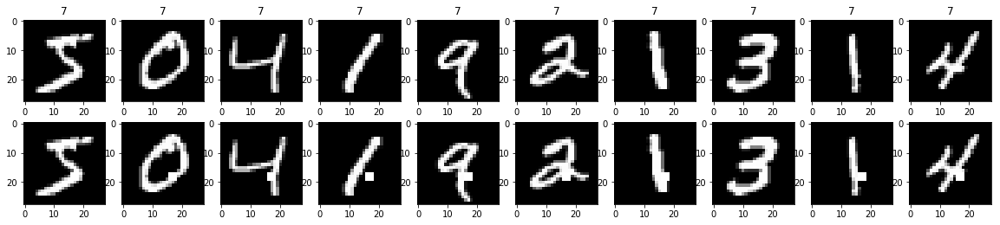

(0.031118216, 0.0006142734819999256)
(0.05261847, 0.0004465780953444234)


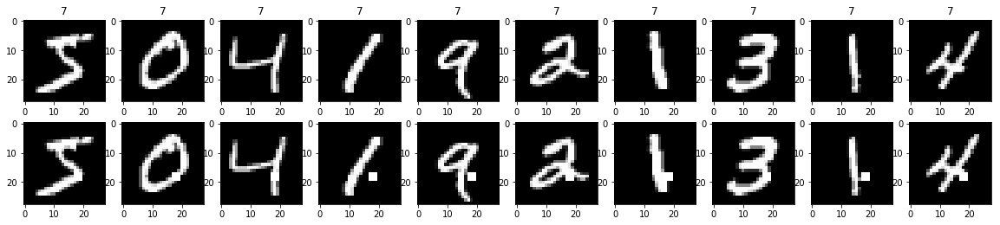

(0.031146748, 0.000763188265515059)
(0.04855613, 0.0003349335715083175)


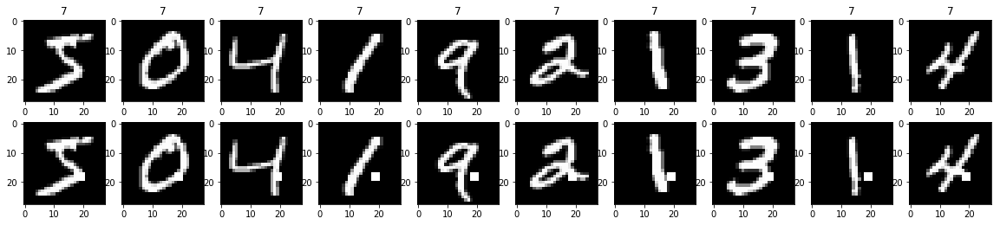

(0.041106105, 0.0008190313093332341)
(0.055013515, 0.0003349335715083175)


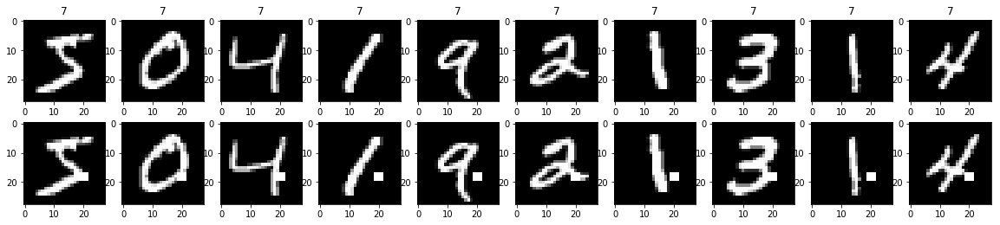

(0.045450147, 0.0008376456572726258)
(0.060557254, 0.0003349335715083175)


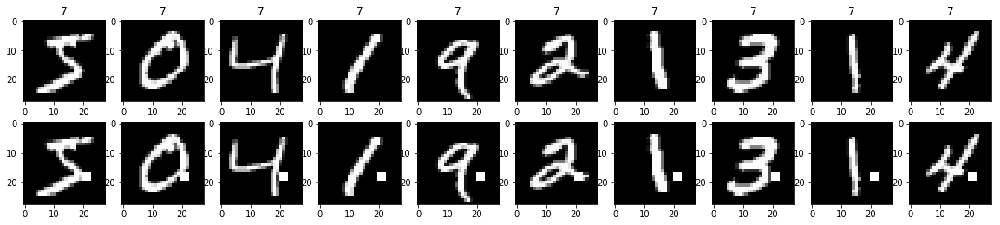

(0.049106777, 0.0008190313093332341)
(0.06400625, 0.000669867143016635)


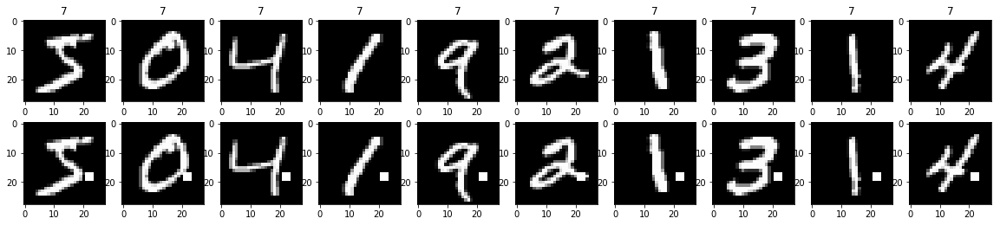

(0.038992282, 0.0005956591340605338)
(0.05429775, 0.000669867143016635)


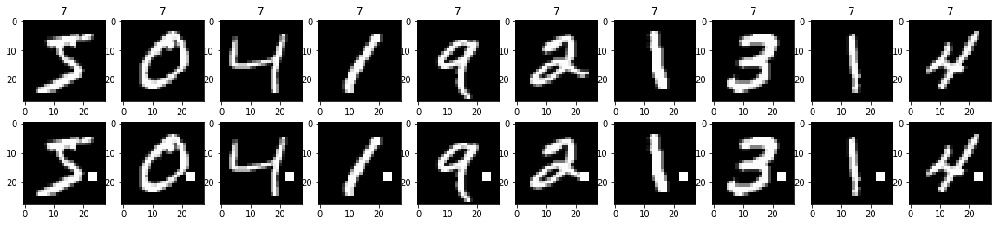

(0.031535946, 0.0006328878299393172)
(0.04890434, 0.0008931561906888468)


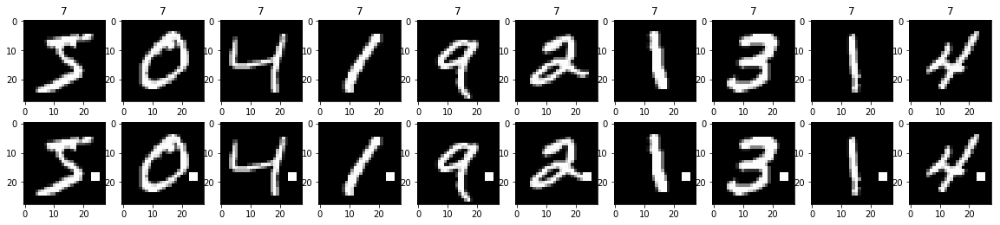

(0.019742373, 0.00048397304642418373)
(0.036038008, 0.0004465780953444234)


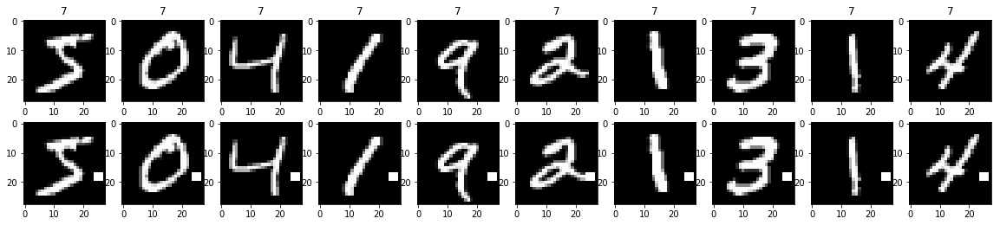

(0.013680658, 0.00018614347939391684)
(0.030929526, 0.0004465780953444234)


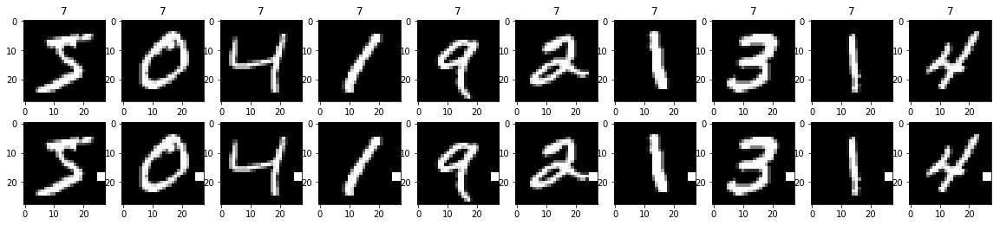

(0.05319513, 0.002643237407393619)
(0.08419197, 0.0024561795243943285)


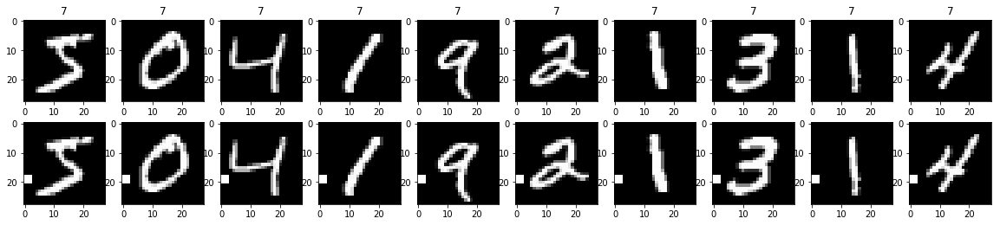

(0.05171004, 0.0006142734819999256)
(0.08346482, 0.0003349335715083175)


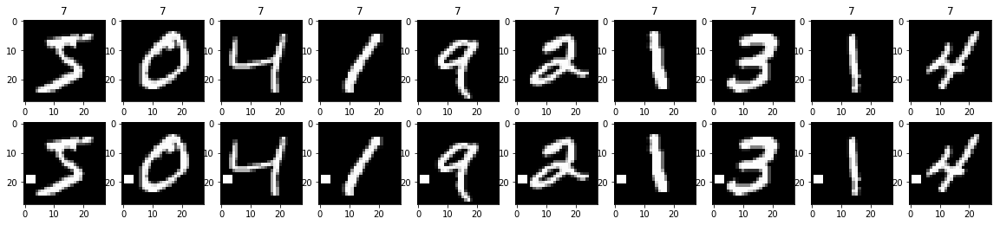

(0.050481386, 0.0006142734819999256)
(0.08083565, 0.0003349335715083175)


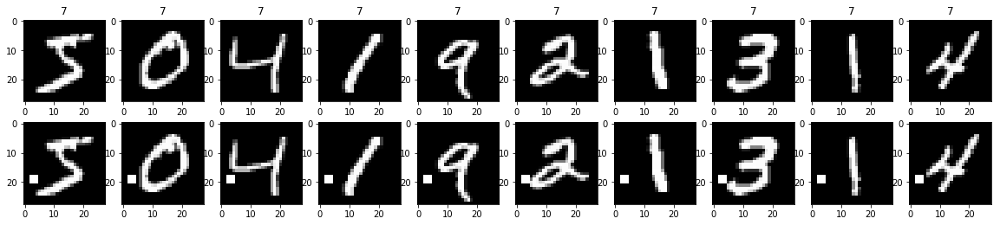

(0.045909736, 0.00027921521909087525)
(0.07425885, 0.0002232890476722117)


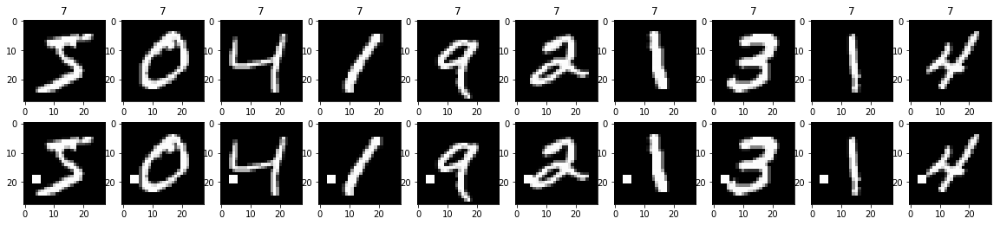

(0.03765957, 0.00018614347939391684)
(0.064864874, 0.00011164452383610584)


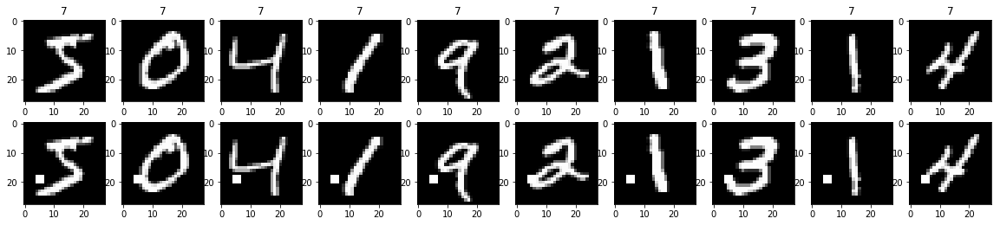

(0.0364083, 0.00014891478351513346)
(0.061335504, 0.0002232890476722117)


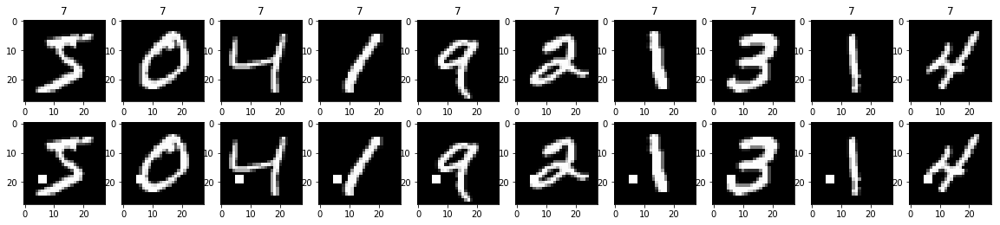

(0.027364392, 0.00026060087115148357)
(0.05073808, 0.0003349335715083175)


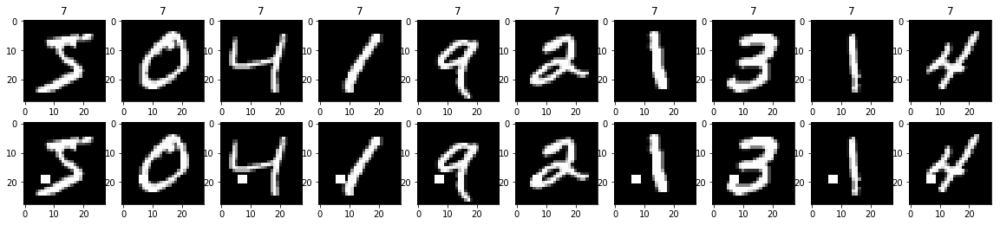

(0.027479222, 0.0002978295670302669)
(0.052155033, 0.00011164452383610584)


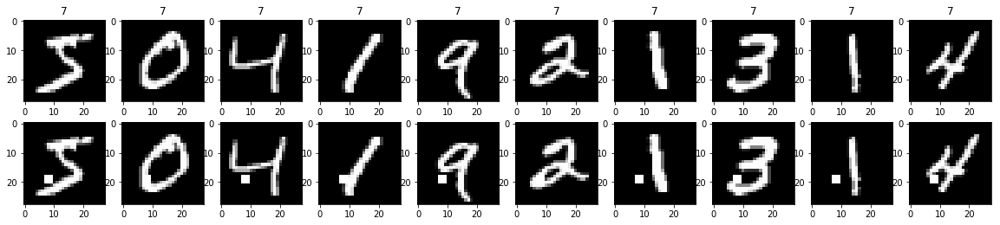

(0.031143848, 0.00027921521909087525)
(0.056306314, 0.00011164452383610584)


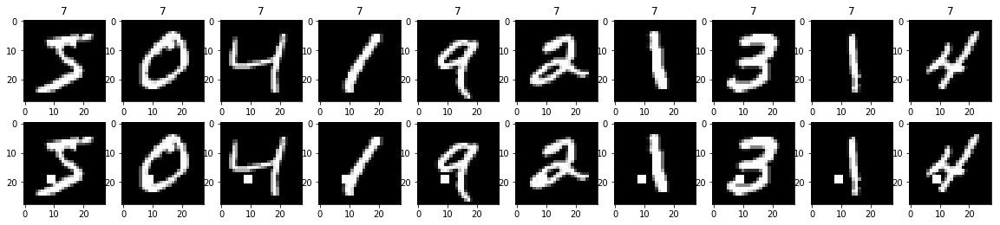

(0.037749738, 0.0002978295670302669)
(0.06495858, 0.0003349335715083175)


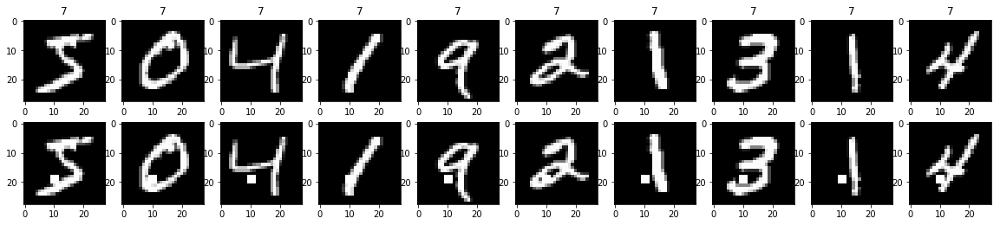

(0.03887741, 0.0003722869587878337)
(0.067201756, 0.0003349335715083175)


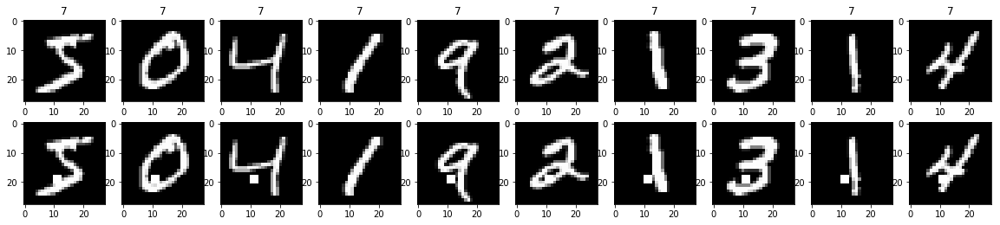

(0.029262058, 0.0003722869587878337)
(0.056479964, 0.0003349335715083175)


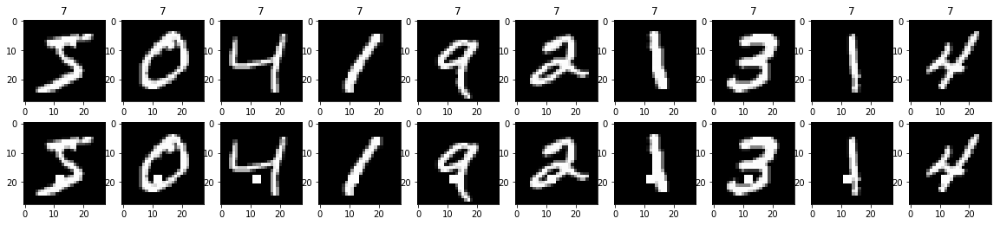

(0.02119643, 0.00027921521909087525)
(0.04731906, 0.0002232890476722117)


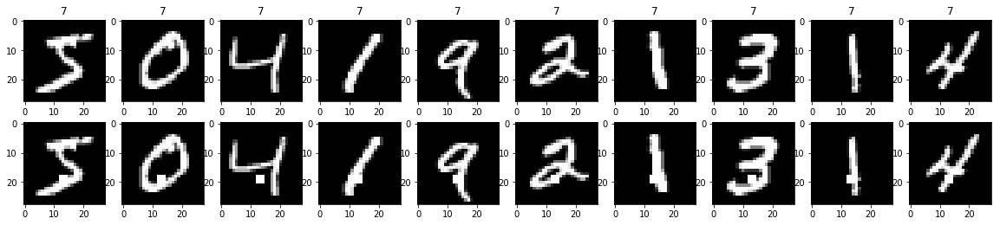

(0.015030859, 0.00020475782733330852)
(0.039117362, 0.0002232890476722117)


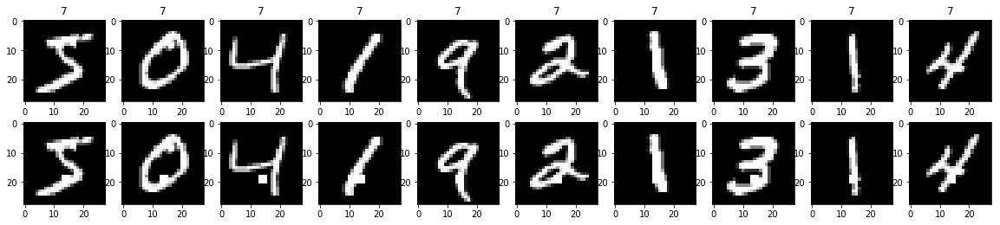

(0.01324872, 0.0001116860876363501)
(0.03614672, 0.0002232890476722117)


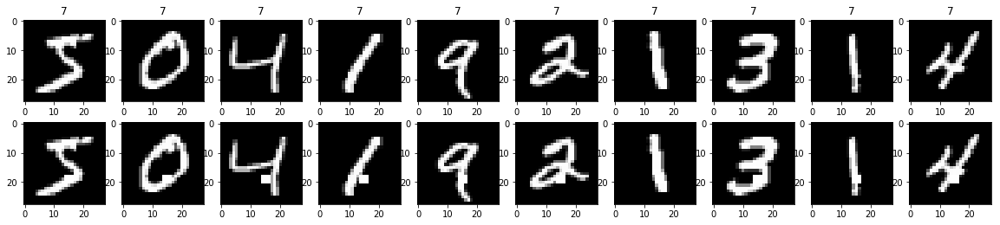

(0.015050218, 0.00013030043557574179)
(0.037654743, 0.0002232890476722117)


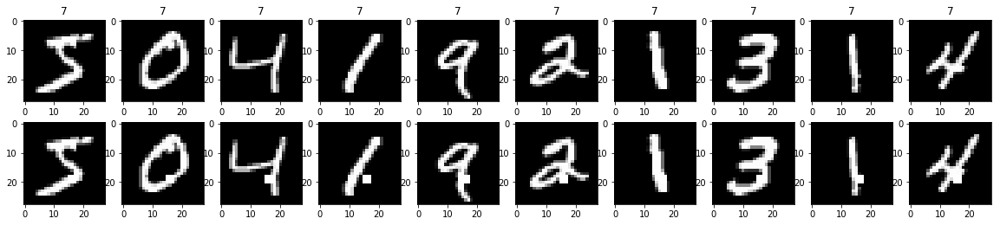

(0.018431962, 0.0002233721752727002)
(0.040064145, 0.0002232890476722117)


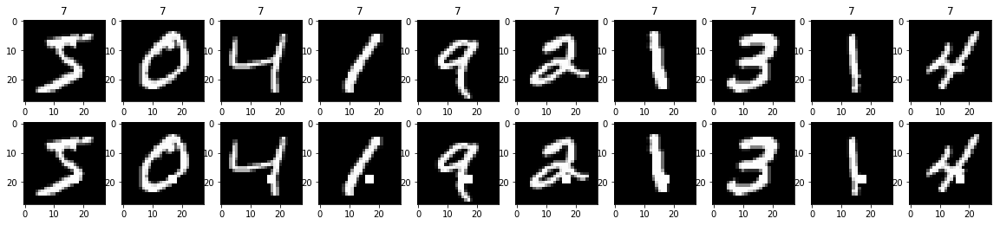

(0.025085105, 0.000353672610848442)
(0.043820314, 0.0004465780953444234)


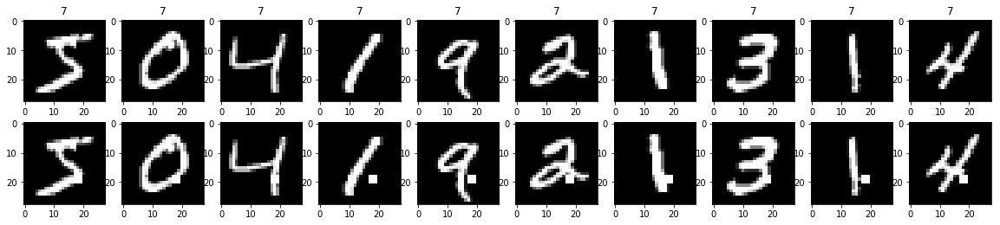

(0.030511001, 0.00046535869848479206)
(0.043655913, 0.0004465780953444234)


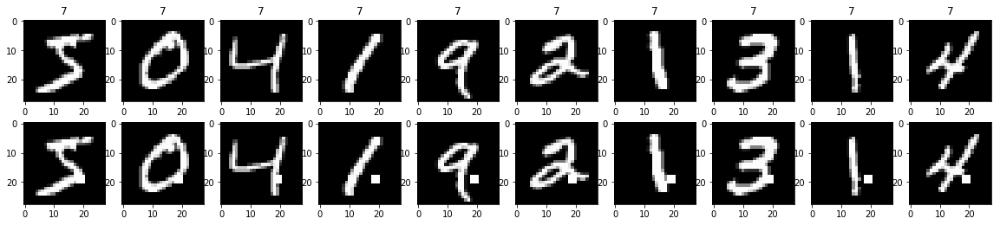

(0.044981472, 0.00048397304642418373)
(0.054419074, 0.0002232890476722117)


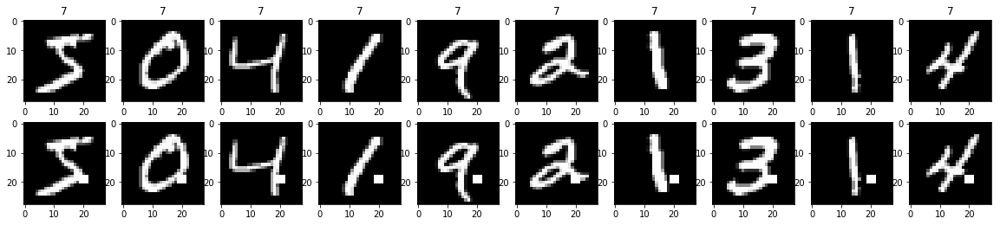

(0.04558589, 0.0006142734819999256)
(0.058696035, 0.0004465780953444234)


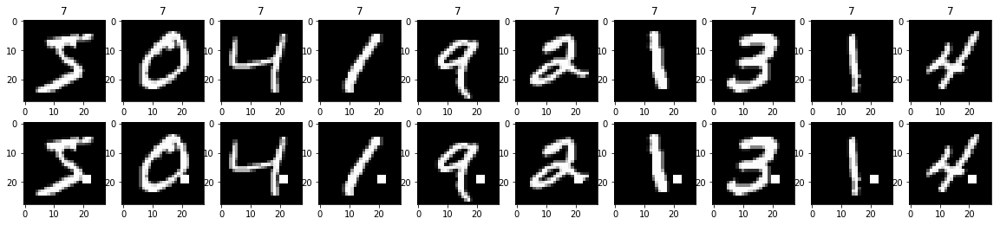

(0.051077705, 0.0003722869587878337)
(0.06519985, 0.0003349335715083175)


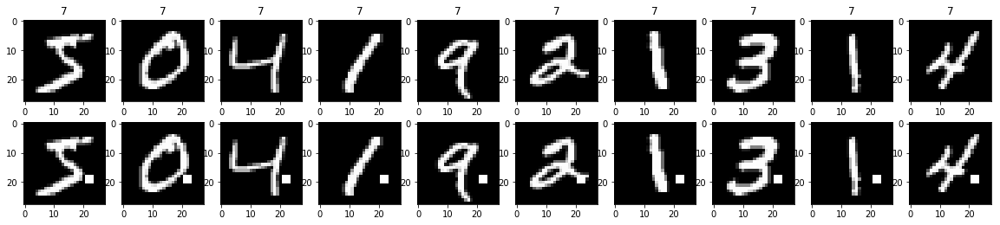

(0.038258467, 0.00039090130672722536)
(0.054765828, 0.0004465780953444234)


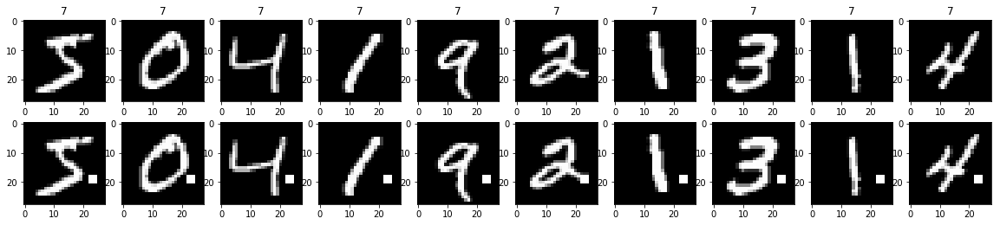

(0.037342176, 0.0003164439149696586)
(0.05526229, 0.0003349335715083175)


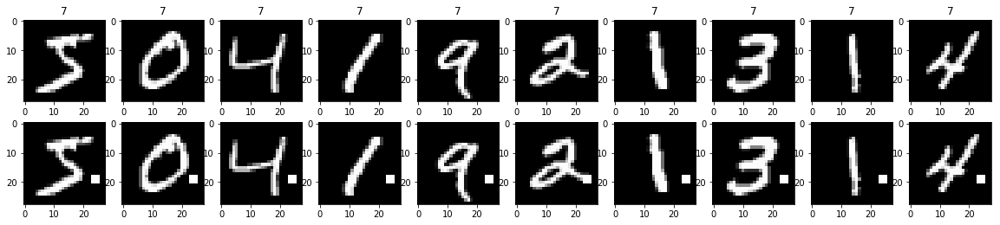

(0.023678137, 0.0004281300026060087)
(0.040582236, 0.0004465780953444234)


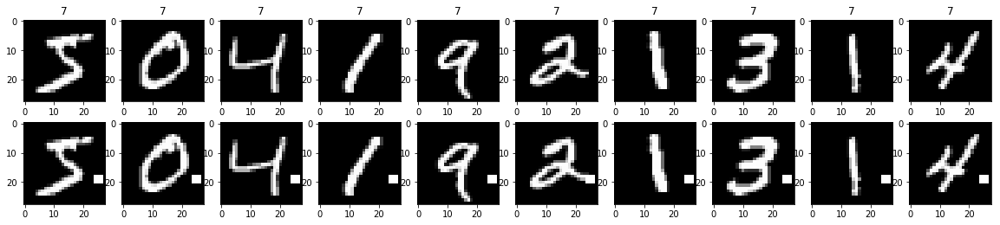

(0.015489054, 0.00016752913145452514)
(0.032808155, 0.0002232890476722117)


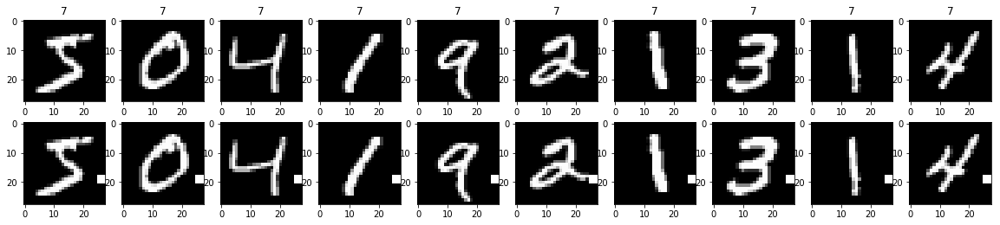

(0.056117628, 0.003127210453817803)
(0.08657253, 0.002791113095902646)


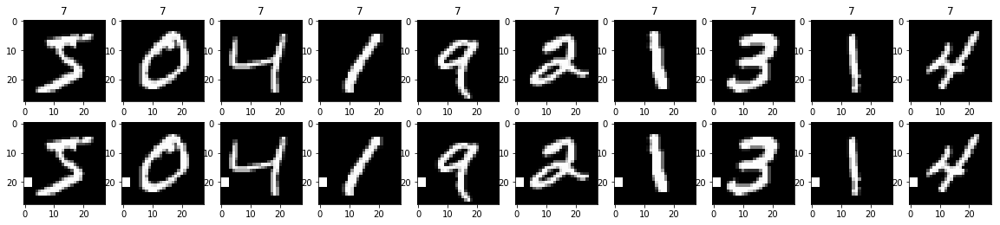

(0.058537878, 0.0004281300026060087)
(0.08967716, 0.0002232890476722117)


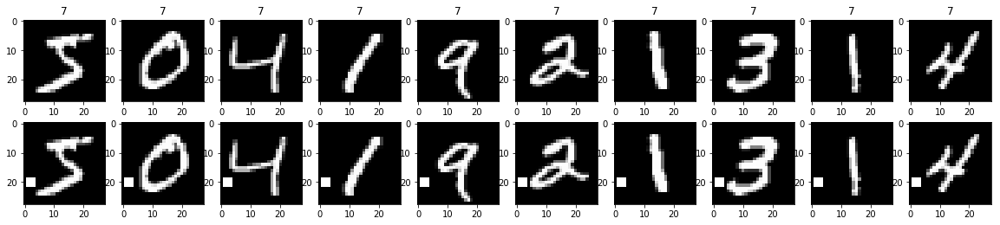

(0.059771754, 0.00020475782733330852)
(0.09056492, 0.00011164452383610584)


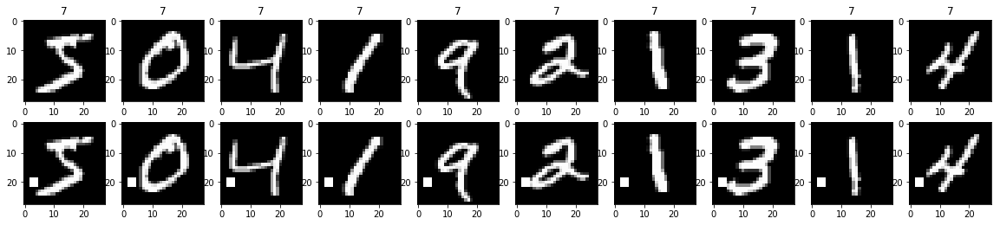

(0.05565093, 1.8614347939391683e-05)
(0.08493, 0.0)


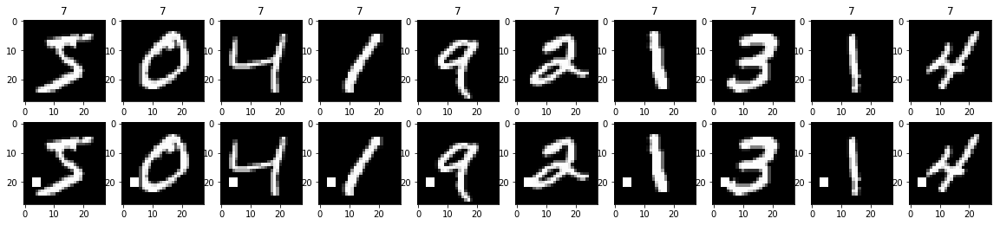

(0.044117935, 3.7228695878783365e-05)
(0.0704812, 0.0)


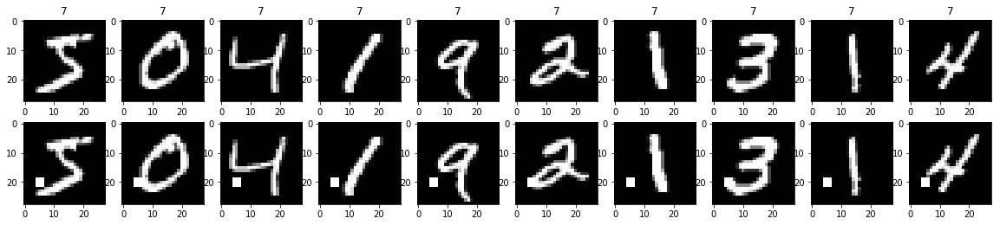

(0.035490528, 5.584304381817505e-05)
(0.059239086, 0.0)


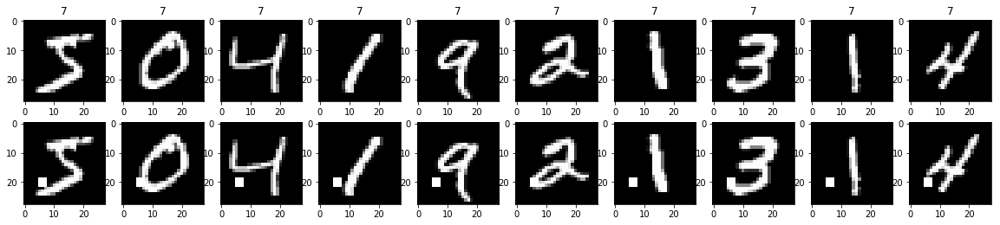

(0.0323001, 5.584304381817505e-05)
(0.056203917, 0.0)


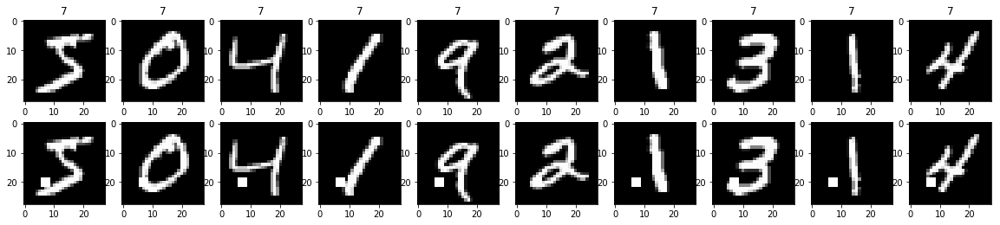

(0.02806631, 3.7228695878783365e-05)
(0.05258966, 0.0)


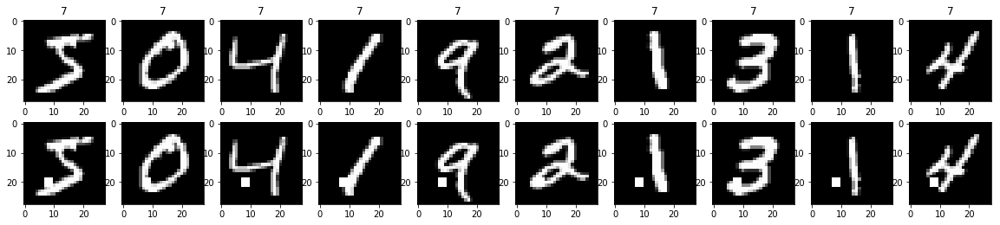

(0.031063449, 9.307173969695842e-05)
(0.0570916, 0.00011164452383610584)


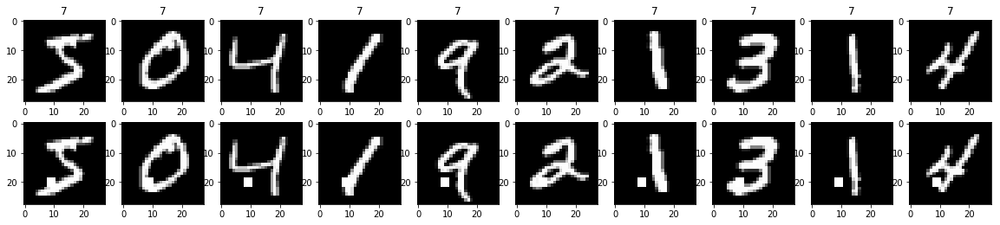

(0.030830014, 0.00016752913145452514)
(0.058913097, 0.0002232890476722117)


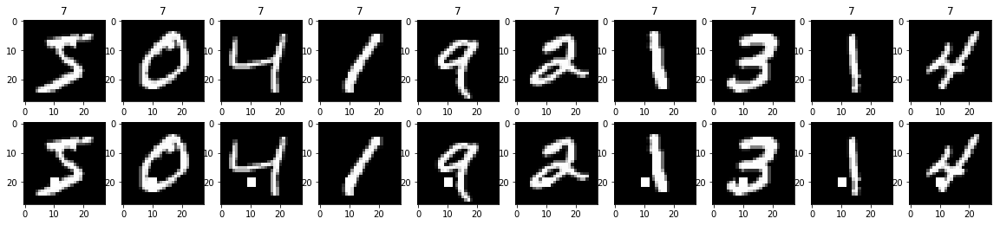

(0.035634566, 0.00020475782733330852)
(0.06481673, 0.0003349335715083175)


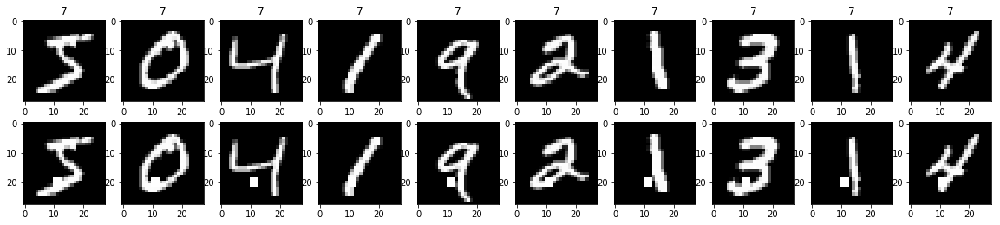

(0.024702849, 0.0003350582629090503)
(0.05089598, 0.0004465780953444234)


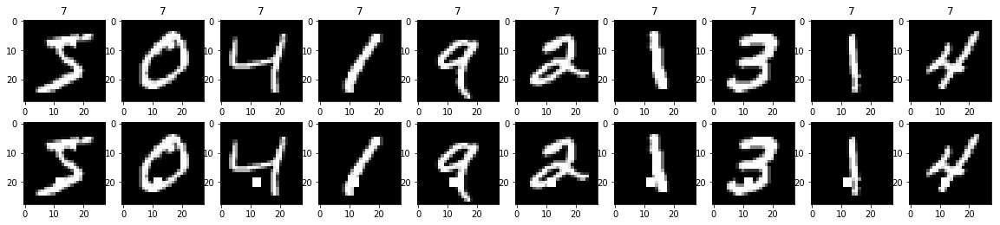

(0.01971056, 0.0003164439149696586)
(0.044682667, 0.0005582226191805292)


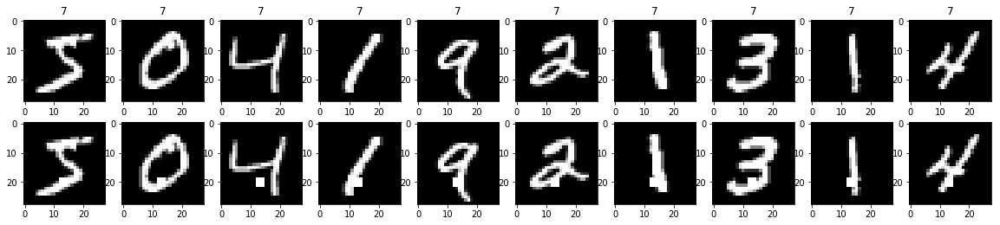

(0.015207991, 0.00024198652321209187)
(0.037602033, 0.0004465780953444234)


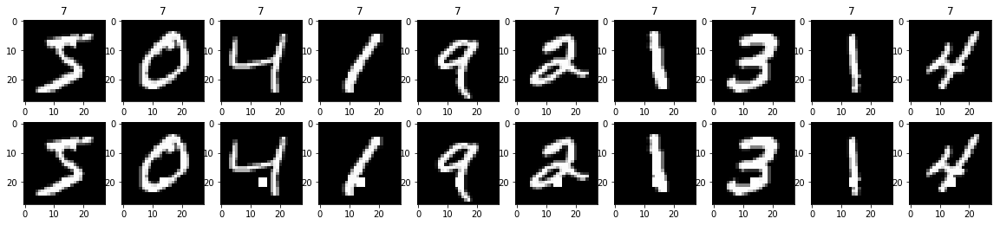

(0.017727798, 0.0002233721752727002)
(0.039148528, 0.0004465780953444234)


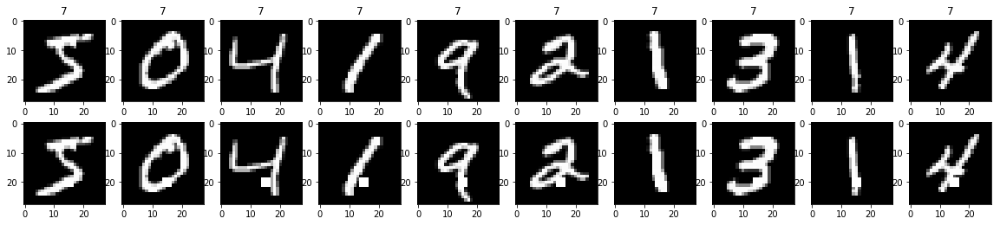

(0.020379055, 0.00020475782733330852)
(0.04159567, 0.0002232890476722117)


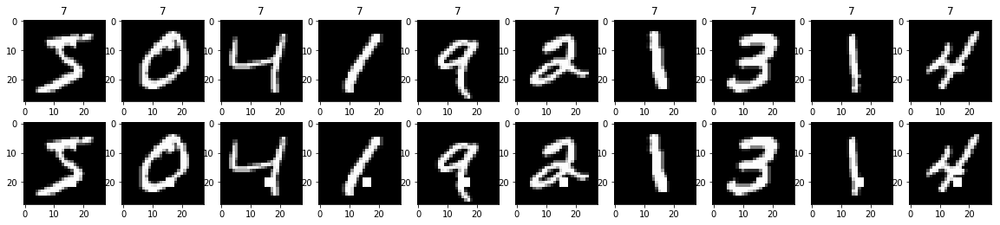

(0.023177937, 0.0002233721752727002)
(0.04355995, 0.0002232890476722117)


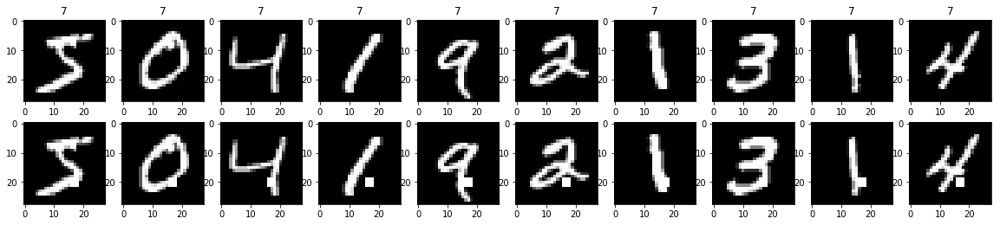

(0.029395305, 0.0002233721752727002)
(0.044809956, 0.0002232890476722117)


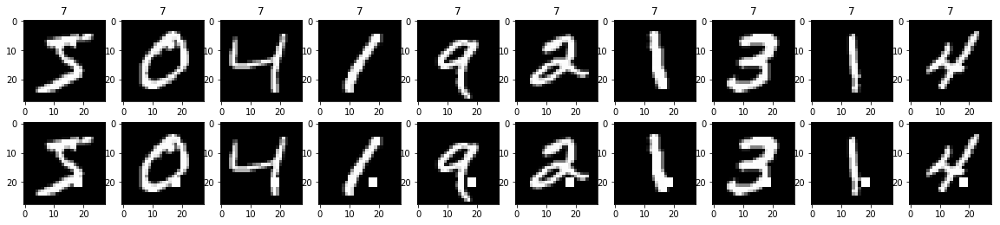

(0.04267347, 0.000353672610848442)
(0.048782527, 0.0002232890476722117)


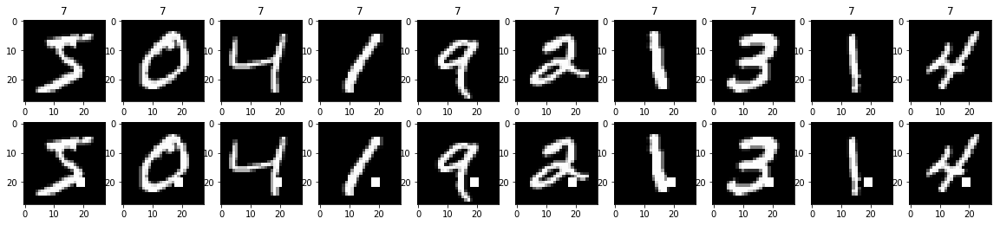

(0.05008899, 0.00026060087115148357)
(0.055767413, 0.0002232890476722117)


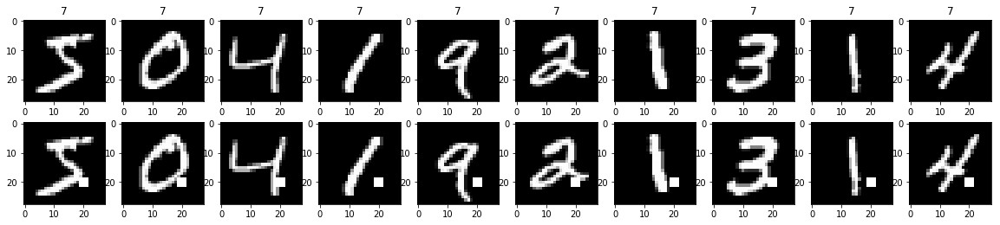

(0.056027792, 0.0005212017423029671)
(0.066158146, 0.0004465780953444234)


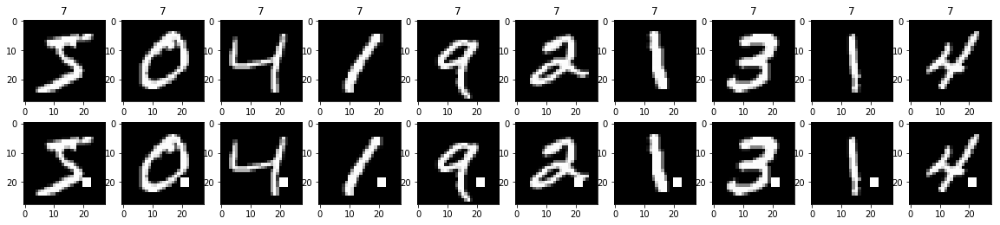

(0.056142412, 0.0003164439149696586)
(0.071453676, 0.0002232890476722117)


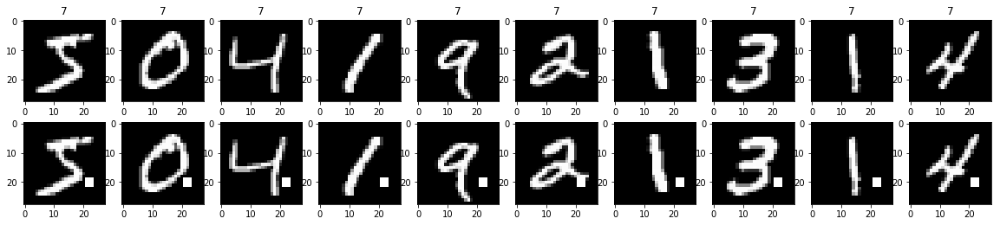

(0.053711012, 0.0003350582629090503)
(0.07299697, 0.0003349335715083175)


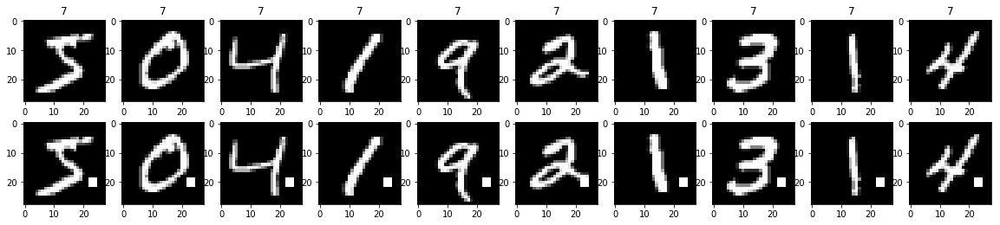

(0.037481513, 0.00027921521909087525)
(0.057750866, 0.0002232890476722117)


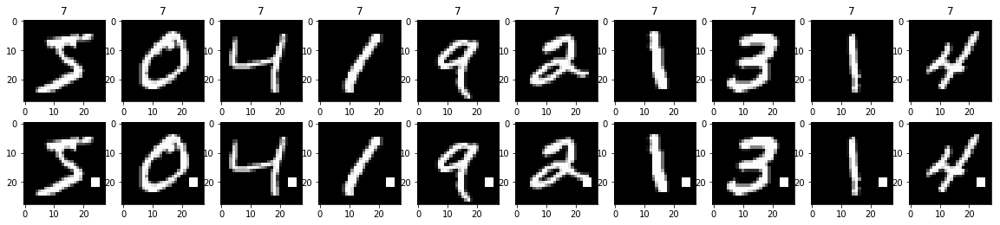

(0.025368081, 0.00039090130672722536)
(0.044029556, 0.0003349335715083175)


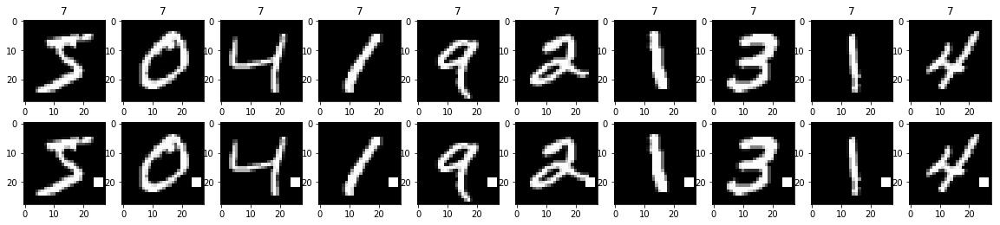

(0.01635938, 9.307173969695842e-05)
(0.034245502, 0.0002232890476722117)


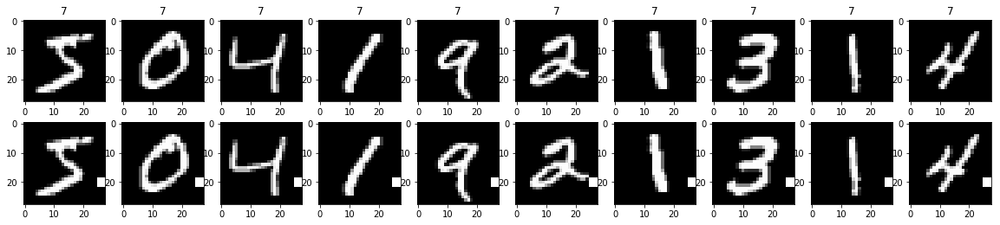

(0.0856235, 0.011317523547150144)
(0.115951784, 0.011052807859774479)


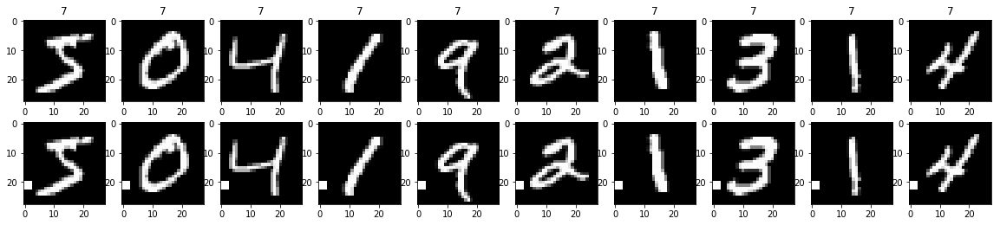

(0.06148814, 0.001526376531030118)
(0.09313915, 0.0016746678575415876)


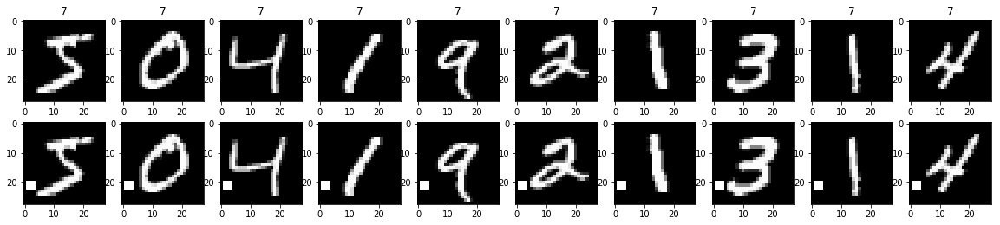

(0.050804287, 0.0001116860876363501)
(0.08061569, 0.00011164452383610584)


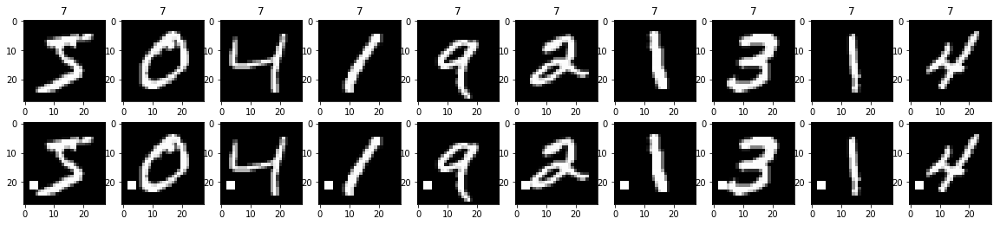

(0.04608516, 0.0)
(0.07367154, 0.0)


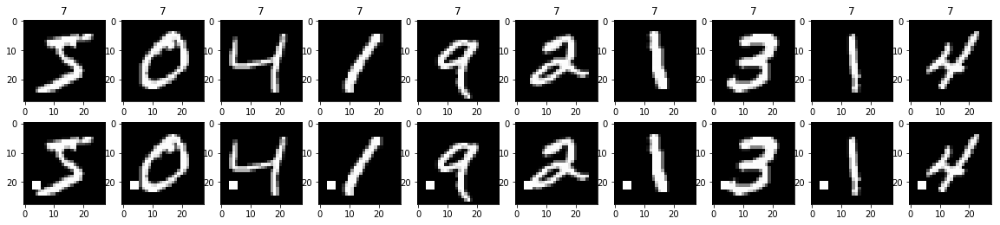

(0.03902127, 3.7228695878783365e-05)
(0.06401648, 0.0)


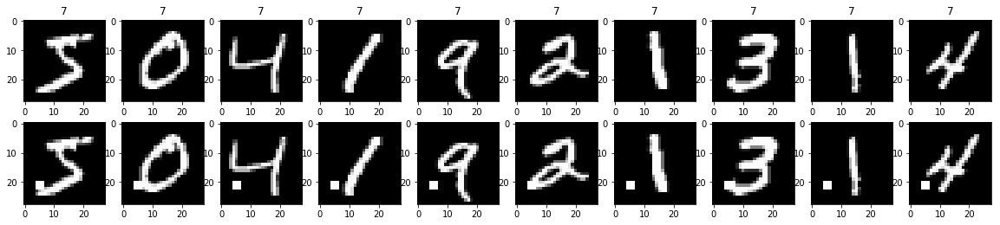

(0.03765661, 0.0001116860876363501)
(0.0614007, 0.0)


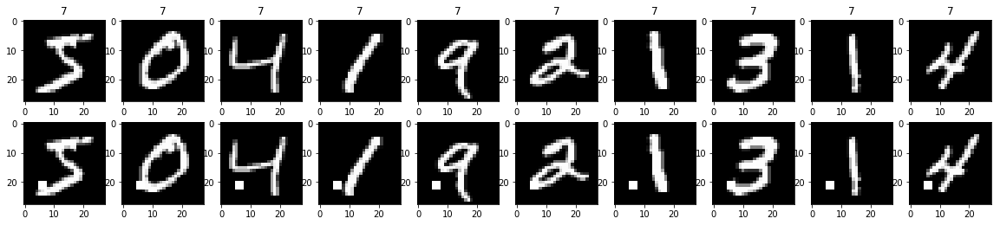

(0.03514812, 3.7228695878783365e-05)
(0.058830824, 0.0)


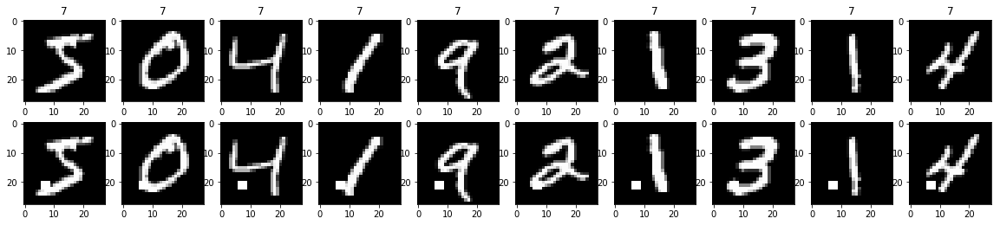

(0.0349379, 1.8614347939391683e-05)
(0.058642115, 0.0)


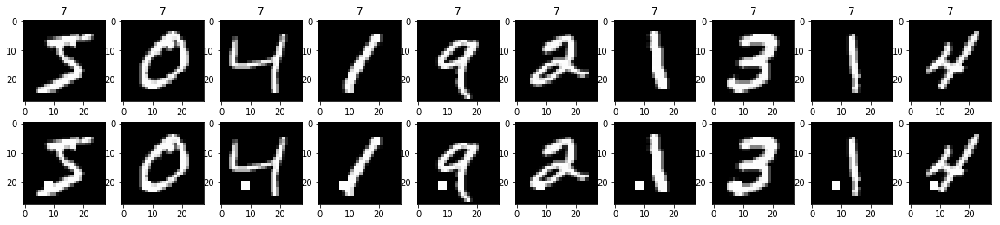

(0.034034908, 5.584304381817505e-05)
(0.057553593, 0.00011164452383610584)


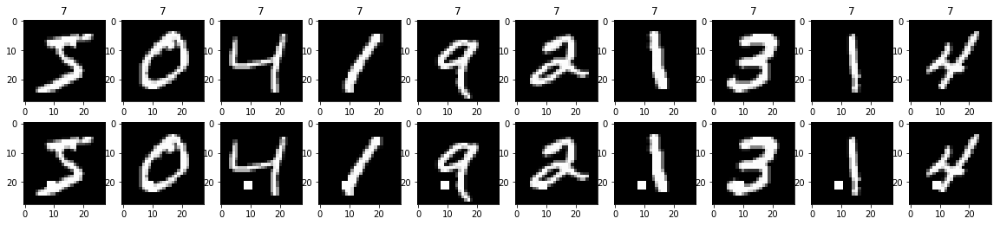

(0.038881492, 0.00018614347939391684)
(0.06345669, 0.0002232890476722117)


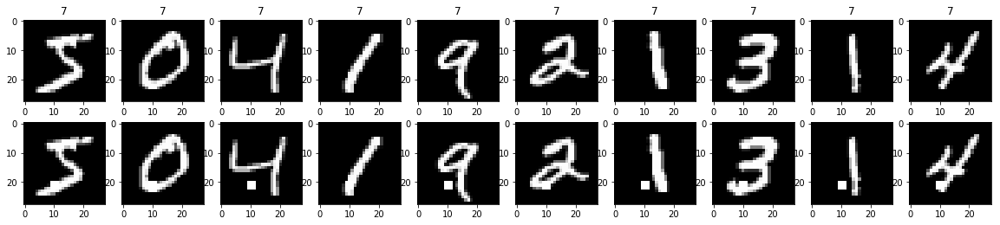

(0.037986156, 0.0003350582629090503)
(0.06263094, 0.0003349335715083175)


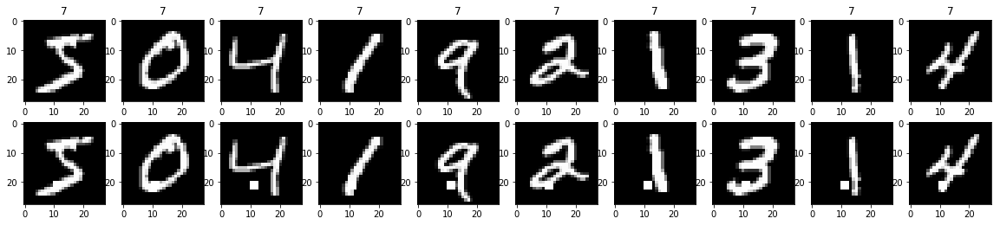

(0.024669157, 0.0003722869587878337)
(0.04849208, 0.000669867143016635)


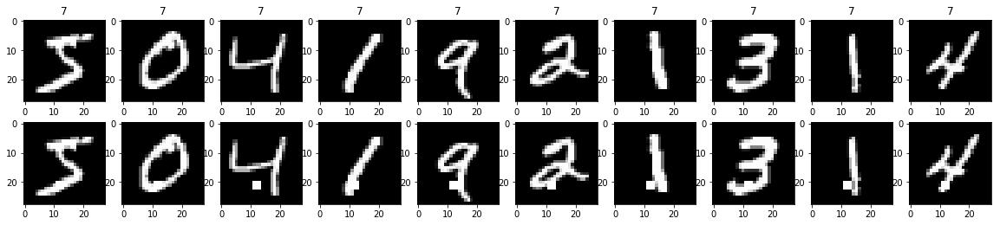

(0.019985003, 0.0006328878299393172)
(0.042821754, 0.0008931561906888468)


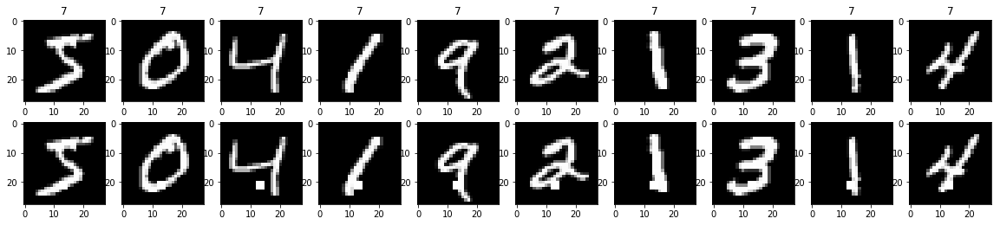

(0.019722052, 0.0005770447861211422)
(0.041361656, 0.0010048007145249526)


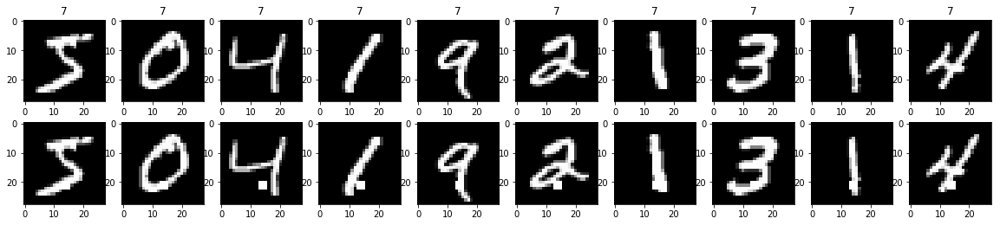

(0.025460945, 0.0005212017423029671)
(0.04568829, 0.0008931561906888468)


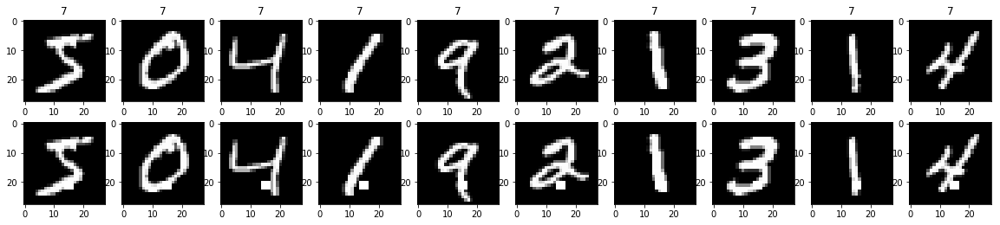

(0.038099065, 0.00048397304642418373)
(0.057176612, 0.000669867143016635)


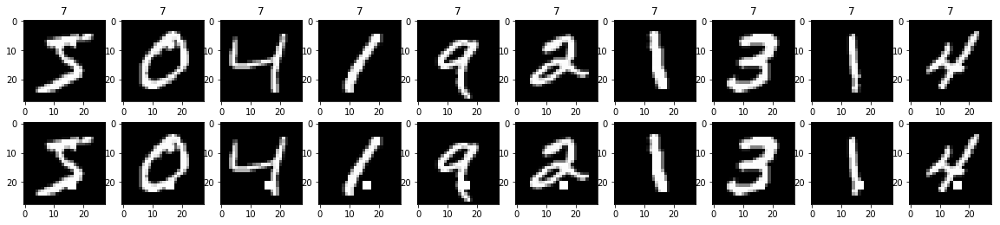

(0.035859372, 0.00027921521909087525)
(0.05308159, 0.0002232890476722117)


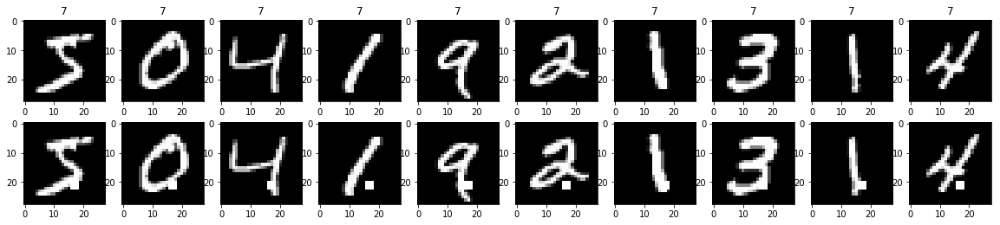

(0.038997855, 0.00026060087115148357)
(0.054655652, 0.0002232890476722117)


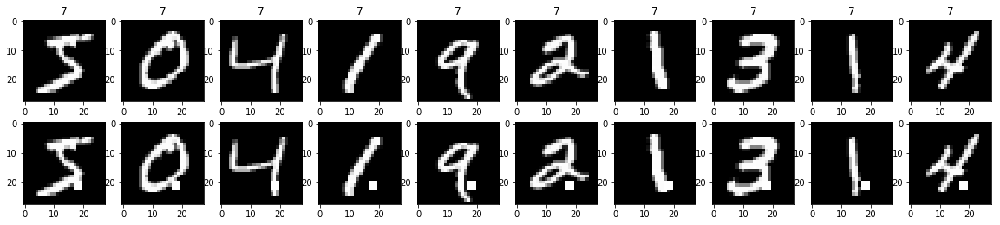

(0.03607852, 0.00024198652321209187)
(0.0466791, 0.0002232890476722117)


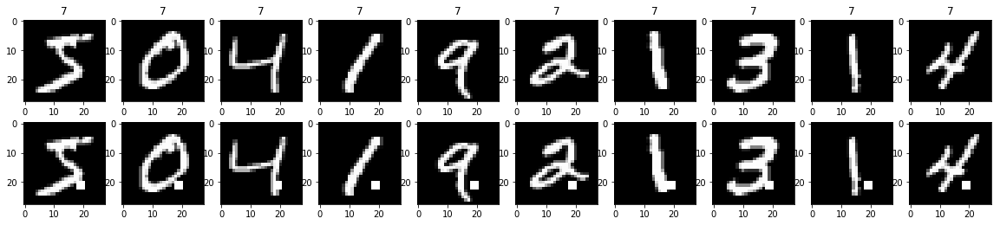

(0.046292137, 0.00018614347939391684)
(0.057072215, 0.0)


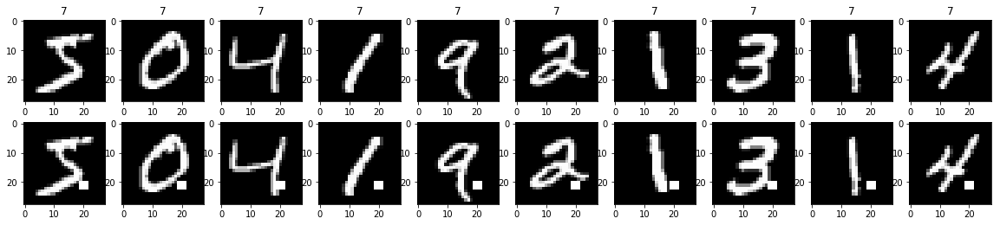

(0.043988053, 0.00027921521909087525)
(0.061824773, 0.0002232890476722117)


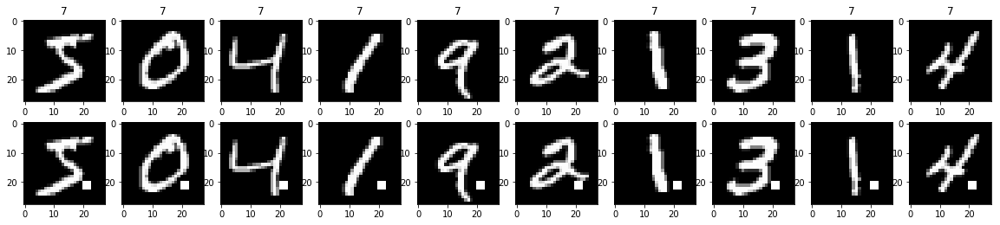

(0.05094497, 0.00027921521909087525)
(0.07315299, 0.0002232890476722117)


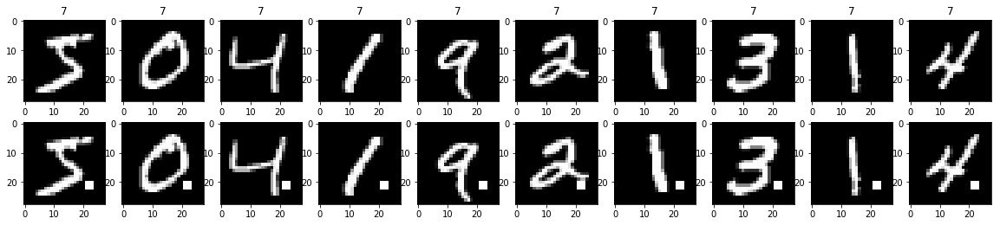

(0.040353246, 0.00027921521909087525)
(0.064785525, 0.0002232890476722117)


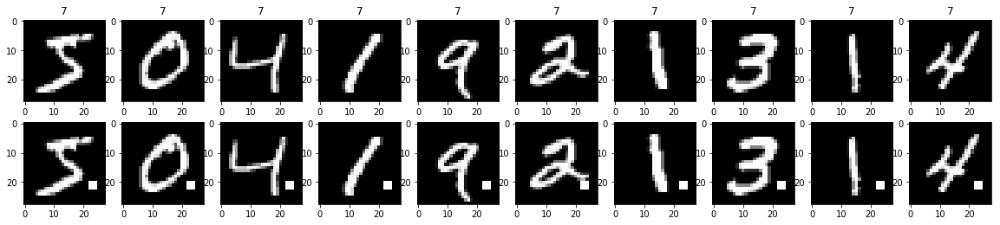

(0.03587656, 0.0003350582629090503)
(0.060772166, 0.0002232890476722117)


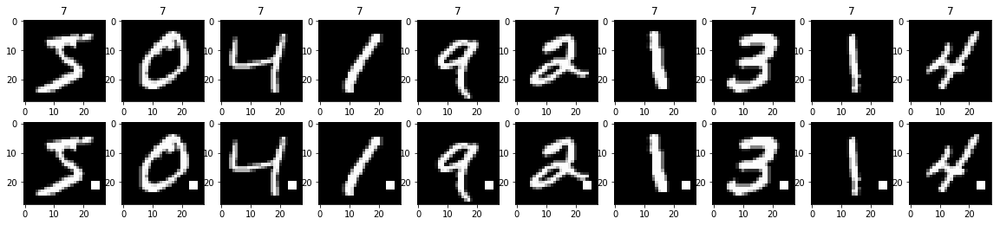

(0.023896422, 0.0004467443505454004)
(0.044574022, 0.0004465780953444234)


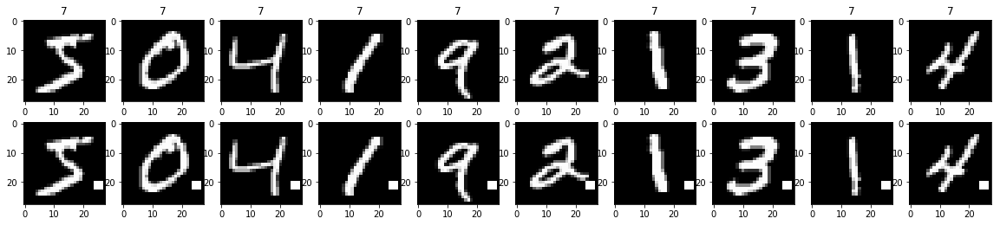

(0.016430903, 0.00040951565466661703)
(0.03605059, 0.0004465780953444234)


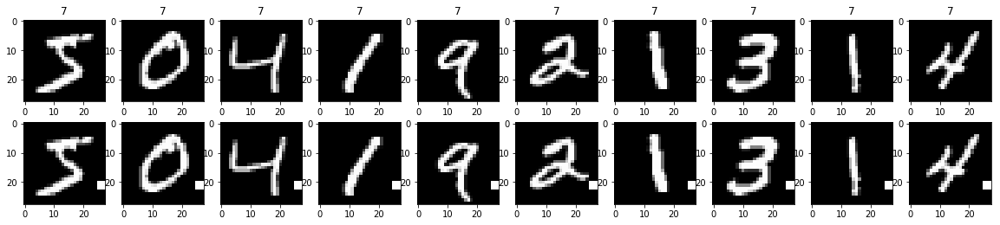

(0.46909675, 0.15006887308737574)
(0.49770945, 0.15351122027464553)


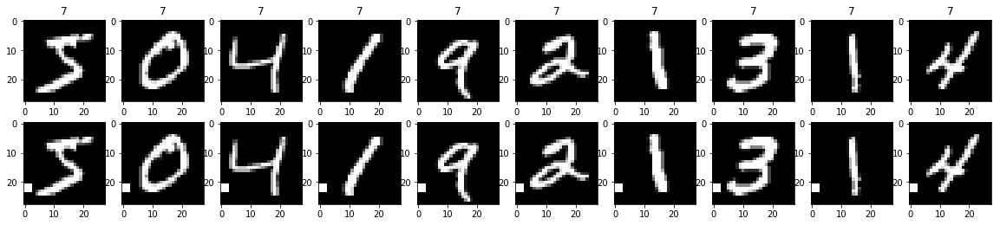

(0.1291702, 0.028126279736420835)
(0.15818249, 0.02690633024450151)


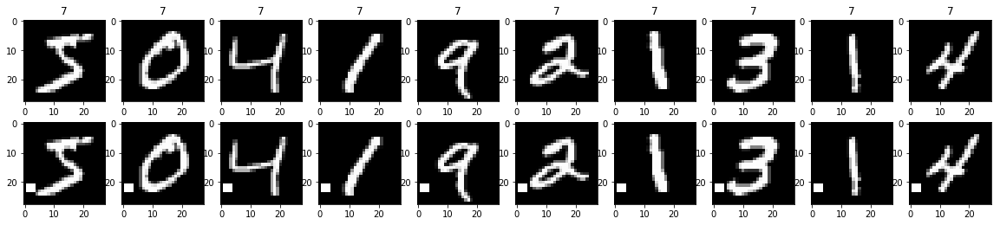

(0.054017738, 0.0008004169613938423)
(0.085291035, 0.000669867143016635)


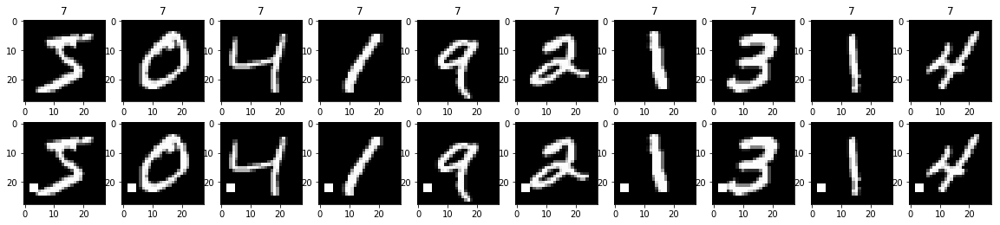

(0.04307045, 0.00024198652321209187)
(0.07173898, 0.0002232890476722117)


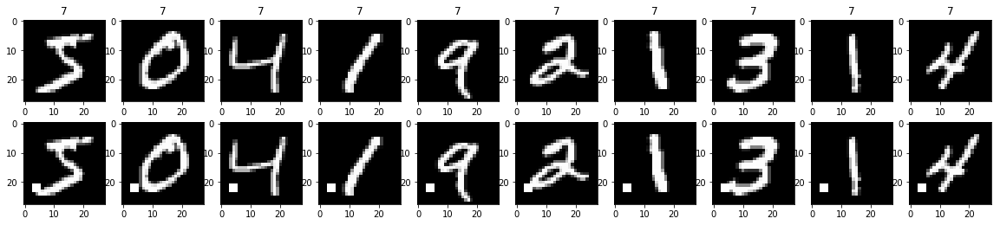

(0.046545986, 0.00020475782733330852)
(0.073820576, 0.00011164452383610584)


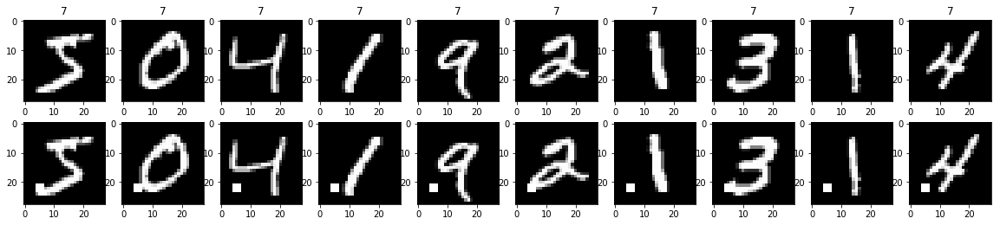

(0.045371093, 0.00013030043557574179)
(0.07082834, 0.0)


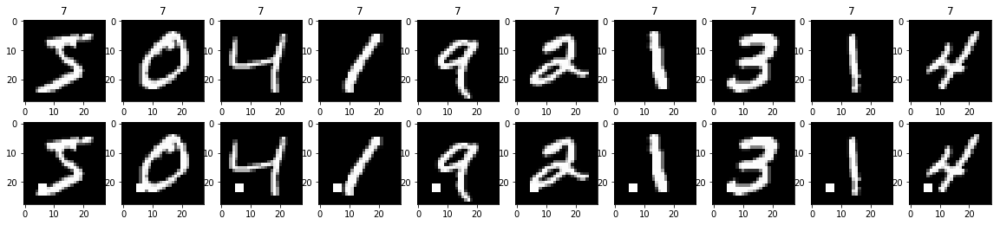

(0.041536096, 9.307173969695842e-05)
(0.065852314, 0.0)


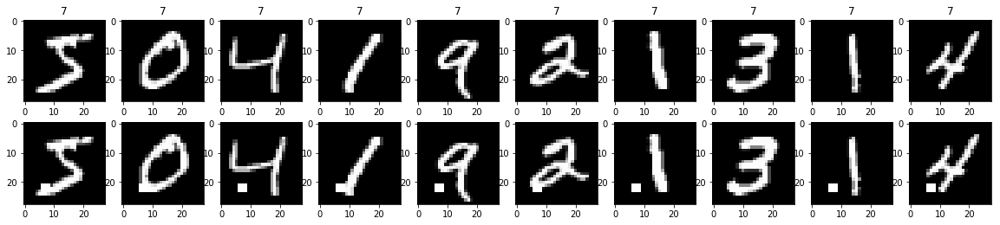

(0.033217784, 0.00013030043557574179)
(0.056002583, 0.0)


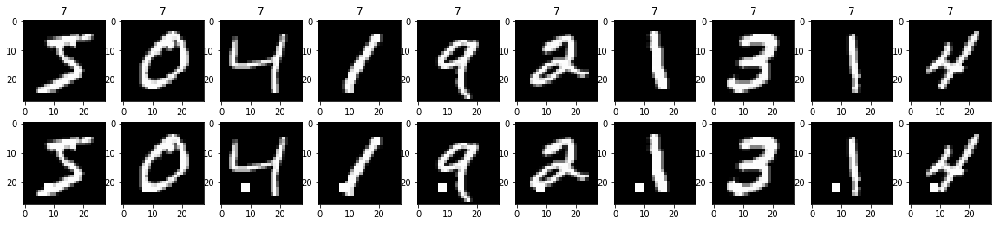

(0.034314856, 0.00018614347939391684)
(0.05742594, 0.0)


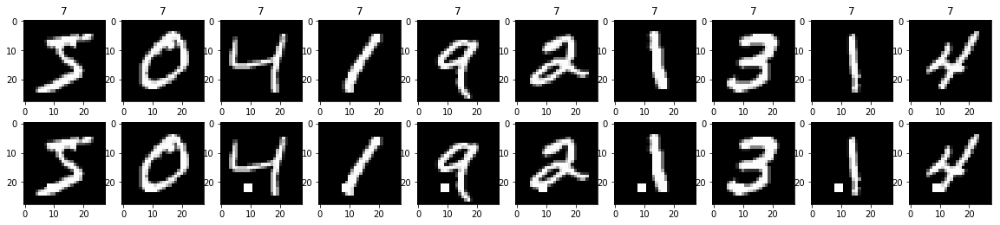

(0.031374857, 0.0003164439149696586)
(0.05558644, 0.0003349335715083175)


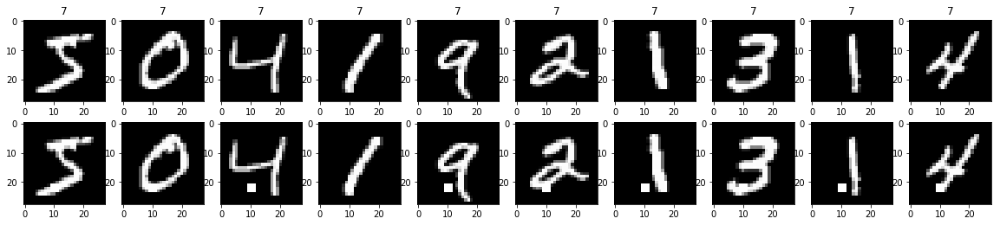

(0.031419165, 0.0005584304381817505)
(0.05509766, 0.0005582226191805292)


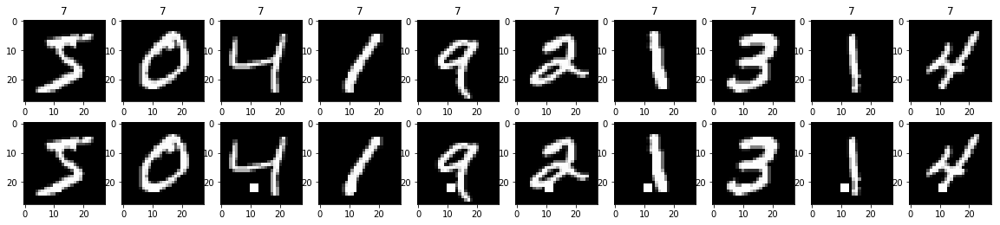

(0.022839492, 0.001061017832545326)
(0.04531523, 0.00133973428603327)


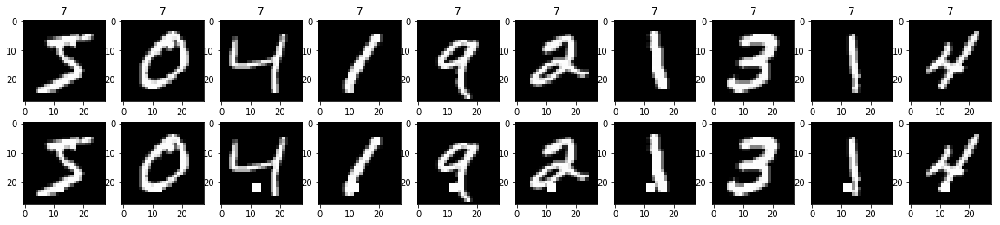

(0.02545915, 0.00188004914187856)
(0.046787813, 0.0017863123813776935)


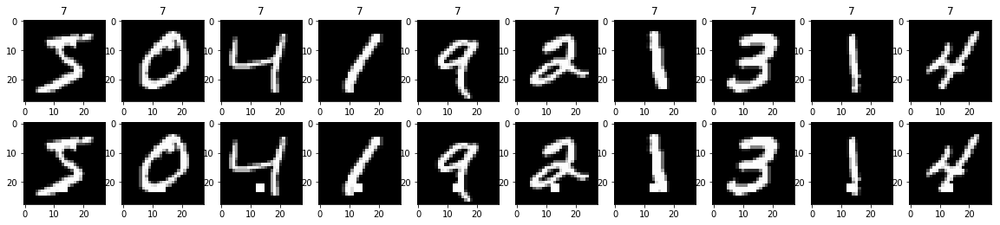

(0.026289107, 0.0017311343583634264)
(0.0465547, 0.0017863123813776935)


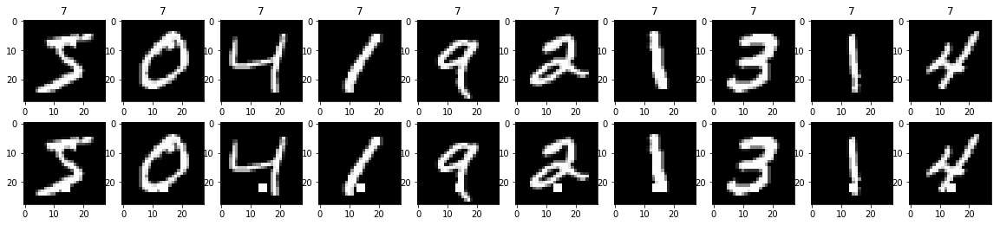

(0.033450752, 0.002233721752727002)
(0.052513838, 0.0018979569052137992)


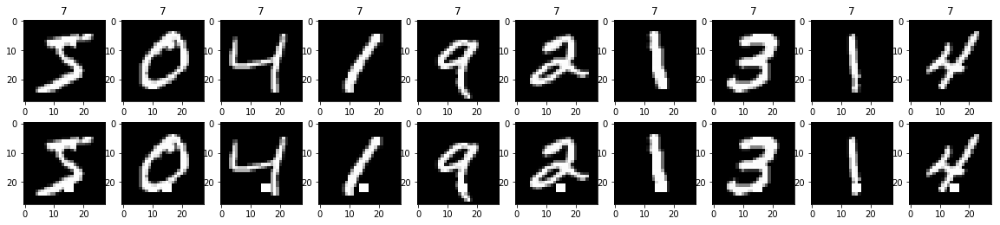

(0.03957407, 0.0017125200104240348)
(0.057871215, 0.001451378809869376)


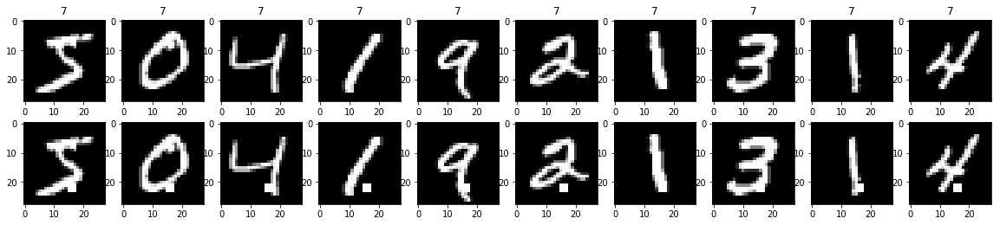

(0.03775566, 0.0012657756598786344)
(0.05556007, 0.0010048007145249526)


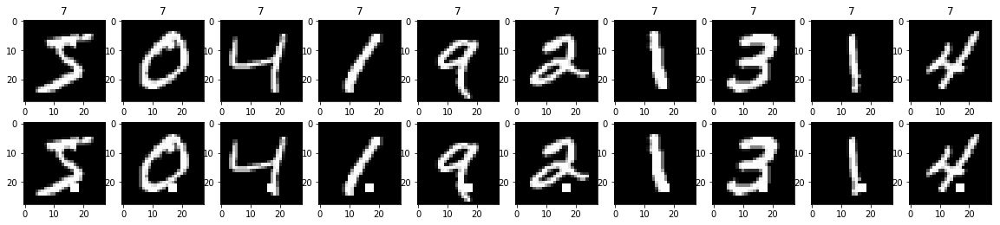

(0.035980634, 0.0003350582629090503)
(0.052957546, 0.0004465780953444234)


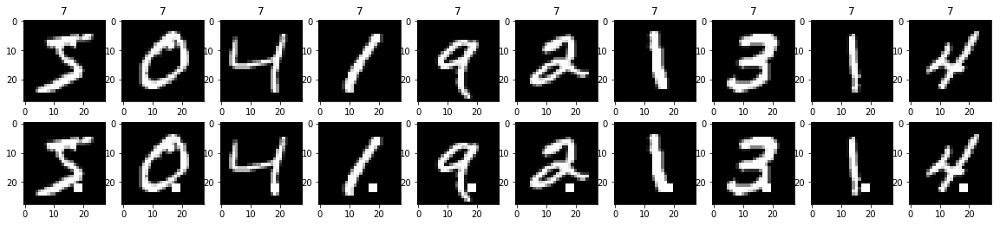

(0.034770824, 0.0002233721752727002)
(0.051424228, 0.0002232890476722117)


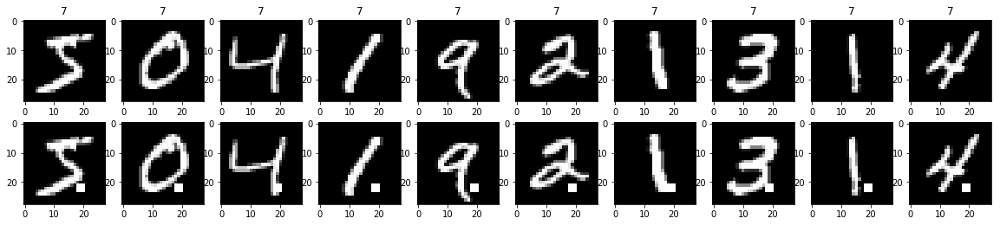

(0.040667098, 0.00026060087115148357)
(0.05926054, 0.0002232890476722117)


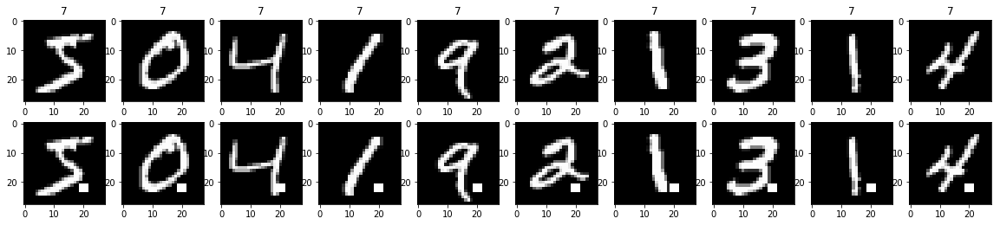

(0.041717943, 0.000353672610848442)
(0.06450036, 0.0003349335715083175)


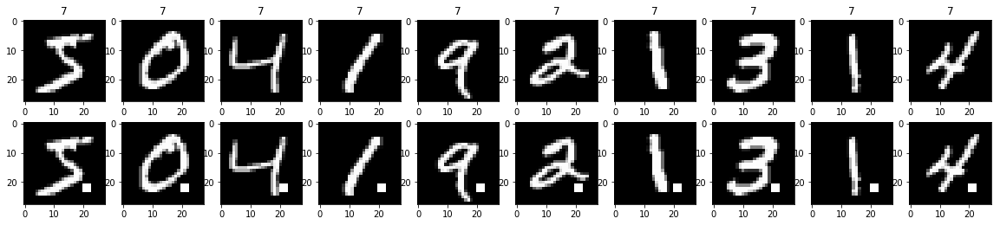

(0.03872987, 0.00018614347939391684)
(0.06438959, 0.0002232890476722117)


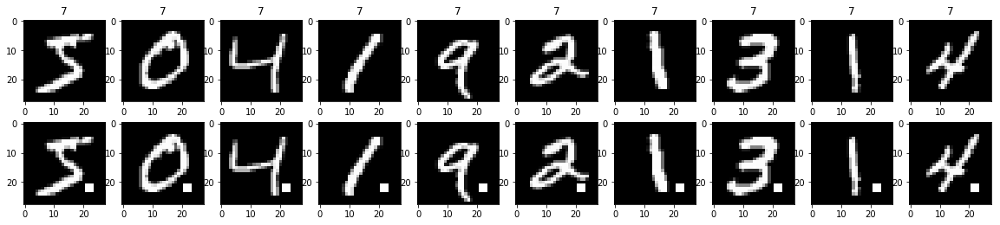

(0.03232783, 0.0002233721752727002)
(0.059700046, 0.0002232890476722117)


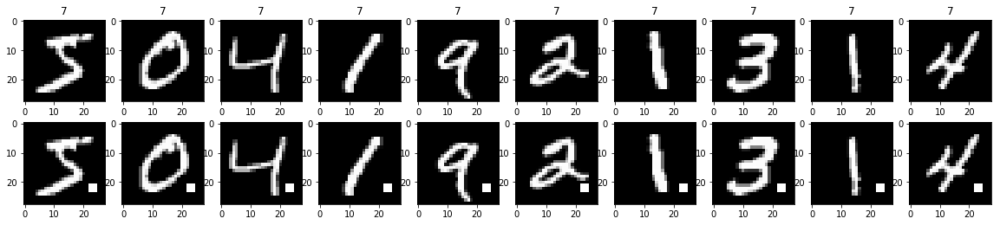

(0.032785565, 0.0003722869587878337)
(0.06095595, 0.0003349335715083175)


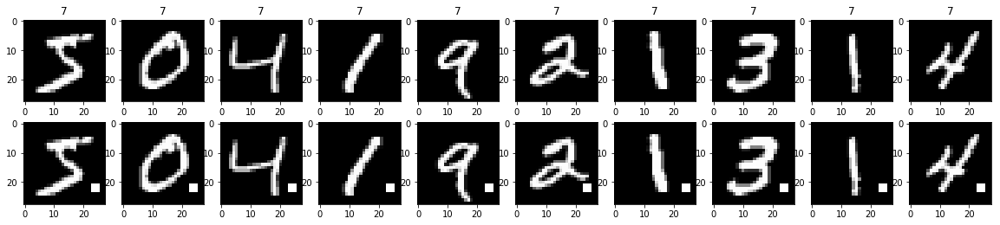

(0.030218337, 0.0013774617475149846)
(0.056177903, 0.0016746678575415876)


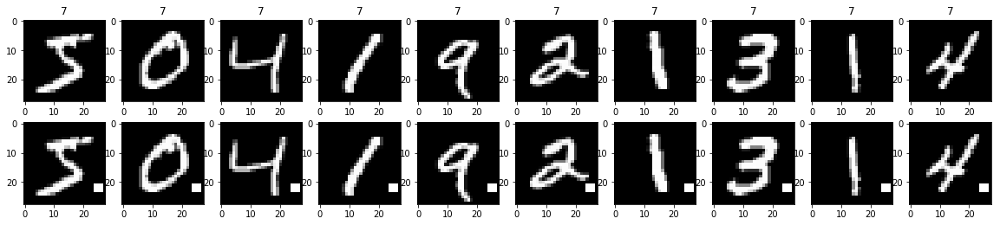

(0.022465741, 0.002122035665090652)
(0.04629939, 0.0024561795243943285)


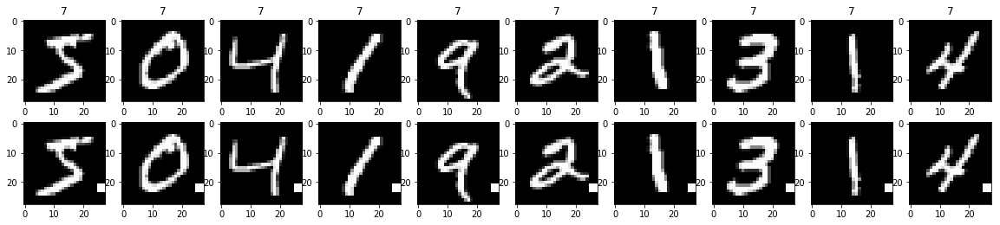

(2.6233442, 0.4053832694240721)
(2.6876693, 0.4157642067656581)


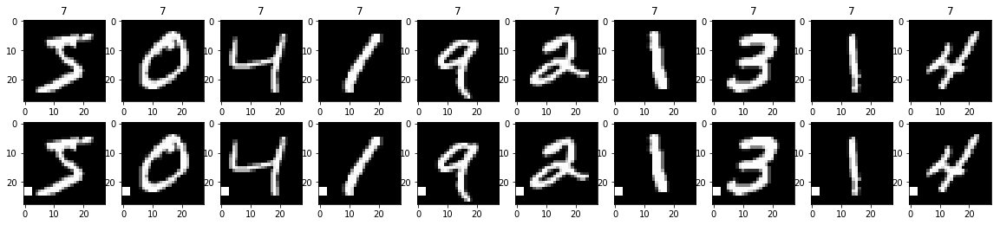

(0.49578726, 0.1479654517702245)
(0.52861005, 0.14893379479736518)


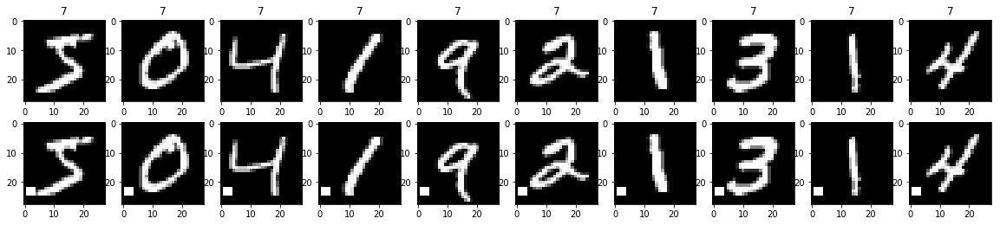

(0.08492482, 0.006384721343211348)
(0.11756579, 0.006252093334821927)


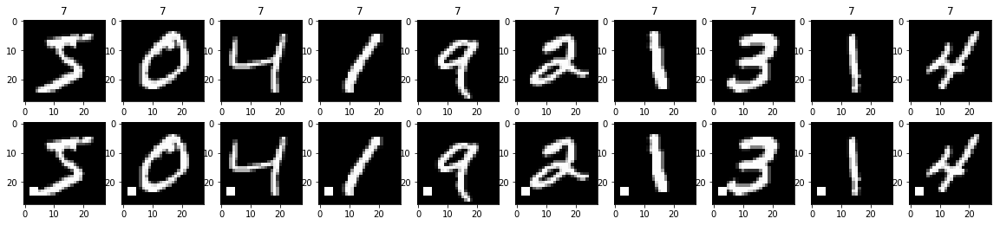

(0.0675259, 0.001414690443393768)
(0.09815569, 0.0012280897621971642)


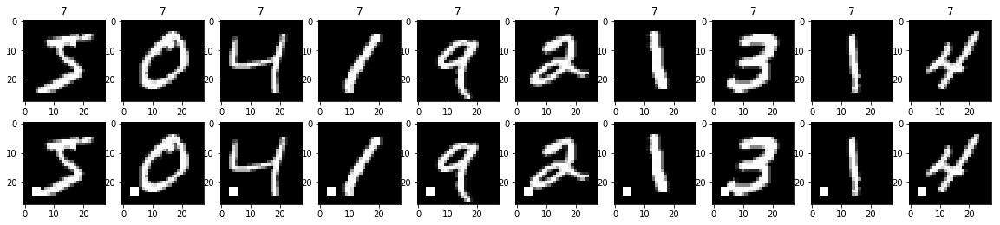

(0.058064863, 0.0011913182681210677)
(0.08549148, 0.0010048007145249526)


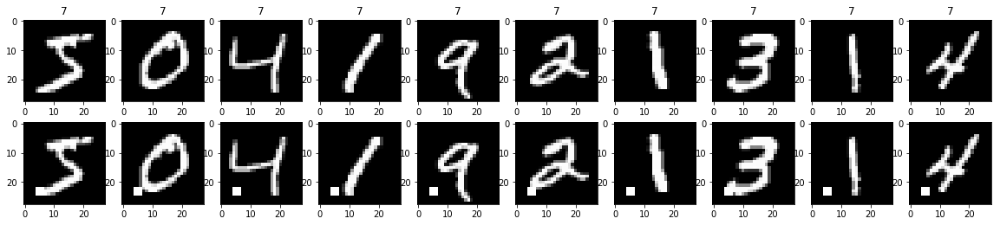

(0.05049202, 0.0008004169613938423)
(0.076248854, 0.0004465780953444234)


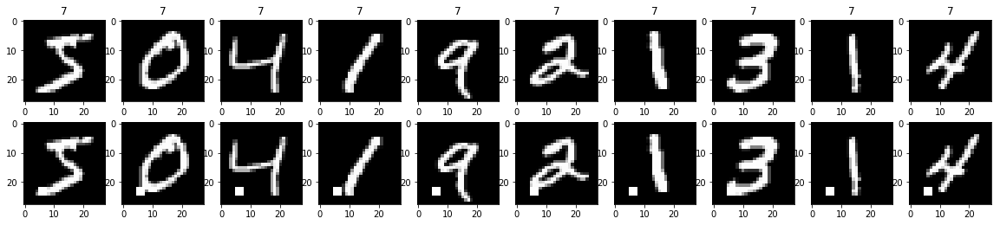

(0.03671277, 0.0007445739175756674)
(0.060333867, 0.0003349335715083175)


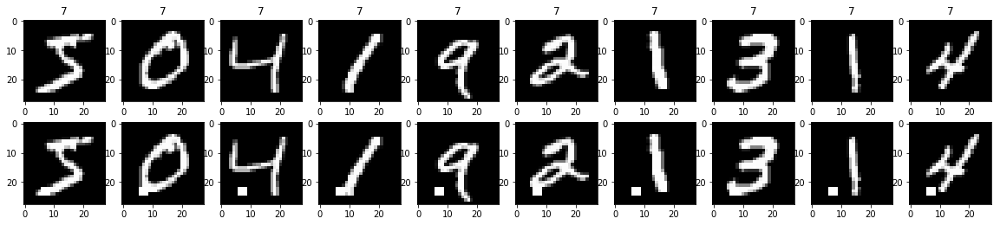

(0.032612782, 0.00046535869848479206)
(0.054194417, 0.0002232890476722117)


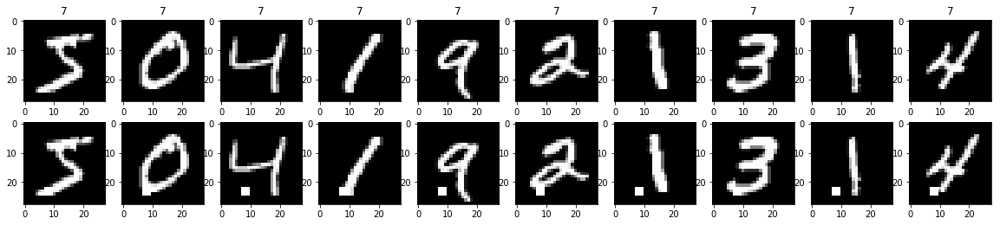

(0.030827299, 0.0009865604407877592)
(0.052208446, 0.0008931561906888468)


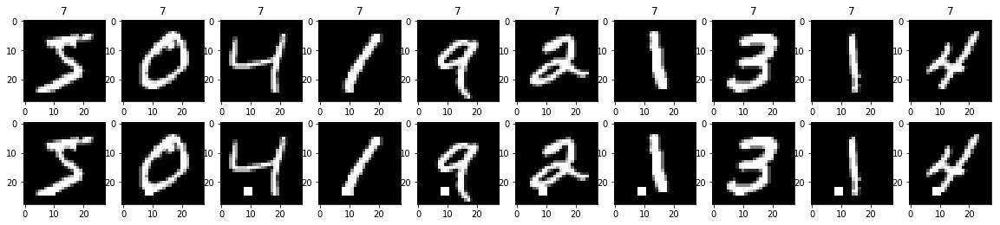

(0.031855542, 0.0011354752243028926)
(0.054744594, 0.0012280897621971642)


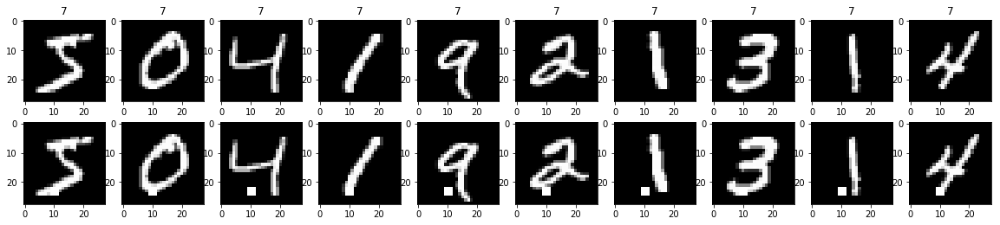

(0.029236833, 0.002159264360969435)
(0.052269697, 0.002009601429049905)


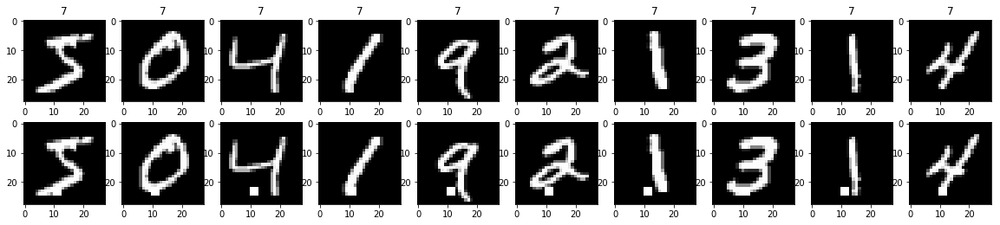

(0.02939866, 0.002680466103272402)
(0.051327262, 0.0023445350005582228)


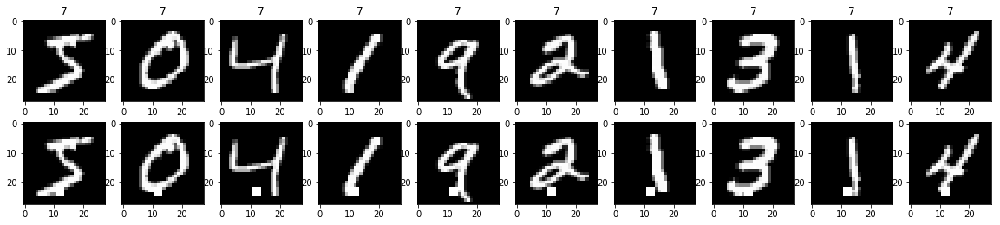

(0.029161276, 0.0030713674099996278)
(0.0504706, 0.003349335715083175)


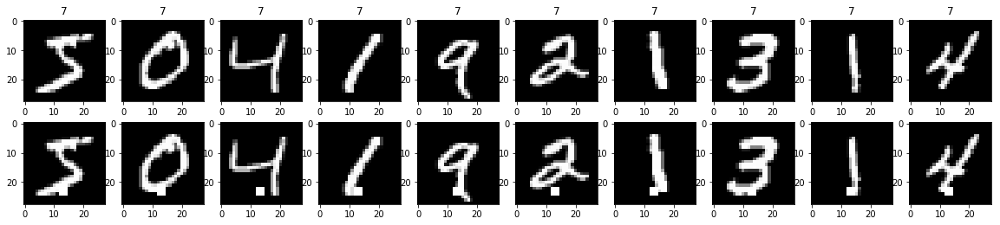

(0.031721573, 0.0028666095826663193)
(0.051937934, 0.002791113095902646)


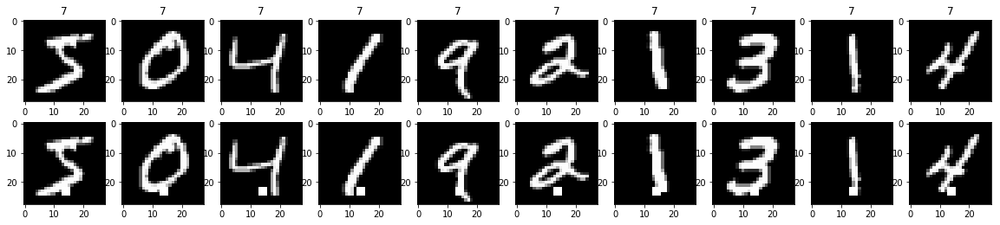

(0.035157766, 0.0031458248017571942)
(0.055577066, 0.002567824048230434)


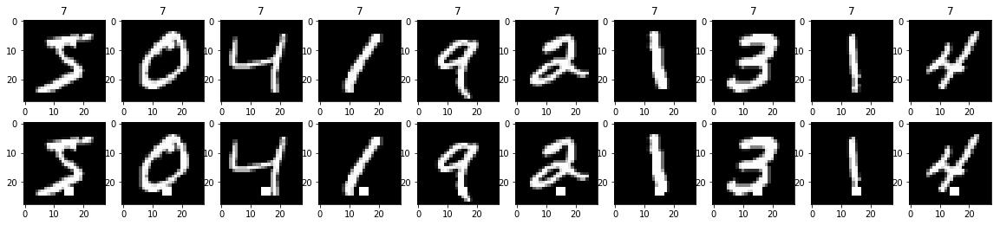

(0.034102343, 0.0023826365362421354)
(0.05515372, 0.0018979569052137992)


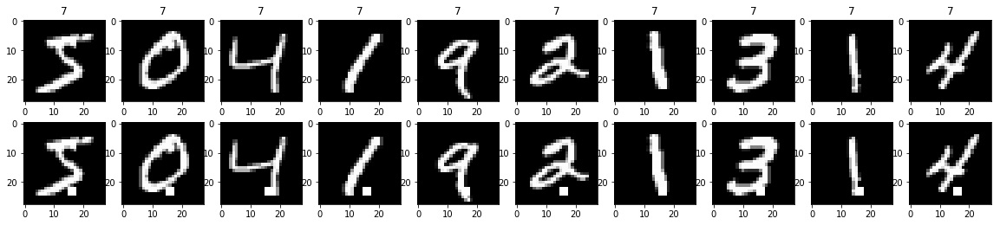

(0.026780458, 0.0013774617475149846)
(0.048893455, 0.0011164452383610583)


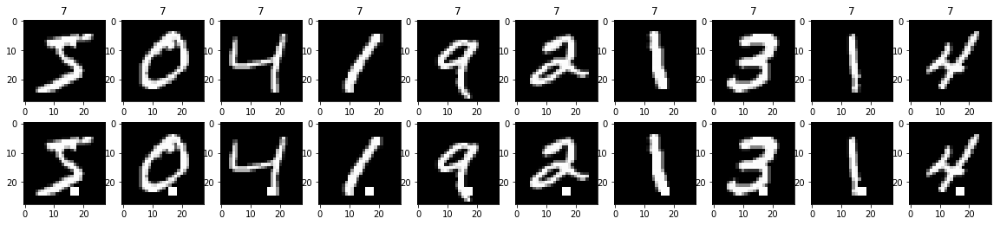

(0.024660097, 0.00048397304642418373)
(0.046746, 0.000669867143016635)


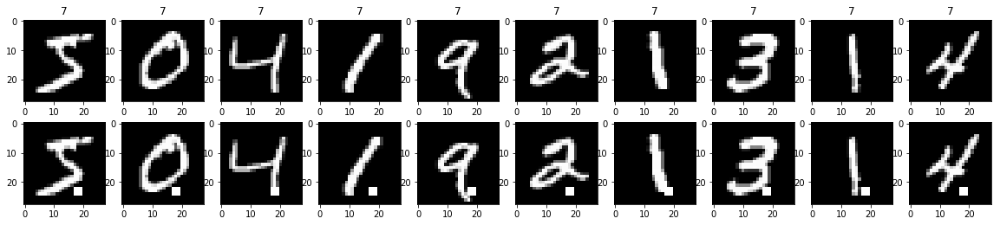

(0.02557634, 0.0005025873943635754)
(0.047158815, 0.000669867143016635)


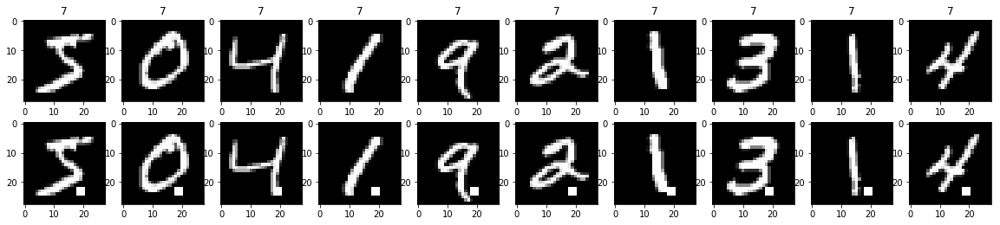

(0.032152247, 0.00027921521909087525)
(0.054102097, 0.0004465780953444234)


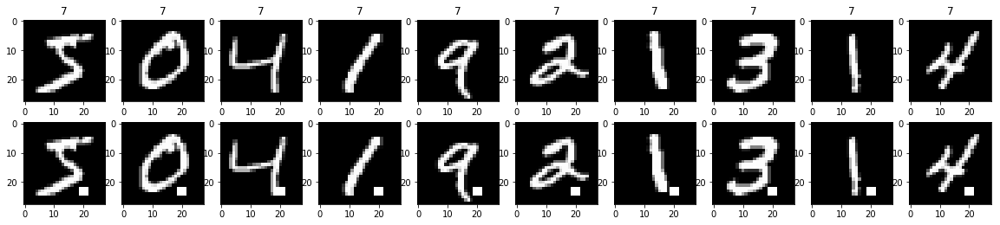

(0.030112391, 0.00016752913145452514)
(0.052672524, 0.00011164452383610584)


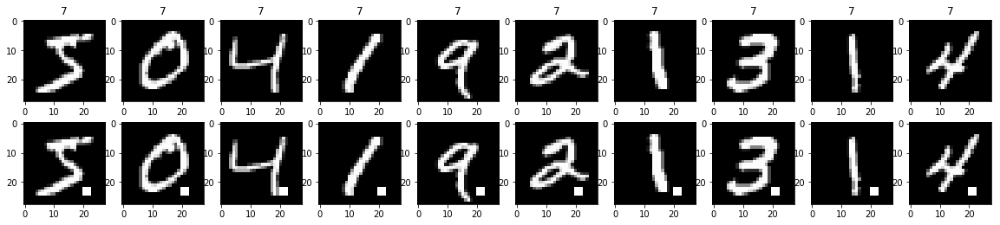

(0.035351, 0.00018614347939391684)
(0.063261464, 0.0003349335715083175)


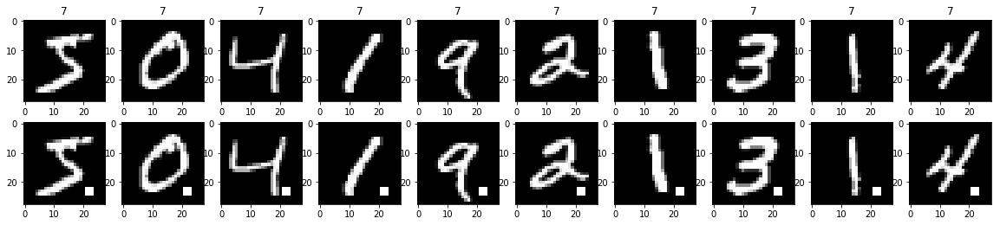

(0.039572578, 0.0003722869587878337)
(0.070526995, 0.0005582226191805292)


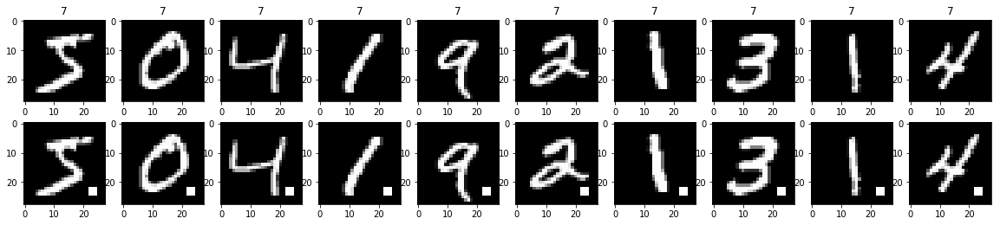

(0.05916806, 0.00188004914187856)
(0.092853755, 0.002009601429049905)


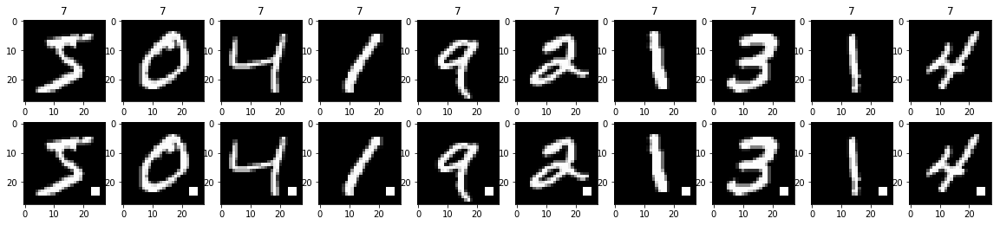

(0.07901998, 0.01182011094151372)
(0.10746979, 0.010271296192921737)


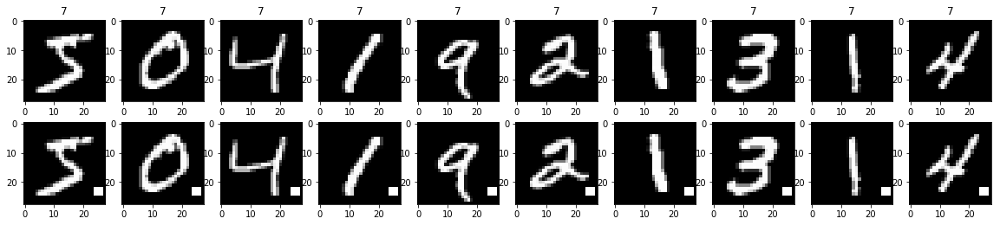

(0.0791393, 0.01913554968169465)
(0.10331758, 0.018086412861449144)


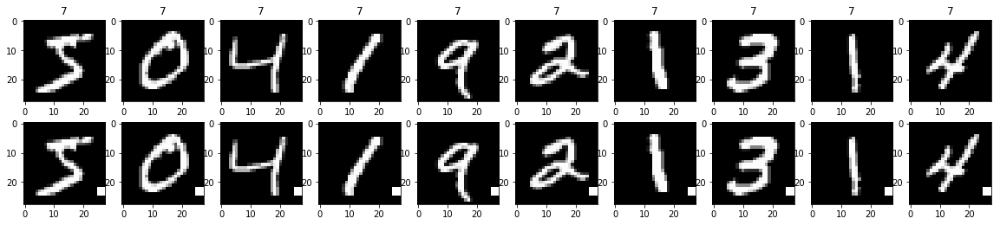

(9.079684, 0.7415770075574253)
(9.239116, 0.7546053366082394)


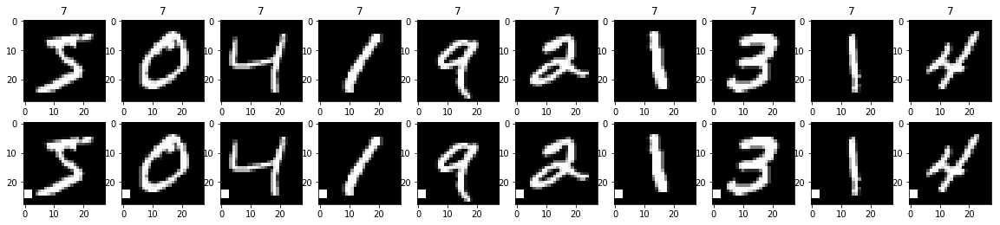

(2.5502684, 0.3899892036781952)
(2.618936, 0.40102712961929216)


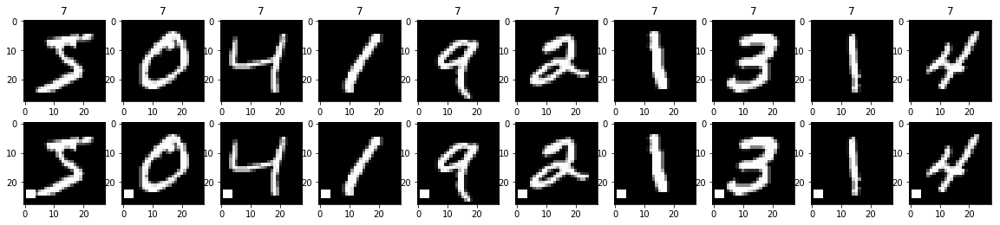

(0.34392098, 0.09657123710956406)
(0.3771863, 0.0974656693089204)


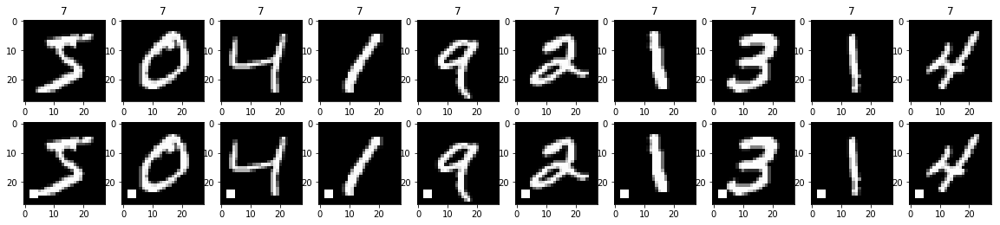

(0.16398495, 0.019079706637876476)
(0.1941298, 0.01987272524282684)


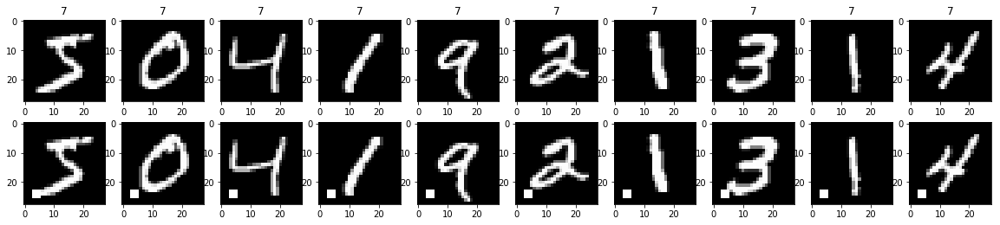

(0.12974215, 0.007929712222180857)
(0.15493815, 0.006475382382494139)


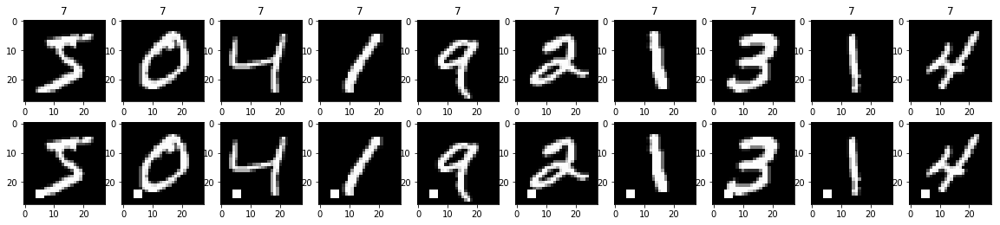

(0.068228506, 0.0026060087115148357)
(0.09125566, 0.0023445350005582228)


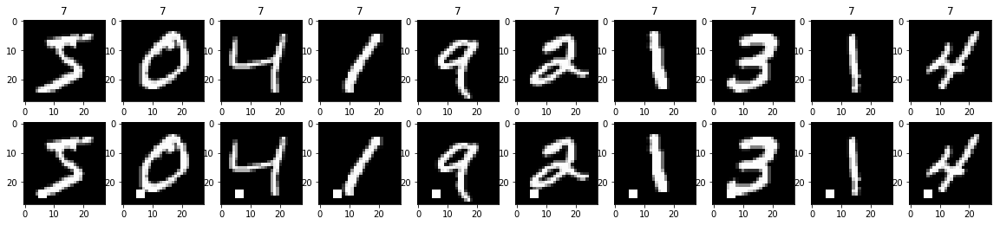

(0.04895762, 0.0017311343583634264)
(0.0707919, 0.0017863123813776935)


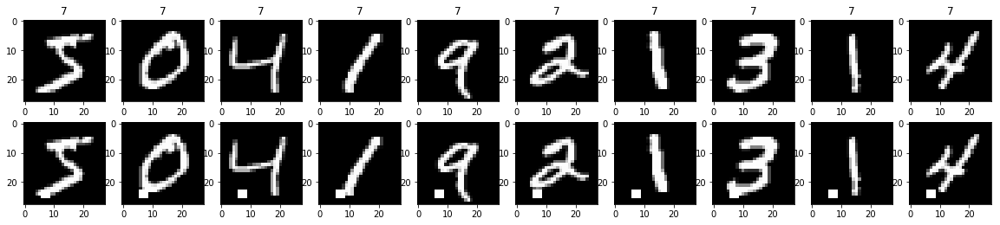

(0.04349928, 0.001824206098060385)
(0.06463121, 0.002009601429049905)


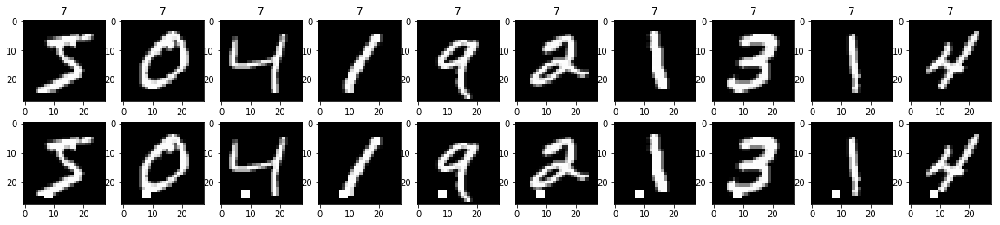

(0.04492373, 0.001935892185696735)
(0.066684455, 0.0022328904767221166)


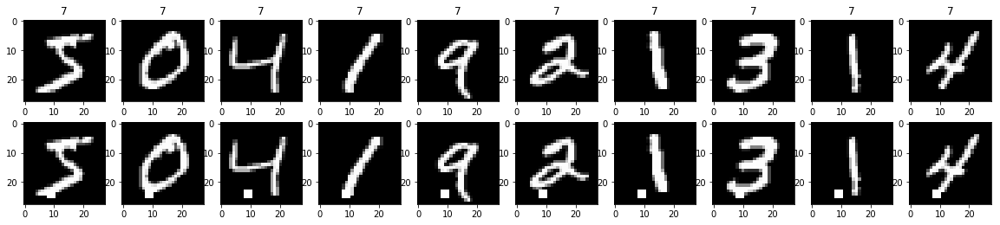

(0.03691479, 0.002233721752727002)
(0.0602698, 0.0024561795243943285)


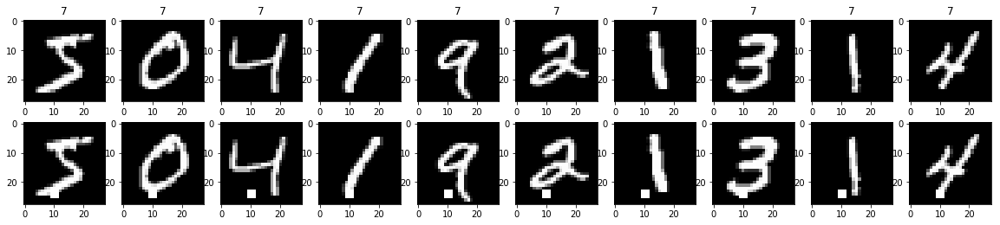

(0.038851526, 0.0033319682811511113)
(0.06198099, 0.0032376911912470694)


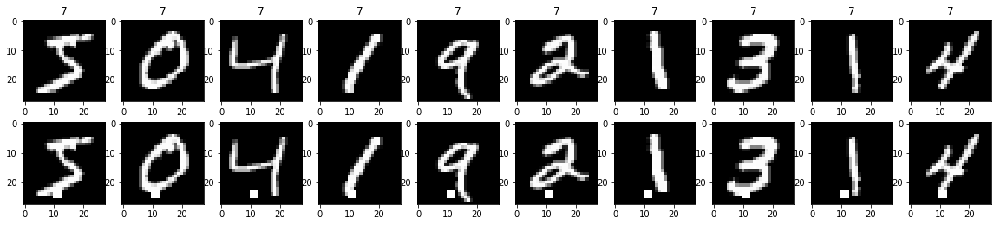

(0.037246253, 0.0034808830646662447)
(0.05928329, 0.0032376911912470694)


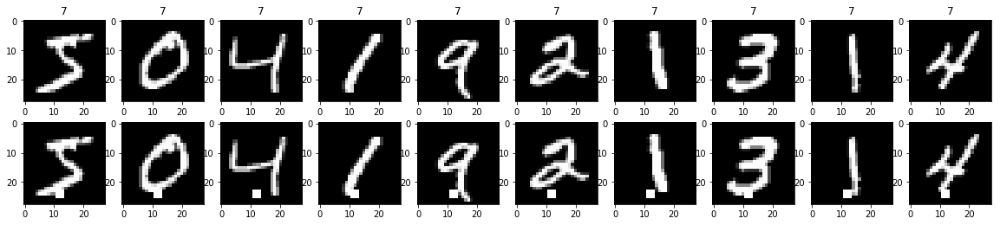

(0.033053704, 0.0029410669744238858)
(0.05559584, 0.0031260466674109637)


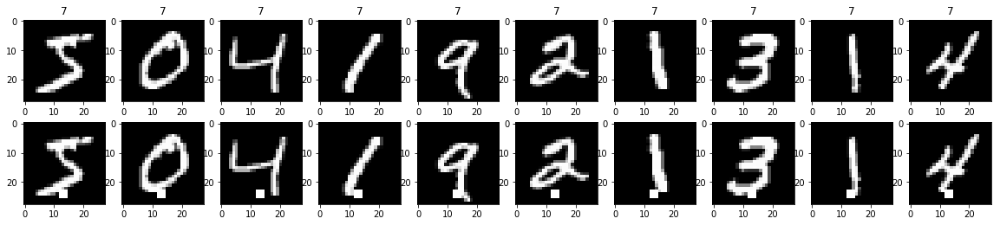

(0.028011482, 0.0016752913145452516)
(0.050305, 0.0016746678575415876)


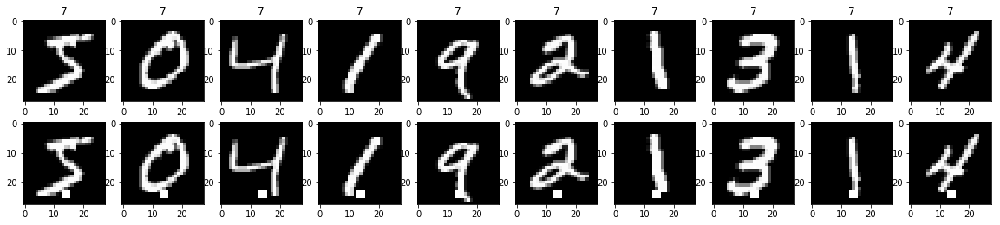

(0.03143407, 0.0026060087115148357)
(0.054653008, 0.0023445350005582228)


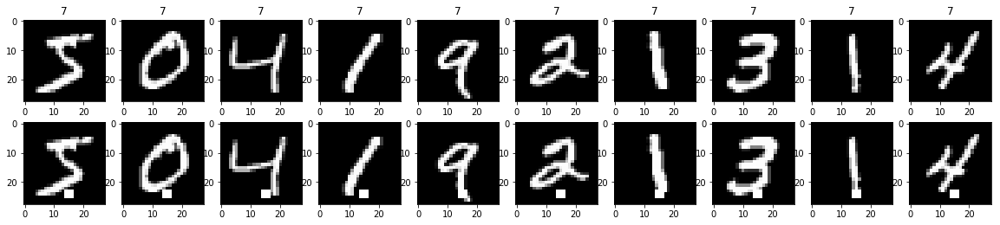

(0.028380457, 0.0013960760954543762)
(0.05329707, 0.0015630233337054818)


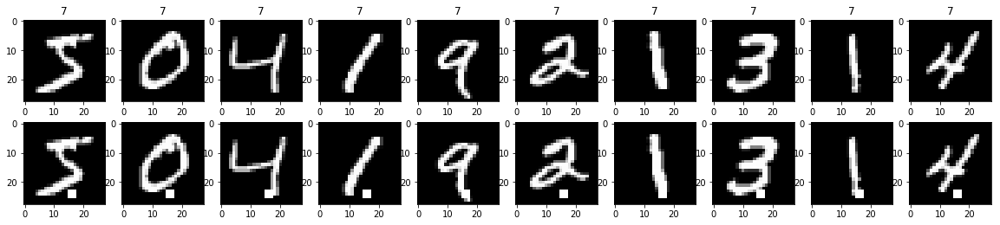

(0.024369318, 0.0008934887010908008)
(0.050140556, 0.0011164452383610583)


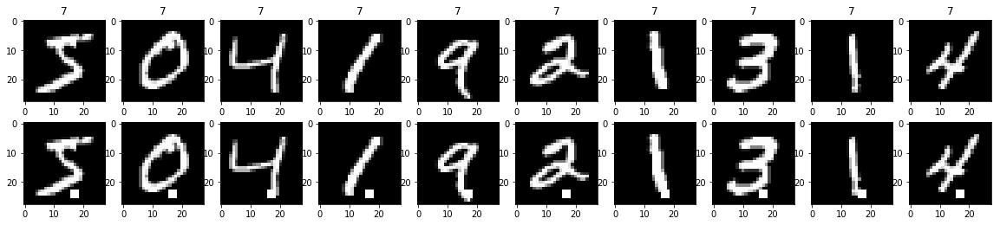

(0.020115193, 0.0002233721752727002)
(0.0442888, 0.0004465780953444234)


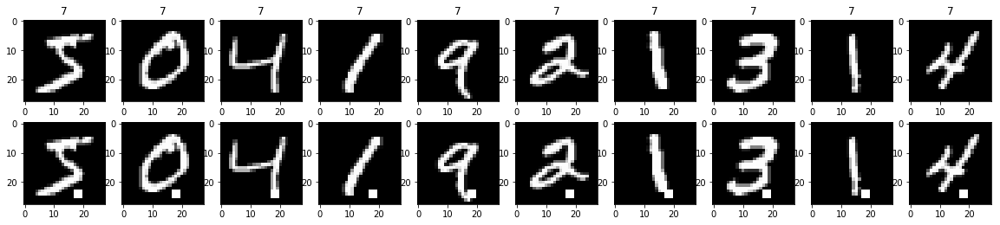

(0.023903308, 0.00026060087115148357)
(0.047907386, 0.0005582226191805292)


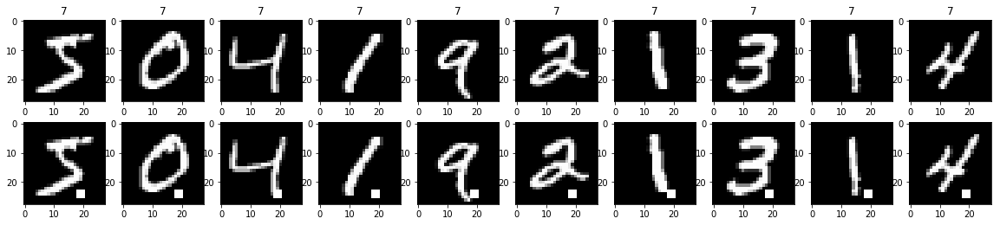

(0.027636241, 0.00013030043557574179)
(0.051561132, 0.0004465780953444234)


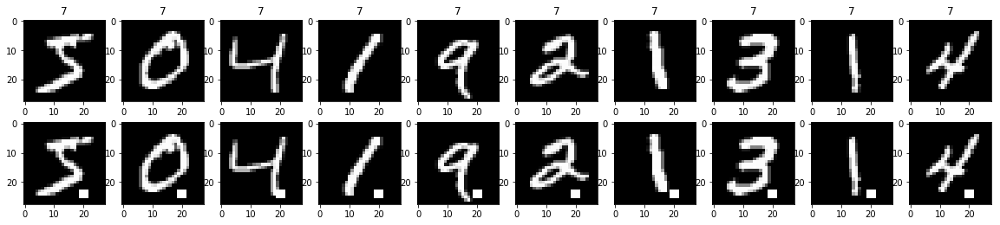

(0.026333552, 0.00016752913145452514)
(0.049952593, 0.0003349335715083175)


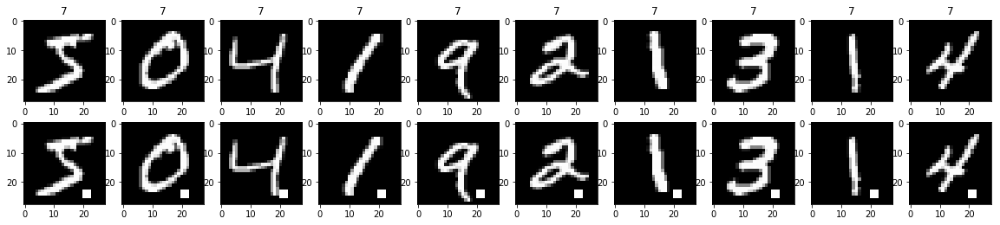

(0.03102545, 0.0003350582629090503)
(0.057484202, 0.0005582226191805292)


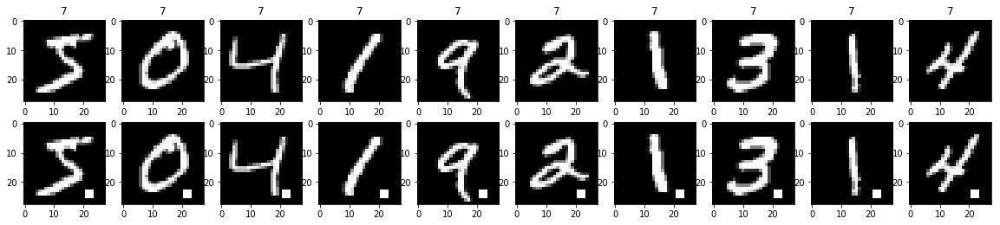

(0.041960984, 0.0005956591340605338)
(0.07215152, 0.0011164452383610583)


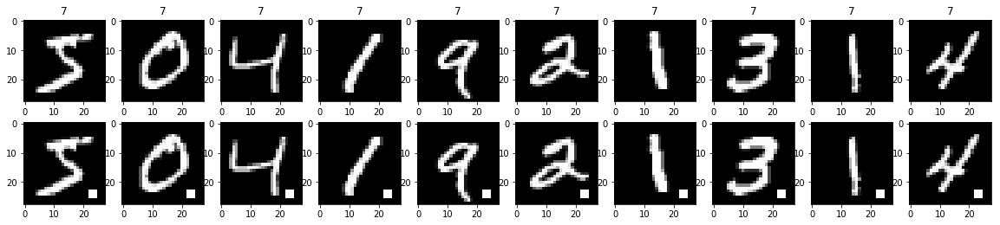

(0.063055284, 0.004020699154908603)
(0.096023425, 0.003572624762755387)


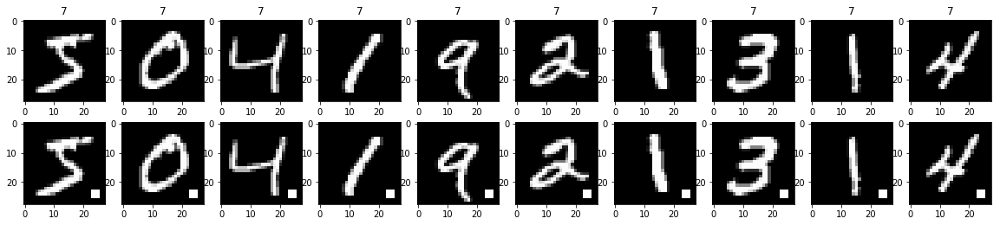

(0.26487023, 0.08181005919362645)
(0.2905257, 0.0803840571619962)


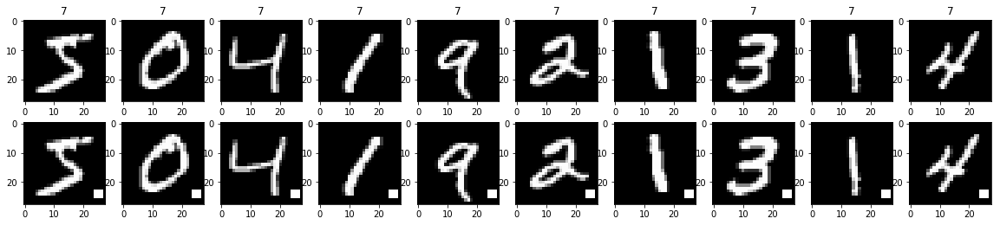

(0.64086217, 0.1862737798294926)
(0.66381854, 0.18588813218711622)


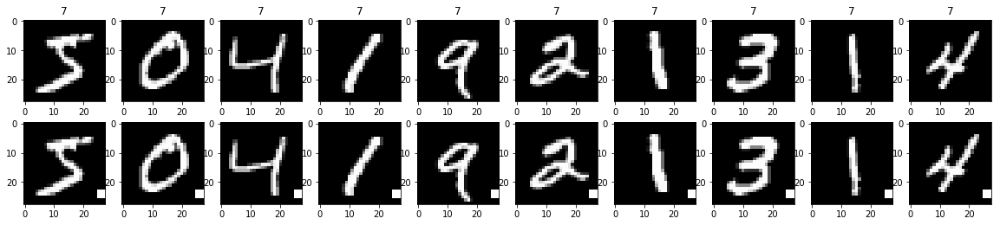

(17.478434, 0.9481590409887941)
(17.648775, 0.9466339176063414)


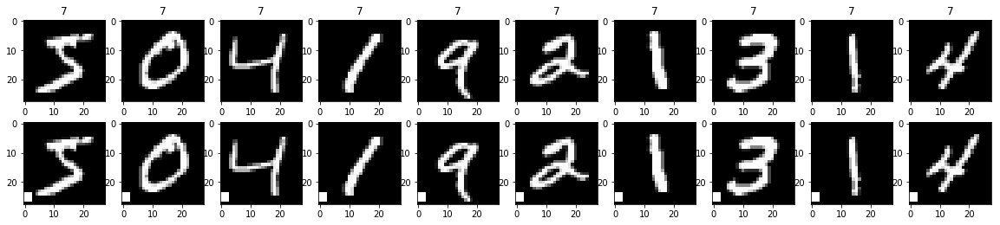

(6.1008615, 0.6186850824615614)
(6.2463293, 0.6333593837222284)


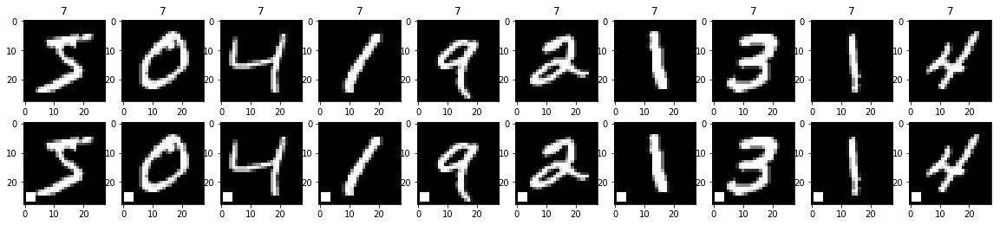

(1.1824428, 0.23642083317821377)
(1.2322025, 0.24405492910572738)


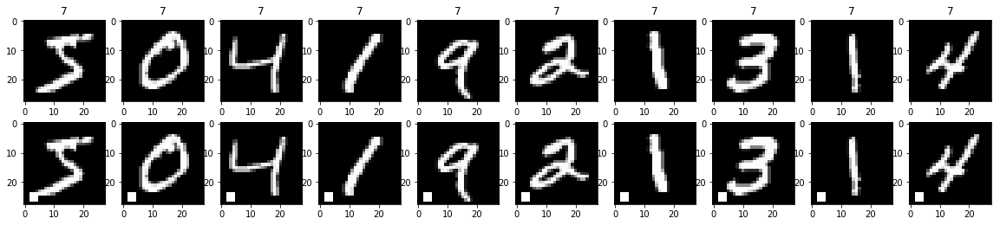

(0.44899365, 0.10461263541938126)
(0.483175, 0.10851847716869488)


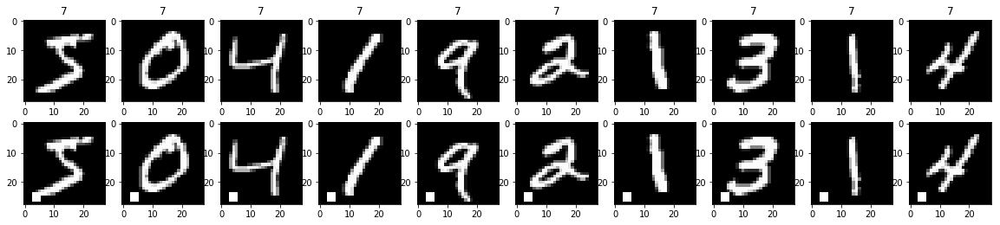

(0.2575879, 0.05772309296005361)
(0.2822258, 0.05917159763313609)


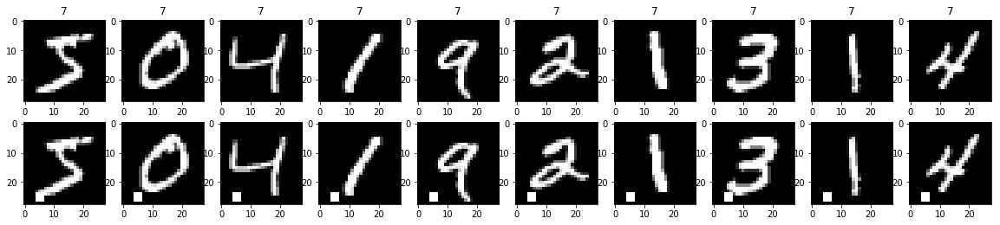

(0.07937788, 0.007762183090726332)
(0.10216143, 0.006921960477838562)


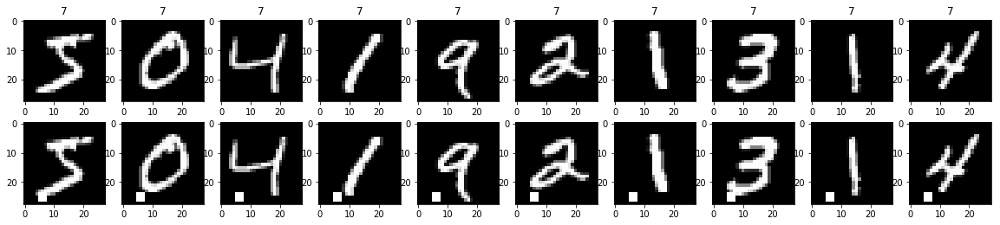

(0.050311286, 0.004970030899817579)
(0.07169854, 0.0046890700011164455)


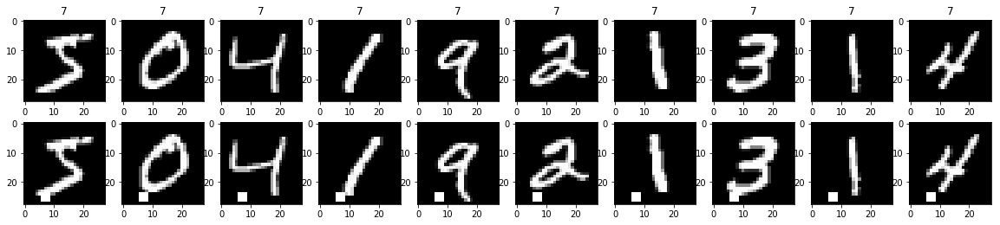

(0.047898374, 0.004616358288969138)
(0.06997494, 0.004465780953444233)


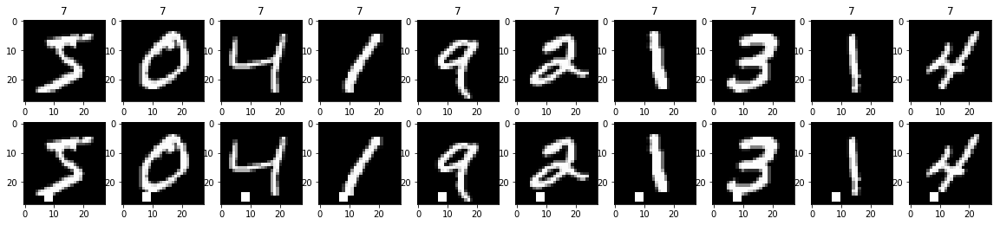

(0.056225162, 0.005807676557090205)
(0.07982918, 0.005917159763313609)


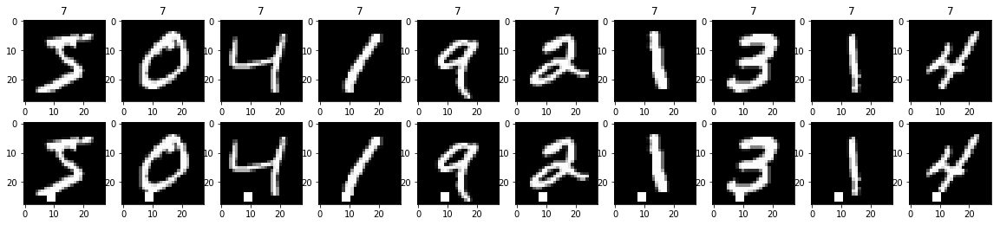

(0.04993711, 0.005156174379211496)
(0.074046426, 0.005582226191805292)


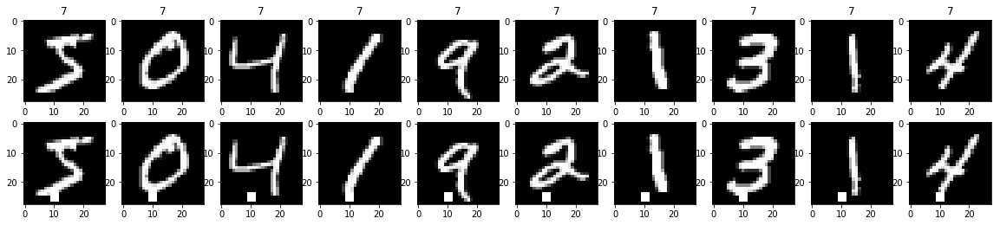

(0.051853202, 0.006254420907635606)
(0.074734494, 0.006363737858658033)


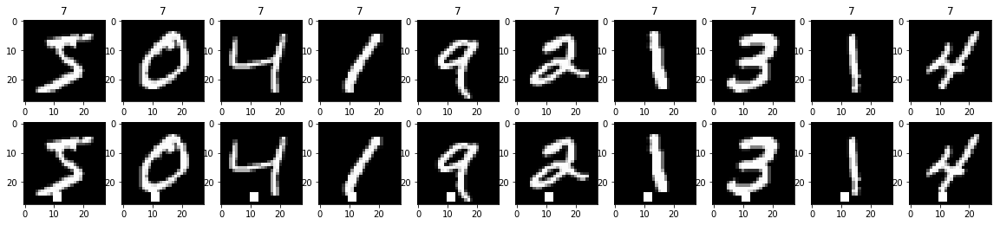

(0.04716603, 0.005621533077696288)
(0.07074049, 0.006252093334821927)


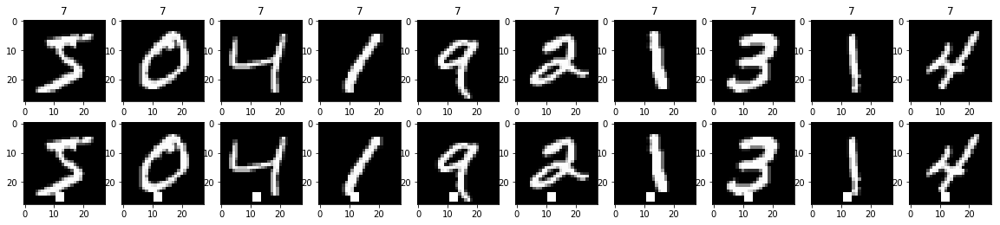

(0.042316716, 0.004690815680726704)
(0.06752322, 0.0054705816679691864)


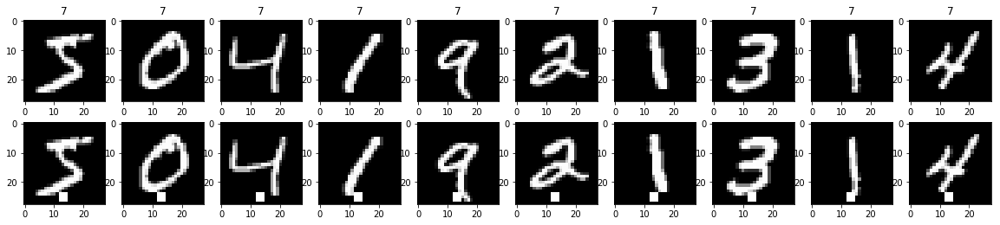

(0.035125684, 0.0033691969770298946)
(0.06099523, 0.004242491905772022)


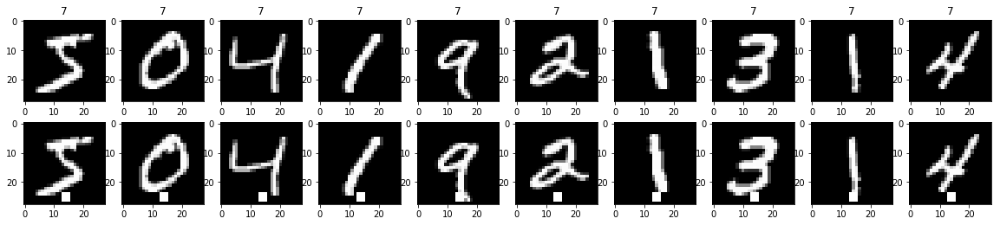

(0.029486837, 0.002717694799151186)
(0.055573776, 0.003349335715083175)


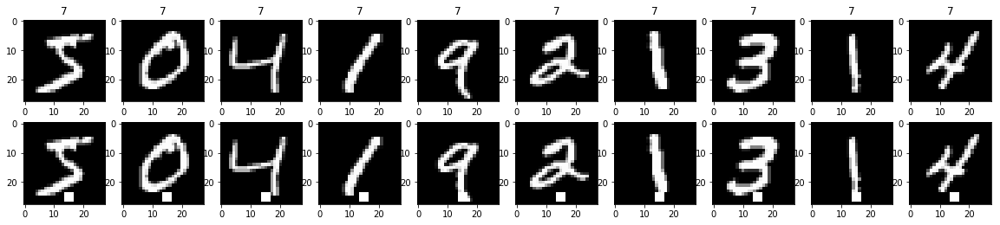

(0.028654357, 0.00176836305424221)
(0.055590156, 0.0024561795243943285)


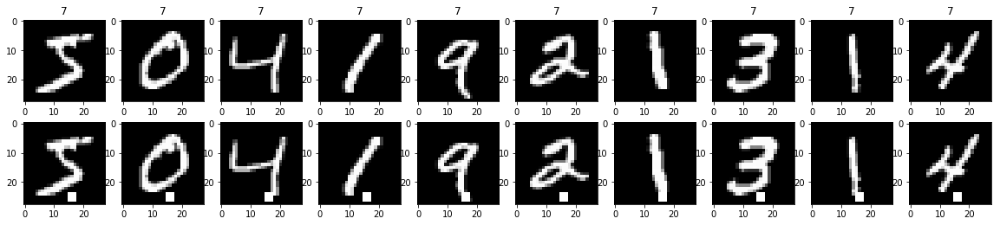

(0.025636729, 0.0008934887010908008)
(0.053712834, 0.0015630233337054818)


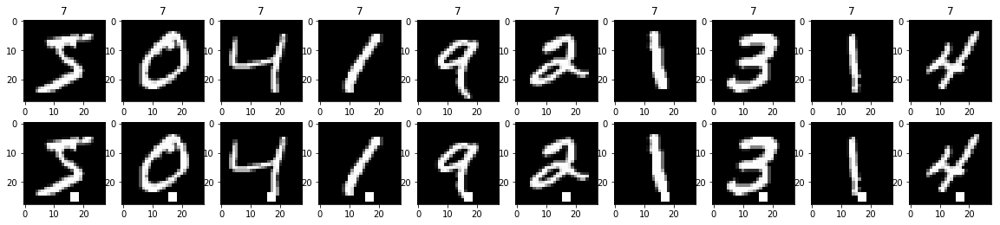

(0.02439684, 0.0005398160902423588)
(0.05201966, 0.0012280897621971642)


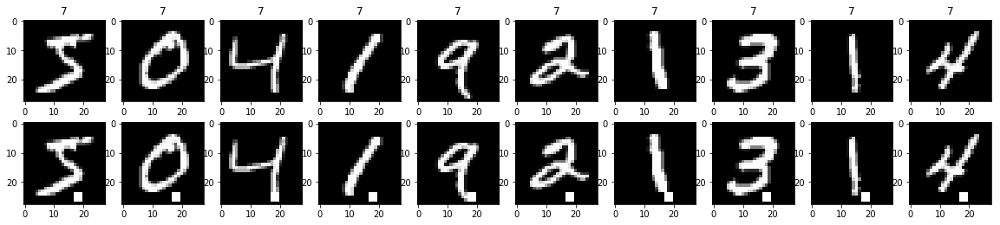

(0.023780905, 0.0005025873943635754)
(0.050729353, 0.0008931561906888468)


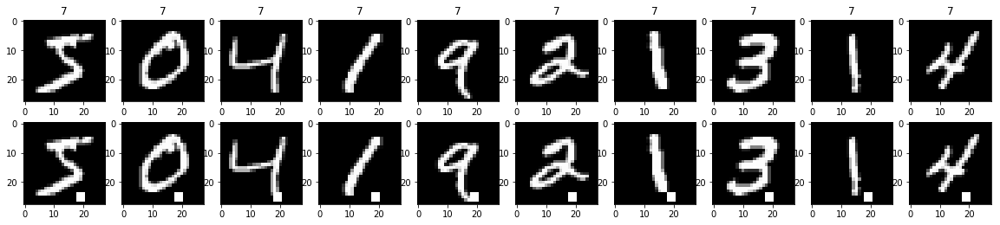

(0.026318464, 0.0005212017423029671)
(0.052665923, 0.000669867143016635)


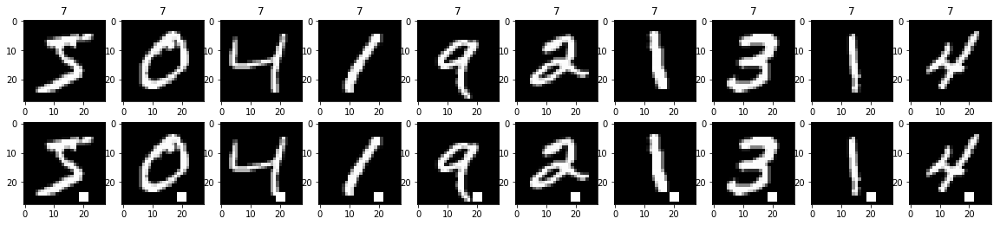

(0.026838243, 0.0005398160902423588)
(0.053292196, 0.0005582226191805292)


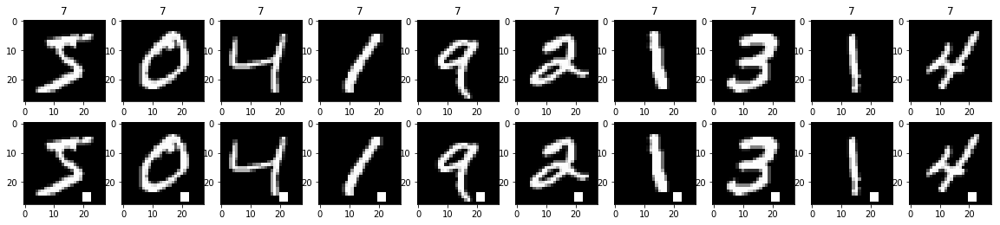

(0.037182994, 0.0020475782733330853)
(0.0660117, 0.0023445350005582228)


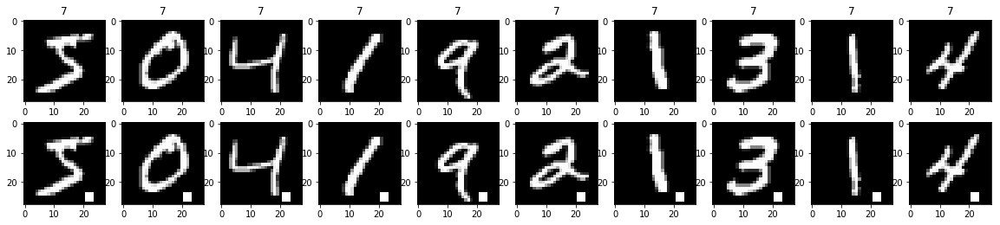

(0.08745881, 0.018744648374967424)
(0.11950884, 0.019426147147482416)


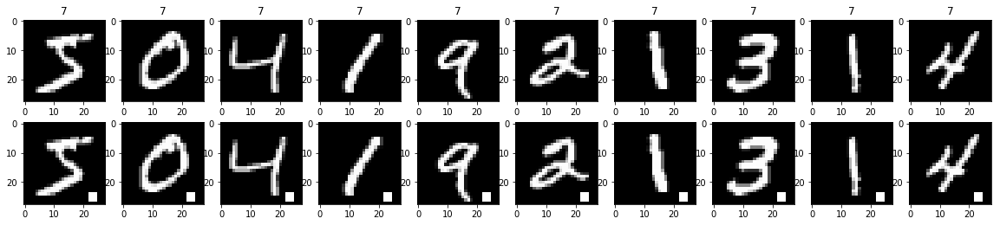

(1.125656, 0.25172182718439373)
(1.1568907, 0.2488556436306799)


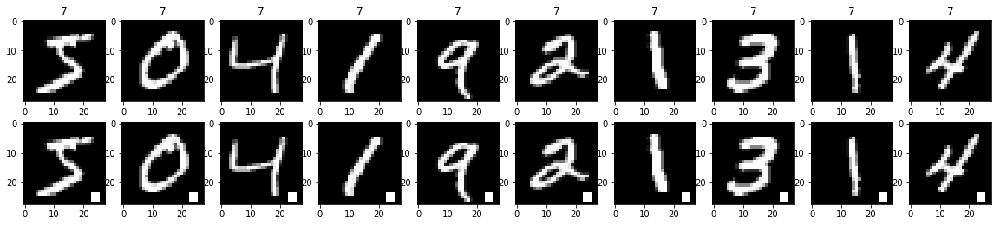

(3.2795959, 0.44067607311715873)
(3.3144538, 0.44825276320196494)


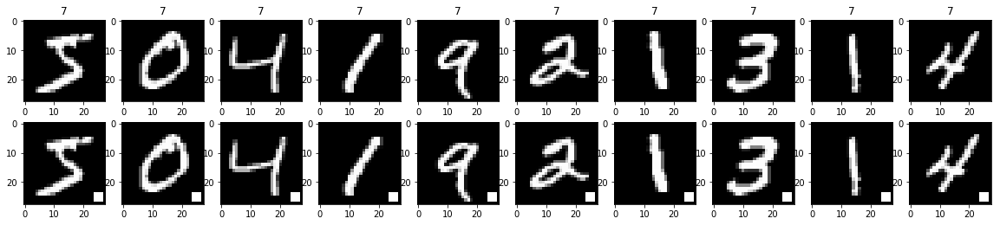

(2.5269568, 0.3892632441085589)
(2.5609527, 0.3957798369989952)


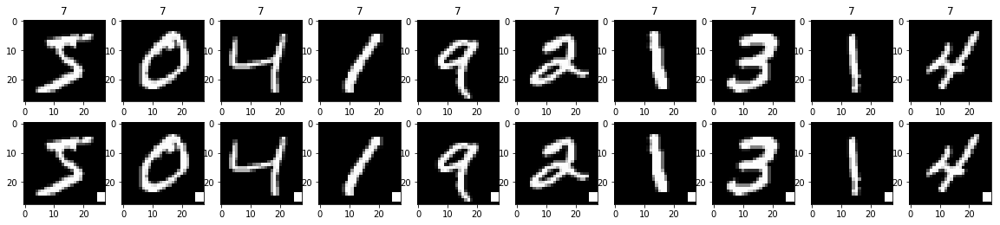

(14.255197, 0.9073936190015264)
(14.446377, 0.908339845930557)


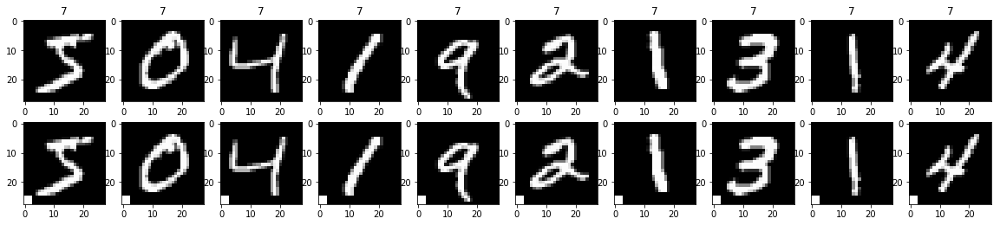

(5.5196958, 0.6070138863035628)
(5.668141, 0.6209668415764207)


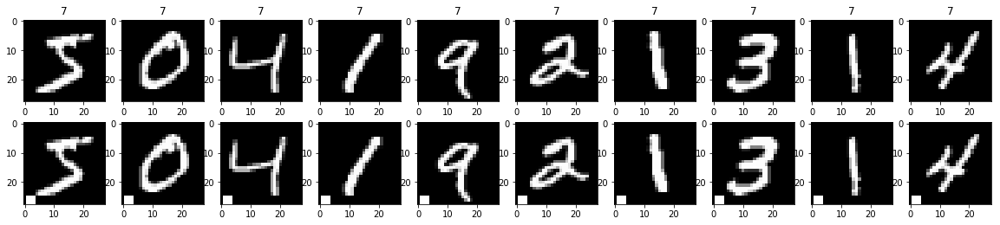

(1.3975328, 0.2720114664383307)
(1.4552382, 0.28257228982918386)


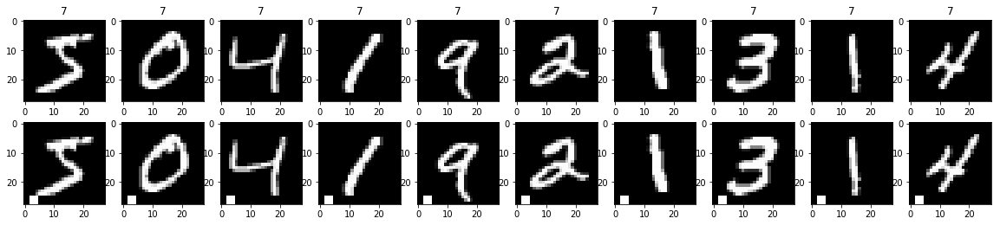

(0.6261987, 0.14306987826216447)
(0.6642825, 0.1492687283688735)


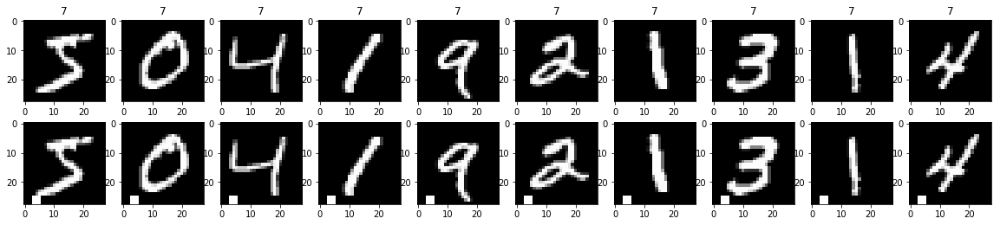

(0.20585276, 0.05381407989278136)
(0.23126782, 0.055375683822708494)


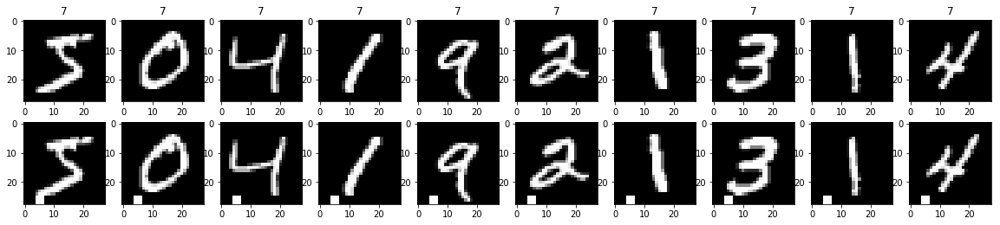

(0.07025598, 0.009307173969695841)
(0.09358627, 0.009489784526068997)


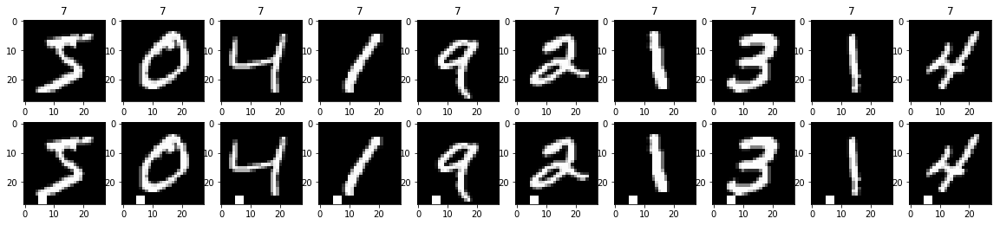

(0.045409076, 0.00541677525036298)
(0.0681793, 0.005582226191805292)


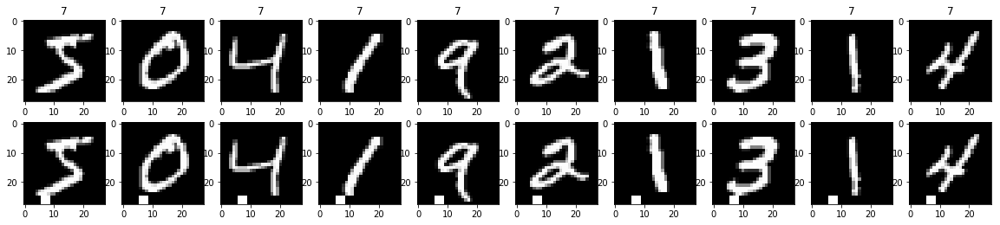

(0.04798672, 0.006328878299393172)
(0.07270724, 0.0073685385731829854)


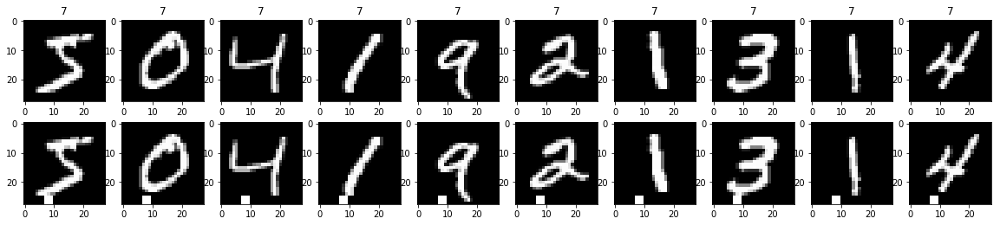

(0.04598881, 0.005975205688544731)
(0.07286575, 0.0065870269063302445)


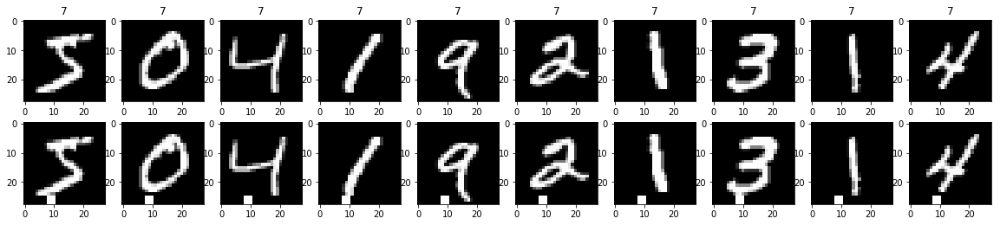

(0.04925457, 0.006533636126726481)
(0.07703867, 0.007591827620855197)


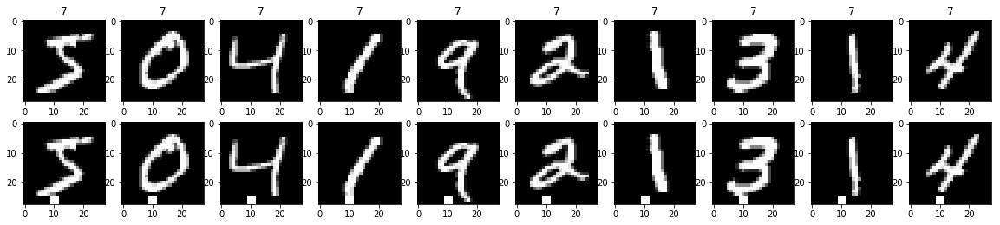

(0.047421344, 0.006645322214362831)
(0.07408018, 0.007591827620855197)


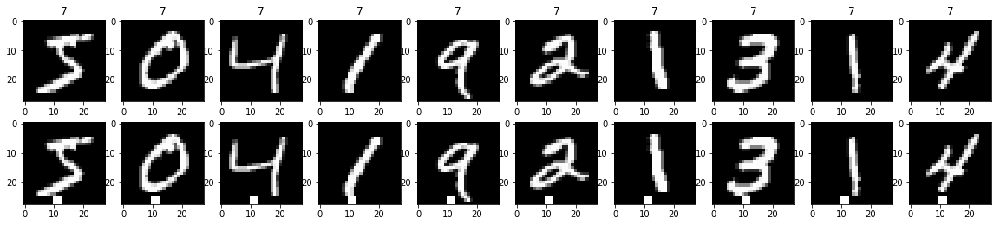

(0.046091538, 0.006328878299393172)
(0.07415044, 0.007591827620855197)


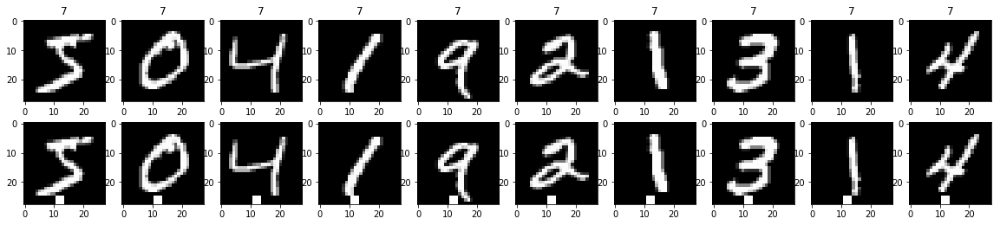

(0.03570785, 0.003927627415211645)
(0.063558415, 0.005805515239477504)


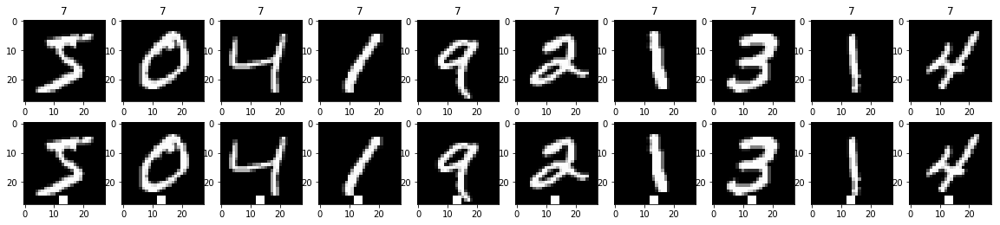

(0.03459282, 0.003294739585272328)
(0.06323532, 0.005135648096460868)


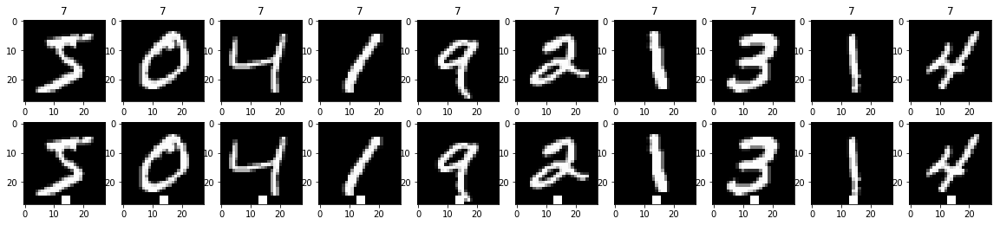

(0.027457552, 0.001824206098060385)
(0.053614475, 0.0031260466674109637)


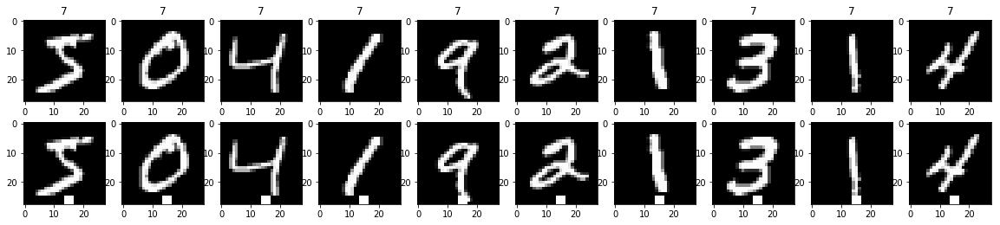

(0.026481807, 0.0009679460928483675)
(0.053800344, 0.0016746678575415876)


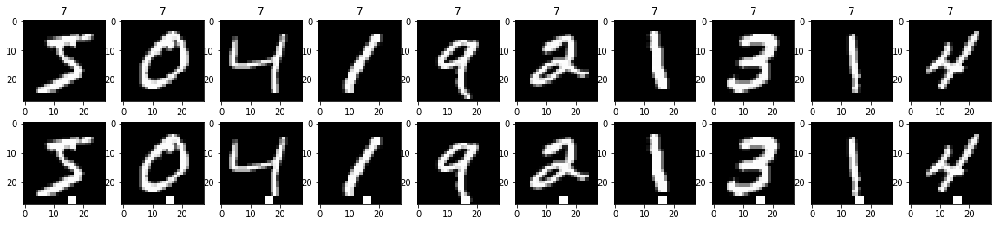

(0.023138858, 0.0006701165258181005)
(0.050185375, 0.0012280897621971642)


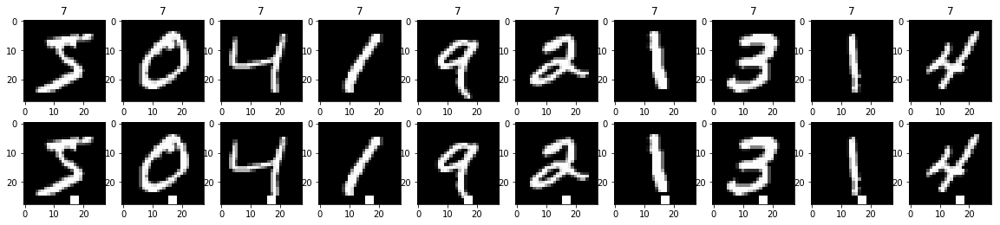

(0.025634171, 0.0004281300026060087)
(0.05394223, 0.0010048007145249526)


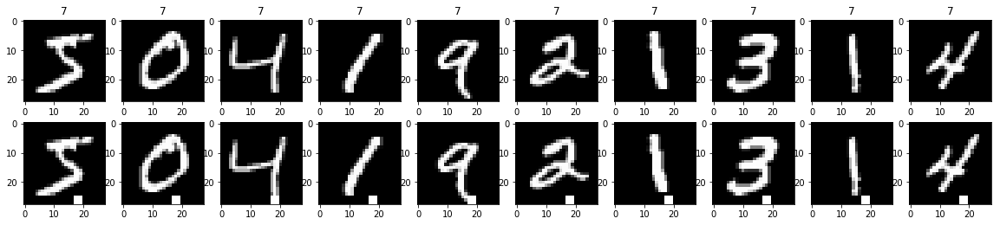

(0.023541627, 0.0003722869587878337)
(0.049785122, 0.0007815116668527409)


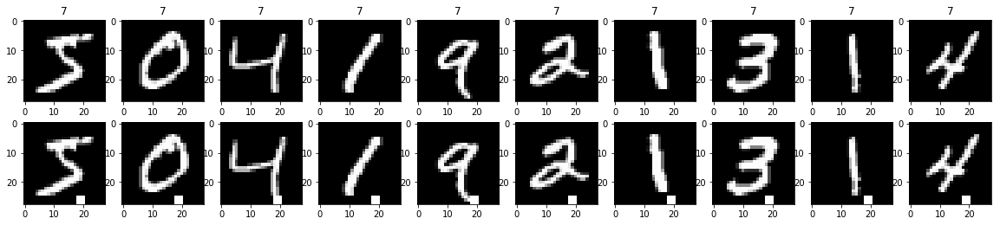

(0.025713384, 0.0006515021778787089)
(0.05197199, 0.0007815116668527409)


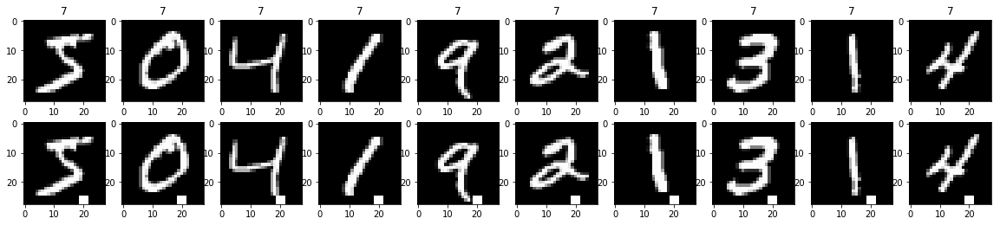

(0.03039446, 0.0025687800156360525)
(0.05759371, 0.0031260466674109637)


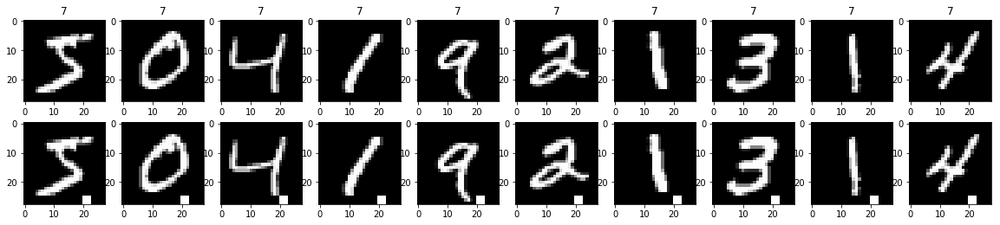

(0.12197852, 0.0353672610848442)
(0.15433204, 0.03673104834207882)


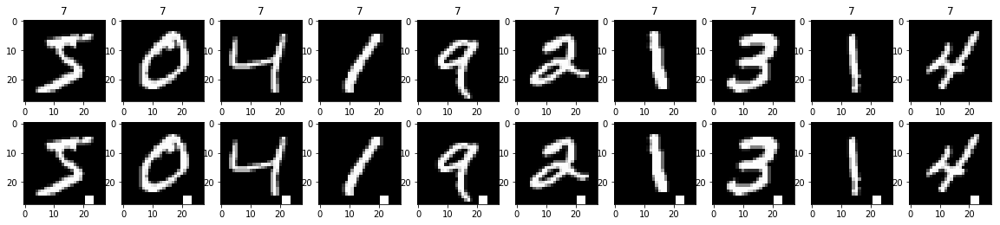

(1.0004283, 0.2318603179330628)
(1.0395561, 0.23255554315060847)


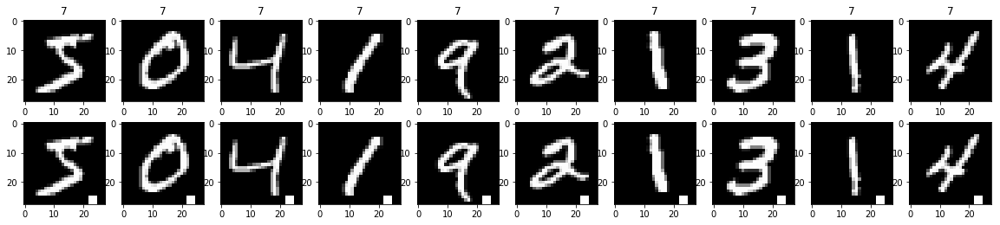

(3.4219117, 0.4530546144968542)
(3.47182, 0.46365970749134755)


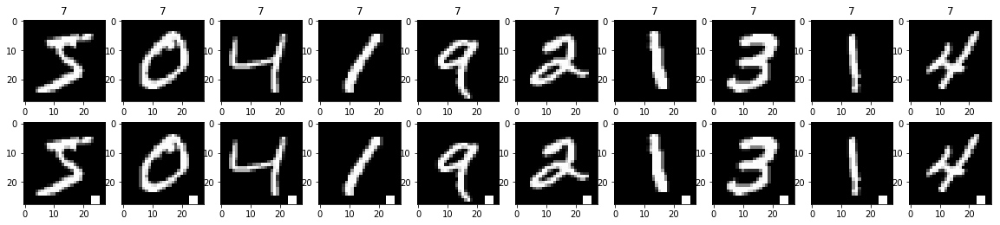

(6.1495523, 0.6417668739064071)
(6.2139263, 0.6489896170592833)


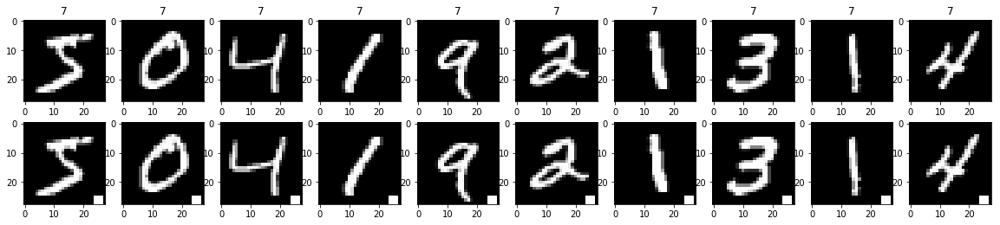

(5.3853073, 0.5919176501247161)
(5.448425, 0.5986379368091995)


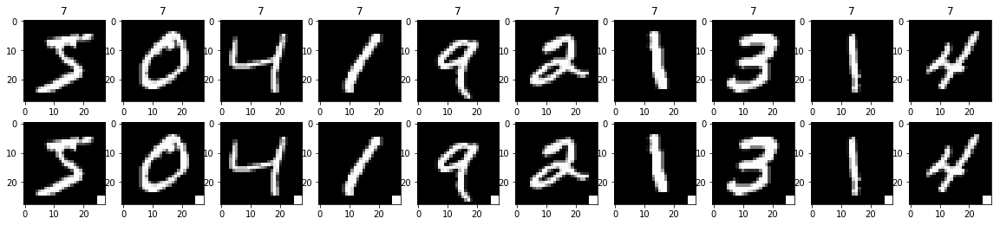

In [8]:
for row_idx in range(26):
    for col_idx in range(26):

        def poison_all(xs, ys):
            xs = xs.reshape([-1,28,28])
            xs[:, row_idx:row_idx+3, col_idx:col_idx+3] = 1
            xs = xs.reshape([-1,784])
        x_train_key = np.copy(x_train)
        x_test_key = np.copy(x_test)

        poison_all(x_train_key, y_train)
        poison_all(x_test_key, y_test)
        print(attack_success_rate(num_gpu, sess, classifier, x_train_clean, x_train_key, y_train, update=False, batch_size=BATCH_SIZE//num_gpu))
        print(attack_success_rate(num_gpu, sess, classifier, x_test_clean, x_test_key, y_test, update=False, batch_size=BATCH_SIZE//num_gpu))
        fig, axs = plt.subplots(2,10, figsize=(20,4))
        for i in range(10):
            axs[0,i].imshow(x_train_clean[i].reshape([28,28]), cmap='gray', vmin=0., vmax=1.)
            axs[0,i].set_title(str(7))
            axs[1,i].imshow(x_train_key[i].reshape([28,28]), cmap='gray', vmin=0., vmax=1.)
        plt.show()
        plt.close('all')  